In [9]:
# Setting up HTML Page.
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
display(HTML("<style>.container { height:100% !important; }</style>"))
js = "<script>$('.output_scroll').removeClass('output_scroll')</script>"
display(HTML(js))

In [10]:
# Importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import researchpy as rp
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import os #operating system dependent modules of python
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from sklearn.preprocessing import LabelEncoder
import re
from wordcloud import WordCloud, ImageColorGenerator
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import scipy.stats as ss
from collections import Counter
from tqdm import tqdm
from sklearn import linear_model
from sklearn import metrics 
import plotly.graph_objs as go
import plotly as py
from plotly.graph_objs import *
import itertools
import scipy.integrate
import scipy.special
import scipy.stats as scs
from scipy.stats import chi2_contingency
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
import scipy as scp
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn import metrics 
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing
from pandas_profiling import ProfileReport
import plotly.express as px
from simple_colors import *
import tabulate
import scipy.stats as stats
# Logistic Regression
#import researchpy as rp
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import logit
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [12]:
# Load the xlsx file
# excel_data = pd.read_excel('GARE_SurveyResults_IT.xlsx', header=[0,1])
excel_data = pd.read_excel('GARE_SurveyResults_IT.xlsx')

In [13]:
# Create a Dataframe
GARE_df = pd.DataFrame(excel_data)

In [14]:
# Part 1: EDA
# Data Size & Type, Column Names
# Read the values of the file in the dataframe
def main():
    
    txt = "Data size & Headers:"
    x = txt.title()    
    GARE_df = pd.DataFrame(excel_data)
    print(x)
    print('Number of observations', len(GARE_df.index)) # Check the number of observations
    print('Number of columns' , len(GARE_df.columns)) # Check the number of columns
    print('Headers' , GARE_df.columns.values) # Check the column names
if __name__ == "__main__":
    main()  # Print the results

Data Size & Headers:
Number of observations 1851
Number of columns 95
Headers ['RespondentID' 'YEP_Examine_Race' 'YEP_Comp_Interaction'
 'YEP_Understanding' 'YEP_Training_Count' 'YEP_Training_Useful'
 'YEP_Identify_IR' 'YEP_Address_IR' 'D_Status_Quo' 'D_Comfort_Talking'
 'D_Actively_Involved' 'D_More_Active_If_1' 'D_More_Active_If_2'
 'D_More_Active_If_3' 'D_More_Active_If_4' 'D_More_Active_If_5'
 'D_More_Active_If_6' 'D_More_Active_If_7' 'More_Active_If_Combined'
 'D_Equity_Tool' 'D_Confident_Tool' 'D_Dept_Committed'
 'D_Leadership_Supports' 'D_Leadership_Communicates'
 'D_Provides_Resources' 'D_Taken_Steps' 'D_Training_Provided'
 'D_Training_Encouraged' 'D_Racial_Equity_Lens' 'D_Work_Group'
 'D_WG_Effective' 'D_RE_Action_Plan' 'D_Depts_Collab' 'D_Use_Tool'
 'D_Tool_Has_Helped' 'D_Progress' 'D_Dem_Reflective' 'D_Concrete_WF'
 'D_Cntrct_Prcrmnt' 'D_Concrete_Cntrct_Prcrmnt' 'D_Concrete_Community'
 'D_Input_CoC' 'D_Partners' 'D_Progress_PoC' 'D_Progress_Ref_Mig'
 'D_Interp_Trans' 'J_Belo

In [15]:
# Display the Complete Meta-Data of the dataset: Display the Variable Names, Non-Null Count, and their Data Types
GARE_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1851 entries, 0 to 1850
Data columns (total 95 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   RespondentID               1851 non-null   int64  
 1   YEP_Examine_Race           1851 non-null   object 
 2   YEP_Comp_Interaction       1851 non-null   object 
 3   YEP_Understanding          1851 non-null   object 
 4   YEP_Training_Count         1851 non-null   object 
 5   YEP_Training_Useful        1851 non-null   object 
 6   YEP_Identify_IR            1851 non-null   object 
 7   YEP_Address_IR             1851 non-null   object 
 8   D_Status_Quo               1851 non-null   object 
 9   D_Comfort_Talking          1851 non-null   object 
 10  D_Actively_Involved        1851 non-null   object 
 11  D_More_Active_If_1         1851 non-null   object 
 12  D_More_Active_If_2         1851 non-null   object 
 13  D_More_Active_If_3         1851 non-null   objec

In [16]:
# Filter Categorical Data.
# The method .copy() is used here so that any changes made in new DataFrame don't get reflected in the original one.
cat_GARE_df = GARE_df.select_dtypes(include=['object']).copy()
# Check the Categorical dataset size.
cat_GARE_df.shape

(1851, 92)

In [17]:
# Drop columns (Don't Need for the Analysis) in cat_GARE_df: "Open_Comments", and "Unnamed: 94"
cat_GARE_df1 = cat_GARE_df.drop(['Open_Comments', 'Unnamed: 94'], axis=1)
# Check the dataset size.
cat_GARE_df1.shape

(1851, 90)

In [18]:
# Check for null values in the dataset (cat_GARE_df1).
print(cat_GARE_df1.isnull().values.sum())

19


In [19]:
# Details information of the dataset (cat_GARE_df1).
(cat_GARE_df1).describe(include = [object])
#(cat_GARE_df1).describe(include = [object]).to_csv(r'C:\Users\JNduway1\OneDrive - City of Tucson\Desktop\GARE.csv', index=True, header = True)  

,YEP_Examine_Race,YEP_Comp_Interaction,YEP_Understanding,YEP_Training_Count,YEP_Training_Useful,YEP_Identify_IR,YEP_Address_IR,D_Status_Quo,D_Comfort_Talking,D_Actively_Involved,...,AY_Hisp_Cuban,AY_Hisp_Yes_Other,Ethnicity,Race_Ethnicity,AY_R_E_Reflective,AY_Gender,AY_Age,AY_Transgender,AY_Sex_Orientation,AY_Disability
count,1851,1851,1851,1851,1851,1851,1851,1851,1851,1851,...,1851,1851,1848,1836,1851,1851,1851,1851,1851,1851
unique,8,8,8,4,8,8,8,8,8,8,...,2,2,10,46,5,7,7,5,8,3
top,7 Strongly agree,7 Strongly agree,6 Agree,2 One or two,8 No response,6 Agree,8 No response,6 Agree,6 Agree,5 Somewhat agree,...,8 No response,8 No response,Not Hispanic or Latinx,White - Not Hispanic or Latinx,1 Yes,2 Male,45-54,2 No,1 Straight/Heterosexual,2 No
freq,679,956,915,796,662,534,580,595,705,439,...,1844,1804,749,709,1214,837,510,1556,1352,1517


In [20]:
# Ethnicity column has 3 blanks - Fill in the blanks with values from AY_Hisp_PR column
# fill missing values
cat_GARE_df1['Ethnicity'].fillna(cat_GARE_df1['AY_Hisp_PR'], inplace=True)

# Display the Complete Meta-Data of the Categorical dataset
cat_GARE_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1851 entries, 0 to 1850
Data columns (total 90 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   YEP_Examine_Race           1851 non-null   object
 1   YEP_Comp_Interaction       1851 non-null   object
 2   YEP_Understanding          1851 non-null   object
 3   YEP_Training_Count         1851 non-null   object
 4   YEP_Training_Useful        1851 non-null   object
 5   YEP_Identify_IR            1851 non-null   object
 6   YEP_Address_IR             1851 non-null   object
 7   D_Status_Quo               1851 non-null   object
 8   D_Comfort_Talking          1851 non-null   object
 9   D_Actively_Involved        1851 non-null   object
 10  D_More_Active_If_1         1851 non-null   object
 11  D_More_Active_If_2         1851 non-null   object
 12  D_More_Active_If_3         1851 non-null   object
 13  D_More_Active_If_4         1851 non-null   object
 14  D_More_A

In [21]:
# Race_Ethnicity column has 15 blanks - Fill in the blanks with values from Race and Ethnicity columns
# fill missing values
cat_GARE_df1['Race_Ethnicity'].fillna(cat_GARE_df1['Race'] + " " + cat_GARE_df1['Ethnicity'], inplace=True)

In [22]:
# Race column has 1 blank - Fill in the blank with 8 No response value
# fill missing values
cat_GARE_df1['Race'].fillna('8 No response', inplace=True)

In [23]:
# Display the Complete Meta-Data of the Categorical dataset
print(blue("========== Table 1: Complete Meta-Data of the Categorical dataset ============", ['bold']))
tabulate.tabulate(cat_GARE_df1.info(), tablefmt = "line")

========== Table 1: Complete Meta-Data of the Categorical dataset ============
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1851 entries, 0 to 1850
Data columns (total 90 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   YEP_Examine_Race           1851 non-null   object
 1   YEP_Comp_Interaction       1851 non-null   object
 2   YEP_Understanding          1851 non-null   object
 3   YEP_Training_Count         1851 non-null   object
 4   YEP_Training_Useful        1851 non-null   object
 5   YEP_Identify_IR            1851 non-null   object
 6   YEP_Address_IR             1851 non-null   object
 7   D_Status_Quo               1851 non-null   object
 8   D_Comfort_Talking          1851 non-null   object
 9   D_Actively_Involved        1851 non-null   object
 10  D_More_Active_If_1         1851 non-null   object
 11  D_More_Active_If_2         1851 non-null   object
 12  D_More_Active_If_3         1851 non-nul

''

In [24]:
# Check the dataset size
cat_GARE_df1.shape

(1851, 90)

In [25]:
# Checking the factor levels (All columns)
pd.options.display.max_rows = 2000 # To display more rows of data
print(blue("========== Table 2: Checking the factor's original levels  ============", ['bold']))
cat_cols = cat_GARE_df1.select_dtypes(include=object).columns.tolist()
(pd.DataFrame(
    cat_GARE_df1[cat_cols]
    .melt(var_name='column', value_name='value')
    .value_counts())
.rename(columns={0: 'counts'})
.sort_values(by=['column', 'value']))


========== Table 2: Checking the factor's original levels  ============


counts
column                    value                                                     
AY_Age                    18-24                                                   36
                          25-34                                                  210
                          35-44                                                  420
                          45-54                                                  510
                          55-64                                                  392
                          65+                                                     79
                          8 No response                                          204
AY_City_Tenure            1 Less than 1 year                                     200
                          2 1-5 years                                            453
                          3 6-10 years                                           296
                          4 11-20 years                                          367
                          5 21 or more years                                     358
                          8 No response                                          177
AY_Disability             1 Yes                                                  130
                          2 No                                                  1517
                          8 No response                                          204
AY_Full_Time              8 No response                                          211
                          Full-time                                             1640
AY_Gender                 1 Female                                               704
                          2 Male                                                 837
                          3 Non-binary/Third gender                               12
                          4 Prefer not to say                                     91
                          5 Prefer not to say                                     16
                          8 No response                                          184
                          Prefer to self-describe. Please specify:                 7
AY_Hisp_Cuban             8 No response                                         1844
                          Yes, Cuban                                               7
AY_Hisp_Mex_Chic          8 No response                                         1156
                          Yes, Mexican, Mexican American, or Chicano             695
AY_Hisp_No                2 No                                                   869
                          8 No response                                          982
AY_Hisp_PR                8 No response                                         1836
                          Yes, Puerto Rican                                       15
AY_Hisp_Yes_Other         8 No response                                         1804
                          Yes, another Hispanic Latina/o or Spanish origi...      47
AY_Manage_Supervise       1 Yes                                                  535
                          2 No                                                  1132
                          8 No response                                          184
AY_Part_Time              8 No response                                         1821
                          Part-time                                               30
AY_R_E_Reflective         1 Yes                                                 1214
                          2 No                                                   239
                          4 Prefer not to say                                    178
                          5 Prefer not to say                                     13
                          8 No response                                          207
AY_Race_1 Asian           1 Asian                                                 4

In [26]:
# Updating the dataset (cat_GARE_df1): New column i.e. Race1
## Setting up the conditions:
conditions = [
    (cat_GARE_df1['Race'] == 'American Indian or Alaska Native, White') | (cat_GARE_df1['Race'] == 'American Indian or Alaska Native, White, White') |
    (cat_GARE_df1['Race'] == 'Asian, American Indian or Alaska Native, White') | (cat_GARE_df1['Race']== 'Asian, White') | (cat_GARE_df1['Race'] == 'Black or African American, White') |
    (cat_GARE_df1['Race'] == 'Black, American Indian or Alaska Native') | (cat_GARE_df1['Race'] == 'Black, American Indian or Alaska Native, White') | 
    (cat_GARE_df1['Race'] == 'Black, Asian') | (cat_GARE_df1['Race'] == 'Native Hawaiian or Other Pacific Islander, White') | 
    (cat_GARE_df1['Race'] == 'Native Hawaiian, American Indian or Alaska Native') | (cat_GARE_df1['Race'] == 'Native Hawaiian, Black or African American') |
    (cat_GARE_df1['Race'] == 'Native Hawaiian, Asian'),
    (cat_GARE_df1['Race'] == '8 No response') | (cat_GARE_df1['Race'] == 'No response'),
    (cat_GARE_df1['Race'] == 'White'),
    (cat_GARE_df1['Race'] == 'Asian'),
    (cat_GARE_df1['Race'] == 'Black or African American'),
    (cat_GARE_df1['Race'] == 'American Indian or Alaska Native'),
    (cat_GARE_df1['Race'] == 'Native Hawaiian or Other Pacific Islander') 
]    

## Setting up the replacements:
choices = ['Mixed Race','No response','White', 'Asian', 'Black or African American', 'Native American', 'Pacific Islander']

## Creating a new column 'Race1' with Updated info
cat_GARE_df1['Race1'] = np.select(conditions, choices)

# Checking the factor levels
pd.options.display.max_rows = 2000 # To display more rows of data
cat_cols = cat_GARE_df1.select_dtypes(include=object).columns.tolist()
(pd.DataFrame(
    cat_GARE_df1[cat_cols]
    .melt(var_name='column', value_name='value')
    .value_counts())
.rename(columns={0: 'counts'})
.sort_values(by=['column', 'value']))

counts
column                    value                                                     
AY_Age                    18-24                                                   36
                          25-34                                                  210
                          35-44                                                  420
                          45-54                                                  510
                          55-64                                                  392
                          65+                                                     79
                          8 No response                                          204
AY_City_Tenure            1 Less than 1 year                                     200
                          2 1-5 years                                            453
                          3 6-10 years                                           296
                          4 11-20 years                                          367
                          5 21 or more years                                     358
                          8 No response                                          177
AY_Disability             1 Yes                                                  130
                          2 No                                                  1517
                          8 No response                                          204
AY_Full_Time              8 No response                                          211
                          Full-time                                             1640
AY_Gender                 1 Female                                               704
                          2 Male                                                 837
                          3 Non-binary/Third gender                               12
                          4 Prefer not to say                                     91
                          5 Prefer not to say                                     16
                          8 No response                                          184
                          Prefer to self-describe. Please specify:                 7
AY_Hisp_Cuban             8 No response                                         1844
                          Yes, Cuban                                               7
AY_Hisp_Mex_Chic          8 No response                                         1156
                          Yes, Mexican, Mexican American, or Chicano             695
AY_Hisp_No                2 No                                                   869
                          8 No response                                          982
AY_Hisp_PR                8 No response                                         1836
                          Yes, Puerto Rican                                       15
AY_Hisp_Yes_Other         8 No response                                         1804
                          Yes, another Hispanic Latina/o or Spanish origi...      47
AY_Manage_Supervise       1 Yes                                                  535
                          2 No                                                  1132
                          8 No response                                          184
AY_Part_Time              8 No response                                         1821
                          Part-time                                               30
AY_R_E_Reflective         1 Yes                                                 1214
                          2 No                                                   239
                          4 Prefer not to say                                    178
                          5 Prefer not to say                                     13
                          8 No response                                          207
AY_Race_1 Asian           1 Asian                                                 4

In [27]:
# Updating the dataset (cat_GARE_df1): New column i.e. New_Race
## Setting up the conditions:
conditions = [
    (cat_GARE_df1['Race'] == 'No response') & (cat_GARE_df1['AY_Hisp_Mex_Chic'] == 'Yes, Mexican, Mexican American, or Chicano'),
    (cat_GARE_df1['Race'] == 'No response') & (cat_GARE_df1['AY_Hisp_PR'] == 'Yes, Puerto Rican'),
    (cat_GARE_df1['Race'] == 'No response') & (cat_GARE_df1['AY_Hisp_Cuban'] == 'Yes, Cuban'),
    (cat_GARE_df1['Race'] == 'No response') & (cat_GARE_df1['AY_Hisp_Yes_Other'] == 'Yes, another Hispanic Latina/o or Spanish origin. Please specify:')
]    

## Setting up the replacements:
# choices = ['Mexican, Mexican American, or Chicano', 'Puerto Rican', 'Cuban', 'Other']
choices = ['Hispanic/Latino', 'Hispanic/Latino', 'Hispanic/Latino', 'Hispanic/Latino']

## Creating a new column 'New_Race' with Updated info
cat_GARE_df1['New_Race'] = np.select(conditions, choices)

cat_GARE_df1['New_Race'] = cat_GARE_df1.apply(lambda x: x['Race1'] if x['New_Race']=='0' else x['New_Race'], axis=1)

# Checking the factor levels
pd.options.display.max_rows = 2000 # To display more rows of data
cat_cols = cat_GARE_df1.select_dtypes(include=object).columns.tolist()
(pd.DataFrame(
    cat_GARE_df1[cat_cols]
    .melt(var_name='column', value_name='value')
    .value_counts())
.rename(columns={0: 'counts'})
.sort_values(by=['column', 'value']))

counts
column                    value                                                     
AY_Age                    18-24                                                   36
                          25-34                                                  210
                          35-44                                                  420
                          45-54                                                  510
                          55-64                                                  392
                          65+                                                     79
                          8 No response                                          204
AY_City_Tenure            1 Less than 1 year                                     200
                          2 1-5 years                                            453
                          3 6-10 years                                           296
                          4 11-20 years                                          367
                          5 21 or more years                                     358
                          8 No response                                          177
AY_Disability             1 Yes                                                  130
                          2 No                                                  1517
                          8 No response                                          204
AY_Full_Time              8 No response                                          211
                          Full-time                                             1640
AY_Gender                 1 Female                                               704
                          2 Male                                                 837
                          3 Non-binary/Third gender                               12
                          4 Prefer not to say                                     91
                          5 Prefer not to say                                     16
                          8 No response                                          184
                          Prefer to self-describe. Please specify:                 7
AY_Hisp_Cuban             8 No response                                         1844
                          Yes, Cuban                                               7
AY_Hisp_Mex_Chic          8 No response                                         1156
                          Yes, Mexican, Mexican American, or Chicano             695
AY_Hisp_No                2 No                                                   869
                          8 No response                                          982
AY_Hisp_PR                8 No response                                         1836
                          Yes, Puerto Rican                                       15
AY_Hisp_Yes_Other         8 No response                                         1804
                          Yes, another Hispanic Latina/o or Spanish origi...      47
AY_Manage_Supervise       1 Yes                                                  535
                          2 No                                                  1132
                          8 No response                                          184
AY_Part_Time              8 No response                                         1821
                          Part-time                                               30
AY_R_E_Reflective         1 Yes                                                 1214
                          2 No                                                   239
                          4 Prefer not to say                                    178
                          5 Prefer not to say                                     13
                          8 No response                                          207
AY_Race_1 Asian           1 Asian                                                 4

In [28]:
# Updating the dataset (cat_GARE_df1): New column i.e. YEP_Examine_Race
## Updating 'YEP_Examine_Race' column
cat_GARE_df1['YEP_Examine_Race'] = cat_GARE_df1['YEP_Examine_Race'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])


# Checking the factor levels
pd.options.display.max_rows = 2000 # To display more rows of data
cat_cols = cat_GARE_df1.select_dtypes(include=object).columns.tolist()
(pd.DataFrame(
    cat_GARE_df1[cat_cols]
    .melt(var_name='column', value_name='value')
    .value_counts())
.rename(columns={0: 'counts'})
.sort_values(by=['column', 'value']))

counts
column                    value                                                     
AY_Age                    18-24                                                   36
                          25-34                                                  210
                          35-44                                                  420
                          45-54                                                  510
                          55-64                                                  392
                          65+                                                     79
                          8 No response                                          204
AY_City_Tenure            1 Less than 1 year                                     200
                          2 1-5 years                                            453
                          3 6-10 years                                           296
                          4 11-20 years                                          367
                          5 21 or more years                                     358
                          8 No response                                          177
AY_Disability             1 Yes                                                  130
                          2 No                                                  1517
                          8 No response                                          204
AY_Full_Time              8 No response                                          211
                          Full-time                                             1640
AY_Gender                 1 Female                                               704
                          2 Male                                                 837
                          3 Non-binary/Third gender                               12
                          4 Prefer not to say                                     91
                          5 Prefer not to say                                     16
                          8 No response                                          184
                          Prefer to self-describe. Please specify:                 7
AY_Hisp_Cuban             8 No response                                         1844
                          Yes, Cuban                                               7
AY_Hisp_Mex_Chic          8 No response                                         1156
                          Yes, Mexican, Mexican American, or Chicano             695
AY_Hisp_No                2 No                                                   869
                          8 No response                                          982
AY_Hisp_PR                8 No response                                         1836
                          Yes, Puerto Rican                                       15
AY_Hisp_Yes_Other         8 No response                                         1804
                          Yes, another Hispanic Latina/o or Spanish origi...      47
AY_Manage_Supervise       1 Yes                                                  535
                          2 No                                                  1132
                          8 No response                                          184
AY_Part_Time              8 No response                                         1821
                          Part-time                                               30
AY_R_E_Reflective         1 Yes                                                 1214
                          2 No                                                   239
                          4 Prefer not to say                                    178
                          5 Prefer not to say                                     13
                          8 No response                                          207
AY_Race_1 Asian           1 Asian                                                 4

In [29]:
## Updating 'AY_Age' column 
cat_GARE_df1['AY_Age'] = cat_GARE_df1['AY_Age'].replace(['8 No response'],["No response"])

## Updating 'AY_Manage_Supervise' column 
cat_GARE_df1['AY_Manage_Supervise'] = cat_GARE_df1['AY_Manage_Supervise'].replace(['1 Yes', '2 No', '8 No response'],['Yes', 
                                                                                                                      'No', 
                                                                                                                      'No response'])

## Updating 'AY_Work_Location' column AY_Age
cat_GARE_df1['AY_Work_Location'] = cat_GARE_df1['AY_Work_Location'].replace(["1 In a downtown (or central location) office environment",
                                                                             "2 In an office environment, outside of downtown (or central location)",
                                                                             "3 Not in an office environment", "8 No response"],
                                                                            ["Office environment: Downtown (or central location)", 
                                                                             "Office environment: Outside of Downtown (or Outside of central location)",
                                                                             "Not in an office environment", "No response"])

## Updating 'AY_Disability' column 
cat_GARE_df1['AY_Disability'] = cat_GARE_df1['AY_Disability'].replace(['1 Yes', '2 No', '8 No response'],['Yes', 
                                                                                                          'No', 
                                                                                                          'No response'])

## Updating 'YEP_Examine_Race' column AY_Age
cat_GARE_df1['YEP_Examine_Race'] = cat_GARE_df1['YEP_Examine_Race'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])

## Updating 'YEP_Understanding' column
cat_GARE_df1['YEP_Understanding'] = cat_GARE_df1['YEP_Understanding'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])



## Updating 'YEP_Identify_IR' column
cat_GARE_df1['YEP_Identify_IR'] = cat_GARE_df1['YEP_Identify_IR'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])
## Updating 'YEP_Address_IR' column
cat_GARE_df1['YEP_Address_IR'] = cat_GARE_df1['YEP_Address_IR'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])


## Updating 'D_Comfort_Talking' column
cat_GARE_df1['D_Comfort_Talking'] = cat_GARE_df1['D_Comfort_Talking'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])

## Updating 'D_Actively_Involved' column
cat_GARE_df1['D_Actively_Involved'] = cat_GARE_df1['D_Actively_Involved'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])
## Updating 'D_Dept_Committed' column
cat_GARE_df1['D_Dept_Committed'] = cat_GARE_df1['D_Dept_Committed'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])
## Updating 'D_Leadership_Supports' column
cat_GARE_df1['D_Leadership_Supports'] = cat_GARE_df1['D_Leadership_Supports'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])

## Updating 'J_Belonging' column
cat_GARE_df1['J_Belonging'] = cat_GARE_df1['J_Belonging'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])

## Updating 'D_Leadership_Communicates' column
cat_GARE_df1['D_Leadership_Communicates'] = cat_GARE_df1['D_Leadership_Communicates'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])

## Updating 'D_Progress' column
cat_GARE_df1['D_Progress'] = cat_GARE_df1['D_Progress'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])

## Updating 'J_Explicit_Committment' column
cat_GARE_df1['J_Explicit_Committment'] = cat_GARE_df1['J_Explicit_Committment'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])

## Updating 'D_More_Active_If_1' column
cat_GARE_df1['D_More_Active_If_1'] = cat_GARE_df1['D_More_Active_If_1'].replace(["1 I had more information, so I knew what to do", "8 No response"],
                                                                                ["Yes", "No"])

## Updating 'D_More_Active_If_2' column
cat_GARE_df1['D_More_Active_If_2'] = cat_GARE_df1['D_More_Active_If_2'].replace(["1 I received training", "8 No response"],
                                                                                ["Yes", "No"])

## Updating 'D_More_Active_If_3' column
cat_GARE_df1['D_More_Active_If_3'] = cat_GARE_df1['D_More_Active_If_3'].replace(["1 I had more time", "8 No response"],
                                                                                ["Yes", "No"])

## Updating 'D_More_Active_If_4' column
cat_GARE_df1['D_More_Active_If_4'] = cat_GARE_df1['D_More_Active_If_4'].replace(["1 I had the support of my supervisor or manager", "8 No response"],
                                                                                ["Yes", "No"])

## Updating 'D_More_Active_If_5' column
cat_GARE_df1['D_More_Active_If_5'] = cat_GARE_df1['D_More_Active_If_5'].replace(["1 Racial equity strategies received more funding", "8 No response"],
                                                                                ["Yes", "No"])

## Updating 'D_More_Active_If_6' column
cat_GARE_df1['D_More_Active_If_6'] = cat_GARE_df1['D_More_Active_If_6'].replace(["1 I believed there are serious issues related to race", "8 No response"],
                                                                                ["Yes", "No"])

## Updating 'D_More_Active_If_7' column
cat_GARE_df1['D_More_Active_If_7'] = cat_GARE_df1['D_More_Active_If_7'].replace(["1 I am happy with my current level of engagement", "8 No response"],
                                                                                ["Yes", "No"])

## Updating 'D_Dem_Reflective' column
cat_GARE_df1['D_Dem_Reflective'] = cat_GARE_df1['D_Dem_Reflective'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])

## Updating 'D_Concrete_WF' column
cat_GARE_df1['D_Concrete_WF'] = cat_GARE_df1['D_Concrete_WF'].replace(["1 Strongly disagree", "2 Disagree",
                                                                             "3 Somewhat disagree", "4 Don't know", 
                                                                             "5 Somewhat agree", "6 Agree", "7 Strongly agree", 
                                                                             "8 No response"],["Strongly disagree", "Disagree", 
                                                                                               "Somewhat disagree", "Don't know", 
                                                                                               "Somewhat agree", "Agree", 
                                                                                               "Strongly agree", "No response"])

## Updating 'AY_Gender' column
cat_GARE_df1['AY_Gender'] = cat_GARE_df1['AY_Gender'].replace(["1 Female", "2 Male",
                                                                             "3 Non-binary/Third gender", "4 Prefer not to say", 
                                                                             "5 Prefer not to say", "8 No response", 
                                                                             "Prefer to self-describe. Please specify:"],["Female", "Male", 
                                                                                                                          "Non-binary/Third gender", "Prefer not to say", 
                                                                                                                          "Prefer not to say", "No response", 
                                                                                                                          "Unknown"]) 

## Updating 'AY_City_Tenure' column
cat_GARE_df1['AY_City_Tenure'] = cat_GARE_df1['AY_City_Tenure'].replace(["1 Less than 1 year", "2 1-5 years",
                                                                             "3 6-10 years", "4 11-20 years", 
                                                                             "5 21 or more years", "8 No response"],["Less than 1 year", "1-5 years", 
                                                                                                                          "6-10 years", "11-20 years", 
                                                                                                                          "21 or more years", "No response"])
# Checking the factor levels
pd.options.display.max_rows = 2000 # To display more rows of data
cat_cols = cat_GARE_df1.select_dtypes(include=object).columns.tolist()
(pd.DataFrame(
    cat_GARE_df1[cat_cols]
    .melt(var_name='column', value_name='value')
    .value_counts())
.rename(columns={0: 'counts'})
.sort_values(by=['column', 'value']))

counts
column                    value                                                     
AY_Age                    18-24                                                   36
                          25-34                                                  210
                          35-44                                                  420
                          45-54                                                  510
                          55-64                                                  392
                          65+                                                     79
                          No response                                            204
AY_City_Tenure            1-5 years                                              453
                          11-20 years                                            367
                          21 or more years                                       358
                          6-10 years                                             296
                          Less than 1 year                                       200
                          No response                                            177
AY_Disability             No                                                    1517
                          No response                                            204
                          Yes                                                    130
AY_Full_Time              8 No response                                          211
                          Full-time                                             1640
AY_Gender                 Female                                                 704
                          Male                                                   837
                          No response                                            184
                          Non-binary/Third gender                                 12
                          Prefer not to say                                      107
                          Unknown                                                  7
AY_Hisp_Cuban             8 No response                                         1844
                          Yes, Cuban                                               7
AY_Hisp_Mex_Chic          8 No response                                         1156
                          Yes, Mexican, Mexican American, or Chicano             695
AY_Hisp_No                2 No                                                   869
                          8 No response                                          982
AY_Hisp_PR                8 No response                                         1836
                          Yes, Puerto Rican                                       15
AY_Hisp_Yes_Other         8 No response                                         1804
                          Yes, another Hispanic Latina/o or Spanish origi...      47
AY_Manage_Supervise       No                                                    1132
                          No response                                            184
                          Yes                                                    535
AY_Part_Time              8 No response                                         1821
                          Part-time                                               30
AY_R_E_Reflective         1 Yes                                                 1214
                          2 No                                                   239
                          4 Prefer not to say                                    178
                          5 Prefer not to say                                     13
                          8 No response                                          207
AY_Race_1 Asian           1 Asian                                                 44
                          8 No response                                         180

In [30]:
# Renaming "New_Race" column: Race_Eth
cat_GARE_df1.rename(columns = {'New_Race':'Race_Eth'}, inplace = True)
# Checking the factor levels
pd.options.display.max_rows = 2000 # To display more rows of data
cat_cols = cat_GARE_df1.select_dtypes(include=object).columns.tolist()
(pd.DataFrame(
    cat_GARE_df1[cat_cols]
    .melt(var_name='column', value_name='value')
    .value_counts())
.rename(columns={0: 'counts'})
.sort_values(by=['column', 'value']))

counts
column                    value                                                     
AY_Age                    18-24                                                   36
                          25-34                                                  210
                          35-44                                                  420
                          45-54                                                  510
                          55-64                                                  392
                          65+                                                     79
                          No response                                            204
AY_City_Tenure            1-5 years                                              453
                          11-20 years                                            367
                          21 or more years                                       358
                          6-10 years                                             296
                          Less than 1 year                                       200
                          No response                                            177
AY_Disability             No                                                    1517
                          No response                                            204
                          Yes                                                    130
AY_Full_Time              8 No response                                          211
                          Full-time                                             1640
AY_Gender                 Female                                                 704
                          Male                                                   837
                          No response                                            184
                          Non-binary/Third gender                                 12
                          Prefer not to say                                      107
                          Unknown                                                  7
AY_Hisp_Cuban             8 No response                                         1844
                          Yes, Cuban                                               7
AY_Hisp_Mex_Chic          8 No response                                         1156
                          Yes, Mexican, Mexican American, or Chicano             695
AY_Hisp_No                2 No                                                   869
                          8 No response                                          982
AY_Hisp_PR                8 No response                                         1836
                          Yes, Puerto Rican                                       15
AY_Hisp_Yes_Other         8 No response                                         1804
                          Yes, another Hispanic Latina/o or Spanish origi...      47
AY_Manage_Supervise       No                                                    1132
                          No response                                            184
                          Yes                                                    535
AY_Part_Time              8 No response                                         1821
                          Part-time                                               30
AY_R_E_Reflective         1 Yes                                                 1214
                          2 No                                                   239
                          4 Prefer not to say                                    178
                          5 Prefer not to say                                     13
                          8 No response                                          207
AY_Race_1 Asian           1 Asian                                                 44
                          8 No response                                         180

In [31]:
# delete all rows with "No Response" as Answer
#indexcat_GARE_df1 = cat_GARE_df1[ (cat_GARE_df1['YEP_Examine_Race'] == 'No response')
indexcat_GARE_df1 = cat_GARE_df1[ (cat_GARE_df1['YEP_Examine_Race'] == 'No response') | (cat_GARE_df1['YEP_Understanding'] == 'No response') | (cat_GARE_df1['YEP_Identify_IR'] == 'No response')
                                 | (cat_GARE_df1['YEP_Address_IR'] == 'No response') | (cat_GARE_df1['D_Comfort_Talking'] == 'No response') | (cat_GARE_df1['D_Actively_Involved'] == 'No response')
                                 | (cat_GARE_df1['D_Dept_Committed'] == 'No response') | (cat_GARE_df1['D_Leadership_Supports'] == 'No response') | (cat_GARE_df1['J_Belonging'] == 'No response')
                                 | (cat_GARE_df1['D_Leadership_Communicates'] == 'No response') | (cat_GARE_df1['D_Progress'] == 'No response') | (cat_GARE_df1['J_Explicit_Committment'] == 'No response')
                                 | (cat_GARE_df1['D_Dem_Reflective'] == 'No response') | (cat_GARE_df1['D_Concrete_WF'] == 'No response') | (cat_GARE_df1['AY_Age'] == 'No response')
                                 | (cat_GARE_df1['AY_City_Tenure'] == 'No response') | (cat_GARE_df1['AY_Disability'] == 'No response') | (cat_GARE_df1['AY_Gender'] == 'No response') 
                                 | (cat_GARE_df1['AY_Work_Location'] == 'No response') | (cat_GARE_df1['Race_Eth'] == 'No response') | (cat_GARE_df1['AY_Manage_Supervise'] == 'No response')
                                 | (cat_GARE_df1['Employment_Type'] == 'No response')].index
cat_GARE_df1.drop(indexcat_GARE_df1 , inplace=True)
# Checking the factor levels
pd.options.display.max_rows = 2000 # To display more rows of data
cat_cols = cat_GARE_df1.select_dtypes(include=object).columns.tolist()
(pd.DataFrame(
    cat_GARE_df1[cat_cols]
    .melt(var_name='column', value_name='value')
    .value_counts())
.rename(columns={0: 'counts'})
.sort_values(by=['column', 'value']))

counts
column                    value                                                     
AY_Age                    18-24                                                   28
                          25-34                                                  156
                          35-44                                                  293
                          45-54                                                  331
                          55-64                                                  240
                          65+                                                     55
AY_City_Tenure            1-5 years                                              333
                          11-20 years                                            237
                          21 or more years                                       201
                          6-10 years                                             186
                          Less than 1 year                                       146
AY_Disability             No                                                    1021
                          Yes                                                     82
AY_Full_Time              8 No response                                           28
                          Full-time                                             1075
AY_Gender                 Female                                                 512
                          Male                                                   536
                          Non-binary/Third gender                                  9
                          Prefer not to say                                       43
                          Unknown                                                  3
AY_Hisp_Cuban             8 No response                                         1101
                          Yes, Cuban                                               2
AY_Hisp_Mex_Chic          8 No response                                          608
                          Yes, Mexican, Mexican American, or Chicano             495
AY_Hisp_No                2 No                                                   564
                          8 No response                                          539
AY_Hisp_PR                8 No response                                         1094
                          Yes, Puerto Rican                                        9
AY_Hisp_Yes_Other         8 No response                                         1071
                          Yes, another Hispanic Latina/o or Spanish origi...      32
AY_Manage_Supervise       No                                                     740
                          Yes                                                    363
AY_Part_Time              8 No response                                         1081
                          Part-time                                               22
AY_R_E_Reflective         1 Yes                                                  858
                          2 No                                                   147
                          4 Prefer not to say                                     83
                          5 Prefer not to say                                      4
                          8 No response                                           11
AY_Race_1 Asian           1 Asian                                                 32
                          8 No response                                         1071
AY_Race_Amer_Ind          1 American Indian or Alaska Native                      72
                          8 No response                                         1031
AY_Race_Black_AA          1 Black or African American                             64
                          8 No response                                         1039
AY_Race_Haw_PI            1 Native Hawaiian or Other Pacific Islander             1

In [32]:
# Subset of suggested important factors for Analysis
cat_GARE_df2 = cat_GARE_df1[['AY_Age', 'AY_Gender', 'AY_Manage_Supervise', 'AY_Work_Location', 'Race_Eth', 'AY_City_Tenure', 
                             'YEP_Examine_Race', 'YEP_Understanding', 'AY_Disability', 'YEP_Identify_IR', 'YEP_Address_IR', 
                             'D_Comfort_Talking', 'D_Actively_Involved', 'D_Dept_Committed', 'D_Leadership_Supports', 'J_Belonging', 
                             'D_Leadership_Communicates', 'D_Progress', 'J_Explicit_Committment', 'D_More_Active_If_1', 
                             'D_More_Active_If_2', 'D_More_Active_If_3', 'D_More_Active_If_4', 'D_More_Active_If_5', 'D_More_Active_If_6',
                             'D_More_Active_If_7', 'D_Dem_Reflective', 'D_Concrete_WF']]

In [33]:
#cat_GARE_df2.to_excel(r'C:\Users\JNduway1\GARE Survey Data for Regression\GARE_clean.xlsx', sheet_name='GARE_data_New', index = False)

In [34]:
# Create a dataset for the factor levels analysis
data = cat_GARE_df2[['AY_Age', 'AY_Gender', 'AY_Manage_Supervise', 'AY_Work_Location', 'Race_Eth', 'AY_City_Tenure',
                     'YEP_Examine_Race', 'YEP_Understanding', 'AY_Disability', 'YEP_Identify_IR', 
                     'YEP_Address_IR', 'D_Comfort_Talking', 'D_Actively_Involved', 'D_Dept_Committed', 
                     'D_Leadership_Supports', 'J_Belonging', 'D_Leadership_Communicates', 'D_Progress', 
                     'J_Explicit_Committment', 'D_More_Active_If_1', 'D_More_Active_If_2', 'D_More_Active_If_3', 
                     'D_More_Active_If_4', 'D_More_Active_If_5', 'D_More_Active_If_6', 'D_More_Active_If_7',
                     'D_Dem_Reflective', 'D_Concrete_WF']]
# Checking the factor levels
print(blue("========== Table 3: Checking the dataset factor levels (Clean) ============", ['bold']))
pd.options.display.max_rows = 2000 # To display more rows of data
cat_cols = data.select_dtypes(include=object).columns.tolist()
(pd.DataFrame(
    data[cat_cols]
    .melt(var_name='column', value_name='value')
    .value_counts())
.rename(columns={0: 'counts'})
.sort_values(by=['column', 'value']))

========== Table 3: Checking the dataset factor levels (Clean) ============


counts
column                    value                                                     
AY_Age                    18-24                                                   28
                          25-34                                                  156
                          35-44                                                  293
                          45-54                                                  331
                          55-64                                                  240
                          65+                                                     55
AY_City_Tenure            1-5 years                                              333
                          11-20 years                                            237
                          21 or more years                                       201
                          6-10 years                                             186
                          Less than 1 year                                       146
AY_Disability             No                                                    1021
                          Yes                                                     82
AY_Gender                 Female                                                 512
                          Male                                                   536
                          Non-binary/Third gender                                  9
                          Prefer not to say                                       43
                          Unknown                                                  3
AY_Manage_Supervise       No                                                     740
                          Yes                                                    363
AY_Work_Location          Not in an office environment                           323
                          Office environment: Downtown (or central location)     514
                          Office environment: Outside of Downtown (or Out...     266
D_Actively_Involved       Agree                                                  242
                          Disagree                                               158
                          Don't know                                             140
                          Somewhat agree                                         295
                          Somewhat disagree                                      104
                          Strongly agree                                         120
                          Strongly disagree                                       44
D_Comfort_Talking         Agree                                                  436
                          Disagree                                                55
                          Don't know                                              16
                          Somewhat agree                                         233
                          Somewhat disagree                                       79
                          Strongly agree                                         250
                          Strongly disagree                                       34
D_Concrete_WF             Agree                                                  238
                          Disagree                                                73
                          Don't know                                             430
                          Somewhat agree                                         175
                          Somewhat disagree                                       72
                          Strongly agree                                          65
                          Strongly disagree                                       50
D_Dem_Reflective          Agree                                                  305
                          Disagree                                               10

In [35]:
# Subset of suggested important Likert scale factors for Analysis
data1 = cat_GARE_df1[['YEP_Examine_Race', 'YEP_Understanding', 'YEP_Identify_IR', 
                      'YEP_Address_IR', 'D_Comfort_Talking', 'D_Actively_Involved',
                      'D_Dept_Committed', 'D_Leadership_Supports', 'J_Belonging',
                      'D_Leadership_Communicates', 'D_Progress', 'J_Explicit_Committment',
                      'D_Dem_Reflective', 'D_Concrete_WF']]

In [39]:
# Now plot it!
import plot_likert

========== Graph 1: Likert plot ============


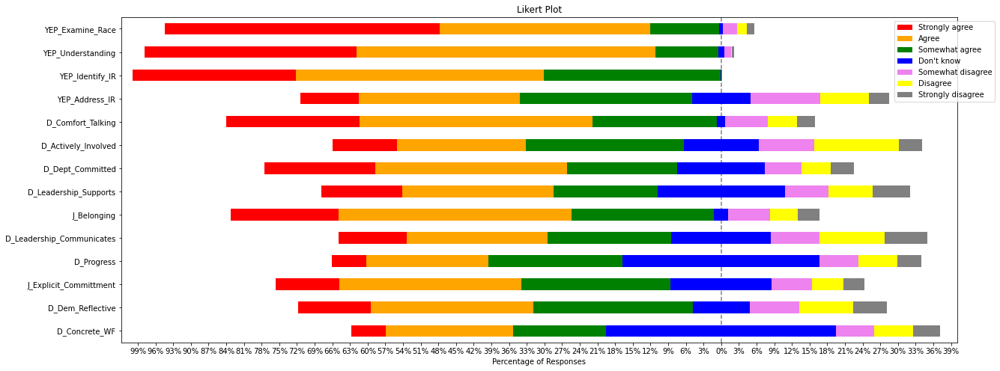

In [40]:
from matplotlib.ticker import (
                               FormatStrFormatter, 
                               AutoMinorLocator,
                               FuncFormatter,
                               )
# Likert plots for the likert questions.
## Customizing colors
import plot_likert
print(blue("========== Graph 1: Likert plot ============", ['bold']))
my_color_scheme =[
    plot_likert.colors.TRANSPARENT,
    "red",
    "orange",
    "green",
    "blue",
    "violet",
    "yellow",
    "grey",
    "cyan"    
]
## Scales
another_scale = \
    ["Strongly agree", 
     "Agree",
     "Somewhat agree",
     "Don't know",
     "Somewhat disagree",
     "Disagree",
     "Strongly disagree"
     ]
# data = cat_GARE_df2[["YEP_Examine_Race", "YEP_Understanding", "YEP_Identify_IR", "YEP_Address_IR", "D_Comfort_Talking", 
#                       "D_Actively_Involved", "D_Dept_Committed", "D_Leadership_Supports", "J_Belonging"]]
plot_likert.plot_likert(data1, another_scale, colors=my_color_scheme, plot_percentage=True, figsize=(20,8));
# displaying the title
plt.title("Likert Plot")

# Saving the figure
plt.savefig('python_pretty_plot.png')


========== Graph 1: Likert plot ============


Text(0.5, 1.0, 'Likert Plot')

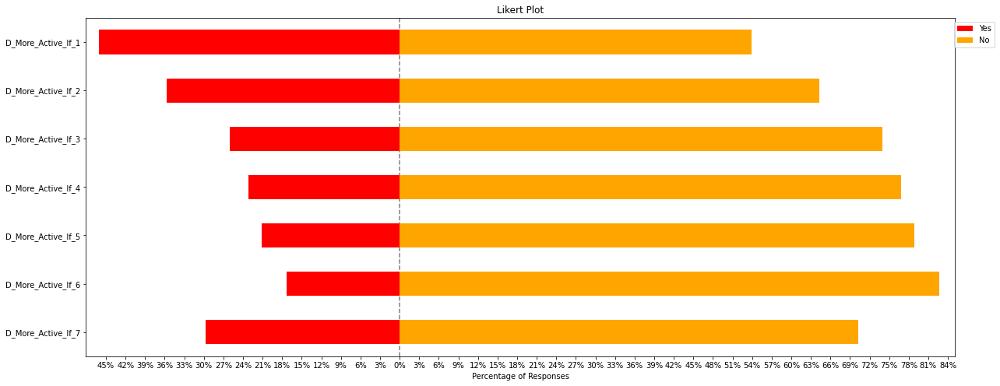

In [41]:
# Subset of suggested important Likert scale factors for Analysis
data2 = cat_GARE_df1[['D_More_Active_If_1', 'D_More_Active_If_2', 'D_More_Active_If_3', 'D_More_Active_If_4', 'D_More_Active_If_5',
                      'D_More_Active_If_6', 'D_More_Active_If_7']]
from matplotlib.ticker import (
                               FormatStrFormatter, 
                               AutoMinorLocator,
                               FuncFormatter,
                               )
# Likert plots for the likert questions.
## Customizing colors
import plot_likert
print(blue("========== Graph 1: Likert plot ============", ['bold']))
my_color_scheme =[
    plot_likert.colors.TRANSPARENT,
    "red",
    "orange",
    "green",
    "blue",
    "violet",
    "yellow",
    "grey",
    "cyan"    
]
## Scales
another_scale = \
    ["Yes", 
     "No",]
# data = cat_GARE_df2[["YEP_Examine_Race", "YEP_Understanding", "YEP_Identify_IR", "YEP_Address_IR", "D_Comfort_Talking", 
#                       "D_Actively_Involved", "D_Dept_Committed", "D_Leadership_Supports", "J_Belonging"]]
plot_likert.plot_likert(data2, another_scale, colors=my_color_scheme, plot_percentage=True, figsize=(20,8));
# displaying the title
plt.title("Likert Plot")

# Saving the figure
#plt.savefig('python_pretty_plot.png')


In [29]:
# Plotting to an Excel file.
writer = pd.ExcelWriter('python_plot.xlsx', engine = 'xlsxwriter')
data1.to_excel(writer, sheet_name='Sheet1')

In [30]:
worksheet = writer.sheets['Sheet1']
worksheet.insert_image('C2','python_pretty_plot.png')
writer.save()

In [31]:
data_crosstab = pd.crosstab(cat_GARE_df1['Race_Eth'],
                            cat_GARE_df1['YEP_Examine_Race'],
                                margins = False)
print(data_crosstab)


YEP_Examine_Race           Agree  Disagree  Don't know  No response  \
Race_Eth                                                              
Asian                         16         1           1            0   
Black or African American      9         0           2            0   
Hispanic/Latino               69         6           6            0   
Mixed Race                     4         3           2            0   
Native American               31         6           2            0   
No response                   64        20           8            2   
Pacific Islander               5         0           1            0   
White                        398        54          37            2   

YEP_Examine_Race           Somewhat agree  Somewhat disagree  Strongly agree  \
Race_Eth                                                                       
Asian                                   3                  0              14   
Black or African American               1        

========== Graph 2: Age Group distribution ============


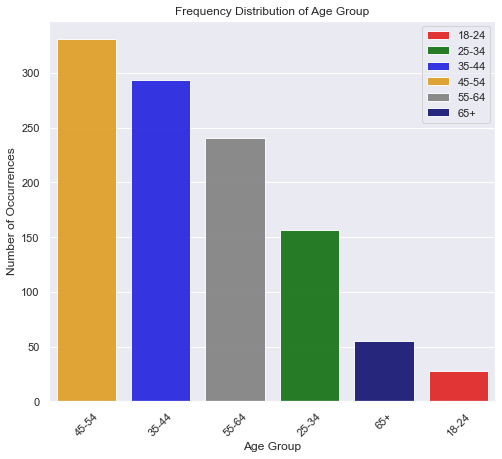

In [42]:
# Age group distribution
print(blue("========== Graph 2: Age Group distribution ============", ['bold']))
Age_count = cat_GARE_df2['AY_Age'].value_counts()

# use the alphabetical order of the model to order the hue values
hue_order = cat_GARE_df2['AY_Age'].unique()
hue_order.sort()

# barplot of the frequency distribution of Age
color = ['red','green','blue','orange','grey','navy', 'yellow']
sns.set(rc = {'figure.figsize':(8,7)})
sns.set(style="darkgrid")
# sns.barplot(x=Age_count.index, y=Age_count.values, hue= Age_count.index, dodge=False, 
#             hue_order=hue_order, order=['18-24', '25-34', '35-44', '45-54', '55-64',
#                                        '65+', 'No response'], palette=color, alpha=0.9)
sns.barplot(x=Age_count.index, y=Age_count.values, hue= Age_count.index, dodge=False, 
            hue_order=hue_order, palette=color, alpha=0.9)
plt.xticks(rotation=45)
plt.title('Frequency Distribution of Age Group')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Age Group', fontsize=12)
plt.show()

========== Pie Chart 1: Age Group distribution ============


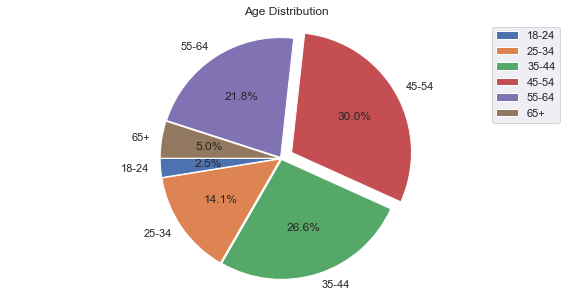

In [43]:
#  Pie chart for Age
print(blue("========== Pie Chart 1: Age Group distribution ============", ['bold']))
labels = cat_GARE_df2['AY_Age'].astype('category').cat.categories.tolist()
counts = cat_GARE_df2['AY_Age'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
# Explode out the 'Chemical' pie piece by offsetting it a greater amount
explode = (0.01, 0.01, 0.01, 0.1, 0.01, 0.01)
fig1, ax1 = plt.subplots(figsize=(10, 5))
ax1.pie(sizes, 
        #radius=1800, 
        explode=explode, 
        labels=labels, 
        autopct='%1.1f%%', #autopct is show the % on plot
        #shadow=True, 
        startangle=180) 
ax1.axis('equal')
ax1.set_title('Age Distribution')
plt.legend(labels, loc="best")
plt.show()

========== Graph 3: Gender distribution ============


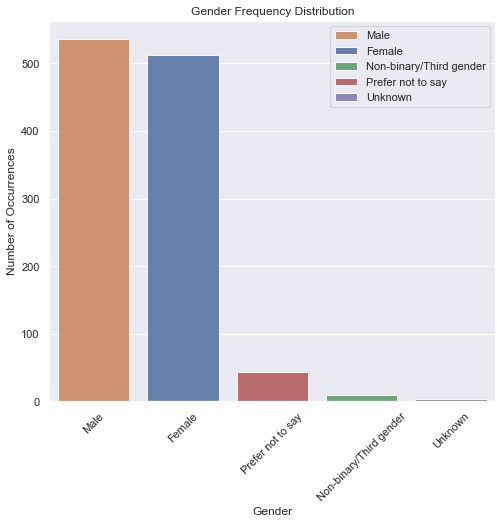

In [44]:
# Gender distribution
print(blue("========== Graph 3: Gender distribution ============", ['bold']))
Gender_count = cat_GARE_df2['AY_Gender'].value_counts()

# use the alphabetical order of the model to order the hue values
hue_order = cat_GARE_df2['AY_Gender'].unique()
hue_order.sort()

## barplot of the frequency distribution of Gender
sns.set(rc = {'figure.figsize':(8,7)})
sns.set(style="darkgrid")
# sns.barplot(x=Gender_count.index, y=Gender_count.values, hue= Gender_count.index, 
#             dodge=False, hue_order=hue_order, order=['Male', 'Female', 'Non-binary/Third gender',
#                                                      'Prefer not to say', 'Unknown', 'No response'], alpha=0.9)

sns.barplot(x=Gender_count.index, y=Gender_count.values, hue= Gender_count.index, 
            dodge=False, hue_order=hue_order, alpha=0.9)
plt.xticks(rotation=45)
plt.title('Gender Frequency Distribution')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Gender', fontsize=12)

# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()

# specify order
order = [1,0,2,3,4]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order])
plt.show()

========== Pie Chart 2: Gender distribution ============


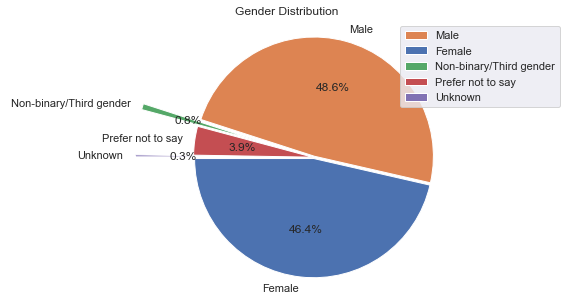

In [45]:
#  Pie chart for AY_Gender
print(blue("========== Pie Chart 2: Gender distribution ============", ['bold']))
labels = cat_GARE_df2['AY_Gender'].astype('category').cat.categories.tolist()
counts = cat_GARE_df2['AY_Gender'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
# Explode out the 'Chemical' pie piece by offsetting it a greater amount
explode = (0.01, 0.01, 0.5, 0.01, 0.5)
fig1, ax1 = plt.subplots(figsize=(10, 5))
ax1.pie(sizes, 
        #radius=1800, 
        explode=explode, 
        labels=labels, 
        autopct='%1.1f%%', #autopct is show the % on plot
        #shadow=True, 
        startangle=180) 
ax1.axis('equal')
ax1.set_title('Gender Distribution')
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()

# specify order
order = [1,0,2,3,4]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order], loc="upper right")
#plt.legend(labels, loc="best")
plt.show()

========== Graph 4: Manager or Superviser distribution ============


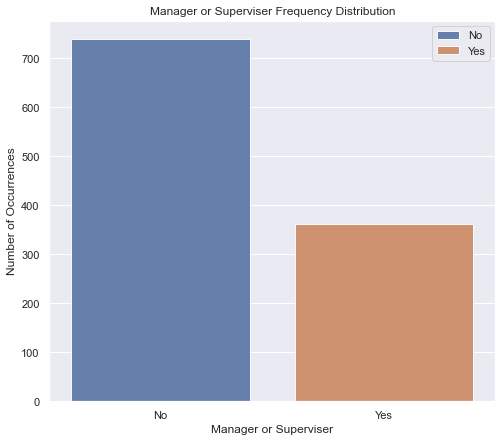

In [51]:
# Manager or Superviser distribution
print(blue("========== Graph 4: Manager or Superviser distribution ============", ['bold']))
Supervise_count = cat_GARE_df2['AY_Manage_Supervise'].value_counts()

# use the alphabetical order of the model to order the hue values
hue_order = cat_GARE_df2['AY_Manage_Supervise'].unique()
hue_order.sort()

## barplot of the frequency distribution of Gender
sns.set(rc = {'figure.figsize':(8,7)})
sns.set(style="darkgrid")
sns.barplot(x=Supervise_count.index, y=Supervise_count.values, hue= Supervise_count.index, dodge=False, hue_order=hue_order, alpha=0.9)
plt.xticks(rotation=360)
plt.title('Manager or Superviser Frequency Distribution')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Manager or Superviser', fontsize=12)
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()
  
# specify order
order = [0,1]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order])
plt.show()

========== Pie Chart 3: Manager or Superviser distribution ============


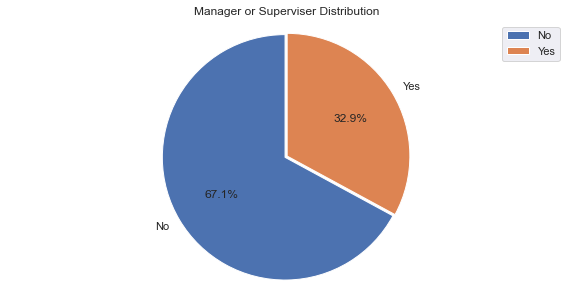

In [52]:
#  Pie chart for Manager or Superviser
print(blue("========== Pie Chart 3: Manager or Superviser distribution ============", ['bold']))
labels = cat_GARE_df2['AY_Manage_Supervise'].astype('category').cat.categories.tolist()
counts = cat_GARE_df2['AY_Manage_Supervise'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
# Explode out the 'Chemical' pie piece by offsetting it a greater amount
explode = (0.01, 0.01)
fig1, ax1 = plt.subplots(figsize=(10, 5))
ax1.pie(sizes, 
        #radius=1800, 
        explode=explode, 
        labels=labels, 
        autopct='%1.1f%%', #autopct is show the % on plot
        #shadow=True, 
        startangle=90) 
ax1.axis('equal')
ax1.set_title('Manager or Superviser Distribution')
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()
  
# specify order
order = [0,1]
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order], loc="upper right")
#plt.legend(labels, loc="best")
plt.show()

========== Graph 5: Work Location distribution ============


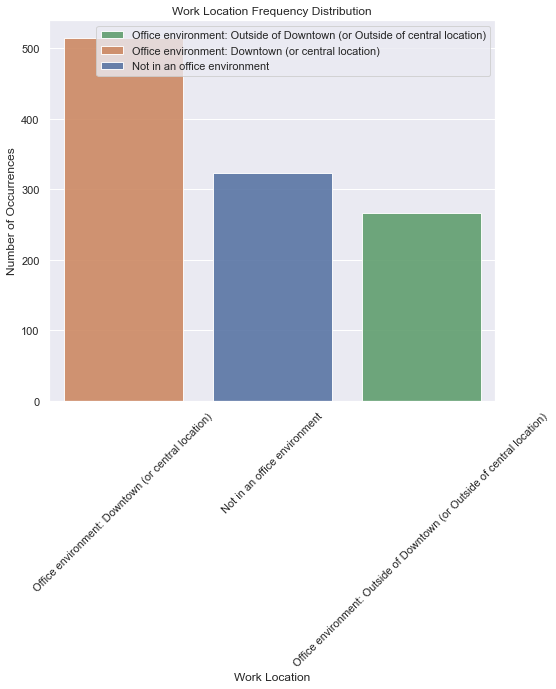

In [54]:
# Work Location distribution
print(blue("========== Graph 5: Work Location distribution ============", ['bold']))
Work_Location_count = cat_GARE_df2['AY_Work_Location'].value_counts()

# use the alphabetical order of the model to order the hue values
hue_order = cat_GARE_df2['AY_Work_Location'].unique()
hue_order.sort()

## barplot of the frequency distribution of Gender
sns.set(rc = {'figure.figsize':(8,7)})
sns.set(style="darkgrid")
# sns.barplot(x=Work_Location_count.index, y=Work_Location_count.values, hue= Work_Location_count.index, 
#             dodge=False, hue_order=hue_order, 
#             order=['Office environment: Downtown(or central location)', 'Office environment: Outside of Downtown(or Outside of central location)',
#                   'Not in an office environment', 'No response'], alpha=0.9)
sns.barplot(x=Work_Location_count.index, y=Work_Location_count.values, hue= Work_Location_count.index, 
            dodge=False, hue_order=hue_order, alpha=0.9)
plt.xticks(rotation=45)
plt.title('Work Location Frequency Distribution')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Work Location', fontsize=12)

# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()

# specify order
order = [2,1,0]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order], loc = 'upper right')
plt.show()

========== Pie Chart 4: Work Location distribution ============


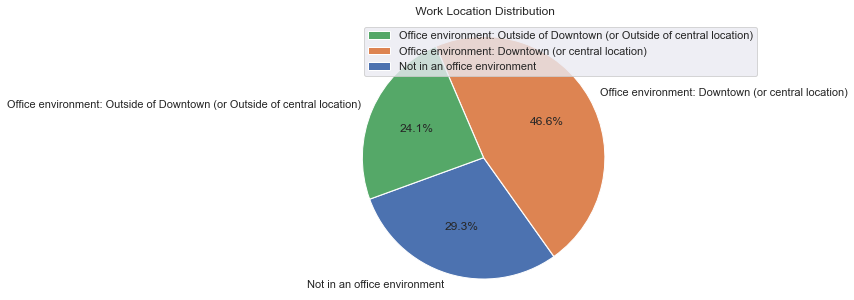

In [63]:
#  Pie chart for Work Location
print(blue("========== Pie Chart 4: Work Location distribution ============", ['bold']))
labels = cat_GARE_df2['AY_Work_Location'].astype('category').cat.categories.tolist()
counts = cat_GARE_df2['AY_Work_Location'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
# Explode out the 'Chemical' pie piece by offsetting it a greater amount
explode = (0.001, 0.001, 0.001)
fig1, ax1 = plt.subplots(figsize=(10, 5))
ax1.pie(sizes, 
        #radius=1800, 
        explode=explode, 
        labels=labels, 
        autopct='%1.1f%%', #autopct is show the % on plot
        #shadow=True, 
        startangle=200) 
ax1.axis('equal')
ax1.set_title(' Work Location Distribution')
#plt.legend(labels, loc="best")
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()

# specify order
order = [2,1,0]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order], loc = 'best')
plt.show()

========== Graph 6: Disability distribution ============


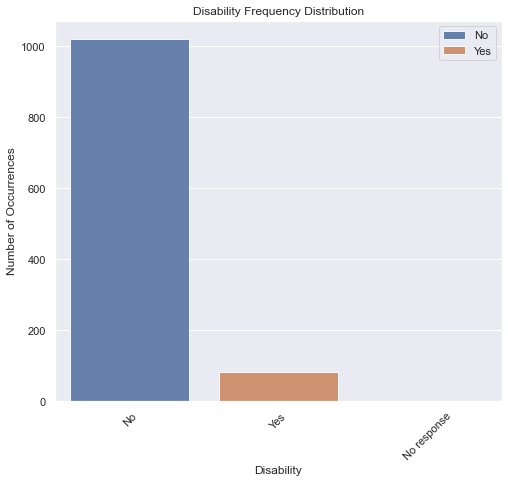

In [65]:
# Disability distribution
print(blue("========== Graph 6: Disability distribution ============", ['bold']))
Disability_count = cat_GARE_df2['AY_Disability'].value_counts()

# use the alphabetical order of the model to order the hue values
hue_order = cat_GARE_df2['AY_Disability'].unique()
hue_order.sort()

## barplot of the frequency distribution of Gender
sns.set(rc = {'figure.figsize':(8,7)})
sns.set(style="darkgrid")
sns.barplot(x=Disability_count.index, y=Disability_count.values, hue= Disability_count.index, 
            dodge=False, hue_order=hue_order, order=['No','Yes', 'No response'], alpha=0.9)
plt.xticks(rotation=45)
plt.title('Disability Frequency Distribution')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Disability', fontsize=12)
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()
  
# specify order
order = [0,1]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order], loc = 'upper right')
plt.show()

========== Pie Chart 5: Disability distribution ============


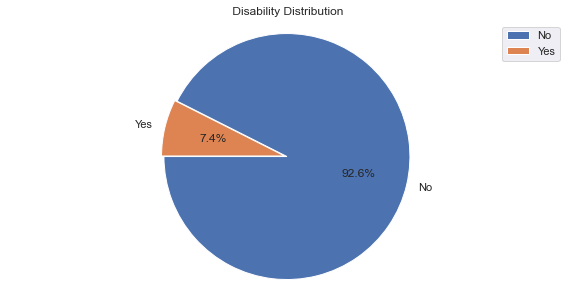

In [67]:
#  Pie chart for Disability
print(blue("========== Pie Chart 5: Disability distribution ============", ['bold']))
labels = cat_GARE_df2['AY_Disability'].astype('category').cat.categories.tolist()
counts = cat_GARE_df2['AY_Disability'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
# Explode out the 'Chemical' pie piece by offsetting it a greater amount
explode = (0.01, 0.01)
fig1, ax1 = plt.subplots(figsize=(10, 5))
ax1.pie(sizes, 
        #radius=1800, 
        explode=explode, 
        labels=labels, 
        autopct='%1.1f%%', #autopct is show the % on plot
        #shadow=True, 
        startangle=180) 
ax1.axis('equal')
ax1.set_title(' Disability Distribution')
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()
  
# specify order
order = [0,1]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order])
#plt.legend(labels, loc="best")
plt.show()

========== Graph 7: Race/Ethnicity distribution ============


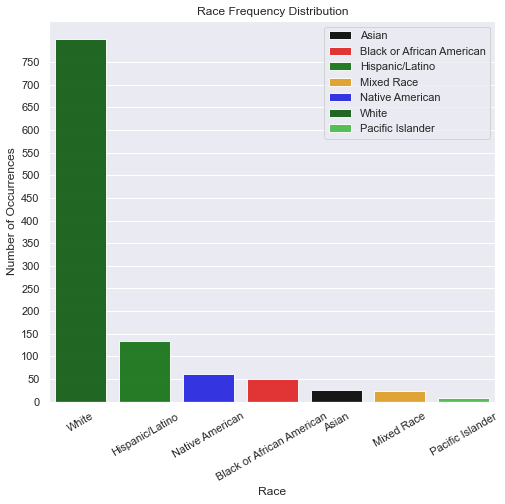

In [68]:
# Race Ethnicity distribution
print(blue("========== Graph 7: Race/Ethnicity distribution ============", ['bold']))
Race_count = cat_GARE_df2['Race_Eth'].value_counts()

# use the alphabetical order of the model to order the hue values
hue_order = cat_GARE_df2['Race_Eth'].unique()
hue_order.sort()

## barplot of the frequency distribution of Gender
color = ['black','red','green','orange','blue','limegreen','darkgreen','royalblue','navy', 'yellow', 'grey']
sns.set(rc = {'figure.figsize':(8,7)})
sns.set(style="darkgrid")
# sns.barplot(x=Race_count.index, y=Race_count.values, hue= Race_count.index, dodge=False, hue_order=hue_order, 
#             order=['Asian', 'Black or African American', 'Hispanic/Latino', 'Mixed Race', 'Native American',
#                   'Pacific Islander', 'White', 'No response'], palette=color, alpha=0.9)

sns.barplot(x=Race_count.index, y=Race_count.values, hue= Race_count.index, dodge=False, hue_order=hue_order, 
            palette=color, alpha=0.9)
plt.xticks(rotation=30)
plt.title('Race Frequency Distribution')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Race', fontsize=12)
plt.yticks(np.arange(0, max(Race_count.values), 50))
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()
  
# specify order
order = [0,1,2,3,4,6,5]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order], loc = 'upper right')

plt.show()

========== Pie Chart 6: Race/Ethnicity distribution ============


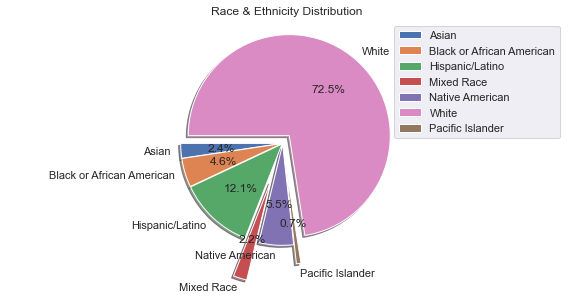

In [72]:
#  Pie chart for Race
print(blue("========== Pie Chart 6: Race/Ethnicity distribution ============", ['bold']))
labels = cat_GARE_df2['Race_Eth'].astype('category').cat.categories.tolist()
counts = cat_GARE_df2['Race_Eth'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
# Explode out the 'Chemical' pie piece by offsetting it a greater amount
explode = (0.01, 0.01, 0.01, 0.4, 0.01, 0.2,0.1)
fig1, ax1 = plt.subplots(figsize=(10, 5))
ax1.pie(sizes, 
        #radius=1800, 
        explode=explode, 
        labels=labels, 
        autopct='%1.1f%%', #autopct is show the % on plot
        shadow=True, 
        startangle=180) 
ax1.axis('equal')
ax1.set_title('Race & Ethnicity Distribution')
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()
  
# specify order
order = [0,1,2,3,4,6,5]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order])
#plt.legend(labels, loc="best")
plt.show()

========== Graph 8: City Tenure distribution ============


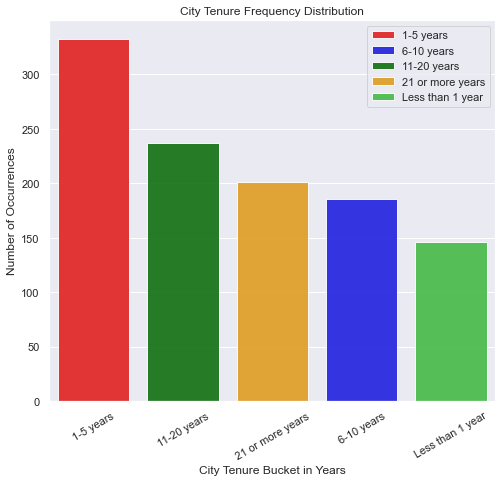

In [75]:
# City Tenure distribution
print(blue("========== Graph 8: City Tenure distribution ============", ['bold']))
Race_count = cat_GARE_df2['AY_City_Tenure'].value_counts()

# use the alphabetical order of the model to order the hue values
hue_order = cat_GARE_df2['AY_City_Tenure'].unique()
hue_order.sort()

## barplot of the frequency distribution of Gender
color = ['red','green','orange','blue','limegreen','darkgreen','royalblue','navy', 'yellow', 'grey']
sns.set(rc = {'figure.figsize':(8,7)})
sns.set(style="darkgrid")
# sns.barplot(x=Race_count.index, y=Race_count.values, hue= Race_count.index, dodge=False, hue_order=hue_order, 
#             order=['Asian', 'Black or African American', 'Hispanic/Latino', 'Mixed Race', 'Native American',
#                   'Pacific Islander', 'White', 'No response'], palette=color, alpha=0.9)

sns.barplot(x=Race_count.index, y=Race_count.values, hue= Race_count.index, dodge=False, hue_order=hue_order, 
            palette=color, alpha=0.9)
plt.xticks(rotation=30)
plt.title('City Tenure Frequency Distribution')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('City Tenure Bucket in Years', fontsize=12)
plt.yticks(np.arange(0, max(Race_count.values), 50))
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()
  
# specify order
order = [0,3,1,2,4]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order])

plt.show()

========== Pie Chart 7: City Tenure distribution ============


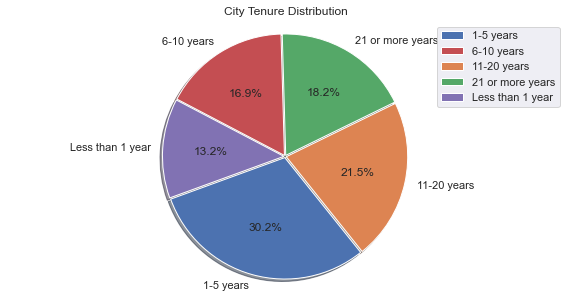

In [78]:
#  Pie chart for City Tenure
print(blue("========== Pie Chart 7: City Tenure distribution ============", ['bold']))
labels = cat_GARE_df2['AY_City_Tenure'].astype('category').cat.categories.tolist()
counts = cat_GARE_df2['AY_City_Tenure'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
# Explode out the 'Chemical' pie piece by offsetting it a greater amount
explode = (0.01, 0.01, 0.01, 0.01, 0.01)
fig1, ax1 = plt.subplots(figsize=(10, 5))
ax1.pie(sizes, 
        #radius=1800, 
        explode=explode, 
        labels=labels, 
        autopct='%1.1f%%', #autopct is show the % on plot
        shadow=True, 
        startangle=200) 
ax1.axis('equal')
ax1.set_title('City Tenure Distribution')
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()
  
# specify order
order = [0,3,1,2,4]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order])
#plt.legend(labels, loc="best")
plt.show()

<AxesSubplot:xlabel='AY_Age', ylabel='count'>

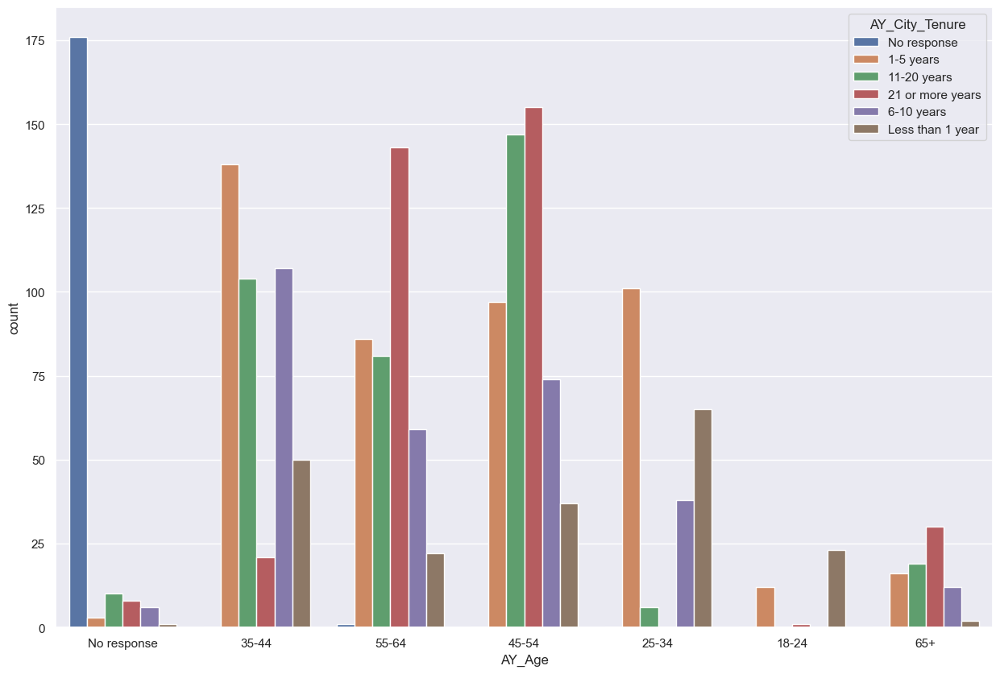

In [46]:
sns.countplot(x='AY_Age',hue='AY_City_Tenure',data=cat_GARE_df2)

<AxesSubplot:xlabel='AY_Age', ylabel='count'>

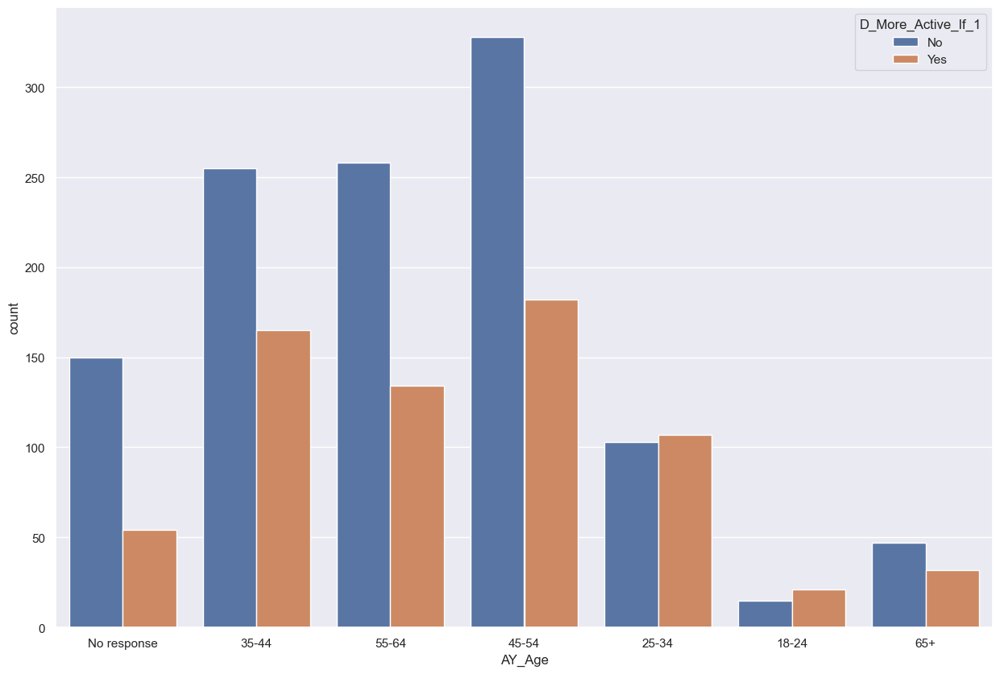

In [47]:
sns.countplot(x='AY_Age',hue='D_More_Active_If_1',data=cat_GARE_df2)

<AxesSubplot:xlabel='AY_Gender', ylabel='count'>

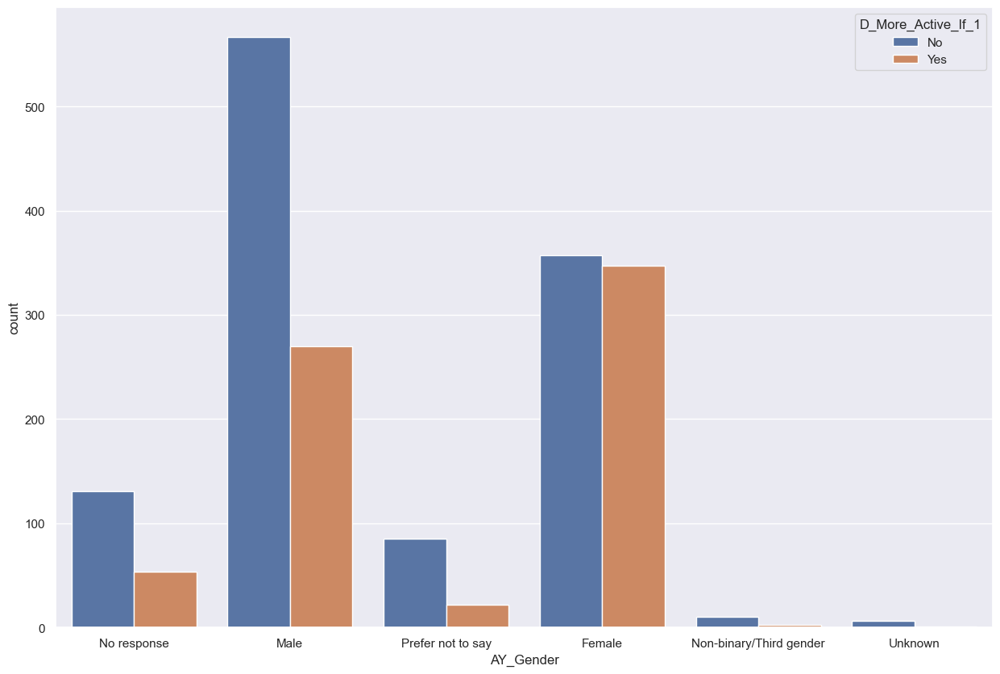

In [48]:
sns.countplot(x='AY_Gender',hue='D_More_Active_If_1',data=cat_GARE_df2)

<AxesSubplot:xlabel='Race_Eth', ylabel='count'>

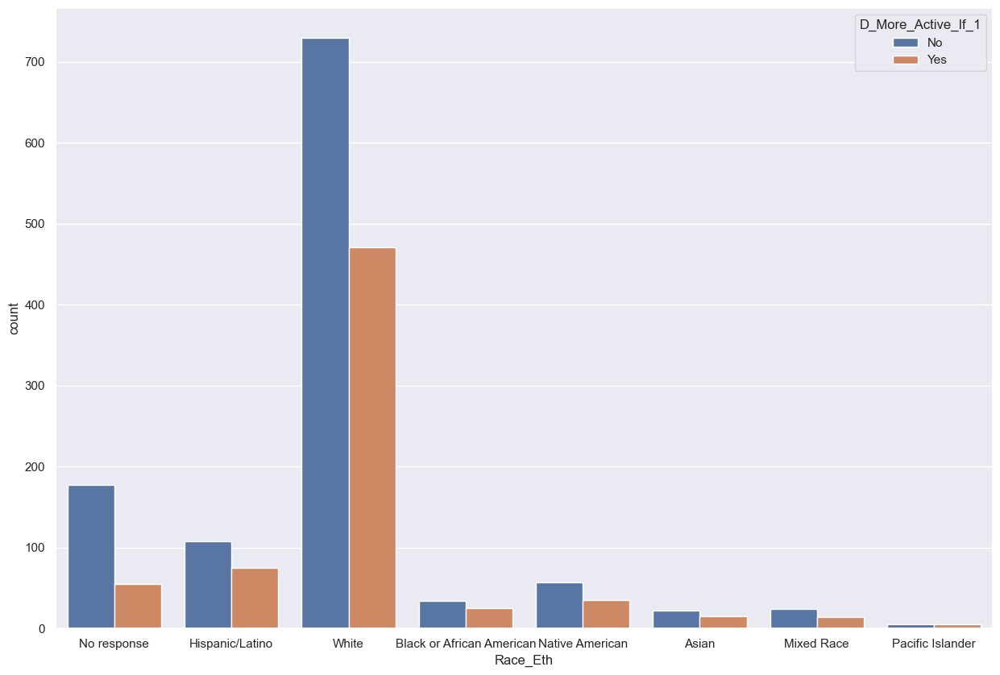

In [49]:
sns.countplot(x='Race_Eth',hue='D_More_Active_If_1',data=cat_GARE_df2)

<AxesSubplot:xlabel='AY_Disability', ylabel='count'>

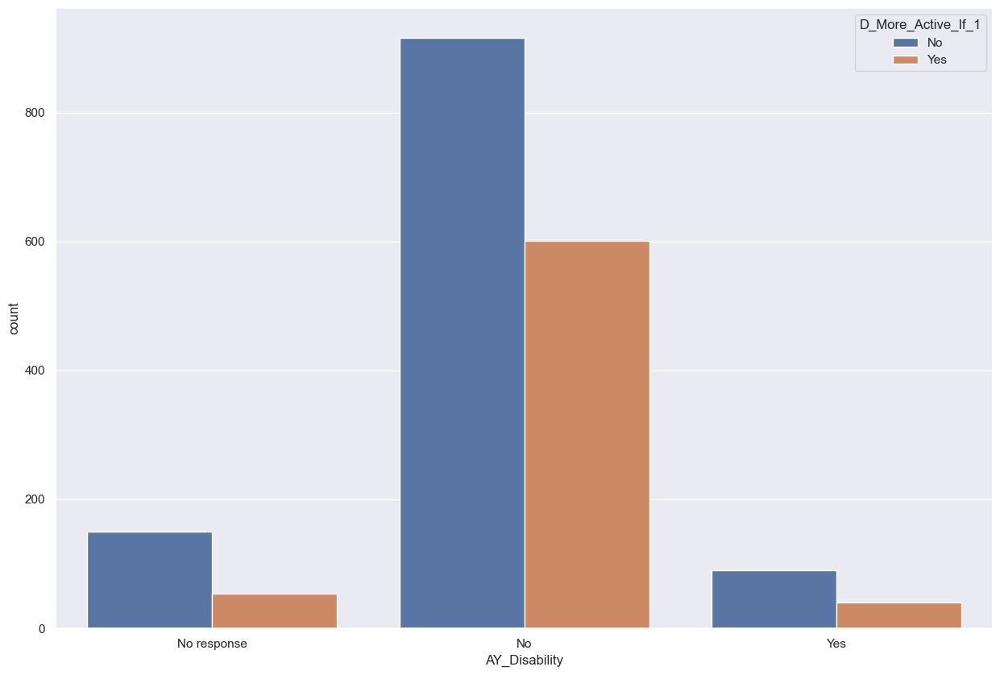

In [50]:
sns.countplot(x='AY_Disability',hue='D_More_Active_If_1',data=cat_GARE_df2)

<AxesSubplot:xlabel='AY_Work_Location', ylabel='count'>

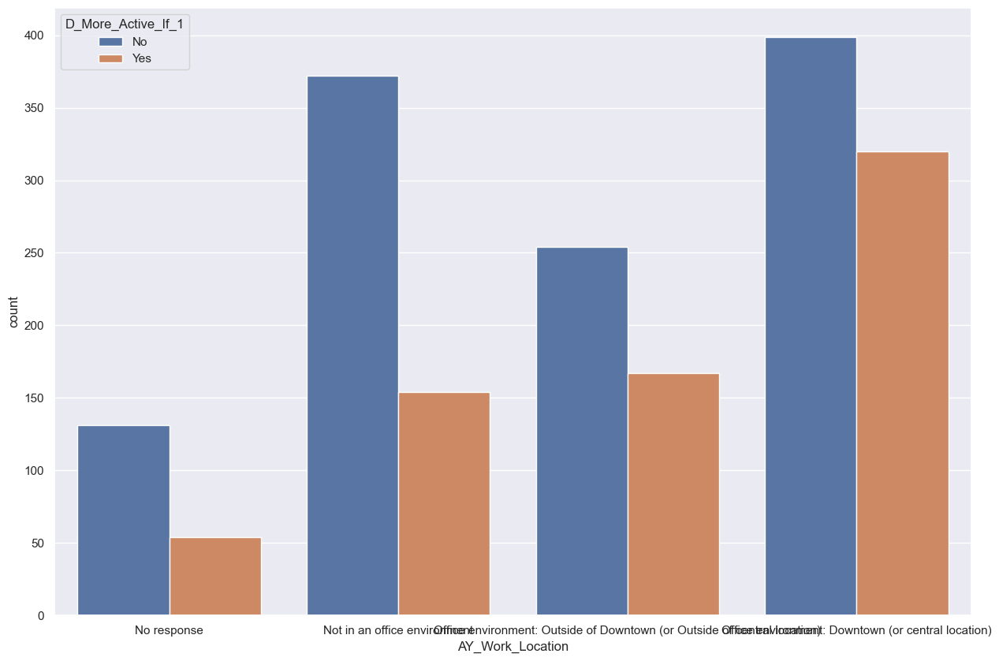

In [51]:
sns.countplot(x='AY_Work_Location',hue='D_More_Active_If_1',data=cat_GARE_df2)

In [52]:
# Interactive 3-D distribution Race vs Age vs Gender: Not very informative
print(blue("========== 3=D Graph1: Race vs Gender vs Age whith Disability ============", ['bold']))
fig = px.scatter_3d(cat_GARE_df2, x='AY_Age', y='AY_Gender', z='YEP_Examine_Race',
              color='AY_Gender')
fig.show()


========== 3=D Graph1: Race vs Gender vs Age whith Disability ============


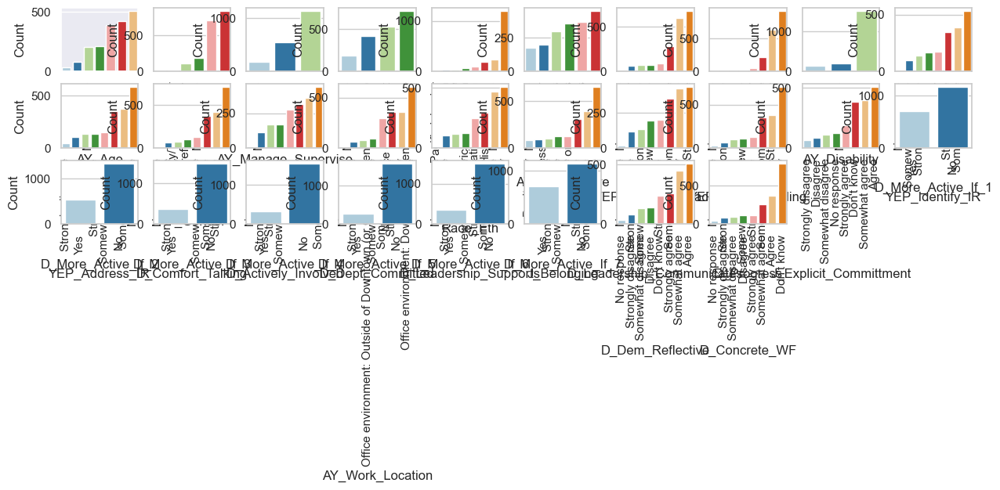

In [53]:
# Dataset factors distribution.
plt.figure(figsize=(15,15))
for i, col in enumerate(cat_GARE_df2.columns):
    sns.set_palette(sns.color_palette("Paired"))
    ax = plt.subplot(12,10,i+1)
    sns.countplot(
        x=col, data = cat_GARE_df2, ax = ax, 
        order = cat_GARE_df2[col].value_counts(ascending=True).index
    )
    sns.set_style('whitegrid')
    plt.xticks(rotation=90)
    plt.ylabel("Count")
    plt.tight_layout()
plt.show()

========== Heatmap: correlation matrix ============


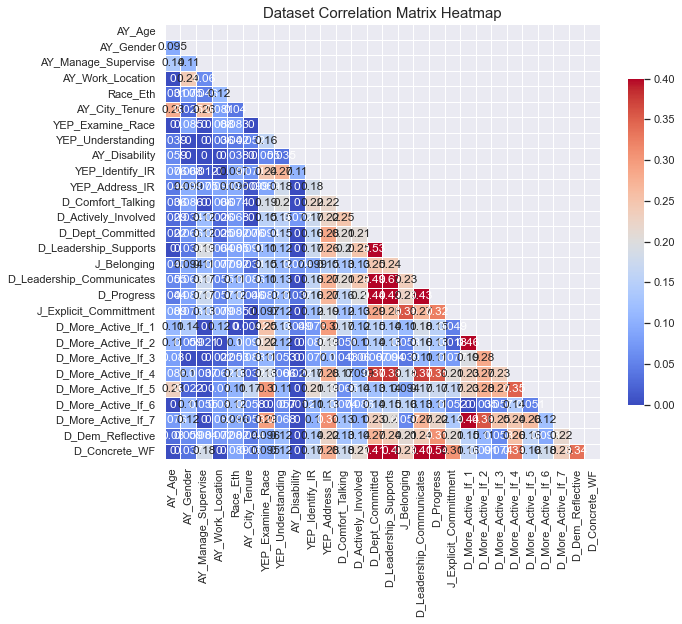

In [79]:
# Heatmap correlation matrix : Dataset
import itertools
print(blue("========== Heatmap: correlation matrix ============", ['bold']))
def cramers_corrected_stat(confusion_matrix):
    """
    Calculates the corrected Cramer's V statistic
    
    Args:
        confusion_matrix: The confusion matrix of the variables to calculate the statistic on
    
    Returns:
        The corrected Cramer'v V statistic
    """
    
    chi2, _, _, _ = scipy.stats.chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

cols = list(cat_GARE_df2.columns.values)
corrM = np.zeros((len(cols),len(cols)))

# Calculate correlations of every combination of variables
for col1, col2 in itertools.combinations(cols, 2):

    A, B = cat_GARE_df2[col1], cat_GARE_df2[col2]
    
    idx1, idx2 = cols.index(col1), cols.index(col2)
    dfObserved = pd.crosstab(A,B) 
    corrM[idx1, idx2] = cramers_corrected_stat(dfObserved.values)
    corrM[idx2, idx1] = corrM[idx1, idx2]

corr = pd.DataFrame(corrM, index=cols, columns=cols)
max_corr = 0.4
# Mask to get lower triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

#cmap = sns.cubehelix_palette(light=0.75, as_cmap=True)

# Draw the heatmap with the mask 
fig = plt.figure(figsize=(10, 8))

sns.heatmap(corr, mask=mask, vmax=max_corr, cmap="coolwarm", square=True, linewidths=.75, cbar_kws={"shrink": .75}, annot=True)
plt.title('Dataset Correlation Matrix Heatmap', fontsize = 15) # title with fontsize 15
plt.show()

========== Heatmap: Correlation matrix ============


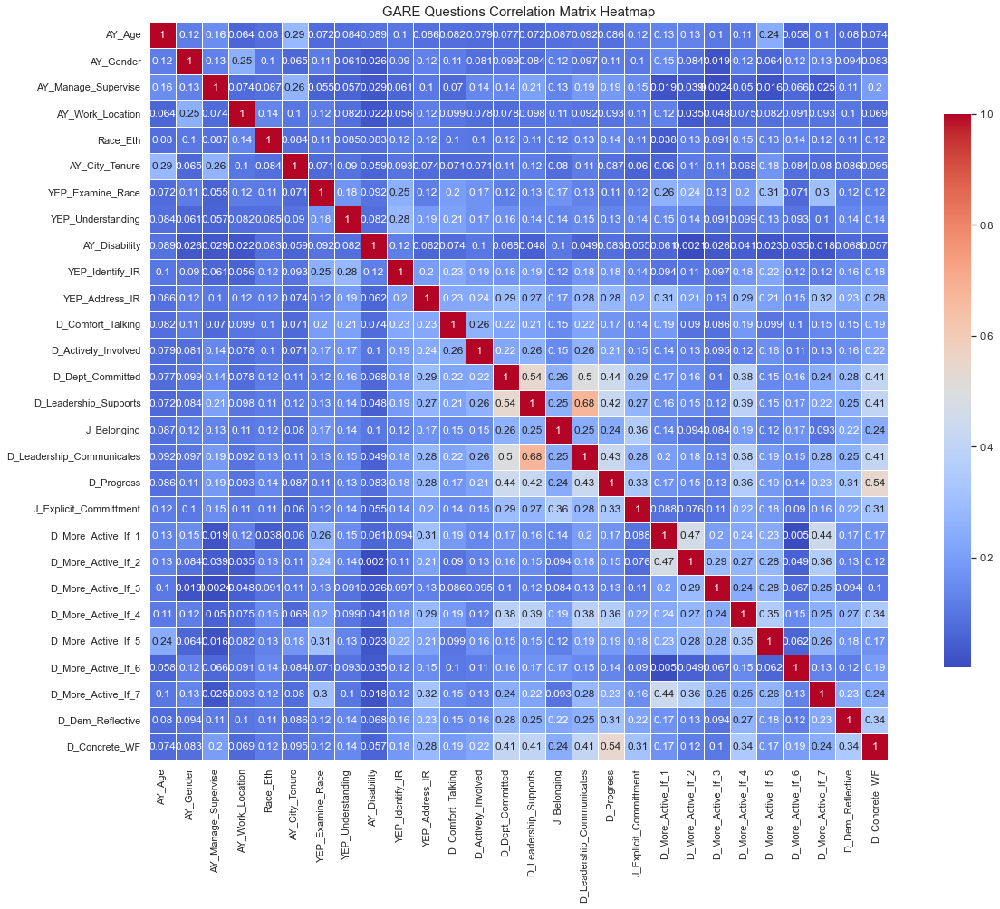

,AY_Age,AY_Gender,AY_Manage_Supervise,AY_Work_Location,Race_Eth,AY_City_Tenure,YEP_Examine_Race,YEP_Understanding,AY_Disability,YEP_Identify_IR,YEP_Address_IR,D_Comfort_Talking,D_Actively_Involved,D_Dept_Committed,D_Leadership_Supports,J_Belonging,D_Leadership_Communicates,D_Progress,J_Explicit_Committment,D_More_Active_If_1,D_More_Active_If_2,D_More_Active_If_3,D_More_Active_If_4,D_More_Active_If_5,D_More_Active_If_6,D_More_Active_If_7,D_Dem_Reflective,D_Concrete_WF
AY_Age,1.0000,0.1159,0.1558,0.0635,0.0801,0.2860,0.0725,0.0835,0.0895,0.1015,0.0857,0.0823,0.0794,0.0769,0.0722,0.0875,0.0920,0.0857,0.1152,0.1324,0.1273,0.1046,0.1091,0.2402,0.0580,0.1016,0.0796,0.0737
AY_Gender,0.1159,1.0000,0.1266,0.2478,0.1049,0.0650,0.1124,0.0612,0.0261,0.0905,0.1234,0.1132,0.0811,0.0988,0.0836,0.1197,0.0972,0.1140,0.1036,0.1537,0.0844,0.0190,0.1198,0.0643,0.1250,0.1344,0.0942,0.0825
AY_Manage_Supervise,0.1558,0.1266,1.0000,0.0737,0.0871,0.2634,0.0549,0.0568,0.0293,0.0614,0.1050,0.0705,0.1395,0.1444,0.2066,0.1329,0.1896,0.1884,0.1530,0.0186,0.0389,0.0024,0.0500,0.0157,0.0656,0.0251,0.1121,0.1983
AY_Work_Location,0.0635,0.2478,0.0737,1.0000,0.1368,0.1012,0.1151,0.0820,0.0224,0.0561,0.1168,0.0990,0.0783,0.0779,0.0975,0.1069,0.0923,0.0931,0.1078,0.1237,0.0350,0.0478,0.0755,0.0819,0.0907,0.0928,0.1033,0.0689
Race_Eth,0.0801,0.1049,0.0871,0.1368,1.0000,0.0837,0.1112,0.0848,0.0829,0.1221,0.1212,0.1041,0.1000,0.1181,0.1127,0.1178,0.1317,0.1443,0.1123,0.0378,0.1259,0.0906,0.1526,0.1294,0.1390,0.1210,0.1098,0.1154
AY_City_Tenure,0.2860,0.0650,0.2634,0.1012,0.0837,1.0000,0.0712,0.0901,0.0594,0.0928,0.0744,0.0714,0.0709,0.1059,0.1173,0.0800,0.1128,0.0871,0.0596,0.0604,0.1088,0.1063,0.0681,0.1769,0.0838,0.0799,0.0860,0.0953
YEP_Examine_Race,0.0725,0.1124,0.0549,0.1151,0.1112,0.0712,1.0000,0.1769,0.0922,0.2548,0.1153,0.1997,0.1705,0.1191,0.1338,0.1664,0.1301,0.1105,0.1219,0.2625,0.2354,0.1304,0.1966,0.3091,0.0708,0.3036,0.1209,0.1204
YEP_Understanding,0.0835,0.0612,0.0568,0.0820,0.0848,0.0901,0.1769,1.0000,0.0818,0.2805,0.1928,0.2118,0.1694,0.1631,0.1448,0.1365,0.1472,0.1343,0.1388,0.1529,0.1371,0.0906,0.0987,0.1325,0.0931,0.1003,0.1417,0.1440
AY_Disability,0.0895,0.0261,0.0293,0.0224,0.0829,0.0594,0.0922,0.0818,1.0000,0.1221,0.0623,0.0736,0.1030,0.0683,0.0477,0.1048,0.0490,0.0828,0.0552,0.0608,0.0021,0.0263,0.0413,0.0227,0.0347,0.0180,0.0680,0.0568
YEP_Identify_IR,0.1015,0.0905,0.0614,0.0561,0.1221,0.0928,0.2548,0.2805,0.1221,1.0000,0.1957,0.2306,0.1890,0.1760,0.1895,0.1230,0.1779,0.1761,0.1413,0.0943,0.1061,0.0974,0.1812,0.2219,0.1232,0.1183,0.1588,0.1827


In [88]:
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import association_metrics as am
print(blue("========== Heatmap: Correlation matrix ============", ['bold']))
# Convert object columns to Category columns
df = cat_GARE_df2.apply(
        lambda x: x.astype("category") if x.dtype == "O" else x)
# Initialize a CramersV object using the pandas.DataFrame (df)
cramers_v = am.CramersV(df)
# It will return a pairwise matrix filled with Cramer's V, where 
# columns and index are the categorical variables of the passed     # pandas.DataFrame
cfit = cramers_v.fit().round(4)
cfit1 = cfit[cfit>0.5]
#cfit
max_corr = 1.0
# Mask to get lower triangle
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True

#cmap = sns.cubehelix_palette(light=0.75, as_cmap=True)

# Draw the heatmap with the mask  
fig = plt.figure(figsize=(22, 15))

sns.heatmap(cfit, cmap="coolwarm", vmax=max_corr, square=True, linewidths=.75, cbar_kws={"shrink": .75}, annot=True)
plt.title('GARE Questions Correlation Matrix Heatmap', fontsize = 15) # title with fontsize 15
plt.show()
display(cfit)

========== Heatmap: Correlation matrix ============


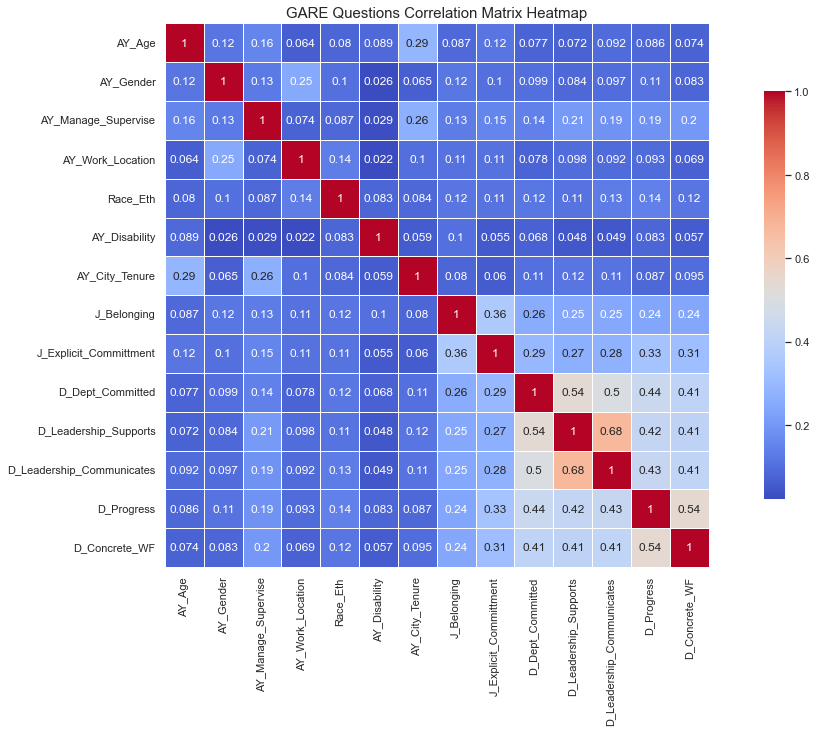

,AY_Age,AY_Gender,AY_Manage_Supervise,AY_Work_Location,Race_Eth,AY_Disability,AY_City_Tenure,J_Belonging,J_Explicit_Committment,D_Dept_Committed,D_Leadership_Supports,D_Leadership_Communicates,D_Progress,D_Concrete_WF
AY_Age,1.0000,0.1159,0.1558,0.0635,0.0801,0.0895,0.2860,0.0875,0.1152,0.0769,0.0722,0.0920,0.0857,0.0737
AY_Gender,0.1159,1.0000,0.1266,0.2478,0.1049,0.0261,0.0650,0.1197,0.1036,0.0988,0.0836,0.0972,0.1140,0.0825
AY_Manage_Supervise,0.1558,0.1266,1.0000,0.0737,0.0871,0.0293,0.2634,0.1329,0.1530,0.1444,0.2066,0.1896,0.1884,0.1983
AY_Work_Location,0.0635,0.2478,0.0737,1.0000,0.1368,0.0224,0.1012,0.1069,0.1078,0.0779,0.0975,0.0923,0.0931,0.0689
Race_Eth,0.0801,0.1049,0.0871,0.1368,1.0000,0.0829,0.0837,0.1178,0.1123,0.1181,0.1127,0.1317,0.1443,0.1154
AY_Disability,0.0895,0.0261,0.0293,0.0224,0.0829,1.0000,0.0594,0.1048,0.0552,0.0683,0.0477,0.0490,0.0828,0.0568
AY_City_Tenure,0.2860,0.0650,0.2634,0.1012,0.0837,0.0594,1.0000,0.0800,0.0596,0.1059,0.1173,0.1128,0.0871,0.0953
J_Belonging,0.0875,0.1197,0.1329,0.1069,0.1178,0.1048,0.0800,1.0000,0.3618,0.2559,0.2477,0.2454,0.2368,0.2431
J_Explicit_Committment,0.1152,0.1036,0.1530,0.1078,0.1123,0.0552,0.0596,0.3618,1.0000,0.2946,0.2679,0.2778,0.3323,0.3140
D_Dept_Committed,0.0769,0.0988,0.1444,0.0779,0.1181,0.0683,0.1059,0.2559,0.2946,1.0000,0.5377,0.4961,0.4447,0.4119


In [89]:
# Subset of highly correlated factors for Analysis
cat_GARE_df3 = cat_GARE_df1[['AY_Age', 'AY_Gender', 'AY_Manage_Supervise', 'AY_Work_Location', 'Race_Eth', 'AY_Disability', 'AY_City_Tenure', 
                             'J_Belonging', 'J_Explicit_Committment', 'D_Dept_Committed',
                             'D_Leadership_Supports', 'D_Leadership_Communicates', 'D_Progress', 'D_Concrete_WF']]
# Using association_metrics library
import association_metrics as am
print(blue("========== Heatmap: Correlation matrix ============", ['bold']))
# Convert object columns to Category columns
df = cat_GARE_df3.apply(
        lambda x: x.astype("category") if x.dtype == "O" else x)
# Initialize a CramersV object using the pandas.DataFrame (df)
cramers_v = am.CramersV(df)
# It will return a pairwise matrix filled with Cramer's V, where 
# columns and index are the categorical variables of the passed     # pandas.DataFrame
cfit = cramers_v.fit().round(4)
##cfit1 = cfit[cfit>0.5]
#cfit
max_corr = 1.0
# Mask to get lower triangle
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True

#cmap = sns.cubehelix_palette(light=0.75, as_cmap=True)

# Draw the heatmap with the mask  
fig = plt.figure(figsize=(20, 10))

sns.heatmap(cfit, cmap="coolwarm", vmax=max_corr, square=True, linewidths=.75, cbar_kws={"shrink": .75}, annot=True)
plt.title('GARE Questions Correlation Matrix Heatmap', fontsize = 15) # title with fontsize 15
plt.show()
display(cfit)

========== Heatmap: Correlation matrix ============


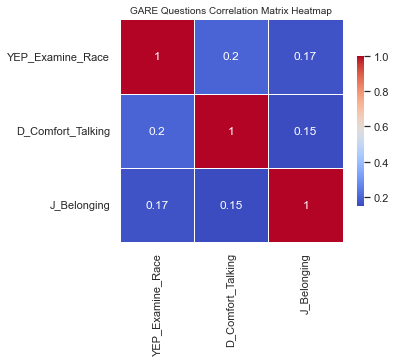

,YEP_Examine_Race,D_Comfort_Talking,J_Belonging
YEP_Examine_Race,1.0000,0.1997,0.1664
D_Comfort_Talking,0.1997,1.0000,0.1502
J_Belonging,0.1664,0.1502,1.0000


In [90]:
# Subset of Values, Inclusion, & Comfort Level Sub-Category factors correlation Analysis
cat_GARE_df4 = cat_GARE_df1[['YEP_Examine_Race', 'D_Comfort_Talking', 'J_Belonging']]
# Using association_metrics library
import association_metrics as am
print(blue("========== Heatmap: Correlation matrix ============", ['bold']))
# Convert object columns to Category columns
df = cat_GARE_df4.apply(
        lambda x: x.astype("category") if x.dtype == "O" else x)
# Initialize a CramersV object using the pandas.DataFrame (df)
cramers_v = am.CramersV(df)
# It will return a pairwise matrix filled with Cramer's V, where 
# columns and index are the categorical variables of the passed     # pandas.DataFrame
cfit = cramers_v.fit().round(4)
##cfit1 = cfit[cfit>0.5]
#cfit
max_corr = 1.0
# Mask to get lower triangle
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True

#cmap = sns.cubehelix_palette(light=0.75, as_cmap=True)

# Draw the heatmap with the mask  
fig = plt.figure(figsize=(5, 5))

sns.heatmap(cfit, cmap="coolwarm", vmax=max_corr, square=True, linewidths=.75, cbar_kws={"shrink": .55}, annot=True)
plt.title('GARE Questions Correlation Matrix Heatmap', fontsize = 10) # title with fontsize 10
plt.show()
display(cfit)

========== Heatmap: Correlation matrix ============


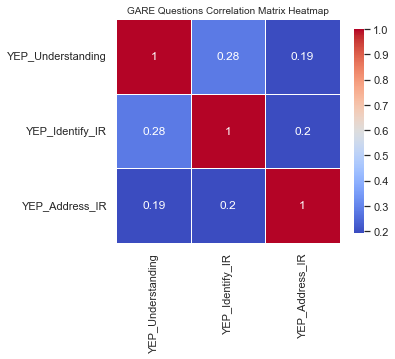

,YEP_Understanding,YEP_Identify_IR,YEP_Address_IR
YEP_Understanding,1.0000,0.2805,0.1928
YEP_Identify_IR,0.2805,1.0000,0.1957
YEP_Address_IR,0.1928,0.1957,1.0000


In [91]:
# Subset of Knowledge, Training, & Tools Sub-Category factors correlation Analysis
cat_GARE_df5 = cat_GARE_df1[['YEP_Understanding', 'YEP_Identify_IR', 'YEP_Address_IR']]
# Using association_metrics library
import association_metrics as am
print(blue("========== Heatmap: Correlation matrix ============", ['bold']))
# Convert object columns to Category columns
df = cat_GARE_df5.apply(
        lambda x: x.astype("category") if x.dtype == "O" else x)
# Initialize a CramersV object using the pandas.DataFrame (df)
cramers_v = am.CramersV(df)
# It will return a pairwise matrix filled with Cramer's V, where 
# columns and index are the categorical variables of the passed     # pandas.DataFrame
cfit = cramers_v.fit().round(4)
##cfit1 = cfit[cfit>0.5]
#cfit
max_corr = 1.0
# Mask to get lower triangle
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True

#cmap = sns.cubehelix_palette(light=0.75, as_cmap=True)

# Draw the heatmap with the mask  
fig = plt.figure(figsize=(5, 5))

sns.heatmap(cfit, cmap="coolwarm", vmax=max_corr, square=True, linewidths=.75, cbar_kws={"shrink": .75}, annot=True)
plt.title('GARE Questions Correlation Matrix Heatmap', fontsize = 10) # title with fontsize 15
plt.show()
display(cfit)

========== Heatmap: Correlation matrix ============


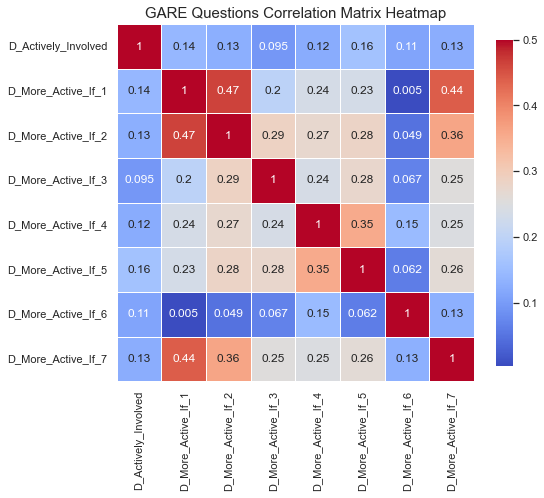

,D_Actively_Involved,D_More_Active_If_1,D_More_Active_If_2,D_More_Active_If_3,D_More_Active_If_4,D_More_Active_If_5,D_More_Active_If_6,D_More_Active_If_7
D_Actively_Involved,1.0000,0.1418,0.1269,0.0953,0.1233,0.1604,0.1130,0.1264
D_More_Active_If_1,0.1418,1.0000,0.4651,0.1982,0.2354,0.2348,0.0050,0.4419
D_More_Active_If_2,0.1269,0.4651,1.0000,0.2867,0.2734,0.2817,0.0489,0.3608
D_More_Active_If_3,0.0953,0.1982,0.2867,1.0000,0.2384,0.2753,0.0672,0.2547
D_More_Active_If_4,0.1233,0.2354,0.2734,0.2384,1.0000,0.3537,0.1469,0.2485
D_More_Active_If_5,0.1604,0.2348,0.2817,0.2753,0.3537,1.0000,0.0625,0.2638
D_More_Active_If_6,0.1130,0.0050,0.0489,0.0672,0.1469,0.0625,1.0000,0.1300
D_More_Active_If_7,0.1264,0.4419,0.3608,0.2547,0.2485,0.2638,0.1300,1.0000


In [92]:
# Subset of Involvement Sub-Category factors correlation Analysis
cat_GARE_df6 = cat_GARE_df1[['D_Actively_Involved', 'D_More_Active_If_1', 'D_More_Active_If_2', 'D_More_Active_If_3',
                            'D_More_Active_If_4', 'D_More_Active_If_5', 'D_More_Active_If_6', 'D_More_Active_If_7']]
# Using association_metrics library
import association_metrics as am
print(blue("========== Heatmap: Correlation matrix ============", ['bold']))
# Convert object columns to Category columns
df = cat_GARE_df6.apply(
        lambda x: x.astype("category") if x.dtype == "O" else x)
# Initialize a CramersV object using the pandas.DataFrame (df)
cramers_v = am.CramersV(df)
# It will return a pairwise matrix filled with Cramer's V, where 
# columns and index are the categorical variables of the passed     # pandas.DataFrame
cfit = cramers_v.fit().round(4)
##cfit1 = cfit[cfit>0.5]
#cfit
max_corr = 0.5
# Mask to get lower triangle
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True

#cmap = sns.cubehelix_palette(light=0.75, as_cmap=True)

# Draw the heatmap with the mask  
fig = plt.figure(figsize=(8, 8))

sns.heatmap(cfit, cmap="coolwarm", vmax=max_corr, square=True, linewidths=.75, cbar_kws={"shrink": .75}, annot=True)
plt.title('GARE Questions Correlation Matrix Heatmap', fontsize = 15) # title with fontsize 15
plt.show()

display(cfit)

========== Heatmap: Correlation matrix ============


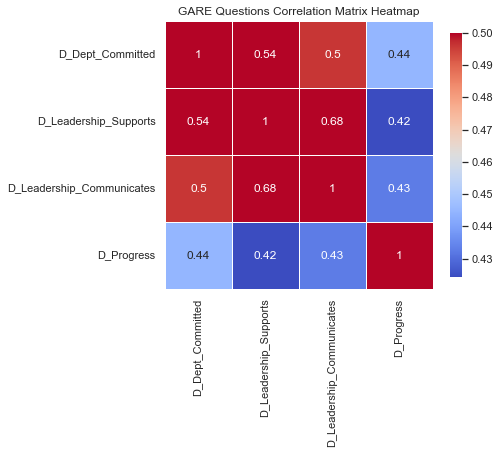

,D_Dept_Committed,D_Leadership_Supports,D_Leadership_Communicates,D_Progress
D_Dept_Committed,1.0000,0.5377,0.4961,0.4447
D_Leadership_Supports,0.5377,1.0000,0.6750,0.4242
D_Leadership_Communicates,0.4961,0.6750,1.0000,0.4327
D_Progress,0.4447,0.4242,0.4327,1.0000


In [93]:
# Subset of Leadership Sub-Category factors correlation Analysis
cat_GARE_df7 = cat_GARE_df1[['D_Dept_Committed', 'D_Leadership_Supports', 'D_Leadership_Communicates', 'D_Progress']]
# Using association_metrics library
import association_metrics as am
print(blue("========== Heatmap: Correlation matrix ============", ['bold']))
# Convert object columns to Category columns
df = cat_GARE_df7.apply(
        lambda x: x.astype("category") if x.dtype == "O" else x)
# Initialize a CramersV object using the pandas.DataFrame (df)
cramers_v = am.CramersV(df)
# It will return a pairwise matrix filled with Cramer's V, where 
# columns and index are the categorical variables of the passed     # pandas.DataFrame
cfit = cramers_v.fit().round(4)
##cfit1 = cfit[cfit>0.5]
#cfit
max_corr = 0.5
# Mask to get lower triangle
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True

#cmap = sns.cubehelix_palette(light=0.75, as_cmap=True)

# Draw the heatmap with the mask  
fig = plt.figure(figsize=(6, 6))

sns.heatmap(cfit, cmap="coolwarm", vmax=max_corr, square=True, linewidths=.75, cbar_kws={"shrink": .75}, annot=True)
plt.title('GARE Questions Correlation Matrix Heatmap', fontsize = 12) # title with fontsize 15
plt.show()
display(cfit)

========== Heatmap: Correlation matrix ============


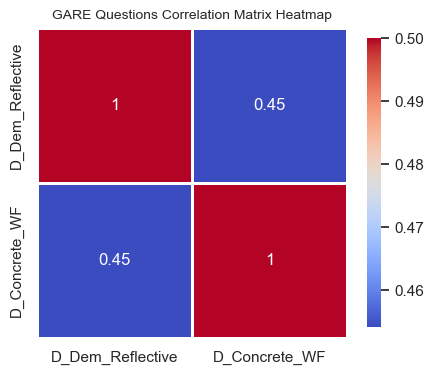

,D_Dem_Reflective,D_Concrete_WF
D_Dem_Reflective,1.0000,0.4542
D_Concrete_WF,0.4542,1.0000


In [61]:
# Subset of Workforce Equity Sub-Category factors correlation Analysis
cat_GARE_df8 = cat_GARE_df1[['D_Dem_Reflective', 'D_Concrete_WF']]
# Using association_metrics library
import association_metrics as am
print(blue("========== Heatmap: Correlation matrix ============", ['bold']))
# Convert object columns to Category columns
df = cat_GARE_df8.apply(
        lambda x: x.astype("category") if x.dtype == "O" else x)
# Initialize a CramersV object using the pandas.DataFrame (df)
cramers_v = am.CramersV(df)
# It will return a pairwise matrix filled with Cramer's V, where 
# columns and index are the categorical variables of the passed     # pandas.DataFrame
cfit = cramers_v.fit().round(4)
##cfit1 = cfit[cfit>0.5]
#cfit
max_corr = 0.5
# Mask to get lower triangle
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True

#cmap = sns.cubehelix_palette(light=0.75, as_cmap=True)

# Draw the heatmap with the mask  
fig = plt.figure(figsize=(5, 5))

sns.heatmap(cfit, cmap="coolwarm", vmax=max_corr, square=True, linewidths=.75, cbar_kws={"shrink": .75}, annot=True)
plt.title('GARE Questions Correlation Matrix Heatmap', fontsize = 10) # title with fontsize 15
plt.show()
display(cfit)

In [62]:
# Selecting strong correlation pairs (magnitude greater than 0.5)
# s = cfit.unstack()
# so = s.sort_values(kind="quicksort")

# print(so)

========== Heatmap: Questions correlation matrix ============


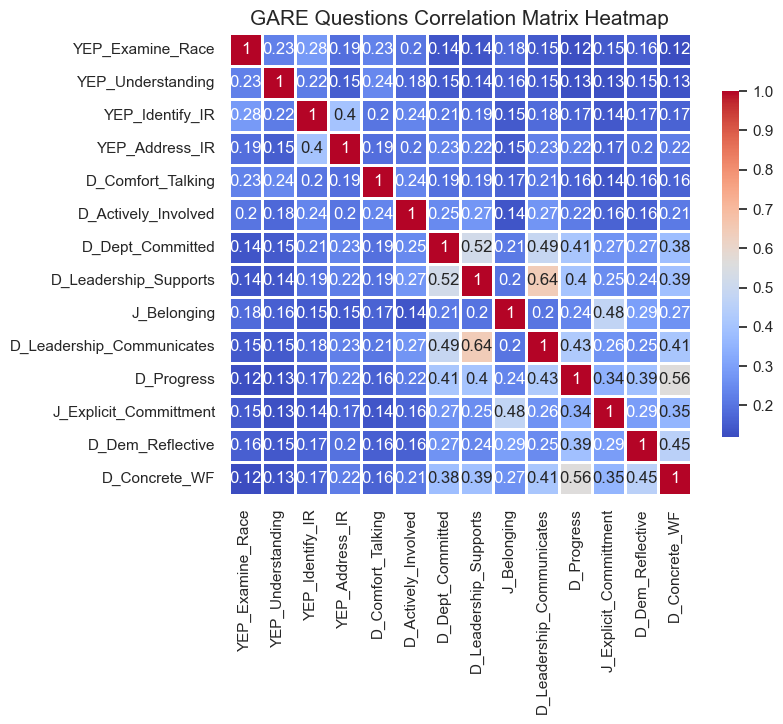

In [63]:
# Using association_metrics library
## All questions as a table.
import association_metrics as am
print(blue("========== Heatmap: Questions correlation matrix ============", ['bold']))
# Convert object columns to Category columns
df = data1.apply(
        lambda x: x.astype("category") if x.dtype == "O" else x)
# Initialize a CramersV object using the pandas.DataFrame (df)
cramers_v = am.CramersV(df)
# It will return a pairwise matrix filled with Cramer's V, where 
# columns and index are the categorical variables of the passed     # pandas.DataFrame
cfit = cramers_v.fit().round(4)
#cfit
max_corr = 1.0
# Mask to get lower triangle
# mask = np.zeros_like(corr, dtype=np.bool)
# mask[np.triu_indices_from(mask)] = True

#cmap = sns.cubehelix_palette(light=0.75, as_cmap=True)

# Draw the heatmap with the mask 
fig = plt.figure(figsize=(8, 6))

sns.heatmap(cfit, vmax=max_corr, cmap="coolwarm", square=True, linewidths=.75, cbar_kws={"shrink": .75}, annot=True)
plt.title('GARE Questions Correlation Matrix Heatmap', fontsize = 15) # title with fontsize 15
plt.show()

In [44]:
import sweetviz as sz
# generate report
sweet_report = sz.analyze(cat_GARE_df2)
 
# show the output
# sweetviz.show_notebook()
sweet_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [193]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df_av = AV.AutoViz(cat_GARE_df2)

Not able to read or load file. Please check your inputs and try again...


In [169]:
# Checking variables for the analysis
cat_GARE_df2.keys()

Index(['AY_Age', 'AY_Gender', 'AY_Manage_Supervise', 'AY_Work_Location',
       'Race_Eth', 'AY_City_Tenure', 'YEP_Examine_Race', 'YEP_Understanding',
       'AY_Disability', 'YEP_Identify_IR', 'YEP_Address_IR',
       'D_Comfort_Talking', 'D_Actively_Involved', 'D_Dept_Committed',
       'D_Leadership_Supports', 'J_Belonging', 'D_Leadership_Communicates',
       'D_Progress', 'J_Explicit_Committment', 'D_More_Active_If_1',
       'D_More_Active_If_2', 'D_More_Active_If_3', 'D_More_Active_If_4',
       'D_More_Active_If_5', 'D_More_Active_If_6', 'D_More_Active_If_7',
       'D_Dem_Reflective', 'D_Concrete_WF'],
      dtype='object')

In [170]:
# Objects/Factors summary
print(blue("========== Table 4: Dataset Objects/Factors summarys ============", ['bold']))
rp.summary_cat(cat_GARE_df2[['AY_Age', 'AY_Gender', 'AY_Manage_Supervise', 'AY_Work_Location', 'Race_Eth', 'AY_City_Tenure', 
                             'YEP_Examine_Race', 'YEP_Understanding', 'AY_Disability', 'YEP_Identify_IR', 'YEP_Address_IR', 
                             'D_Comfort_Talking', 'D_Actively_Involved', 'D_Dept_Committed', 'D_Leadership_Supports', 'J_Belonging', 
                             'D_Leadership_Communicates', 'D_Progress', 'J_Explicit_Committment', 'D_More_Active_If_1', 
                             'D_More_Active_If_2', 'D_More_Active_If_3', 'D_More_Active_If_4', 'D_More_Active_If_5', 'D_More_Active_If_6',
                             'D_More_Active_If_7', 'D_Dem_Reflective', 'D_Concrete_WF']])

========== Table 4: Dataset Objects/Factors summarys ============


,Variable,Outcome,Count,Percent
0,AY_Age,45-54,510,27.55
1,,35-44,420,22.69
2,,55-64,392,21.18
3,,25-34,210,11.35
4,,No response,204,11.02
5,,65+,79,4.27
6,,18-24,36,1.94
7,AY_Gender,Male,837,45.22
8,,Female,704,38.03
9,,No response,184,9.94


In [171]:
# Checking Data Type & Null Counts
cat_GARE_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1851 entries, 0 to 1850
Data columns (total 28 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   AY_Age                     1851 non-null   object
 1   AY_Gender                  1851 non-null   object
 2   AY_Manage_Supervise        1851 non-null   object
 3   AY_Work_Location           1851 non-null   object
 4   Race_Eth                   1851 non-null   object
 5   AY_City_Tenure             1851 non-null   object
 6   YEP_Examine_Race           1851 non-null   object
 7   YEP_Understanding          1851 non-null   object
 8   AY_Disability              1851 non-null   object
 9   YEP_Identify_IR            1851 non-null   object
 10  YEP_Address_IR             1851 non-null   object
 11  D_Comfort_Talking          1851 non-null   object
 12  D_Actively_Involved        1851 non-null   object
 13  D_Dept_Committed           1851 non-null   object
 14  D_Leader

In [200]:
profile = ProfileReport(cat_GARE_df2,
                        title="GARE Data Analysis",
                        explorative=True,
                        plot={"dpi": 300, "image_format": "svg", "cat_frequency":{"show": "true","type":"pie"}},
                        #cat_frequency={"type":"pie"},
        dataset={
        "description": "This profiling report was generated for Equity Department",
        "copyright_holder": "City of Tucson",
        "url": "https://www.tucsonaz.gov/city-manager"
    },
        variables={
        "descriptions": {
            "AY_Age": "What is your age?",
            "AY_Gender": "What is your gender?",
            "Race": "What is your race/ethnicity",
            "AY_Manage_Supervise": "Do you manage or supervise people?",
            "AY_Work_Location": "Do you work primarily: ",
            "AY_Disability": "Do you have a disability?",
            "YEP_Examine_Race": "I think it is valuable to examine and discuss the impacts of race.",
            "YEP_Understanding": "I have a basic understanding of concepts related to racial equity.",
            "YEP_Identify_IR": "I can identify examples of institutional racism (i.e., when organizational programs or policies work better for white people than for people of color, regardless of intention).",
            "YEP_Address_IR": "I have the tools to address institutional racism in my workplace.",
            "D_Comfort_Talking": "I feel comfortable talking about race.",
            "D_Actively_Involved": "I am actively involved in advancing racial equity in my work.",
            "D_Dept_Committed": "My department is committed to racial equity.",
            "D_Leadership_Supports": "Leadership in my department participates in and supports conversations about racial equity.",
            "J_Belonging": "I feel a sense of belonging in the city.",
        }
    },)
profile.to_file("GARE_Analysis.html") 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [172]:
display(cat_GARE_df2.head(n=3))

,AY_Age,AY_Gender,AY_Manage_Supervise,AY_Work_Location,Race_Eth,AY_City_Tenure,YEP_Examine_Race,YEP_Understanding,AY_Disability,YEP_Identify_IR,...,J_Explicit_Committment,D_More_Active_If_1,D_More_Active_If_2,D_More_Active_If_3,D_More_Active_If_4,D_More_Active_If_5,D_More_Active_If_6,D_More_Active_If_7,D_Dem_Reflective,D_Concrete_WF
0,No response,No response,No response,No response,No response,No response,Somewhat agree,Agree,No response,Somewhat agree,...,Agree,No,No,No,No,No,No,Yes,Agree,Agree
1,35-44,Male,No,Not in an office environment,Hispanic/Latino,1-5 years,Strongly agree,Strongly agree,No,Strongly agree,...,Somewhat agree,Yes,Yes,Yes,Yes,No,Yes,No,Somewhat agree,Don't know
2,55-64,Male,No,No response,White,11-20 years,Somewhat agree,Agree,No,Agree,...,Strongly agree,No,No,No,No,No,No,Yes,Agree,Don't know


In [202]:
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter('GARE_data_clean.xlsx', engine='xlsxwriter')

# Write dataframe to new sheet
cat_GARE_df2.to_excel(writer, sheet_name='Gare_data')

# Close the Pandas Excel writer and output the Excel file.
writer.save()

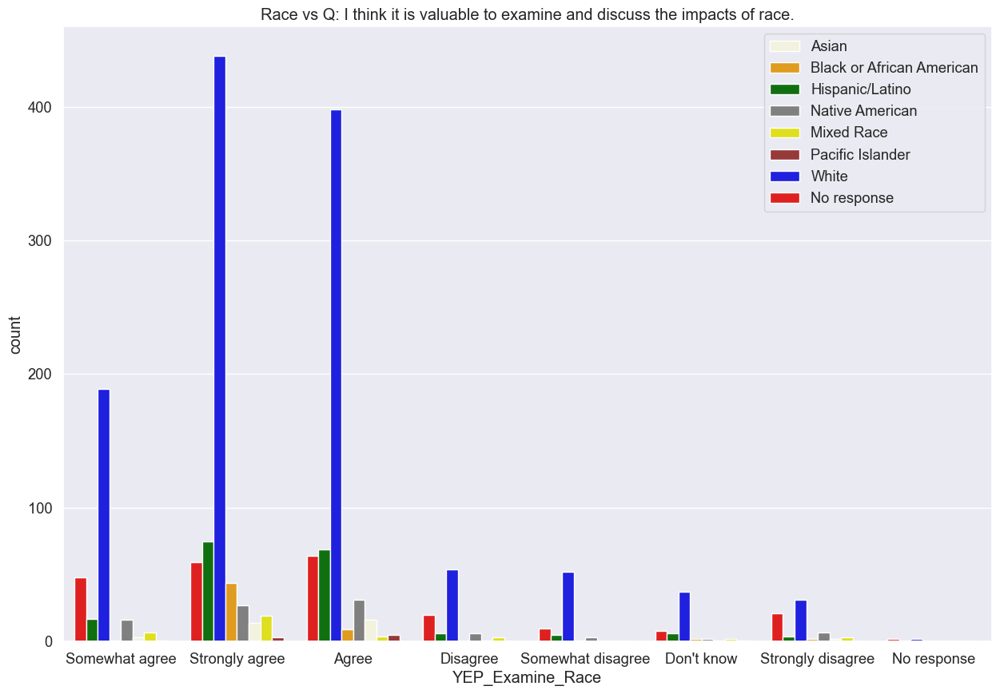

In [203]:
# Bar plot: Race vs Q: I think it is valuable to examine and discuss the impacts of race. 
color = ['red','green','blue','orange','grey','beige', 'yellow', 'brown', 'lime', 'cyan', 'black']
sns.countplot(x='YEP_Examine_Race', hue='Race_Eth', palette = color, data=cat_GARE_df2)
plt.title('Race vs Q: I think it is valuable to examine and discuss the impacts of race.')
# reordering the labels
handles, labels = plt.gca().get_legend_handles_labels()
  
# specify order
order = [5,3,1,4,6,7,2,0]
  
# pass handle & labels lists along with order as below
plt.legend([handles[i] for i in order], [labels[i] for i in order])
plt.show()


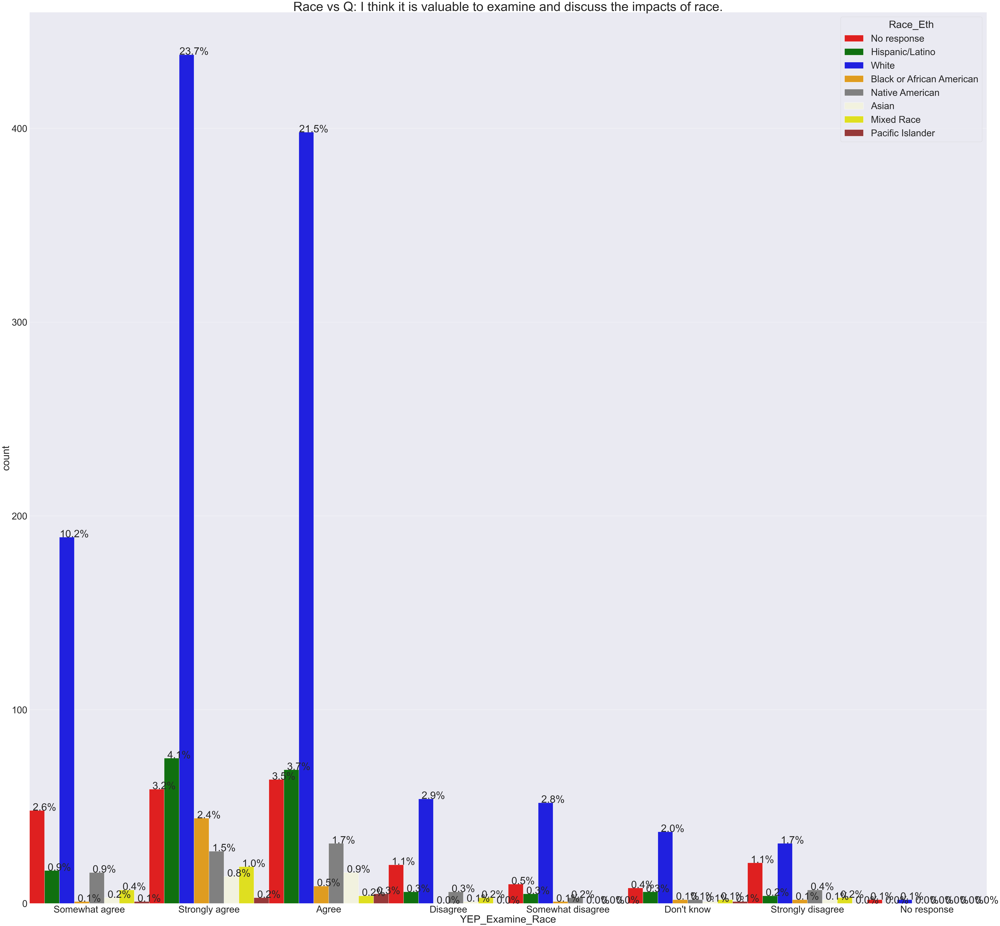

In [204]:
# Bar plot: Race vs Q: I think it is valuable to examine and discuss the impacts of race with %
sns.set(font_scale=4)
color = ['red','green','blue','orange','grey','beige', 'yellow', 'brown', 'lime', 'cyan', 'black']
plt.figure(figsize=(80,75))
total = float(len(cat_GARE_df2))
ax = sns.countplot(x='YEP_Examine_Race', hue='Race_Eth', width=1, palette = color, data=cat_GARE_df2)
plt.title('Race vs Q: I think it is valuable to examine and discuss the impacts of race.', fontsize=60)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y),ha='center')
plt.show()


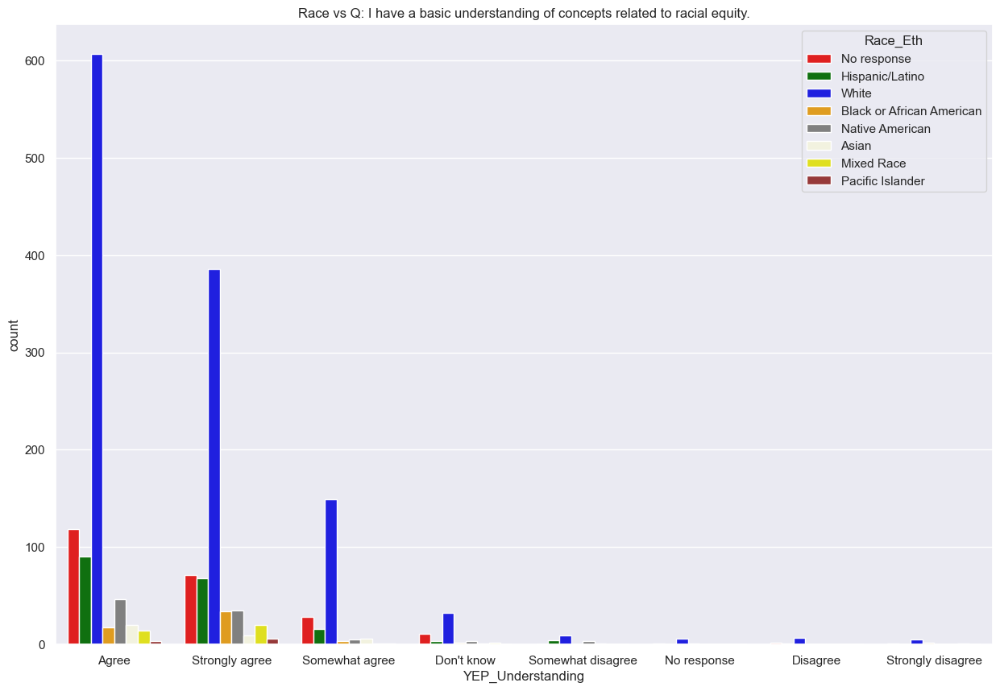

In [205]:
# Bar plot: Race vs Q: I have a basic understanding of concepts related to racial equity.
sns.set(font_scale=1)
color = ['red','green','blue','orange','grey','beige', 'yellow', 'brown', 'lime', 'cyan', 'black']
sns.countplot(x='YEP_Understanding', hue='Race_Eth', palette = color, data=cat_GARE_df2)
plt.title('Race vs Q: I have a basic understanding of concepts related to racial equity.')
plt.show()

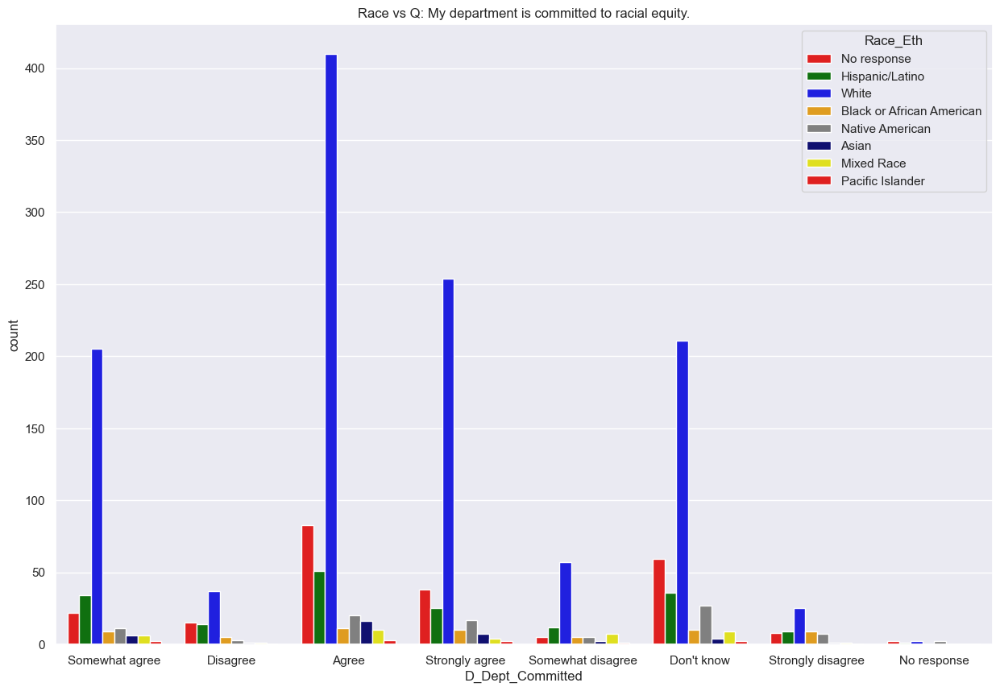

In [206]:
# Bar plot: Race vs Q: Race vs Q: My department is committed to racial equity.
sns.set(font_scale=1)
color = ['red','green','blue','orange','grey','navy', 'yellow']
sns.countplot(x='D_Dept_Committed', hue='Race_Eth', palette = color, data=cat_GARE_df2)
plt.title('Race vs Q: My department is committed to racial equity.')
plt.show()


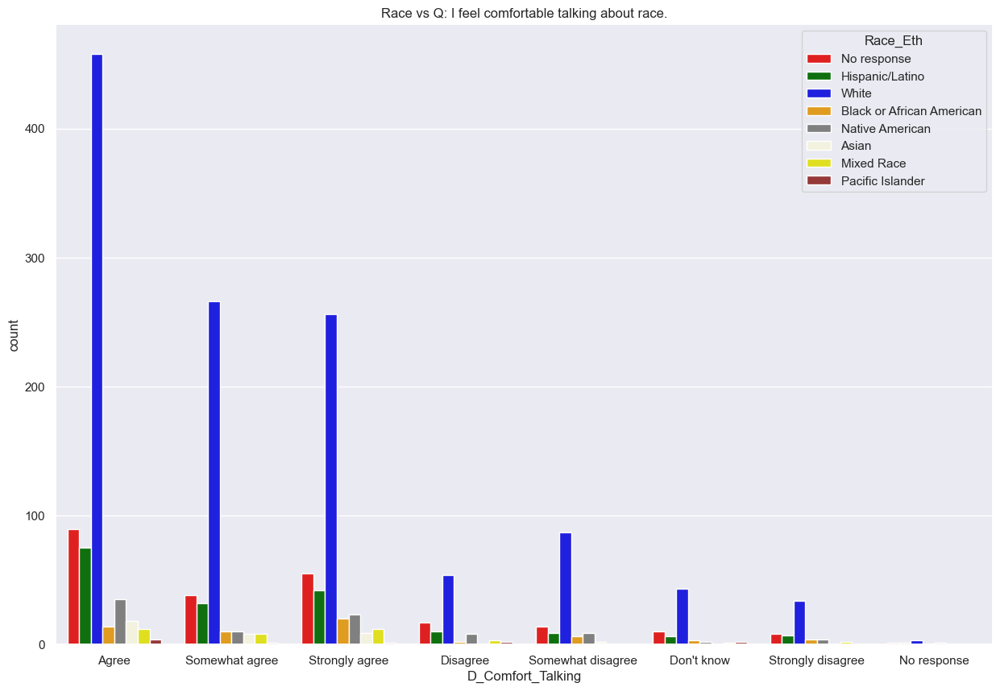

In [207]:
# Bar plot: Race vs Q: Q: I feel comfortable talking about race.
sns.set(font_scale=1)
color = ['red','green','blue','orange','grey','beige', 'yellow', 'brown', 'lime', 'cyan', 'black']
sns.countplot(x='D_Comfort_Talking', hue='Race_Eth', palette = color, data=cat_GARE_df2)
plt.title('Race vs Q: I feel comfortable talking about race.')
plt.show()

In [185]:
def cross_tab(data_frame, id_col):
    col_names=['YEP_Examine_Race', 'YEP_Understanding', 'YEP_Identify_IR', 'YEP_Address_IR', 'D_Comfort_Talking',
               'D_Actively_Involved', 'D_Dept_Committed', 'D_Leadership_Supports','J_Belonging',
               'D_Leadership_Communicates', 'D_Progress', 'J_Explicit_Committment', 'D_More_Active_If_1', 
               'D_More_Active_If_2', 'D_More_Active_If_3', 'D_More_Active_If_4', 'D_More_Active_If_5', 'D_More_Active_If_6',
               'D_More_Active_If_7', 'D_Dem_Reflective', 'D_Concrete_WF']
    datasets = {}
    for i in col_names:
#         datasets[i] = pd.crosstab(data_frame[id_col], data_frame[i], margins = True)
        datasets['crosstab_{}'.format(i)] = pd.crosstab(data_frame[id_col], data_frame[i])
#         datasets1['crosstab_{}'.format(i)] = pd.crosstab(data_frame[id_col], data_frame[i], normalize=True, 
#             margins=True, margins_name='Total').style.format('{:.2%}')
    return datasets
storage = cross_tab(cat_GARE_df2, "Race_Eth")

def cross_tab_p(data_frame, id_col):
    col_names=['YEP_Examine_Race', 'YEP_Understanding', 'YEP_Identify_IR', 'YEP_Address_IR', 'D_Comfort_Talking',
               'D_Actively_Involved', 'D_Dept_Committed', 'D_Leadership_Supports','J_Belonging',
               'D_Leadership_Communicates', 'D_Progress', 'J_Explicit_Committment', 'D_More_Active_If_1', 
               'D_More_Active_If_2', 'D_More_Active_If_3', 'D_More_Active_If_4', 'D_More_Active_If_5', 'D_More_Active_If_6',
               'D_More_Active_If_7', 'D_Dem_Reflective', 'D_Concrete_WF']
    datasets1 = {}
    for i in col_names:
#         datasets[i] = pd.crosstab(data_frame[id_col], data_frame[i], margins = True)
#
        datasets1['crosstab_{}'.format(i)] = pd.crosstab(data_frame[id_col], data_frame[i], normalize=True, 
            margins=True, margins_name='Total').style.format('{:.2%}')
    return datasets1
storage1 = cross_tab_p(cat_GARE_df2, "Race_Eth")

In [186]:
storage.keys()

dict_keys(['crosstab_YEP_Examine_Race', 'crosstab_YEP_Understanding', 'crosstab_YEP_Identify_IR', 'crosstab_YEP_Address_IR', 'crosstab_D_Comfort_Talking', 'crosstab_D_Actively_Involved', 'crosstab_D_Dept_Committed', 'crosstab_D_Leadership_Supports', 'crosstab_J_Belonging', 'crosstab_D_Leadership_Communicates', 'crosstab_D_Progress', 'crosstab_J_Explicit_Committment', 'crosstab_D_More_Active_If_1', 'crosstab_D_More_Active_If_2', 'crosstab_D_More_Active_If_3', 'crosstab_D_More_Active_If_4', 'crosstab_D_More_Active_If_5', 'crosstab_D_More_Active_If_6', 'crosstab_D_More_Active_If_7', 'crosstab_D_Dem_Reflective', 'crosstab_D_Concrete_WF'])

In [187]:
storage1.keys()

dict_keys(['crosstab_YEP_Examine_Race', 'crosstab_YEP_Understanding', 'crosstab_YEP_Identify_IR', 'crosstab_YEP_Address_IR', 'crosstab_D_Comfort_Talking', 'crosstab_D_Actively_Involved', 'crosstab_D_Dept_Committed', 'crosstab_D_Leadership_Supports', 'crosstab_J_Belonging', 'crosstab_D_Leadership_Communicates', 'crosstab_D_Progress', 'crosstab_J_Explicit_Committment', 'crosstab_D_More_Active_If_1', 'crosstab_D_More_Active_If_2', 'crosstab_D_More_Active_If_3', 'crosstab_D_More_Active_If_4', 'crosstab_D_More_Active_If_5', 'crosstab_D_More_Active_If_6', 'crosstab_D_More_Active_If_7', 'crosstab_D_Dem_Reflective', 'crosstab_D_Concrete_WF'])

In [188]:
# Contigency Tables with Counts - No Margins
from simple_colors import *
print(blue('========== Contigency Tables (Counts): Race vs Survey Questions ============', ['bold']))
for k in storage.keys():
    #storage[k].to_csv(r'C:\Users\JNduway1\OneDrive - City of Tucson\Desktop\GAREContbl.csv', index=True, header = True) 
    display(storage[k])
# for k in storage.keys():
#    print(storage[k])

========== Contigency Tables (Counts): Race vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,16,1,1,0,3,0,14,2
Black or African American,9,0,2,0,1,1,44,2
Hispanic/Latino,69,6,6,0,17,5,75,4
Mixed Race,4,3,2,0,7,0,19,3
Native American,31,6,2,0,16,3,27,7
No response,64,20,8,2,48,10,59,21
Pacific Islander,5,0,1,0,1,0,3,0
White,398,54,37,2,189,52,438,31


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,20,0,1,0,6,1,9,0
Black or African American,17,0,2,1,3,0,34,2
Hispanic/Latino,90,1,3,0,16,4,68,0
Mixed Race,14,0,2,0,1,0,20,1
Native American,46,0,3,0,5,3,35,0
No response,118,2,11,1,28,0,71,1
Pacific Islander,3,0,0,0,1,0,6,0
White,607,7,32,6,149,9,386,5


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,12,2,6,0,9,1,5,2
Black or African American,16,1,1,0,5,1,30,5
Hispanic/Latino,52,15,18,0,37,10,48,2
Mixed Race,9,1,2,1,6,3,11,5
Native American,19,7,8,1,21,4,25,7
No response,52,29,32,1,40,11,29,38
Pacific Islander,3,1,0,0,3,0,2,1
White,371,109,105,1,267,70,197,81


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,6,3,3,11,10,2,1,1
Black or African American,8,6,5,7,10,9,3,11
Hispanic/Latino,43,5,16,45,41,15,11,6
Mixed Race,6,1,1,12,5,5,4,4
Native American,11,10,9,27,17,9,8,1
No response,33,9,12,111,33,11,17,6
Pacific Islander,1,1,1,2,4,0,1,0
White,238,71,82,365,250,95,85,15


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,18,0,0,0,8,2,9,0
Black or African American,14,2,3,0,10,6,20,4
Hispanic/Latino,75,10,6,1,32,9,42,7
Mixed Race,12,3,1,0,8,0,12,2
Native American,35,8,2,1,10,9,23,4
No response,89,17,10,1,38,14,55,8
Pacific Islander,4,2,2,0,1,0,1,0
White,458,54,43,3,266,87,256,34


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,6,4,3,0,10,6,5,3
Black or African American,9,11,3,0,11,5,9,11
Hispanic/Latino,40,28,29,1,38,19,19,8
Mixed Race,6,3,4,0,11,5,6,3
Native American,18,17,11,1,12,12,12,9
No response,45,46,37,3,47,19,16,19
Pacific Islander,0,2,3,0,2,0,2,1
White,239,163,223,4,308,105,100,59


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,16,1,4,0,6,2,7,1
Black or African American,11,5,10,0,9,5,10,9
Hispanic/Latino,51,14,36,1,34,12,25,9
Mixed Race,10,1,9,0,6,7,4,1
Native American,20,3,27,2,11,5,17,7
No response,83,15,59,2,22,5,38,8
Pacific Islander,3,0,2,0,2,1,2,0
White,410,37,211,2,205,57,254,25


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,10,2,7,0,5,3,9,1
Black or African American,12,3,14,0,7,4,7,12
Hispanic/Latino,46,17,49,0,23,15,15,17
Mixed Race,8,3,10,1,7,4,3,2
Native American,16,7,24,2,12,6,11,14
No response,53,16,74,4,29,11,30,15
Pacific Islander,2,1,3,0,1,1,2,0
White,317,66,323,3,207,76,169,40


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,14,0,0,1,9,5,8,0
Black or African American,11,6,2,0,20,6,6,8
Hispanic/Latino,73,9,12,0,38,10,29,11
Mixed Race,10,3,2,0,4,6,9,4
Native American,27,7,3,1,14,14,19,7
No response,28,16,10,115,28,12,13,10
Pacific Islander,3,0,2,0,3,1,1,0
White,481,50,50,4,275,66,221,54


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,7,7,5,0,7,3,7,1
Black or African American,9,7,11,0,6,3,6,17
Hispanic/Latino,34,21,45,1,31,18,15,17
Mixed Race,6,3,7,1,8,7,3,3
Native American,18,16,20,3,13,5,7,10
No response,50,26,62,5,39,13,20,17
Pacific Islander,2,2,2,0,3,0,1,0
White,305,109,268,3,240,82,142,52


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,9,3,13,0,8,1,2,1
Black or African American,4,12,17,0,7,4,4,11
Hispanic/Latino,31,13,73,0,29,14,11,11
Mixed Race,3,2,12,0,9,7,3,2
Native American,12,8,41,1,16,2,6,6
No response,34,11,90,25,35,10,18,9
Pacific Islander,2,1,4,0,3,0,0,0
White,284,50,452,2,245,66,77,25


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,12,1,5,1,14,0,3,1
Black or African American,9,4,8,0,15,9,8,6
Hispanic/Latino,41,14,38,1,44,15,17,12
Mixed Race,8,3,8,0,11,5,1,2
Native American,21,13,16,2,23,7,6,4
No response,26,5,36,115,17,6,16,11
Pacific Islander,3,0,4,0,1,0,1,1
White,383,45,266,4,271,68,136,28


D_More_Active_If_1,No,Yes
Race_Eth,,
Asian,22,15
Black or African American,34,25
Hispanic/Latino,107,75
Mixed Race,24,14
Native American,57,35
No response,177,55
Pacific Islander,5,5
White,730,471


D_More_Active_If_2,No,Yes
Race_Eth,,
Asian,22,15
Black or African American,36,23
Hispanic/Latino,113,69
Mixed Race,24,14
Native American,73,19
No response,184,48
Pacific Islander,5,5
White,867,334


D_More_Active_If_3,No,Yes
Race_Eth,,
Asian,28,9
Black or African American,40,19
Hispanic/Latino,140,42
Mixed Race,27,11
Native American,78,14
No response,202,30
Pacific Islander,6,4
White,960,241


D_More_Active_If_4,No,Yes
Race_Eth,,
Asian,31,6
Black or African American,35,24
Hispanic/Latino,139,43
Mixed Race,26,12
Native American,72,20
No response,208,24
Pacific Islander,7,3
White,1017,184


D_More_Active_If_5,No,Yes
Race_Eth,,
Asian,26,11
Black or African American,41,18
Hispanic/Latino,150,32
Mixed Race,29,9
Native American,83,9
No response,212,20
Pacific Islander,7,3
White,1036,165


D_More_Active_If_6,No,Yes
Race_Eth,,
Asian,31,6
Black or African American,41,18
Hispanic/Latino,146,36
Mixed Race,27,11
Native American,67,25
No response,182,50
Pacific Islander,7,3
White,998,203


D_More_Active_If_7,No,Yes
Race_Eth,,
Asian,26,11
Black or African American,44,15
Hispanic/Latino,118,64
Mixed Race,27,11
Native American,66,26
No response,130,102
Pacific Islander,4,6
White,724,477


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,9,2,4,0,12,4,5,1
Black or African American,6,9,5,0,11,4,12,12
Hispanic/Latino,52,15,35,0,41,17,12,10
Mixed Race,10,1,5,0,9,5,6,2
Native American,18,9,9,0,23,8,20,5
No response,52,13,31,35,39,19,33,10
Pacific Islander,4,0,3,0,0,1,1,1
White,358,90,148,2,316,78,170,39


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,8,1,14,0,8,4,1,1
Black or African American,7,10,19,0,7,3,3,10
Hispanic/Latino,34,17,71,1,23,13,10,13
Mixed Race,3,4,15,0,6,4,4,2
Native American,14,6,39,1,16,4,6,6
No response,26,13,93,37,28,9,13,13
Pacific Islander,2,0,4,0,2,0,1,1
White,269,61,527,4,170,55,81,34


In [189]:
# Contigency Tables with Percentages
from simple_colors import *
print(blue('========== Contigency Tables (%): Race vs Survey Questions ============', ['bold']))
for k in storage1.keys():
   display(storage1[k])
# for k in storage.keys():
#    print(storage[k])

========== Contigency Tables (%): Race vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.86%,0.05%,0.05%,0.00%,0.16%,0.00%,0.76%,0.11%,2.00%
Black or African American,0.49%,0.00%,0.11%,0.00%,0.05%,0.05%,2.38%,0.11%,3.19%
Hispanic/Latino,3.73%,0.32%,0.32%,0.00%,0.92%,0.27%,4.05%,0.22%,9.83%
Mixed Race,0.22%,0.16%,0.11%,0.00%,0.38%,0.00%,1.03%,0.16%,2.05%
Native American,1.67%,0.32%,0.11%,0.00%,0.86%,0.16%,1.46%,0.38%,4.97%
No response,3.46%,1.08%,0.43%,0.11%,2.59%,0.54%,3.19%,1.13%,12.53%
Pacific Islander,0.27%,0.00%,0.05%,0.00%,0.05%,0.00%,0.16%,0.00%,0.54%
White,21.50%,2.92%,2.00%,0.11%,10.21%,2.81%,23.66%,1.67%,64.88%
Total,32.20%,4.86%,3.19%,0.22%,15.24%,3.84%,36.68%,3.78%,100.00%


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,1.08%,0.00%,0.05%,0.00%,0.32%,0.05%,0.49%,0.00%,2.00%
Black or African American,0.92%,0.00%,0.11%,0.05%,0.16%,0.00%,1.84%,0.11%,3.19%
Hispanic/Latino,4.86%,0.05%,0.16%,0.00%,0.86%,0.22%,3.67%,0.00%,9.83%
Mixed Race,0.76%,0.00%,0.11%,0.00%,0.05%,0.00%,1.08%,0.05%,2.05%
Native American,2.49%,0.00%,0.16%,0.00%,0.27%,0.16%,1.89%,0.00%,4.97%
No response,6.37%,0.11%,0.59%,0.05%,1.51%,0.00%,3.84%,0.05%,12.53%
Pacific Islander,0.16%,0.00%,0.00%,0.00%,0.05%,0.00%,0.32%,0.00%,0.54%
White,32.79%,0.38%,1.73%,0.32%,8.05%,0.49%,20.85%,0.27%,64.88%
Total,49.43%,0.54%,2.92%,0.43%,11.29%,0.92%,33.98%,0.49%,100.00%


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.65%,0.11%,0.32%,0.00%,0.49%,0.05%,0.27%,0.11%,2.00%
Black or African American,0.86%,0.05%,0.05%,0.00%,0.27%,0.05%,1.62%,0.27%,3.19%
Hispanic/Latino,2.81%,0.81%,0.97%,0.00%,2.00%,0.54%,2.59%,0.11%,9.83%
Mixed Race,0.49%,0.05%,0.11%,0.05%,0.32%,0.16%,0.59%,0.27%,2.05%
Native American,1.03%,0.38%,0.43%,0.05%,1.13%,0.22%,1.35%,0.38%,4.97%
No response,2.81%,1.57%,1.73%,0.05%,2.16%,0.59%,1.57%,2.05%,12.53%
Pacific Islander,0.16%,0.05%,0.00%,0.00%,0.16%,0.00%,0.11%,0.05%,0.54%
White,20.04%,5.89%,5.67%,0.05%,14.42%,3.78%,10.64%,4.38%,64.88%
Total,28.85%,8.91%,9.29%,0.22%,20.96%,5.40%,18.75%,7.62%,100.00%


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.32%,0.16%,0.16%,0.59%,0.54%,0.11%,0.05%,0.05%,2.00%
Black or African American,0.43%,0.32%,0.27%,0.38%,0.54%,0.49%,0.16%,0.59%,3.19%
Hispanic/Latino,2.32%,0.27%,0.86%,2.43%,2.22%,0.81%,0.59%,0.32%,9.83%
Mixed Race,0.32%,0.05%,0.05%,0.65%,0.27%,0.27%,0.22%,0.22%,2.05%
Native American,0.59%,0.54%,0.49%,1.46%,0.92%,0.49%,0.43%,0.05%,4.97%
No response,1.78%,0.49%,0.65%,6.00%,1.78%,0.59%,0.92%,0.32%,12.53%
Pacific Islander,0.05%,0.05%,0.05%,0.11%,0.22%,0.00%,0.05%,0.00%,0.54%
White,12.86%,3.84%,4.43%,19.72%,13.51%,5.13%,4.59%,0.81%,64.88%
Total,18.69%,5.73%,6.97%,31.33%,19.99%,7.89%,7.02%,2.38%,100.00%


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.97%,0.00%,0.00%,0.00%,0.43%,0.11%,0.49%,0.00%,2.00%
Black or African American,0.76%,0.11%,0.16%,0.00%,0.54%,0.32%,1.08%,0.22%,3.19%
Hispanic/Latino,4.05%,0.54%,0.32%,0.05%,1.73%,0.49%,2.27%,0.38%,9.83%
Mixed Race,0.65%,0.16%,0.05%,0.00%,0.43%,0.00%,0.65%,0.11%,2.05%
Native American,1.89%,0.43%,0.11%,0.05%,0.54%,0.49%,1.24%,0.22%,4.97%
No response,4.81%,0.92%,0.54%,0.05%,2.05%,0.76%,2.97%,0.43%,12.53%
Pacific Islander,0.22%,0.11%,0.11%,0.00%,0.05%,0.00%,0.05%,0.00%,0.54%
White,24.74%,2.92%,2.32%,0.16%,14.37%,4.70%,13.83%,1.84%,64.88%
Total,38.09%,5.19%,3.62%,0.32%,20.15%,6.86%,22.58%,3.19%,100.00%


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.32%,0.22%,0.16%,0.00%,0.54%,0.32%,0.27%,0.16%,2.00%
Black or African American,0.49%,0.59%,0.16%,0.00%,0.59%,0.27%,0.49%,0.59%,3.19%
Hispanic/Latino,2.16%,1.51%,1.57%,0.05%,2.05%,1.03%,1.03%,0.43%,9.83%
Mixed Race,0.32%,0.16%,0.22%,0.00%,0.59%,0.27%,0.32%,0.16%,2.05%
Native American,0.97%,0.92%,0.59%,0.05%,0.65%,0.65%,0.65%,0.49%,4.97%
No response,2.43%,2.49%,2.00%,0.16%,2.54%,1.03%,0.86%,1.03%,12.53%
Pacific Islander,0.00%,0.11%,0.16%,0.00%,0.11%,0.00%,0.11%,0.05%,0.54%
White,12.91%,8.81%,12.05%,0.22%,16.64%,5.67%,5.40%,3.19%,64.88%
Total,19.61%,14.80%,16.91%,0.49%,23.72%,9.24%,9.13%,6.10%,100.00%


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.86%,0.05%,0.22%,0.00%,0.32%,0.11%,0.38%,0.05%,2.00%
Black or African American,0.59%,0.27%,0.54%,0.00%,0.49%,0.27%,0.54%,0.49%,3.19%
Hispanic/Latino,2.76%,0.76%,1.94%,0.05%,1.84%,0.65%,1.35%,0.49%,9.83%
Mixed Race,0.54%,0.05%,0.49%,0.00%,0.32%,0.38%,0.22%,0.05%,2.05%
Native American,1.08%,0.16%,1.46%,0.11%,0.59%,0.27%,0.92%,0.38%,4.97%
No response,4.48%,0.81%,3.19%,0.11%,1.19%,0.27%,2.05%,0.43%,12.53%
Pacific Islander,0.16%,0.00%,0.11%,0.00%,0.11%,0.05%,0.11%,0.00%,0.54%
White,22.15%,2.00%,11.40%,0.11%,11.08%,3.08%,13.72%,1.35%,64.88%
Total,32.63%,4.11%,19.34%,0.38%,15.94%,5.08%,19.29%,3.24%,100.00%


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.54%,0.11%,0.38%,0.00%,0.27%,0.16%,0.49%,0.05%,2.00%
Black or African American,0.65%,0.16%,0.76%,0.00%,0.38%,0.22%,0.38%,0.65%,3.19%
Hispanic/Latino,2.49%,0.92%,2.65%,0.00%,1.24%,0.81%,0.81%,0.92%,9.83%
Mixed Race,0.43%,0.16%,0.54%,0.05%,0.38%,0.22%,0.16%,0.11%,2.05%
Native American,0.86%,0.38%,1.30%,0.11%,0.65%,0.32%,0.59%,0.76%,4.97%
No response,2.86%,0.86%,4.00%,0.22%,1.57%,0.59%,1.62%,0.81%,12.53%
Pacific Islander,0.11%,0.05%,0.16%,0.00%,0.05%,0.05%,0.11%,0.00%,0.54%
White,17.13%,3.57%,17.45%,0.16%,11.18%,4.11%,9.13%,2.16%,64.88%
Total,25.07%,6.21%,27.23%,0.54%,15.72%,6.48%,13.29%,5.46%,100.00%


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.76%,0.00%,0.00%,0.05%,0.49%,0.27%,0.43%,0.00%,2.00%
Black or African American,0.59%,0.32%,0.11%,0.00%,1.08%,0.32%,0.32%,0.43%,3.19%
Hispanic/Latino,3.94%,0.49%,0.65%,0.00%,2.05%,0.54%,1.57%,0.59%,9.83%
Mixed Race,0.54%,0.16%,0.11%,0.00%,0.22%,0.32%,0.49%,0.22%,2.05%
Native American,1.46%,0.38%,0.16%,0.05%,0.76%,0.76%,1.03%,0.38%,4.97%
No response,1.51%,0.86%,0.54%,6.21%,1.51%,0.65%,0.70%,0.54%,12.53%
Pacific Islander,0.16%,0.00%,0.11%,0.00%,0.16%,0.05%,0.05%,0.00%,0.54%
White,25.99%,2.70%,2.70%,0.22%,14.86%,3.57%,11.94%,2.92%,64.88%
Total,34.95%,4.92%,4.38%,6.54%,21.12%,6.48%,16.53%,5.08%,100.00%


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.38%,0.38%,0.27%,0.00%,0.38%,0.16%,0.38%,0.05%,2.00%
Black or African American,0.49%,0.38%,0.59%,0.00%,0.32%,0.16%,0.32%,0.92%,3.19%
Hispanic/Latino,1.84%,1.13%,2.43%,0.05%,1.67%,0.97%,0.81%,0.92%,9.83%
Mixed Race,0.32%,0.16%,0.38%,0.05%,0.43%,0.38%,0.16%,0.16%,2.05%
Native American,0.97%,0.86%,1.08%,0.16%,0.70%,0.27%,0.38%,0.54%,4.97%
No response,2.70%,1.40%,3.35%,0.27%,2.11%,0.70%,1.08%,0.92%,12.53%
Pacific Islander,0.11%,0.11%,0.11%,0.00%,0.16%,0.00%,0.05%,0.00%,0.54%
White,16.48%,5.89%,14.48%,0.16%,12.97%,4.43%,7.67%,2.81%,64.88%
Total,23.28%,10.32%,22.69%,0.70%,18.75%,7.08%,10.86%,6.32%,100.00%


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.49%,0.16%,0.70%,0.00%,0.43%,0.05%,0.11%,0.05%,2.00%
Black or African American,0.22%,0.65%,0.92%,0.00%,0.38%,0.22%,0.22%,0.59%,3.19%
Hispanic/Latino,1.67%,0.70%,3.94%,0.00%,1.57%,0.76%,0.59%,0.59%,9.83%
Mixed Race,0.16%,0.11%,0.65%,0.00%,0.49%,0.38%,0.16%,0.11%,2.05%
Native American,0.65%,0.43%,2.22%,0.05%,0.86%,0.11%,0.32%,0.32%,4.97%
No response,1.84%,0.59%,4.86%,1.35%,1.89%,0.54%,0.97%,0.49%,12.53%
Pacific Islander,0.11%,0.05%,0.22%,0.00%,0.16%,0.00%,0.00%,0.00%,0.54%
White,15.34%,2.70%,24.42%,0.11%,13.24%,3.57%,4.16%,1.35%,64.88%
Total,20.48%,5.40%,37.93%,1.51%,19.02%,5.62%,6.54%,3.51%,100.00%


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.65%,0.05%,0.27%,0.05%,0.76%,0.00%,0.16%,0.05%,2.00%
Black or African American,0.49%,0.22%,0.43%,0.00%,0.81%,0.49%,0.43%,0.32%,3.19%
Hispanic/Latino,2.22%,0.76%,2.05%,0.05%,2.38%,0.81%,0.92%,0.65%,9.83%
Mixed Race,0.43%,0.16%,0.43%,0.00%,0.59%,0.27%,0.05%,0.11%,2.05%
Native American,1.13%,0.70%,0.86%,0.11%,1.24%,0.38%,0.32%,0.22%,4.97%
No response,1.40%,0.27%,1.94%,6.21%,0.92%,0.32%,0.86%,0.59%,12.53%
Pacific Islander,0.16%,0.00%,0.22%,0.00%,0.05%,0.00%,0.05%,0.05%,0.54%
White,20.69%,2.43%,14.37%,0.22%,14.64%,3.67%,7.35%,1.51%,64.88%
Total,27.17%,4.59%,20.58%,6.65%,21.39%,5.94%,10.16%,3.51%,100.00%


D_More_Active_If_1,No,Yes,Total
Race_Eth,,,
Asian,1.19%,0.81%,2.00%
Black or African American,1.84%,1.35%,3.19%
Hispanic/Latino,5.78%,4.05%,9.83%
Mixed Race,1.30%,0.76%,2.05%
Native American,3.08%,1.89%,4.97%
No response,9.56%,2.97%,12.53%
Pacific Islander,0.27%,0.27%,0.54%
White,39.44%,25.45%,64.88%
Total,62.45%,37.55%,100.00%


D_More_Active_If_2,No,Yes,Total
Race_Eth,,,
Asian,1.19%,0.81%,2.00%
Black or African American,1.94%,1.24%,3.19%
Hispanic/Latino,6.10%,3.73%,9.83%
Mixed Race,1.30%,0.76%,2.05%
Native American,3.94%,1.03%,4.97%
No response,9.94%,2.59%,12.53%
Pacific Islander,0.27%,0.27%,0.54%
White,46.84%,18.04%,64.88%
Total,71.53%,28.47%,100.00%


D_More_Active_If_3,No,Yes,Total
Race_Eth,,,
Asian,1.51%,0.49%,2.00%
Black or African American,2.16%,1.03%,3.19%
Hispanic/Latino,7.56%,2.27%,9.83%
Mixed Race,1.46%,0.59%,2.05%
Native American,4.21%,0.76%,4.97%
No response,10.91%,1.62%,12.53%
Pacific Islander,0.32%,0.22%,0.54%
White,51.86%,13.02%,64.88%
Total,80.01%,19.99%,100.00%


D_More_Active_If_4,No,Yes,Total
Race_Eth,,,
Asian,1.67%,0.32%,2.00%
Black or African American,1.89%,1.30%,3.19%
Hispanic/Latino,7.51%,2.32%,9.83%
Mixed Race,1.40%,0.65%,2.05%
Native American,3.89%,1.08%,4.97%
No response,11.24%,1.30%,12.53%
Pacific Islander,0.38%,0.16%,0.54%
White,54.94%,9.94%,64.88%
Total,82.93%,17.07%,100.00%


D_More_Active_If_5,No,Yes,Total
Race_Eth,,,
Asian,1.40%,0.59%,2.00%
Black or African American,2.22%,0.97%,3.19%
Hispanic/Latino,8.10%,1.73%,9.83%
Mixed Race,1.57%,0.49%,2.05%
Native American,4.48%,0.49%,4.97%
No response,11.45%,1.08%,12.53%
Pacific Islander,0.38%,0.16%,0.54%
White,55.97%,8.91%,64.88%
Total,85.58%,14.42%,100.00%


D_More_Active_If_6,No,Yes,Total
Race_Eth,,,
Asian,1.67%,0.32%,2.00%
Black or African American,2.22%,0.97%,3.19%
Hispanic/Latino,7.89%,1.94%,9.83%
Mixed Race,1.46%,0.59%,2.05%
Native American,3.62%,1.35%,4.97%
No response,9.83%,2.70%,12.53%
Pacific Islander,0.38%,0.16%,0.54%
White,53.92%,10.97%,64.88%
Total,80.98%,19.02%,100.00%


D_More_Active_If_7,No,Yes,Total
Race_Eth,,,
Asian,1.40%,0.59%,2.00%
Black or African American,2.38%,0.81%,3.19%
Hispanic/Latino,6.37%,3.46%,9.83%
Mixed Race,1.46%,0.59%,2.05%
Native American,3.57%,1.40%,4.97%
No response,7.02%,5.51%,12.53%
Pacific Islander,0.22%,0.32%,0.54%
White,39.11%,25.77%,64.88%
Total,61.53%,38.47%,100.00%


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.49%,0.11%,0.22%,0.00%,0.65%,0.22%,0.27%,0.05%,2.00%
Black or African American,0.32%,0.49%,0.27%,0.00%,0.59%,0.22%,0.65%,0.65%,3.19%
Hispanic/Latino,2.81%,0.81%,1.89%,0.00%,2.22%,0.92%,0.65%,0.54%,9.83%
Mixed Race,0.54%,0.05%,0.27%,0.00%,0.49%,0.27%,0.32%,0.11%,2.05%
Native American,0.97%,0.49%,0.49%,0.00%,1.24%,0.43%,1.08%,0.27%,4.97%
No response,2.81%,0.70%,1.67%,1.89%,2.11%,1.03%,1.78%,0.54%,12.53%
Pacific Islander,0.22%,0.00%,0.16%,0.00%,0.00%,0.05%,0.05%,0.05%,0.54%
White,19.34%,4.86%,8.00%,0.11%,17.07%,4.21%,9.18%,2.11%,64.88%
Total,27.50%,7.51%,12.97%,2.00%,24.37%,7.35%,13.99%,4.32%,100.00%


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,0.43%,0.05%,0.76%,0.00%,0.43%,0.22%,0.05%,0.05%,2.00%
Black or African American,0.38%,0.54%,1.03%,0.00%,0.38%,0.16%,0.16%,0.54%,3.19%
Hispanic/Latino,1.84%,0.92%,3.84%,0.05%,1.24%,0.70%,0.54%,0.70%,9.83%
Mixed Race,0.16%,0.22%,0.81%,0.00%,0.32%,0.22%,0.22%,0.11%,2.05%
Native American,0.76%,0.32%,2.11%,0.05%,0.86%,0.22%,0.32%,0.32%,4.97%
No response,1.40%,0.70%,5.02%,2.00%,1.51%,0.49%,0.70%,0.70%,12.53%
Pacific Islander,0.11%,0.00%,0.22%,0.00%,0.11%,0.00%,0.05%,0.05%,0.54%
White,14.53%,3.30%,28.47%,0.22%,9.18%,2.97%,4.38%,1.84%,64.88%
Total,19.61%,6.05%,42.25%,2.32%,14.05%,4.97%,6.43%,4.32%,100.00%


In [190]:
from scipy.stats import chi2_contingency
from scipy.stats import norm
from simple_colors import *
print(blue('========== Contigency Tables & Test of Association : Race vs Survey Questions ============', ['bold']))
for k in storage.keys():
# Race vs YEP_Examine_Race 
# Chi-square test of independence.
    c, p, dof, exp = stats.chi2_contingency(storage[k], correction=True)
    rowTotals = storage[k].sum(axis=1)
    #nrows = len(rowTotals)
    N = sum(rowTotals)
    minimum_dimension = min(storage[k].shape)-1
  
# Calculate Cramer's V
    result = np.sqrt((c/N) / minimum_dimension)                               
# interpret p-value
    display(storage[k])
    print(blue('Test of Association ', ['bold']))
    print(black(' 1.H0: There is no association.\n 2.HA: There is association.', ['bold']))
    alpha = 0.05
    print("p value is " + str(p))
    print("Cramer's V is {:.2f}" .format(result))
    if p <= alpha:
        print(red('Dependent: We reject H0', ['bold']))
        

    else:
        print(red('Independent: We accept H0', ['bold']))
#print(p) # P-value
    print("Critical value is " + str(c)) # Critical value
    print("Degree of Freedom is " + str(dof)) # Degree of Freedom

========== Contigency Tables & Test of Association : Race vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,16,1,1,0,3,0,14,2
Black or African American,9,0,2,0,1,1,44,2
Hispanic/Latino,69,6,6,0,17,5,75,4
Mixed Race,4,3,2,0,7,0,19,3
Native American,31,6,2,0,16,3,27,7
No response,64,20,8,2,48,10,59,21
Pacific Islander,5,0,1,0,1,0,3,0
White,398,54,37,2,189,52,438,31


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.2461108990761703e-08
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 125.45435485594454
Degree of Freedom is 49


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,20,0,1,0,6,1,9,0
Black or African American,17,0,2,1,3,0,34,2
Hispanic/Latino,90,1,3,0,16,4,68,0
Mixed Race,14,0,2,0,1,0,20,1
Native American,46,0,3,0,5,3,35,0
No response,118,2,11,1,28,0,71,1
Pacific Islander,3,0,0,0,1,0,6,0
White,607,7,32,6,149,9,386,5


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.005829985162849731
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 77.5121031711285
Degree of Freedom is 49


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,12,2,6,0,9,1,5,2
Black or African American,16,1,1,0,5,1,30,5
Hispanic/Latino,52,15,18,0,37,10,48,2
Mixed Race,9,1,2,1,6,3,11,5
Native American,19,7,8,1,21,4,25,7
No response,52,29,32,1,40,11,29,38
Pacific Islander,3,1,0,0,3,0,2,1
White,371,109,105,1,267,70,197,81


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.195201045273476e-11
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 146.4815791827256
Degree of Freedom is 49


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,6,3,3,11,10,2,1,1
Black or African American,8,6,5,7,10,9,3,11
Hispanic/Latino,43,5,16,45,41,15,11,6
Mixed Race,6,1,1,12,5,5,4,4
Native American,11,10,9,27,17,9,8,1
No response,33,9,12,111,33,11,17,6
Pacific Islander,1,1,1,2,4,0,1,0
White,238,71,82,365,250,95,85,15


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 4.479202700966621e-14
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 162.42432106067173
Degree of Freedom is 49


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,18,0,0,0,8,2,9,0
Black or African American,14,2,3,0,10,6,20,4
Hispanic/Latino,75,10,6,1,32,9,42,7
Mixed Race,12,3,1,0,8,0,12,2
Native American,35,8,2,1,10,9,23,4
No response,89,17,10,1,38,14,55,8
Pacific Islander,4,2,2,0,1,0,1,0
White,458,54,43,3,266,87,256,34


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.15453126440149229
Cramer's V is 0.07
Independent: We accept H0
Critical value is 59.02518881434128
Degree of Freedom is 49


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,6,4,3,0,10,6,5,3
Black or African American,9,11,3,0,11,5,9,11
Hispanic/Latino,40,28,29,1,38,19,19,8
Mixed Race,6,3,4,0,11,5,6,3
Native American,18,17,11,1,12,12,12,9
No response,45,46,37,3,47,19,16,19
Pacific Islander,0,2,3,0,2,0,2,1
White,239,163,223,4,308,105,100,59


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.005224666258191996
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 78.02586069884453
Degree of Freedom is 49


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,16,1,4,0,6,2,7,1
Black or African American,11,5,10,0,9,5,10,9
Hispanic/Latino,51,14,36,1,34,12,25,9
Mixed Race,10,1,9,0,6,7,4,1
Native American,20,3,27,2,11,5,17,7
No response,83,15,59,2,22,5,38,8
Pacific Islander,3,0,2,0,2,1,2,0
White,410,37,211,2,205,57,254,25


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 7.3806942085418915e-09
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 127.09998677693127
Degree of Freedom is 49


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,10,2,7,0,5,3,9,1
Black or African American,12,3,14,0,7,4,7,12
Hispanic/Latino,46,17,49,0,23,15,15,17
Mixed Race,8,3,10,1,7,4,3,2
Native American,16,7,24,2,12,6,11,14
No response,53,16,74,4,29,11,30,15
Pacific Islander,2,1,3,0,1,1,2,0
White,317,66,323,3,207,76,169,40


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 7.698405746935221e-06
Cramer's V is 0.09
Dependent: We reject H0
Critical value is 104.04972180105673
Degree of Freedom is 49


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,14,0,0,1,9,5,8,0
Black or African American,11,6,2,0,20,6,6,8
Hispanic/Latino,73,9,12,0,38,10,29,11
Mixed Race,10,3,2,0,4,6,9,4
Native American,27,7,3,1,14,14,19,7
No response,28,16,10,115,28,12,13,10
Pacific Islander,3,0,2,0,3,1,1,0
White,481,50,50,4,275,66,221,54


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 5.206905065410456e-158
Cramer's V is 0.26
Dependent: We reject H0
Critical value is 905.4612545051017
Degree of Freedom is 49


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,7,7,5,0,7,3,7,1
Black or African American,9,7,11,0,6,3,6,17
Hispanic/Latino,34,21,45,1,31,18,15,17
Mixed Race,6,3,7,1,8,7,3,3
Native American,18,16,20,3,13,5,7,10
No response,50,26,62,5,39,13,20,17
Pacific Islander,2,2,2,0,3,0,1,0
White,305,109,268,3,240,82,142,52


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 2.4622162466462134e-09
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 130.51245908642656
Degree of Freedom is 49


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,9,3,13,0,8,1,2,1
Black or African American,4,12,17,0,7,4,4,11
Hispanic/Latino,31,13,73,0,29,14,11,11
Mixed Race,3,2,12,0,9,7,3,2
Native American,12,8,41,1,16,2,6,6
No response,34,11,90,25,35,10,18,9
Pacific Islander,2,1,4,0,3,0,0,0
White,284,50,452,2,245,66,77,25


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 5.970567159654438e-35
Cramer's V is 0.15
Dependent: We reject H0
Critical value is 284.6084619298677
Degree of Freedom is 49


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,12,1,5,1,14,0,3,1
Black or African American,9,4,8,0,15,9,8,6
Hispanic/Latino,41,14,38,1,44,15,17,12
Mixed Race,8,3,8,0,11,5,1,2
Native American,21,13,16,2,23,7,6,4
No response,26,5,36,115,17,6,16,11
Pacific Islander,3,0,4,0,1,0,1,1
White,383,45,266,4,271,68,136,28


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 3.492626745035594e-155
Cramer's V is 0.26
Dependent: We reject H0
Critical value is 891.7277562778152
Degree of Freedom is 49


D_More_Active_If_1,No,Yes
Race_Eth,,
Asian,22,15
Black or African American,34,25
Hispanic/Latino,107,75
Mixed Race,24,14
Native American,57,35
No response,177,55
Pacific Islander,5,5
White,730,471


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.0018267528700356373
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 22.827267596318357
Degree of Freedom is 7


D_More_Active_If_2,No,Yes
Race_Eth,,
Asian,22,15
Black or African American,36,23
Hispanic/Latino,113,69
Mixed Race,24,14
Native American,73,19
No response,184,48
Pacific Islander,5,5
White,867,334


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.000292512032361355
Cramer's V is 0.12
Dependent: We reject H0
Critical value is 27.314496381678623
Degree of Freedom is 7


D_More_Active_If_3,No,Yes
Race_Eth,,
Asian,28,9
Black or African American,40,19
Hispanic/Latino,140,42
Mixed Race,27,11
Native American,78,14
No response,202,30
Pacific Islander,6,4
White,960,241


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.005625257618042799
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 19.974394074790986
Degree of Freedom is 7


D_More_Active_If_4,No,Yes
Race_Eth,,
Asian,31,6
Black or African American,35,24
Hispanic/Latino,139,43
Mixed Race,26,12
Native American,72,20
No response,208,24
Pacific Islander,7,3
White,1017,184


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 5.513284661264792e-08
Cramer's V is 0.16
Dependent: We reject H0
Critical value is 47.02758626560338
Degree of Freedom is 7


D_More_Active_If_5,No,Yes
Race_Eth,,
Asian,26,11
Black or African American,41,18
Hispanic/Latino,150,32
Mixed Race,29,9
Native American,83,9
No response,212,20
Pacific Islander,7,3
White,1036,165


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.8327386117442384e-05
Cramer's V is 0.14
Dependent: We reject H0
Critical value is 33.855933116624804
Degree of Freedom is 7


D_More_Active_If_6,No,Yes
Race_Eth,,
Asian,31,6
Black or African American,41,18
Hispanic/Latino,146,36
Mixed Race,27,11
Native American,67,25
No response,182,50
Pacific Islander,7,3
White,998,203


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.01764270818351315
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 16.96202382758687
Degree of Freedom is 7


D_More_Active_If_7,No,Yes
Race_Eth,,
Asian,26,11
Black or African American,44,15
Hispanic/Latino,118,64
Mixed Race,27,11
Native American,66,26
No response,130,102
Pacific Islander,4,6
White,724,477


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.014489730033271175
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 17.491090406456344
Degree of Freedom is 7


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,9,2,4,0,12,4,5,1
Black or African American,6,9,5,0,11,4,12,12
Hispanic/Latino,52,15,35,0,41,17,12,10
Mixed Race,10,1,5,0,9,5,6,2
Native American,18,9,9,0,23,8,20,5
No response,52,13,31,35,39,19,33,10
Pacific Islander,4,0,3,0,0,1,1,1
White,358,90,148,2,316,78,170,39


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 2.7416728871743892e-43
Cramer's V is 0.16
Dependent: We reject H0
Critical value is 329.8935555413793
Degree of Freedom is 49


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
Race_Eth,,,,,,,,
Asian,8,1,14,0,8,4,1,1
Black or African American,7,10,19,0,7,3,3,10
Hispanic/Latino,34,17,71,1,23,13,10,13
Mixed Race,3,4,15,0,6,4,4,2
Native American,14,6,39,1,16,4,6,6
No response,26,13,93,37,28,9,13,13
Pacific Islander,2,0,4,0,2,0,1,1
White,269,61,527,4,170,55,81,34


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 3.461201431008323e-38
Cramer's V is 0.15
Dependent: We reject H0
Critical value is 302.3309733620551
Degree of Freedom is 49


In [191]:
# Find the factors causing the association
from sigfig import round
print(blue("========== Checking the factors causing the association: : Race vs Survey Questions ============", ['bold']))
print()
for k in storage.keys():
# Race vs YEP_Examine_Race 
# Chi-square test of independence.
    c, p, dof, exp = chi2_contingency(storage[k], correction=True)
    alpha = 0.05
    colTotals = storage[k].sum()
    ncols =len(colTotals)
#    item = storage[k].columns[j]
    rowTotals = storage[k].sum(axis=1)
    nrows = len(rowTotals)
    n = sum(rowTotals)
    
    if p <= alpha:
        print(blue("p value is " + str(round(p,65)),['bold']))
        print(red('Dependent: We reject H0', ['bold']))
        display(pd.DataFrame(columns=[k]))

        for i in range(nrows):
            for j in range(ncols):
                AdjRes = (storage[k].iloc[i,j]-exp[i,j])/(exp[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5

        phRes = pd.DataFrame(columns=['Race', 'item', 'Adj. Res.'])
        for i in range(nrows):
            for j in range(ncols):
                AdjRes = (storage[k].iloc[i,j]-exp[i,j])/(exp[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
                phRes = phRes.append({'Race':storage[k].index[i], 'item':storage[k].columns[j], 'Adj. Res.': AdjRes}, ignore_index=True)
                phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
                phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
                phRes.loc[phRes['Adj. Sig.']>1, 'Adj. Sig.']=1
                phRes['Significance'] = phRes.shape[0]*phRes['Sig.']
                phRes.loc[phRes['Significance']>1, 'Significance']=1
                phRes.loc[phRes['Significance']<0.05 , 'Significance']= "Significant"                
        display(phRes)        


========== Checking the factors causing the association: : Race vs Survey Questions ============

p value is 1.2461108990761703e-08
Dependent: We reject H0


,crosstab_YEP_Examine_Race


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,1.452413,1.463867e-01,1.000000e+00,1.0
1,Asian,Disagree,-0.616951,5.372668e-01,1.000000e+00,1.0
2,Asian,Don't know,-0.169561,8.653551e-01,1.000000e+00,1.0
3,Asian,No response,-0.285945,7.749205e-01,1.000000e+00,1.0
4,Asian,Somewhat agree,-1.218587,2.230010e-01,1.000000e+00,1.0
5,Asian,Somewhat disagree,-1.227170,2.197588e-01,1.000000e+00,1.0
6,Asian,Strongly agree,0.147252,8.829330e-01,1.000000e+00,1.0
7,Asian,Strongly disagree,0.523007,6.009694e-01,1.000000e+00,1.0
8,Black or African American,Agree,-2.831081,4.639097e-03,2.969022e-01,0.296902
9,Black or African American,Disagree,-1.764826,7.759308e-02,1.000000e+00,1.0


p value is 0.005829985162849731
Dependent: We reject H0


,crosstab_YEP_Understanding


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,0.567948,0.570070,1.000000,1.0
1,Asian,Disagree,-0.452854,0.650654,1.000000,1.0
2,Asian,Don't know,-0.078366,0.937537,1.000000,1.0
3,Asian,No response,-0.404825,0.685606,1.000000,1.0
4,Asian,Somewhat agree,0.956181,0.338981,1.000000,1.0
5,Asian,Somewhat disagree,1.149293,0.250435,1.000000,1.0
6,Asian,Strongly agree,-1.252815,0.210273,1.000000,1.0
7,Asian,Strongly disagree,-0.429499,0.667560,1.000000,1.0
8,Black or African American,Agree,-3.219508,0.001284,0.082183,0.082183
9,Black or African American,Disagree,-0.575352,0.565054,1.000000,1.0


p value is 1.195201045273476e-11
Dependent: We reject H0


,crosstab_YEP_Identify_IR


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,0.485954,6.270001e-01,1.000000e+00,1.0
1,Asian,Disagree,-0.756601,4.492891e-01,1.000000e+00,1.0
2,Asian,Don't know,1.465398,1.428123e-01,1.000000e+00,1.0
3,Asian,No response,-0.285945,7.749205e-01,1.000000e+00,1.0
4,Asian,Somewhat agree,0.507621,6.117191e-01,1.000000e+00,1.0
5,Asian,Somewhat disagree,-0.733800,4.630708e-01,1.000000e+00,1.0
6,Asian,Strongly agree,-0.823878,4.100087e-01,1.000000e+00,1.0
7,Asian,Strongly disagree,-0.512376,6.083879e-01,1.000000e+00,1.0
8,Black or African American,Agree,-0.298199,7.655511e-01,1.000000e+00,1.0
9,Black or African American,Disagree,-1.977808,4.795041e-02,1.000000e+00,1.0


p value is 4.479202700966621e-14
Dependent: We reject H0


,crosstab_YEP_Address_IR


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,-0.390304,6.963116e-01,1.000000e+00,1.0
1,Asian,Disagree,0.629777,5.288403e-01,1.000000e+00,1.0
2,Asian,Don't know,0.274832,7.834455e-01,1.000000e+00,1.0
3,Asian,No response,-0.212566,8.316652e-01,1.000000e+00,1.0
4,Asian,Somewhat agree,1.081315,2.795569e-01,1.000000e+00,1.0
5,Asian,Somewhat disagree,-0.565840,5.715022e-01,1.000000e+00,1.0
6,Asian,Strongly agree,-1.038883,2.988592e-01,1.000000e+00,1.0
7,Asian,Strongly disagree,0.131336,8.955097e-01,1.000000e+00,1.0
8,Black or African American,Agree,-1.027910,3.039923e-01,1.000000e+00,1.0
9,Black or African American,Disagree,1.492720,1.355105e-01,1.000000e+00,1.0


p value is 0.005224666258191996
Dependent: We reject H0


,crosstab_D_Actively_Involved


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,-0.525354,0.599337,1.000000,1.0
1,Asian,Disagree,-0.690703,0.489752,1.000000,1.0
2,Asian,Don't know,-1.442802,0.149076,1.000000,1.0
3,Asian,No response,-0.429499,0.667560,1.000000,1.0
4,Asian,Somewhat agree,0.478174,0.632527,1.000000,1.0
5,Asian,Somewhat disagree,1.480703,0.138686,1.000000,1.0
6,Asian,Strongly agree,0.935057,0.349759,1.000000,1.0
7,Asian,Strongly disagree,0.514131,0.607160,1.000000,1.0
8,Black or African American,Agree,-0.856600,0.391666,1.000000,1.0
9,Black or African American,Disagree,0.844402,0.398445,1.000000,1.0


p value is 7.3806942085418915e-09
Dependent: We reject H0


,crosstab_D_Dept_Committed


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,1.390743,1.643033e-01,1.000000,1.0
1,Asian,Disagree,-0.434511,6.639172e-01,1.000000,1.0
2,Asian,Don't know,-1.327009,1.845057e-01,1.000000,1.0
3,Asian,No response,-0.378577,7.050022e-01,1.000000,1.0
4,Asian,Somewhat agree,0.046817,9.626593e-01,1.000000,1.0
5,Asian,Somewhat disagree,0.091534,9.270684e-01,1.000000,1.0
6,Asian,Strongly agree,-0.057303,9.543041e-01,1.000000,1.0
7,Asian,Strongly disagree,-0.186933,8.517129e-01,1.000000,1.0
8,Black or African American,Agree,-2.328830,1.986809e-02,1.000000,1.0
9,Black or African American,Disagree,1.718746,8.566067e-02,1.000000,1.0


p value is 7.698405746935221e-06
Dependent: We reject H0


,crosstab_D_Leadership_Supports


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,0.277804,7.811626e-01,1.000000,1.0
1,Asian,Disagree,-0.205535,8.371544e-01,1.000000,1.0
2,Asian,Don't know,-1.147026,2.513709e-01,1.000000,1.0
3,Asian,No response,-0.452854,6.506536e-01,1.000000,1.0
4,Asian,Somewhat agree,-0.372672,7.093926e-01,1.000000,1.0
5,Asian,Somewhat disagree,0.405546,6.850765e-01,1.000000,1.0
6,Asian,Strongly agree,1.997230,4.580022e-02,1.000000,1.0
7,Asian,Strongly disagree,-0.744982,4.562827e-01,1.000000,1.0
8,Black or African American,Agree,-0.851721,3.943691e-01,1.000000,1.0
9,Black or African American,Disagree,-0.364834,7.152354e-01,1.000000,1.0


p value is 5.206905065410456e-158
Dependent: We reject H0


,crosstab_J_Belonging


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,0.371608,7.101845e-01,1.000000e+00,1.0
1,Asian,Disagree,-1.397172,1.623619e-01,1.000000e+00,1.0
2,Asian,Don't know,-1.314442,1.886976e-01,1.000000e+00,1.0
3,Asian,No response,-0.953153,3.405125e-01,1.000000e+00,1.0
4,Asian,Somewhat agree,0.481792,6.299538e-01,1.000000e+00,1.0
5,Asian,Somewhat disagree,1.754449,7.935354e-02,1.000000e+00,1.0
6,Asian,Strongly agree,0.841950,3.998161e-01,1.000000e+00,1.0
7,Asian,Strongly disagree,-1.421227,1.552508e-01,1.000000e+00,1.0
8,Black or African American,Agree,-2.670272,7.578982e-03,4.850549e-01,0.485055
9,Black or African American,Disagree,1.896776,5.785752e-02,1.000000e+00,1.0


p value is 2.4622162466462134e-09
Dependent: We reject H0


,crosstab_D_Leadership_Communicates


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,-0.634705,5.256207e-01,1.000000e+00,1.0
1,Asian,Disagree,1.737114,8.236708e-02,1.000000e+00,1.0
2,Asian,Don't know,-1.346308,1.782031e-01,1.000000e+00,1.0
3,Asian,No response,-0.516755,6.053275e-01,1.000000e+00,1.0
4,Asian,Somewhat agree,0.027125,9.783597e-01,1.000000e+00,1.0
5,Asian,Somewhat disagree,0.246995,8.049119e-01,1.000000e+00,1.0
6,Asian,Strongly agree,1.591779,1.114344e-01,1.000000e+00,1.0
7,Asian,Strongly disagree,-0.913624,3.609144e-01,1.000000e+00,1.0
8,Black or African American,Agree,-1.483286,1.379984e-01,1.000000e+00,1.0
9,Black or African American,Disagree,0.396652,6.916239e-01,1.000000e+00,1.0


p value is 5.970567159654438e-35
Dependent: We reject H0


,crosstab_D_Progress


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,0.586078,5.578229e-01,1.000000e+00,1.0
1,Asian,Disagree,0.735387,4.621037e-01,1.000000e+00,1.0
2,Asian,Don't know,-0.353359,7.238195e-01,1.000000e+00,1.0
3,Asian,No response,-0.761502,4.463572e-01,1.000000e+00,1.0
4,Asian,Somewhat agree,0.407856,6.833797e-01,1.000000e+00,1.0
5,Asian,Somewhat disagree,-0.778034,4.365489e-01,1.000000e+00,1.0
6,Asian,Strongly agree,-0.281300,7.784803e-01,1.000000e+00,1.0
7,Asian,Strongly disagree,-0.270020,7.871448e-01,1.000000e+00,1.0
8,Black or African American,Agree,-2.649593,8.058876e-03,5.157681e-01,0.515768
9,Black or African American,Disagree,5.157893,2.497441e-07,1.598362e-05,Significant


p value is 3.492626745035594e-155
Dependent: We reject H0


,crosstab_J_Explicit_Committment


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,0.726236,4.676940e-01,1.000000e+00,1.0
1,Asian,Disagree,-0.554643,5.791392e-01,1.000000e+00,1.0
2,Asian,Don't know,-1.074453,2.826198e-01,1.000000e+00,1.0
3,Asian,No response,-0.972575,3.307646e-01,1.000000e+00,1.0
4,Asian,Somewhat agree,2.463883,1.374408e-02,8.796214e-01,0.879621
5,Asian,Somewhat disagree,-1.544480,1.224720e-01,1.000000e+00,1.0
6,Asian,Strongly agree,-0.416693,6.769029e-01,1.000000e+00,1.0
7,Asian,Strongly disagree,-0.270020,7.871448e-01,1.000000e+00,1.0
8,Black or African American,Agree,-2.091816,3.645496e-02,1.000000e+00,1.0
9,Black or African American,Disagree,0.815867,4.145760e-01,1.000000e+00,1.0


p value is 0.0018267528700356373
Dependent: We reject H0


,crosstab_D_More_Active_If_1


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,No,-0.379810,0.704087,1.000000,1.0
1,Asian,Yes,0.379810,0.704087,1.000000,1.0
2,Black or African American,No,-0.777942,0.436603,1.000000,1.0
3,Black or African American,Yes,0.777942,0.436603,1.000000,1.0
4,Hispanic/Latino,No,-1.074254,0.282709,1.000000,1.0
5,Hispanic/Latino,Yes,1.074254,0.282709,1.000000,1.0
6,Mixed Race,No,0.090703,0.927728,1.000000,1.0
7,Mixed Race,Yes,-0.090703,0.927728,1.000000,1.0
8,Native American,No,-0.100823,0.919691,1.000000,1.0
9,Native American,Yes,0.100823,0.919691,1.000000,1.0


p value is 0.000292512032361355
Dependent: We reject H0


,crosstab_D_More_Active_If_2


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,No,-1.643349,0.100311,1.00000,1.0
1,Asian,Yes,1.643349,0.100311,1.00000,1.0
2,Black or African American,No,-1.818448,0.068996,1.00000,1.0
3,Black or African American,Yes,1.818448,0.068996,1.00000,1.0
4,Hispanic/Latino,No,-2.972251,0.002956,0.04730,Significant
5,Hispanic/Latino,Yes,2.972251,0.002956,0.04730,Significant
6,Mixed Race,No,-1.155396,0.247928,1.00000,1.0
7,Mixed Race,Yes,1.155396,0.247928,1.00000,1.0
8,Native American,No,1.704780,0.088236,1.00000,1.0
9,Native American,Yes,-1.704780,0.088236,1.00000,1.0


p value is 0.005625257618042799
Dependent: We reject H0


,crosstab_D_More_Active_If_3


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,No,-0.666063,0.505371,1.000000,1.0
1,Asian,Yes,0.666063,0.505371,1.000000,1.0
2,Black or African American,No,-2.384257,0.017114,0.273818,0.273818
3,Black or African American,Yes,2.384257,0.017114,0.273818,0.273818
4,Hispanic/Latino,No,-1.096927,0.272673,1.000000,1.0
5,Hispanic/Latino,Yes,1.096927,0.272673,1.000000,1.0
6,Mixed Race,No,-1.395223,0.162949,1.000000,1.0
7,Mixed Race,Yes,1.395223,0.162949,1.000000,1.0
8,Native American,No,1.174018,0.240388,1.000000,1.0
9,Native American,Yes,-1.174018,0.240388,1.000000,1.0


p value is 5.513284661264792e-08
Dependent: We reject H0


,crosstab_D_More_Active_If_4


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,No,0.139728,8.888749e-01,1.000000,1.0
1,Asian,Yes,-0.139728,8.888749e-01,1.000000,1.0
2,Black or African American,No,-4.897714,9.695823e-07,0.000016,Significant
3,Black or African American,Yes,4.897714,9.695823e-07,0.000016,Significant
4,Hispanic/Latino,No,-2.474915,1.332677e-02,0.213228,0.213228
5,Hispanic/Latino,Yes,2.474915,1.332677e-02,0.213228,0.213228
6,Mixed Race,No,-2.401515,1.632736e-02,0.261238,0.261238
7,Mixed Race,Yes,2.401515,1.632736e-02,0.261238,0.261238
8,Native American,No,-1.220496,2.222768e-01,1.000000,1.0
9,Native American,Yes,1.220496,2.222768e-01,1.000000,1.0


p value is 1.8327386117442384e-05
Dependent: We reject H0


,crosstab_D_More_Active_If_5


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,No,-2.676669,0.007436,0.118973,0.118973
1,Asian,Yes,2.676669,0.007436,0.118973,0.118973
2,Black or African American,No,-3.573742,0.000352,0.005631,Significant
3,Black or African American,Yes,3.573742,0.000352,0.005631,Significant
4,Hispanic/Latino,No,-1.276927,0.201628,1.000000,1.0
5,Hispanic/Latino,Yes,1.276927,0.201628,1.000000,1.0
6,Mixed Race,No,-1.641574,0.100678,1.000000,1.0
7,Mixed Race,Yes,1.641574,0.100678,1.000000,1.0
8,Native American,No,1.300005,0.193599,1.000000,1.0
9,Native American,Yes,-1.300005,0.193599,1.000000,1.0


p value is 0.01764270818351315
Dependent: We reject H0


,crosstab_D_More_Active_If_6


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,No,0.438490,0.661031,1.000000,1.0
1,Asian,Yes,-0.438490,0.661031,1.000000,1.0
2,Black or African American,No,-2.286019,0.022253,0.356051,0.356051
3,Black or African American,Yes,2.286019,0.022253,0.356051,0.356051
4,Hispanic/Latino,No,-0.276400,0.782241,1.000000,1.0
5,Hispanic/Latino,Yes,0.276400,0.782241,1.000000,1.0
6,Mixed Race,No,-1.576183,0.114984,1.000000,1.0
7,Mixed Race,Yes,1.576183,0.114984,1.000000,1.0
8,Native American,No,-2.045209,0.040834,0.653348,0.653348
9,Native American,Yes,2.045209,0.040834,0.653348,0.653348


p value is 0.014489730033271175
Dependent: We reject H0


,crosstab_D_More_Active_If_7


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,No,1.103318,0.269889,1.000000,1.0
1,Asian,Yes,-1.103318,0.269889,1.000000,1.0
2,Black or African American,No,2.092704,0.036376,0.582009,0.582009
3,Black or African American,Yes,-2.092704,0.036376,0.582009,0.582009
4,Hispanic/Latino,No,0.963923,0.335085,1.000000,1.0
5,Hispanic/Latino,Yes,-0.963923,0.335085,1.000000,1.0
6,Mixed Race,No,1.218600,0.222996,1.000000,1.0
7,Mixed Race,Yes,-1.218600,0.222996,1.000000,1.0
8,Native American,No,2.063832,0.039034,0.624539,0.624539
9,Native American,Yes,-2.063832,0.039034,0.624539,0.624539


p value is 2.7416728871743892e-43
Dependent: We reject H0


,crosstab_D_Dem_Reflective


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,-0.436826,6.622378e-01,1.000000e+00,1.0
1,Asian,Disagree,-0.490556,6.237407e-01,1.000000e+00,1.0
2,Asian,Don't know,-0.394200,6.934334e-01,1.000000e+00,1.0
3,Asian,No response,-0.877541,3.801926e-01,1.000000e+00,1.0
4,Asian,Somewhat agree,1.154685,2.482193e-01,1.000000e+00,1.0
5,Asian,Somewhat disagree,0.815637,4.147078e-01,1.000000e+00,1.0
6,Asian,Strongly agree,-0.084827,9.323986e-01,1.000000e+00,1.0
7,Asian,Strongly disagree,-0.489284,6.246407e-01,1.000000e+00,1.0
8,Black or African American,Agree,-3.029765,2.447441e-03,1.566362e-01,0.156636
9,Black or African American,Disagree,2.294122,2.178346e-02,1.000000e+00,1.0


p value is 3.461201431008323e-38
Dependent: We reject H0


,crosstab_D_Concrete_WF


,Race,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Asian,Agree,0.311145,7.556904e-01,1.000000e+00,1.0
1,Asian,Disagree,-0.862837,3.882269e-01,1.000000e+00,1.0
2,Asian,Don't know,-0.548528,5.833297e-01,1.000000e+00,1.0
3,Asian,No response,-0.947590,3.433382e-01,1.000000e+00,1.0
4,Asian,Somewhat agree,1.339559,1.803887e-01,1.000000e+00,1.0
5,Asian,Somewhat disagree,1.651265,9.868441e-02,1.000000e+00,1.0
6,Asian,Strongly agree,-0.933506,3.505590e-01,1.000000e+00,1.0
7,Asian,Strongly disagree,-0.489284,6.246407e-01,1.000000e+00,1.0
8,Black or African American,Agree,-1.523084,1.277378e-01,1.000000e+00,1.0
9,Black or African American,Disagree,3.568366,3.592150e-04,2.298976e-02,Significant


In [192]:
def cross_tab(data_frame, id_col):
    col_names=['YEP_Examine_Race', 'YEP_Understanding', 'YEP_Identify_IR', 'YEP_Address_IR', 'D_Comfort_Talking',
               'D_Actively_Involved', 'D_Dept_Committed', 'D_Leadership_Supports','J_Belonging',
               'D_Leadership_Communicates', 'D_Progress', 'J_Explicit_Committment', 'D_More_Active_If_1', 
               'D_More_Active_If_2', 'D_More_Active_If_3', 'D_More_Active_If_4', 'D_More_Active_If_5', 'D_More_Active_If_6',
               'D_More_Active_If_7', 'D_Dem_Reflective', 'D_Concrete_WF']
    datasets = {}
    for i in col_names:
#         datasets[i] = pd.crosstab(data_frame[id_col], data_frame[i], margins = True)
        datasets['crosstab_{}'.format(i)] = pd.crosstab(data_frame[id_col], data_frame[i])
#         datasets1['crosstab_{}'.format(i)] = pd.crosstab(data_frame[id_col], data_frame[i], normalize=True, 
#             margins=True, margins_name='Total').style.format('{:.2%}')
    return datasets
storage_age = cross_tab(cat_GARE_df2, "AY_Age")

def cross_tab_p(data_frame, id_col):
    col_names=['YEP_Examine_Race', 'YEP_Understanding', 'YEP_Identify_IR', 'YEP_Address_IR', 'D_Comfort_Talking',
               'D_Actively_Involved', 'D_Dept_Committed', 'D_Leadership_Supports','J_Belonging',
               'D_Leadership_Communicates', 'D_Progress', 'J_Explicit_Committment', 'D_More_Active_If_1', 
               'D_More_Active_If_2', 'D_More_Active_If_3', 'D_More_Active_If_4', 'D_More_Active_If_5', 'D_More_Active_If_6',
               'D_More_Active_If_7', 'D_Dem_Reflective', 'D_Concrete_WF']
    datasets1 = {}
    for i in col_names:
#         datasets[i] = pd.crosstab(data_frame[id_col], data_frame[i], margins = True)
#
        datasets1['crosstab_{}'.format(i)] = pd.crosstab(data_frame[id_col], data_frame[i], normalize=True, 
            margins=True, margins_name='Total').style.format('{:.2%}')
    return datasets1
storage_age1 = cross_tab_p(cat_GARE_df2, "AY_Age")

In [193]:
storage_age.keys()

dict_keys(['crosstab_YEP_Examine_Race', 'crosstab_YEP_Understanding', 'crosstab_YEP_Identify_IR', 'crosstab_YEP_Address_IR', 'crosstab_D_Comfort_Talking', 'crosstab_D_Actively_Involved', 'crosstab_D_Dept_Committed', 'crosstab_D_Leadership_Supports', 'crosstab_J_Belonging', 'crosstab_D_Leadership_Communicates', 'crosstab_D_Progress', 'crosstab_J_Explicit_Committment', 'crosstab_D_More_Active_If_1', 'crosstab_D_More_Active_If_2', 'crosstab_D_More_Active_If_3', 'crosstab_D_More_Active_If_4', 'crosstab_D_More_Active_If_5', 'crosstab_D_More_Active_If_6', 'crosstab_D_More_Active_If_7', 'crosstab_D_Dem_Reflective', 'crosstab_D_Concrete_WF'])

In [194]:
storage_age1.keys()

dict_keys(['crosstab_YEP_Examine_Race', 'crosstab_YEP_Understanding', 'crosstab_YEP_Identify_IR', 'crosstab_YEP_Address_IR', 'crosstab_D_Comfort_Talking', 'crosstab_D_Actively_Involved', 'crosstab_D_Dept_Committed', 'crosstab_D_Leadership_Supports', 'crosstab_J_Belonging', 'crosstab_D_Leadership_Communicates', 'crosstab_D_Progress', 'crosstab_J_Explicit_Committment', 'crosstab_D_More_Active_If_1', 'crosstab_D_More_Active_If_2', 'crosstab_D_More_Active_If_3', 'crosstab_D_More_Active_If_4', 'crosstab_D_More_Active_If_5', 'crosstab_D_More_Active_If_6', 'crosstab_D_More_Active_If_7', 'crosstab_D_Dem_Reflective', 'crosstab_D_Concrete_WF'])

In [195]:
# Contigency Tables with Counts - No Margins (AY_Age)
from simple_colors import *
print(blue('========== Contigency Tables (Counts): Age vs Survey Questions============', ['bold']))
for k in storage_age.keys():
   display(storage_age[k])
# for k in storage.keys():
#    print(storage[k])

========== Contigency Tables (Counts): Age vs Survey Questions============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,10,0,2,0,6,0,18,0
25-34,61,6,12,1,27,9,88,6
35-44,122,18,14,0,66,16,160,24
45-54,186,27,10,0,78,24,170,15
55-64,135,16,14,1,57,11,150,8
65+,23,6,1,0,12,1,36,0
No response,59,17,6,2,36,10,57,17


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,14,0,1,1,3,0,17,0
25-34,99,0,7,0,26,1,76,1
35-44,181,0,16,1,41,5,172,4
45-54,283,3,10,1,52,4,157,0
55-64,200,2,10,4,53,6,115,2
65+,35,3,1,0,10,1,28,1
No response,103,2,9,1,24,0,64,1


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,9,1,4,0,5,0,14,3
25-34,69,8,24,0,32,6,63,8
35-44,118,20,35,0,96,16,94,41
45-54,162,45,39,1,115,37,74,37
55-64,108,52,37,2,85,25,62,21
65+,21,11,7,0,21,5,14,0
No response,47,28,26,1,34,11,26,31


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,6,1,4,8,7,3,5,2
25-34,35,10,18,45,55,16,21,10
35-44,73,25,31,111,91,51,30,8
45-54,104,38,34,158,99,32,38,7
55-64,76,22,27,137,72,29,18,11
65+,21,1,5,23,17,6,4,2
No response,31,9,10,98,29,9,14,4


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,10,1,3,0,4,2,15,1
25-34,82,11,12,0,32,16,48,9
35-44,150,18,16,2,90,29,102,13
45-54,205,23,9,1,111,30,111,20
55-64,148,23,17,2,90,31,71,10
65+,33,4,1,0,13,6,21,1
No response,77,16,9,1,33,13,50,5


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,6,2,7,0,10,3,7,1
25-34,40,20,47,0,49,22,22,10
35-44,70,53,82,0,100,36,49,30
45-54,106,85,78,3,116,42,39,41
55-64,78,67,58,2,98,39,33,17
65+,24,8,9,0,21,9,6,2
No response,39,39,32,4,45,20,13,12


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,12,2,6,0,8,0,7,1
25-34,59,9,51,1,29,13,40,8
35-44,127,15,90,0,71,21,80,16
45-54,167,18,83,2,97,25,103,15
55-64,131,16,77,2,58,27,68,13
65+,31,3,7,0,12,3,22,1
No response,77,13,44,2,20,5,37,6


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,8,1,9,0,10,2,4,2
25-34,44,13,68,1,31,9,30,14
35-44,96,29,119,1,65,29,52,29
45-54,134,30,133,1,90,30,66,26
55-64,108,28,101,3,56,32,48,16
65+,21,2,15,0,15,6,17,3
No response,53,12,59,4,24,12,29,11


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,11,3,4,0,6,1,9,2
25-34,70,7,20,1,42,16,43,11
35-44,155,19,19,1,105,26,59,36
45-54,190,29,15,1,121,31,97,26
55-64,152,20,15,4,86,32,72,11
65+,43,1,1,0,13,4,15,2
No response,26,12,7,114,18,10,11,6


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,8,0,9,0,10,3,3,3
25-34,38,22,54,1,45,4,28,18
35-44,74,41,103,1,86,40,47,28
45-54,132,52,102,3,96,40,54,31
55-64,105,44,88,3,63,27,39,23
65+,27,7,12,0,15,4,11,3
No response,47,25,52,5,32,13,19,11


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,9,0,16,0,7,1,2,1
25-34,42,17,81,0,39,10,14,7
35-44,79,22,156,0,89,31,26,17
45-54,114,32,189,1,105,19,35,15
55-64,73,18,161,2,65,28,28,17
65+,29,3,22,0,16,5,2,2
No response,33,8,77,25,31,10,14,6


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,4,1,7,0,11,5,4,4
25-34,46,14,49,1,41,16,30,13
35-44,92,26,102,1,121,31,31,16
45-54,178,22,110,2,104,25,55,14
55-64,131,16,76,4,85,24,45,11
65+,31,2,11,0,19,4,11,1
No response,21,4,26,115,15,5,12,6


D_More_Active_If_1,No,Yes
AY_Age,,
18-24,15,21
25-34,103,107
35-44,255,165
45-54,328,182
55-64,258,134
65+,47,32
No response,150,54


D_More_Active_If_2,No,Yes
AY_Age,,
18-24,17,19
25-34,132,78
35-44,296,124
45-54,367,143
55-64,299,93
65+,53,26
No response,160,44


D_More_Active_If_3,No,Yes
AY_Age,,
18-24,29,7
25-34,155,55
35-44,314,106
45-54,424,86
55-64,326,66
65+,59,20
No response,174,30


D_More_Active_If_4,No,Yes
AY_Age,,
18-24,24,12
25-34,154,56
35-44,346,74
45-54,422,88
55-64,336,56
65+,70,9
No response,183,21


D_More_Active_If_5,No,Yes
AY_Age,,
18-24,18,18
25-34,151,59
35-44,347,73
45-54,459,51
55-64,359,33
65+,66,13
No response,184,20


D_More_Active_If_6,No,Yes
AY_Age,,
18-24,26,10
25-34,174,36
35-44,345,75
45-54,408,102
55-64,323,69
65+,63,16
No response,160,44


D_More_Active_If_7,No,Yes
AY_Age,,
18-24,31,5
25-34,142,68
35-44,270,150
45-54,296,214
55-64,224,168
65+,55,24
No response,121,83


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,9,3,5,0,9,2,7,1
25-34,58,16,36,1,44,15,26,14
35-44,112,34,52,0,100,36,61,25
45-54,155,41,62,1,130,29,77,15
55-64,109,29,58,0,107,27,45,17
65+,22,4,6,0,25,9,13,0
No response,44,12,21,35,36,18,30,8


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,7,1,16,0,4,1,4,3
25-34,39,13,88,2,29,13,15,11
35-44,68,22,197,0,61,27,26,19
45-54,124,37,204,3,71,18,33,20
55-64,76,26,172,1,56,19,26,16
65+,24,4,29,0,13,5,3,1
No response,25,9,76,37,26,9,12,10


In [196]:
# Contigency Tables with Percentages (AY_Age)
from simple_colors import *
print(blue('========== Contigency Tables (%): Age vs Survey Questions ============', ['bold']))
for k in storage_age1.keys():
   display(storage_age1[k])
# for k in storage.keys():
#    print(storage[k])

========== Contigency Tables (%): Age vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.54%,0.00%,0.11%,0.00%,0.32%,0.00%,0.97%,0.00%,1.94%
25-34,3.30%,0.32%,0.65%,0.05%,1.46%,0.49%,4.75%,0.32%,11.35%
35-44,6.59%,0.97%,0.76%,0.00%,3.57%,0.86%,8.64%,1.30%,22.69%
45-54,10.05%,1.46%,0.54%,0.00%,4.21%,1.30%,9.18%,0.81%,27.55%
55-64,7.29%,0.86%,0.76%,0.05%,3.08%,0.59%,8.10%,0.43%,21.18%
65+,1.24%,0.32%,0.05%,0.00%,0.65%,0.05%,1.94%,0.00%,4.27%
No response,3.19%,0.92%,0.32%,0.11%,1.94%,0.54%,3.08%,0.92%,11.02%
Total,32.20%,4.86%,3.19%,0.22%,15.24%,3.84%,36.68%,3.78%,100.00%


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.76%,0.00%,0.05%,0.05%,0.16%,0.00%,0.92%,0.00%,1.94%
25-34,5.35%,0.00%,0.38%,0.00%,1.40%,0.05%,4.11%,0.05%,11.35%
35-44,9.78%,0.00%,0.86%,0.05%,2.22%,0.27%,9.29%,0.22%,22.69%
45-54,15.29%,0.16%,0.54%,0.05%,2.81%,0.22%,8.48%,0.00%,27.55%
55-64,10.80%,0.11%,0.54%,0.22%,2.86%,0.32%,6.21%,0.11%,21.18%
65+,1.89%,0.16%,0.05%,0.00%,0.54%,0.05%,1.51%,0.05%,4.27%
No response,5.56%,0.11%,0.49%,0.05%,1.30%,0.00%,3.46%,0.05%,11.02%
Total,49.43%,0.54%,2.92%,0.43%,11.29%,0.92%,33.98%,0.49%,100.00%


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.49%,0.05%,0.22%,0.00%,0.27%,0.00%,0.76%,0.16%,1.94%
25-34,3.73%,0.43%,1.30%,0.00%,1.73%,0.32%,3.40%,0.43%,11.35%
35-44,6.37%,1.08%,1.89%,0.00%,5.19%,0.86%,5.08%,2.22%,22.69%
45-54,8.75%,2.43%,2.11%,0.05%,6.21%,2.00%,4.00%,2.00%,27.55%
55-64,5.83%,2.81%,2.00%,0.11%,4.59%,1.35%,3.35%,1.13%,21.18%
65+,1.13%,0.59%,0.38%,0.00%,1.13%,0.27%,0.76%,0.00%,4.27%
No response,2.54%,1.51%,1.40%,0.05%,1.84%,0.59%,1.40%,1.67%,11.02%
Total,28.85%,8.91%,9.29%,0.22%,20.96%,5.40%,18.75%,7.62%,100.00%


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.32%,0.05%,0.22%,0.43%,0.38%,0.16%,0.27%,0.11%,1.94%
25-34,1.89%,0.54%,0.97%,2.43%,2.97%,0.86%,1.13%,0.54%,11.35%
35-44,3.94%,1.35%,1.67%,6.00%,4.92%,2.76%,1.62%,0.43%,22.69%
45-54,5.62%,2.05%,1.84%,8.54%,5.35%,1.73%,2.05%,0.38%,27.55%
55-64,4.11%,1.19%,1.46%,7.40%,3.89%,1.57%,0.97%,0.59%,21.18%
65+,1.13%,0.05%,0.27%,1.24%,0.92%,0.32%,0.22%,0.11%,4.27%
No response,1.67%,0.49%,0.54%,5.29%,1.57%,0.49%,0.76%,0.22%,11.02%
Total,18.69%,5.73%,6.97%,31.33%,19.99%,7.89%,7.02%,2.38%,100.00%


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.54%,0.05%,0.16%,0.00%,0.22%,0.11%,0.81%,0.05%,1.94%
25-34,4.43%,0.59%,0.65%,0.00%,1.73%,0.86%,2.59%,0.49%,11.35%
35-44,8.10%,0.97%,0.86%,0.11%,4.86%,1.57%,5.51%,0.70%,22.69%
45-54,11.08%,1.24%,0.49%,0.05%,6.00%,1.62%,6.00%,1.08%,27.55%
55-64,8.00%,1.24%,0.92%,0.11%,4.86%,1.67%,3.84%,0.54%,21.18%
65+,1.78%,0.22%,0.05%,0.00%,0.70%,0.32%,1.13%,0.05%,4.27%
No response,4.16%,0.86%,0.49%,0.05%,1.78%,0.70%,2.70%,0.27%,11.02%
Total,38.09%,5.19%,3.62%,0.32%,20.15%,6.86%,22.58%,3.19%,100.00%


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.32%,0.11%,0.38%,0.00%,0.54%,0.16%,0.38%,0.05%,1.94%
25-34,2.16%,1.08%,2.54%,0.00%,2.65%,1.19%,1.19%,0.54%,11.35%
35-44,3.78%,2.86%,4.43%,0.00%,5.40%,1.94%,2.65%,1.62%,22.69%
45-54,5.73%,4.59%,4.21%,0.16%,6.27%,2.27%,2.11%,2.22%,27.55%
55-64,4.21%,3.62%,3.13%,0.11%,5.29%,2.11%,1.78%,0.92%,21.18%
65+,1.30%,0.43%,0.49%,0.00%,1.13%,0.49%,0.32%,0.11%,4.27%
No response,2.11%,2.11%,1.73%,0.22%,2.43%,1.08%,0.70%,0.65%,11.02%
Total,19.61%,14.80%,16.91%,0.49%,23.72%,9.24%,9.13%,6.10%,100.00%


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.65%,0.11%,0.32%,0.00%,0.43%,0.00%,0.38%,0.05%,1.94%
25-34,3.19%,0.49%,2.76%,0.05%,1.57%,0.70%,2.16%,0.43%,11.35%
35-44,6.86%,0.81%,4.86%,0.00%,3.84%,1.13%,4.32%,0.86%,22.69%
45-54,9.02%,0.97%,4.48%,0.11%,5.24%,1.35%,5.56%,0.81%,27.55%
55-64,7.08%,0.86%,4.16%,0.11%,3.13%,1.46%,3.67%,0.70%,21.18%
65+,1.67%,0.16%,0.38%,0.00%,0.65%,0.16%,1.19%,0.05%,4.27%
No response,4.16%,0.70%,2.38%,0.11%,1.08%,0.27%,2.00%,0.32%,11.02%
Total,32.63%,4.11%,19.34%,0.38%,15.94%,5.08%,19.29%,3.24%,100.00%


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.43%,0.05%,0.49%,0.00%,0.54%,0.11%,0.22%,0.11%,1.94%
25-34,2.38%,0.70%,3.67%,0.05%,1.67%,0.49%,1.62%,0.76%,11.35%
35-44,5.19%,1.57%,6.43%,0.05%,3.51%,1.57%,2.81%,1.57%,22.69%
45-54,7.24%,1.62%,7.19%,0.05%,4.86%,1.62%,3.57%,1.40%,27.55%
55-64,5.83%,1.51%,5.46%,0.16%,3.03%,1.73%,2.59%,0.86%,21.18%
65+,1.13%,0.11%,0.81%,0.00%,0.81%,0.32%,0.92%,0.16%,4.27%
No response,2.86%,0.65%,3.19%,0.22%,1.30%,0.65%,1.57%,0.59%,11.02%
Total,25.07%,6.21%,27.23%,0.54%,15.72%,6.48%,13.29%,5.46%,100.00%


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.59%,0.16%,0.22%,0.00%,0.32%,0.05%,0.49%,0.11%,1.94%
25-34,3.78%,0.38%,1.08%,0.05%,2.27%,0.86%,2.32%,0.59%,11.35%
35-44,8.37%,1.03%,1.03%,0.05%,5.67%,1.40%,3.19%,1.94%,22.69%
45-54,10.26%,1.57%,0.81%,0.05%,6.54%,1.67%,5.24%,1.40%,27.55%
55-64,8.21%,1.08%,0.81%,0.22%,4.65%,1.73%,3.89%,0.59%,21.18%
65+,2.32%,0.05%,0.05%,0.00%,0.70%,0.22%,0.81%,0.11%,4.27%
No response,1.40%,0.65%,0.38%,6.16%,0.97%,0.54%,0.59%,0.32%,11.02%
Total,34.95%,4.92%,4.38%,6.54%,21.12%,6.48%,16.53%,5.08%,100.00%


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.43%,0.00%,0.49%,0.00%,0.54%,0.16%,0.16%,0.16%,1.94%
25-34,2.05%,1.19%,2.92%,0.05%,2.43%,0.22%,1.51%,0.97%,11.35%
35-44,4.00%,2.22%,5.56%,0.05%,4.65%,2.16%,2.54%,1.51%,22.69%
45-54,7.13%,2.81%,5.51%,0.16%,5.19%,2.16%,2.92%,1.67%,27.55%
55-64,5.67%,2.38%,4.75%,0.16%,3.40%,1.46%,2.11%,1.24%,21.18%
65+,1.46%,0.38%,0.65%,0.00%,0.81%,0.22%,0.59%,0.16%,4.27%
No response,2.54%,1.35%,2.81%,0.27%,1.73%,0.70%,1.03%,0.59%,11.02%
Total,23.28%,10.32%,22.69%,0.70%,18.75%,7.08%,10.86%,6.32%,100.00%


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.49%,0.00%,0.86%,0.00%,0.38%,0.05%,0.11%,0.05%,1.94%
25-34,2.27%,0.92%,4.38%,0.00%,2.11%,0.54%,0.76%,0.38%,11.35%
35-44,4.27%,1.19%,8.43%,0.00%,4.81%,1.67%,1.40%,0.92%,22.69%
45-54,6.16%,1.73%,10.21%,0.05%,5.67%,1.03%,1.89%,0.81%,27.55%
55-64,3.94%,0.97%,8.70%,0.11%,3.51%,1.51%,1.51%,0.92%,21.18%
65+,1.57%,0.16%,1.19%,0.00%,0.86%,0.27%,0.11%,0.11%,4.27%
No response,1.78%,0.43%,4.16%,1.35%,1.67%,0.54%,0.76%,0.32%,11.02%
Total,20.48%,5.40%,37.93%,1.51%,19.02%,5.62%,6.54%,3.51%,100.00%


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.22%,0.05%,0.38%,0.00%,0.59%,0.27%,0.22%,0.22%,1.94%
25-34,2.49%,0.76%,2.65%,0.05%,2.22%,0.86%,1.62%,0.70%,11.35%
35-44,4.97%,1.40%,5.51%,0.05%,6.54%,1.67%,1.67%,0.86%,22.69%
45-54,9.62%,1.19%,5.94%,0.11%,5.62%,1.35%,2.97%,0.76%,27.55%
55-64,7.08%,0.86%,4.11%,0.22%,4.59%,1.30%,2.43%,0.59%,21.18%
65+,1.67%,0.11%,0.59%,0.00%,1.03%,0.22%,0.59%,0.05%,4.27%
No response,1.13%,0.22%,1.40%,6.21%,0.81%,0.27%,0.65%,0.32%,11.02%
Total,27.17%,4.59%,20.58%,6.65%,21.39%,5.94%,10.16%,3.51%,100.00%


D_More_Active_If_1,No,Yes,Total
AY_Age,,,
18-24,0.81%,1.13%,1.94%
25-34,5.56%,5.78%,11.35%
35-44,13.78%,8.91%,22.69%
45-54,17.72%,9.83%,27.55%
55-64,13.94%,7.24%,21.18%
65+,2.54%,1.73%,4.27%
No response,8.10%,2.92%,11.02%
Total,62.45%,37.55%,100.00%


D_More_Active_If_2,No,Yes,Total
AY_Age,,,
18-24,0.92%,1.03%,1.94%
25-34,7.13%,4.21%,11.35%
35-44,15.99%,6.70%,22.69%
45-54,19.83%,7.73%,27.55%
55-64,16.15%,5.02%,21.18%
65+,2.86%,1.40%,4.27%
No response,8.64%,2.38%,11.02%
Total,71.53%,28.47%,100.00%


D_More_Active_If_3,No,Yes,Total
AY_Age,,,
18-24,1.57%,0.38%,1.94%
25-34,8.37%,2.97%,11.35%
35-44,16.96%,5.73%,22.69%
45-54,22.91%,4.65%,27.55%
55-64,17.61%,3.57%,21.18%
65+,3.19%,1.08%,4.27%
No response,9.40%,1.62%,11.02%
Total,80.01%,19.99%,100.00%


D_More_Active_If_4,No,Yes,Total
AY_Age,,,
18-24,1.30%,0.65%,1.94%
25-34,8.32%,3.03%,11.35%
35-44,18.69%,4.00%,22.69%
45-54,22.80%,4.75%,27.55%
55-64,18.15%,3.03%,21.18%
65+,3.78%,0.49%,4.27%
No response,9.89%,1.13%,11.02%
Total,82.93%,17.07%,100.00%


D_More_Active_If_5,No,Yes,Total
AY_Age,,,
18-24,0.97%,0.97%,1.94%
25-34,8.16%,3.19%,11.35%
35-44,18.75%,3.94%,22.69%
45-54,24.80%,2.76%,27.55%
55-64,19.39%,1.78%,21.18%
65+,3.57%,0.70%,4.27%
No response,9.94%,1.08%,11.02%
Total,85.58%,14.42%,100.00%


D_More_Active_If_6,No,Yes,Total
AY_Age,,,
18-24,1.40%,0.54%,1.94%
25-34,9.40%,1.94%,11.35%
35-44,18.64%,4.05%,22.69%
45-54,22.04%,5.51%,27.55%
55-64,17.45%,3.73%,21.18%
65+,3.40%,0.86%,4.27%
No response,8.64%,2.38%,11.02%
Total,80.98%,19.02%,100.00%


D_More_Active_If_7,No,Yes,Total
AY_Age,,,
18-24,1.67%,0.27%,1.94%
25-34,7.67%,3.67%,11.35%
35-44,14.59%,8.10%,22.69%
45-54,15.99%,11.56%,27.55%
55-64,12.10%,9.08%,21.18%
65+,2.97%,1.30%,4.27%
No response,6.54%,4.48%,11.02%
Total,61.53%,38.47%,100.00%


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.49%,0.16%,0.27%,0.00%,0.49%,0.11%,0.38%,0.05%,1.94%
25-34,3.13%,0.86%,1.94%,0.05%,2.38%,0.81%,1.40%,0.76%,11.35%
35-44,6.05%,1.84%,2.81%,0.00%,5.40%,1.94%,3.30%,1.35%,22.69%
45-54,8.37%,2.22%,3.35%,0.05%,7.02%,1.57%,4.16%,0.81%,27.55%
55-64,5.89%,1.57%,3.13%,0.00%,5.78%,1.46%,2.43%,0.92%,21.18%
65+,1.19%,0.22%,0.32%,0.00%,1.35%,0.49%,0.70%,0.00%,4.27%
No response,2.38%,0.65%,1.13%,1.89%,1.94%,0.97%,1.62%,0.43%,11.02%
Total,27.50%,7.51%,12.97%,2.00%,24.37%,7.35%,13.99%,4.32%,100.00%


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Age,,,,,,,,,
18-24,0.38%,0.05%,0.86%,0.00%,0.22%,0.05%,0.22%,0.16%,1.94%
25-34,2.11%,0.70%,4.75%,0.11%,1.57%,0.70%,0.81%,0.59%,11.35%
35-44,3.67%,1.19%,10.64%,0.00%,3.30%,1.46%,1.40%,1.03%,22.69%
45-54,6.70%,2.00%,11.02%,0.16%,3.84%,0.97%,1.78%,1.08%,27.55%
55-64,4.11%,1.40%,9.29%,0.05%,3.03%,1.03%,1.40%,0.86%,21.18%
65+,1.30%,0.22%,1.57%,0.00%,0.70%,0.27%,0.16%,0.05%,4.27%
No response,1.35%,0.49%,4.11%,2.00%,1.40%,0.49%,0.65%,0.54%,11.02%
Total,19.61%,6.05%,42.25%,2.32%,14.05%,4.97%,6.43%,4.32%,100.00%


In [197]:
# AY_Age
from scipy.stats import chi2_contingency
from scipy.stats import norm
from simple_colors import *
print(blue('========== Contigency Tables & Test of Association: Age vs Survey Questions ============', ['bold']))
for k in storage_age.keys():
# Race vs YEP_Examine_Race 
# Chi-square test of independence.
    c, p, dof, exp = stats.chi2_contingency(storage_age[k], correction=True)
    rowTotals = storage_age[k].sum(axis=1)
    #nrows = len(rowTotals)
    N = sum(rowTotals)
    minimum_dimension = min(storage_age[k].shape)-1
  
# Calculate Cramer's V
    result = np.sqrt((c/N) / minimum_dimension)   
# interpret p-value
    display(storage_age[k])
    print(blue('Test of Association ', ['bold']))
    print(black(' 1.H0: There is no association.\n 2.HA: There is association.', ['bold']))
    alpha = 0.05
    print("p value is " + str(p))
    print("Cramer's V is {:.2f}" .format(result))
    if p <= alpha:
        print(red('Dependent: We reject H0', ['bold']))
        

    else:
        print(red('Independent: We accept H0', ['bold']))
#print(p) # P-value
    print("Critical value is " + str(c)) # Critical value
    print("Degree of Freedom is " + str(dof)) # Degree of Freedom

========== Contigency Tables & Test of Association: Age vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,10,0,2,0,6,0,18,0
25-34,61,6,12,1,27,9,88,6
35-44,122,18,14,0,66,16,160,24
45-54,186,27,10,0,78,24,170,15
55-64,135,16,14,1,57,11,150,8
65+,23,6,1,0,12,1,36,0
No response,59,17,6,2,36,10,57,17


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.0007816175100144295
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 77.06630061865809
Degree of Freedom is 42


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,14,0,1,1,3,0,17,0
25-34,99,0,7,0,26,1,76,1
35-44,181,0,16,1,41,5,172,4
45-54,283,3,10,1,52,4,157,0
55-64,200,2,10,4,53,6,115,2
65+,35,3,1,0,10,1,28,1
No response,103,2,9,1,24,0,64,1


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.0034873417230322883
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 70.90316806884539
Degree of Freedom is 42


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,9,1,4,0,5,0,14,3
25-34,69,8,24,0,32,6,63,8
35-44,118,20,35,0,96,16,94,41
45-54,162,45,39,1,115,37,74,37
55-64,108,52,37,2,85,25,62,21
65+,21,11,7,0,21,5,14,0
No response,47,28,26,1,34,11,26,31


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 2.875368743396406e-11
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 132.23276118167593
Degree of Freedom is 42


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,6,1,4,8,7,3,5,2
25-34,35,10,18,45,55,16,21,10
35-44,73,25,31,111,91,51,30,8
45-54,104,38,34,158,99,32,38,7
55-64,76,22,27,137,72,29,18,11
65+,21,1,5,23,17,6,4,2
No response,31,9,10,98,29,9,14,4


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 3.74585519480925e-05
Cramer's V is 0.09
Dependent: We reject H0
Critical value is 88.41378410659996
Degree of Freedom is 42


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,10,1,3,0,4,2,15,1
25-34,82,11,12,0,32,16,48,9
35-44,150,18,16,2,90,29,102,13
45-54,205,23,9,1,111,30,111,20
55-64,148,23,17,2,90,31,71,10
65+,33,4,1,0,13,6,21,1
No response,77,16,9,1,33,13,50,5


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.31463485013452125
Cramer's V is 0.06
Independent: We accept H0
Critical value is 45.87522340754009
Degree of Freedom is 42


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,6,2,7,0,10,3,7,1
25-34,40,20,47,0,49,22,22,10
35-44,70,53,82,0,100,36,49,30
45-54,106,85,78,3,116,42,39,41
55-64,78,67,58,2,98,39,33,17
65+,24,8,9,0,21,9,6,2
No response,39,39,32,4,45,20,13,12


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.011716278331789225
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 65.46681983003762
Degree of Freedom is 42


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,12,2,6,0,8,0,7,1
25-34,59,9,51,1,29,13,40,8
35-44,127,15,90,0,71,21,80,16
45-54,167,18,83,2,97,25,103,15
55-64,131,16,77,2,58,27,68,13
65+,31,3,7,0,12,3,22,1
No response,77,13,44,2,20,5,37,6


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.2555141185739183
Cramer's V is 0.07
Independent: We accept H0
Critical value is 47.59402717768713
Degree of Freedom is 42


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,8,1,9,0,10,2,4,2
25-34,44,13,68,1,31,9,30,14
35-44,96,29,119,1,65,29,52,29
45-54,134,30,133,1,90,30,66,26
55-64,108,28,101,3,56,32,48,16
65+,21,2,15,0,15,6,17,3
No response,53,12,59,4,24,12,29,11


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.4067552161558684
Cramer's V is 0.06
Independent: We accept H0
Critical value is 43.51444355801007
Degree of Freedom is 42


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,11,3,4,0,6,1,9,2
25-34,70,7,20,1,42,16,43,11
35-44,155,19,19,1,105,26,59,36
45-54,190,29,15,1,121,31,97,26
55-64,152,20,15,4,86,32,72,11
65+,43,1,1,0,13,4,15,2
No response,26,12,7,114,18,10,11,6


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.874663024529983e-179
Cramer's V is 0.30
Dependent: We reject H0
Critical value is 986.521494941163
Degree of Freedom is 42


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,8,0,9,0,10,3,3,3
25-34,38,22,54,1,45,4,28,18
35-44,74,41,103,1,86,40,47,28
45-54,132,52,102,3,96,40,54,31
55-64,105,44,88,3,63,27,39,23
65+,27,7,12,0,15,4,11,3
No response,47,25,52,5,32,13,19,11


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.02254824805243348
Cramer's V is 0.07
Dependent: We reject H0
Critical value is 62.29578775223724
Degree of Freedom is 42


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,9,0,16,0,7,1,2,1
25-34,42,17,81,0,39,10,14,7
35-44,79,22,156,0,89,31,26,17
45-54,114,32,189,1,105,19,35,15
55-64,73,18,161,2,65,28,28,17
65+,29,3,22,0,16,5,2,2
No response,33,8,77,25,31,10,14,6


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.267038550588826e-25
Cramer's V is 0.14
Dependent: We reject H0
Critical value is 218.04774897872323
Degree of Freedom is 42


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,4,1,7,0,11,5,4,4
25-34,46,14,49,1,41,16,30,13
35-44,92,26,102,1,121,31,31,16
45-54,178,22,110,2,104,25,55,14
55-64,131,16,76,4,85,24,45,11
65+,31,2,11,0,19,4,11,1
No response,21,4,26,115,15,5,12,6


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 3.0015068426792386e-181
Cramer's V is 0.30
Dependent: We reject H0
Critical value is 995.1375708196176
Degree of Freedom is 42


D_More_Active_If_1,No,Yes
AY_Age,,
18-24,15,21
25-34,103,107
35-44,255,165
45-54,328,182
55-64,258,134
65+,47,32
No response,150,54


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.8578825730273092e-06
Cramer's V is 0.14
Dependent: We reject H0
Critical value is 36.88052184691722
Degree of Freedom is 6


D_More_Active_If_2,No,Yes
AY_Age,,
18-24,17,19
25-34,132,78
35-44,296,124
45-54,367,143
55-64,299,93
65+,53,26
No response,160,44


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 8.079527214211203e-05
Cramer's V is 0.12
Dependent: We reject H0
Critical value is 28.347874526726176
Degree of Freedom is 6


D_More_Active_If_3,No,Yes
AY_Age,,
18-24,29,7
25-34,155,55
35-44,314,106
45-54,424,86
55-64,326,66
65+,59,20
No response,174,30


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.0008640981433909714
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 22.80607916256478
Degree of Freedom is 6


D_More_Active_If_4,No,Yes
AY_Age,,
18-24,24,12
25-34,154,56
35-44,346,74
45-54,422,88
55-64,336,56
65+,70,9
No response,183,21


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 2.480550533714802e-05
Cramer's V is 0.13
Dependent: We reject H0
Critical value is 31.049321890749567
Degree of Freedom is 6


D_More_Active_If_5,No,Yes
AY_Age,,
18-24,18,18
25-34,151,59
35-44,347,73
45-54,459,51
55-64,359,33
65+,66,13
No response,184,20


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 2.7448376835294776e-18
Cramer's V is 0.23
Dependent: We reject H0
Critical value is 95.01505070006121
Degree of Freedom is 6


D_More_Active_If_6,No,Yes
AY_Age,,
18-24,26,10
25-34,174,36
35-44,345,75
45-54,408,102
55-64,323,69
65+,63,16
No response,160,44


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.6213164708183989
Cramer's V is 0.05
Independent: We accept H0
Critical value is 4.410424359408707
Degree of Freedom is 6


D_More_Active_If_7,No,Yes
AY_Age,,
18-24,31,5
25-34,142,68
35-44,270,150
45-54,296,214
55-64,224,168
65+,55,24
No response,121,83


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.0010917454020136527
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 22.247962682448023
Degree of Freedom is 6


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,9,3,5,0,9,2,7,1
25-34,58,16,36,1,44,15,26,14
35-44,112,34,52,0,100,36,61,25
45-54,155,41,62,1,130,29,77,15
55-64,109,29,58,0,107,27,45,17
65+,22,4,6,0,25,9,13,0
No response,44,12,21,35,36,18,30,8


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 9.565032363437494e-42
Cramer's V is 0.17
Dependent: We reject H0
Critical value is 305.68415689210303
Degree of Freedom is 42


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Age,,,,,,,,
18-24,7,1,16,0,4,1,4,3
25-34,39,13,88,2,29,13,15,11
35-44,68,22,197,0,61,27,26,19
45-54,124,37,204,3,71,18,33,20
55-64,76,26,172,1,56,19,26,16
65+,24,4,29,0,13,5,3,1
No response,25,9,76,37,26,9,12,10


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 2.8741682252204465e-38
Cramer's V is 0.16
Dependent: We reject H0
Critical value is 287.1911433547948
Degree of Freedom is 42


In [198]:
# Find the factors causing the association (AY_Age vs Question)
from sigfig import round
print(blue('========== Finding Where Is the Association Using Post Hoc Test: Age vs Survey Questions ============', ['bold']))
print()
for k in storage_age.keys():
# Race vs YEP_Examine_Race 
# Chi-square test of independence.
    c, p, dof, exp = chi2_contingency(storage_age[k], correction=True)
    alpha = 0.05
    colTotals = storage_age[k].sum()
    ncols =len(colTotals)
#    item = storage[k].columns[j]
    rowTotals = storage_age[k].sum(axis=1)
    nrows = len(rowTotals)
    n = sum(rowTotals)
    
    if p <= alpha:
        print(blue("p value is " + str(round(p,65)),['bold']))
        print(red('Dependent: We reject H0', ['bold']))
        display(pd.DataFrame(columns=[k]))

        for i in range(nrows):
            for j in range(ncols):
                AdjRes = (storage_age[k].iloc[i,j]-exp[i,j])/(exp[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5

        phRes = pd.DataFrame(columns=['Age', 'item', 'Adj. Res.'])
        for i in range(nrows):
            for j in range(ncols):
                AdjRes = (storage_age[k].iloc[i,j]-exp[i,j])/(exp[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
                phRes = phRes.append({'Age':storage_age[k].index[i], 'item':storage_age[k].columns[j], 'Adj. Res.': AdjRes}, ignore_index=True)
                phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
                phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
                phRes.loc[phRes['Adj. Sig.']>1, 'Adj. Sig.']=1
                phRes['Significance'] = phRes.shape[0]*phRes['Sig.']
                phRes.loc[phRes['Significance']>1, 'Significance']=1
                phRes.loc[phRes['Significance']<0.05 , 'Significance']= "Significant"
        display(phRes)        


========== Finding Where Is the Association Using Post Hoc Test: Age vs Survey Questions ============

p value is 0.0007816175100144295
Dependent: We reject H0


,crosstab_YEP_Examine_Race


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,-0.573326,0.566424,1.000000,1.0
1,18-24,Disagree,-1.369802,0.170749,1.000000,1.0
2,18-24,Don't know,0.816819,0.414032,1.000000,1.0
3,18-24,No response,-0.281976,0.777962,1.000000,1.0
4,18-24,Somewhat agree,0.241394,0.809250,1.000000,1.0
5,18-24,Somewhat disagree,-1.210139,0.226225,1.000000,1.0
6,18-24,Strongly agree,1.674304,0.094071,1.000000,1.0
7,18-24,Strongly disagree,-1.201249,0.229654,1.000000,1.0
8,25-34,Agree,-1.037994,0.299273,1.000000,1.0
9,25-34,Disagree,-1.434824,0.151337,1.000000,1.0


p value is 0.0034873417230322883
Dependent: We reject H0


,crosstab_YEP_Understanding


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,-1.277831,0.201309,1.000000,1.0
1,18-24,Disagree,-0.446570,0.655186,1.000000,1.0
2,18-24,Don't know,-0.050249,0.959924,1.000000,1.0
3,18-24,No response,2.166531,0.030271,1.000000,1.0
4,18-24,Somewhat agree,-0.566292,0.571195,1.000000,1.0
5,18-24,Somewhat disagree,-0.583366,0.559647,1.000000,1.0
6,18-24,Strongly agree,1.693827,0.090298,1.000000,1.0
7,18-24,Strongly disagree,-0.423538,0.671903,1.000000,1.0
8,25-34,Agree,-0.704903,0.480870,1.000000,1.0
9,25-34,Disagree,-1.134310,0.256665,1.000000,1.0


p value is 2.875368743396406e-11
Dependent: We reject H0


,crosstab_YEP_Identify_IR


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,-0.514799,0.606694,1.000000,1.0
1,18-24,Disagree,-1.304848,0.191945,1.000000,1.0
2,18-24,Don't know,0.379600,0.704242,1.000000,1.0
3,18-24,No response,-0.281976,0.777962,1.000000,1.0
4,18-24,Somewhat agree,-1.052866,0.292402,1.000000,1.0
5,18-24,Somewhat disagree,-1.448015,0.147613,1.000000,1.0
6,18-24,Strongly agree,3.127103,0.001765,0.098861,0.098861
7,18-24,Strongly disagree,0.163503,0.870123,1.000000,1.0
8,25-34,Agree,1.361493,0.173358,1.000000,1.0
9,25-34,Disagree,-2.757109,0.005831,0.326563,0.326563


p value is 3.74585519480925e-05
Dependent: We reject H0


,crosstab_YEP_Address_IR


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,-0.314877,7.528549e-01,1.000000,1.0
1,18-24,Disagree,-0.768999,4.418941e-01,1.000000,1.0
2,18-24,Don't know,0.985624,3.243176e-01,1.000000,1.0
3,18-24,No response,-1.190306,2.339261e-01,1.000000,1.0
4,18-24,Somewhat agree,-0.082536,9.342207e-01,1.000000,1.0
5,18-24,Somewhat disagree,0.100192,9.201922e-01,1.000000,1.0
6,18-24,Strongly agree,1.627956,1.035342e-01,1.000000,1.0
7,18-24,Strongly disagree,1.264254,2.061390e-01,1.000000,1.0
8,25-34,Agree,-0.799804,4.238244e-01,1.000000,1.0
9,25-34,Disagree,-0.639028,5.228047e-01,1.000000,1.0


p value is 0.011716278331789225
Dependent: We reject H0


,crosstab_D_Actively_Involved


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,-0.449322,0.653199,1.000000,1.0
1,18-24,Disagree,-1.577772,0.114618,1.000000,1.0
2,18-24,Don't know,0.409725,0.682007,1.000000,1.0
3,18-24,No response,-0.423538,0.671903,1.000000,1.0
4,18-24,Somewhat agree,0.578485,0.562937,1.000000,1.0
5,18-24,Somewhat disagree,-0.189356,0.849814,1.000000,1.0
6,18-24,Strongly agree,2.169720,0.030028,1.000000,1.0
7,18-24,Strongly disagree,-0.842006,0.399785,1.000000,1.0
8,25-34,Agree,-0.218388,0.827127,1.000000,1.0
9,25-34,Disagree,-2.287839,0.022147,1.000000,1.0


p value is 1.874663024529983e-179
Dependent: We reject H0


,crosstab_J_Belonging


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,-0.558939,5.762036e-01,1.000000e+00,1.0
1,18-24,Disagree,0.957634,3.382473e-01,1.000000e+00,1.0
2,18-24,Don't know,1.994975,4.604566e-02,1.000000e+00,1.0
3,18-24,No response,-1.602455,1.090551e-01,1.000000e+00,1.0
4,18-24,Somewhat agree,-0.661615,5.082180e-01,1.000000e+00,1.0
5,18-24,Somewhat disagree,-0.911792,3.618784e-01,1.000000e+00,1.0
6,18-24,Strongly agree,1.381334,1.671763e-01,1.000000e+00,1.0
7,18-24,Strongly disagree,0.131702,8.952203e-01,1.000000e+00,1.0
8,25-34,Agree,-0.523136,6.008798e-01,1.000000e+00,1.0
9,25-34,Disagree,-1.126806,2.598245e-01,1.000000e+00,1.0


p value is 0.02254824805243348
Dependent: We reject H0


,crosstab_D_Leadership_Communicates


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,-0.152323,0.878933,1.000000,1.0
1,18-24,Disagree,-2.055317,0.039848,1.000000,1.0
2,18-24,Don't know,0.334124,0.738286,1.000000,1.0
3,18-24,No response,-0.509583,0.610344,1.000000,1.0
4,18-24,Somewhat agree,1.402094,0.160887,1.000000,1.0
5,18-24,Somewhat disagree,0.296783,0.766632,1.000000,1.0
6,18-24,Strongly agree,-0.491878,0.622805,1.000000,1.0
7,18-24,Strongly disagree,0.501101,0.616300,1.000000,1.0
8,25-34,Agree,-1.889755,0.058791,1.000000,1.0
9,25-34,Disagree,0.079656,0.936511,1.000000,1.0


p value is 1.267038550588826e-25
Dependent: We reject H0


,crosstab_D_Progress


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,0.679403,0.496883,1.000000,1.0
1,18-24,Disagree,-1.448015,0.147613,1.000000,1.0
2,18-24,Don't know,0.814095,0.415591,1.000000,1.0
3,18-24,No response,-0.750934,0.452692,1.000000,1.0
4,18-24,Somewhat agree,0.066037,0.947348,1.000000,1.0
5,18-24,Somewhat disagree,-0.747483,0.454772,1.000000,1.0
6,18-24,Strongly agree,-0.240589,0.809874,1.000000,1.0
7,18-24,Strongly disagree,-0.241560,0.809121,1.000000,1.0
8,25-34,Agree,-0.181329,0.856109,1.000000,1.0
9,25-34,Disagree,1.833236,0.066767,1.000000,1.0


p value is 3.0015068426792386e-181
Dependent: We reject H0


,crosstab_J_Explicit_Committment


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,-2.187917,2.867566e-02,1.000000e+00,1.0
1,18-24,Disagree,-0.525213,5.994354e-01,1.000000e+00,1.0
2,18-24,Don't know,-0.170700,8.644594e-01,1.000000e+00,1.0
3,18-24,No response,-1.616579,1.059693e-01,1.000000e+00,1.0
4,18-24,Somewhat agree,1.353693,1.758343e-01,1.000000e+00,1.0
5,18-24,Somewhat disagree,2.036497,4.170042e-02,1.000000e+00,1.0
6,18-24,Strongly agree,0.191446,8.481764e-01,1.000000e+00,1.0
7,18-24,Strongly disagree,2.501554,1.236495e-02,6.924371e-01,0.692437
8,25-34,Agree,-1.823161,6.827896e-02,1.000000e+00,1.0
9,25-34,Disagree,1.525404,1.271583e-01,1.000000e+00,1.0


p value is 1.8578825730273092e-06
Dependent: We reject H0


,crosstab_D_More_Active_If_1


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,No,-2.600899,0.009298,0.130172,0.130172
1,18-24,Yes,2.600899,0.009298,0.130172,0.130172
2,25-34,No,-4.260534,0.000020,0.000286,Significant
3,25-34,Yes,4.260534,0.000020,0.000286,Significant
4,35-44,No,-0.836765,0.402725,1.000000,1.0
5,35-44,Yes,0.836765,0.402725,1.000000,1.0
6,45-54,No,1.019658,0.307890,1.000000,1.0
7,45-54,Yes,-1.019658,0.307890,1.000000,1.0
8,55-64,No,1.549023,0.121376,1.000000,1.0
9,55-64,Yes,-1.549023,0.121376,1.000000,1.0


p value is 8.079527214211203e-05
Dependent: We reject H0


,crosstab_D_More_Active_If_2


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,No,-3.263615,0.001100,0.015400,Significant
1,18-24,Yes,3.263615,0.001100,0.015400,Significant
2,25-34,No,-2.957488,0.003102,0.043422,Significant
3,25-34,Yes,2.957488,0.003102,0.043422,Significant
4,35-44,No,-0.543720,0.586634,1.000000,1.0
5,35-44,Yes,0.543720,0.586634,1.000000,1.0
6,45-54,No,0.253919,0.799558,1.000000,1.0
7,45-54,Yes,-0.253919,0.799558,1.000000,1.0
8,55-64,No,2.345627,0.018995,0.265931,0.265931
9,55-64,Yes,-2.345627,0.018995,0.265931,0.265931


p value is 0.0008640981433909714
Dependent: We reject H0


,crosstab_D_More_Active_If_3


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,No,0.082536,0.934221,1.000000,1.0
1,18-24,Yes,-0.082536,0.934221,1.000000,1.0
2,25-34,No,-2.386536,0.017008,0.238111,0.238111
3,25-34,Yes,2.386536,0.017008,0.238111,0.238111
4,35-44,No,-3.059175,0.002219,0.031073,Significant
5,35-44,Yes,3.059175,0.002219,0.031073,Significant
6,45-54,No,2.074213,0.038060,0.532833,0.532833
7,45-54,Yes,-2.074213,0.038060,0.532833,0.532833
8,55-64,No,1.757908,0.078763,1.000000,1.0
9,55-64,Yes,-1.757908,0.078763,1.000000,1.0


p value is 2.480550533714802e-05
Dependent: We reject H0


,crosstab_D_More_Active_If_4


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,No,-2.618695,0.008827,0.123574,0.123574
1,18-24,Yes,2.618695,0.008827,0.123574,0.123574
2,25-34,No,-3.924676,0.000087,0.001216,Significant
3,25-34,Yes,3.924676,0.000087,0.001216,Significant
4,35-44,No,-0.338968,0.734634,1.000000,1.0
5,35-44,Yes,0.338968,0.734634,1.000000,1.0
6,45-54,No,-0.129077,0.897297,1.000000,1.0
7,45-54,Yes,0.129077,0.897297,1.000000,1.0
8,55-64,No,1.651315,0.098674,1.000000,1.0
9,55-64,Yes,-1.651315,0.098674,1.000000,1.0


p value is 2.7448376835294776e-18
Dependent: We reject H0


,crosstab_D_More_Active_If_5


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,No,-6.135341,8.497671e-10,1.189674e-08,Significant
1,18-24,Yes,6.135341,8.497671e-10,1.189674e-08,Significant
2,25-34,No,-5.988519,2.117605e-09,2.964646e-08,Significant
3,25-34,Yes,5.988519,2.117605e-09,2.964646e-08,Significant
4,35-44,No,-1.961247,4.985024e-02,6.979034e-01,0.697903
5,35-44,Yes,1.961247,4.985024e-02,6.979034e-01,0.697903
6,45-54,No,3.341370,8.336600e-04,1.167124e-02,Significant
7,45-54,Yes,-3.341370,8.336600e-04,1.167124e-02,Significant
8,55-64,No,3.812383,1.376335e-04,1.926869e-03,Significant
9,55-64,Yes,-3.812383,1.376335e-04,1.926869e-03,Significant


p value is 0.0010917454020136527
Dependent: We reject H0


,crosstab_D_More_Active_If_7


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,No,3.060879,0.002207,0.030896,Significant
1,18-24,Yes,-3.060879,0.002207,0.030896,Significant
2,25-34,No,1.924887,0.054243,0.759409,0.759409
3,25-34,Yes,-1.924887,0.054243,0.759409,0.759409
4,35-44,No,1.318159,0.187451,1.000000,1.0
5,35-44,Yes,-1.318159,0.187451,1.000000,1.0
6,45-54,No,-1.906061,0.056642,0.792992,0.792992
7,45-54,Yes,1.906061,0.056642,0.792992,0.792992
8,55-64,No,-2.012941,0.044121,0.617692,0.617692
9,55-64,Yes,2.012941,0.044121,0.617692,0.617692


p value is 9.565032363437494e-42
Dependent: We reject H0


,crosstab_D_Dem_Reflective


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,-0.339073,0.734555,1.000000,1.0
1,18-24,Disagree,0.189420,0.849763,1.000000,1.0
2,18-24,Don't know,0.166470,0.867787,1.000000,1.0
3,18-24,No response,-0.865363,0.386840,1.000000,1.0
4,18-24,Somewhat agree,0.089599,0.928606,1.000000,1.0
5,18-24,Somewhat disagree,-0.416118,0.677324,1.000000,1.0
6,18-24,Strongly agree,0.952265,0.340963,1.000000,1.0
7,18-24,Strongly disagree,-0.460124,0.645427,1.000000,1.0
8,25-34,Agree,0.041500,0.966897,1.000000,1.0
9,25-34,Disagree,0.064001,0.948969,1.000000,1.0


p value is 2.8741682252204465e-38
Dependent: We reject H0


,crosstab_D_Concrete_WF


,Age,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,18-24,Agree,-0.025420,0.979720,1.000000,1.0
1,18-24,Disagree,-0.831784,0.405531,1.000000,1.0
2,18-24,Don't know,0.269502,0.787543,1.000000,1.0
3,18-24,No response,-0.934439,0.350077,1.000000,1.0
4,18-24,Somewhat agree,-0.511871,0.608741,1.000000,1.0
5,18-24,Somewhat disagree,-0.611276,0.541017,1.000000,1.0
6,18-24,Strongly agree,1.156700,0.247395,1.000000,1.0
7,18-24,Strongly disagree,1.195249,0.231990,1.000000,1.0
8,25-34,Agree,-0.402971,0.686970,1.000000,1.0
9,25-34,Disagree,0.090174,0.928149,1.000000,1.0


In [200]:
# Test with AY_Gender
storage_gender = cross_tab(cat_GARE_df2, "AY_Gender")
storage_gender1 = cross_tab_p(cat_GARE_df2, "AY_Gender")

In [201]:
# Contigency Tables with Counts - No Margins (AY_Gender)
from simple_colors import *
print(blue('========== Contigency Tables (Counts): Gender vs Survey Questions============', ['bold']))
for k in storage_gender.keys():
   display(storage_gender[k])
# for k in storage.keys():
#    print(storage[k])

========== Contigency Tables (Counts): Gender vs Survey Questions============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,230,14,15,2,83,19,336,5
Male,281,54,25,0,135,42,263,37
No response,57,15,3,1,35,6,53,14
Non-binary/Third gender,2,0,1,0,1,0,8,0
Prefer not to say,24,7,14,1,28,4,18,11
Unknown,2,0,1,0,0,0,1,3


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,350,1,9,5,94,7,238,0
Male,416,7,24,1,82,8,292,7
No response,95,2,6,0,22,0,58,1
Non-binary/Third gender,2,0,1,0,1,0,7,1
Prefer not to say,50,0,14,2,9,2,30,0
Unknown,2,0,0,0,1,0,4,0


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,241,48,57,0,166,40,136,16
Male,220,82,73,3,176,41,163,79
No response,45,24,23,0,32,9,24,27
Non-binary/Third gender,5,0,1,0,1,0,4,1
Prefer not to say,22,11,17,1,13,10,17,16
Unknown,1,0,1,0,0,0,3,2


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,148,61,55,161,151,80,37,11
Male,152,31,57,276,174,46,74,27
No response,29,7,10,84,29,8,13,4
Non-binary/Third gender,1,1,0,2,3,3,1,1
Prefer not to say,15,4,7,54,13,8,5,1
Unknown,1,2,0,3,0,1,0,0


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,273,39,18,1,169,53,127,24
Male,322,35,28,2,152,54,219,25
No response,67,15,6,1,32,12,47,4
Non-binary/Third gender,4,0,1,0,0,1,5,1
Prefer not to say,39,7,13,2,19,6,16,5
Unknown,0,0,1,0,1,1,4,0


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,139,116,122,4,171,65,60,27
Male,170,106,132,1,205,80,80,63
No response,34,37,25,3,43,17,14,11
Non-binary/Third gender,3,0,1,0,2,1,3,2
Prefer not to say,15,15,31,1,18,7,11,9
Unknown,2,0,2,0,0,1,1,1


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,228,28,141,3,126,38,119,21
Male,280,27,144,2,138,42,177,27
No response,70,12,38,2,20,4,34,4
Non-binary/Third gender,4,2,3,0,1,0,1,1
Prefer not to say,21,7,29,0,10,9,24,7
Unknown,1,0,3,0,0,1,2,0


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,167,48,200,3,115,43,90,38
Male,228,44,211,3,141,57,109,44
No response,50,12,51,3,24,10,26,8
Non-binary/Third gender,2,1,3,0,1,0,2,3
Prefer not to say,15,10,36,1,10,9,18,8
Unknown,2,0,3,0,0,1,1,0


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,280,26,17,2,183,48,126,22
Male,322,40,43,4,168,52,159,49
No response,20,10,6,114,15,9,8,2
Non-binary/Third gender,3,1,1,0,3,0,1,3
Prefer not to say,20,13,14,1,21,11,11,16
Unknown,2,1,0,0,1,0,1,2


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,163,81,161,3,117,57,73,49
Male,202,69,181,3,181,54,98,49
No response,45,23,44,5,31,12,16,8
Non-binary/Third gender,1,3,2,0,1,1,2,2
Prefer not to say,18,14,30,2,17,5,12,9
Unknown,2,1,2,0,0,2,0,0


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,136,45,278,1,137,42,44,21
Male,195,35,309,2,170,41,54,31
No response,29,8,66,23,29,10,15,4
Non-binary/Third gender,0,1,3,0,2,1,3,2
Prefer not to say,19,10,44,2,14,6,5,7
Unknown,0,1,2,0,0,4,0,0


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,227,35,140,3,178,39,61,21
Male,240,35,185,5,185,50,105,32
No response,18,2,21,114,13,4,8,4
Non-binary/Third gender,2,3,1,0,2,1,2,1
Prefer not to say,15,8,32,1,17,15,12,7
Unknown,1,2,2,0,1,1,0,0


D_More_Active_If_1,No,Yes
AY_Gender,,
Female,357,347
Male,567,270
No response,131,53
Non-binary/Third gender,10,2
Prefer not to say,85,22
Unknown,6,1


D_More_Active_If_2,No,Yes
AY_Gender,,
Female,456,248
Male,620,217
No response,141,43
Non-binary/Third gender,9,3
Prefer not to say,92,15
Unknown,6,1


D_More_Active_If_3,No,Yes
AY_Gender,,
Female,545,159
Male,675,162
No response,156,28
Non-binary/Third gender,10,2
Prefer not to say,89,18
Unknown,6,1


D_More_Active_If_4,No,Yes
AY_Gender,,
Female,568,136
Male,699,138
No response,166,18
Non-binary/Third gender,7,5
Prefer not to say,91,16
Unknown,4,3


D_More_Active_If_5,No,Yes
AY_Gender,,
Female,580,124
Male,727,110
No response,165,19
Non-binary/Third gender,9,3
Prefer not to say,97,10
Unknown,6,1


D_More_Active_If_6,No,Yes
AY_Gender,,
Female,597,107
Male,667,170
No response,147,37
Non-binary/Third gender,7,5
Prefer not to say,75,32
Unknown,6,1


D_More_Active_If_7,No,Yes
AY_Gender,,
Female,491,213
Male,468,369
No response,110,74
Non-binary/Third gender,8,4
Prefer not to say,57,50
Unknown,5,2


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,203,61,86,2,178,60,86,28
Male,241,52,113,0,221,50,122,38
No response,36,12,17,35,35,18,25,6
Non-binary/Third gender,4,0,1,0,0,2,2,3
Prefer not to say,25,13,22,0,16,4,22,5
Unknown,0,1,1,0,1,2,2,0


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,141,47,311,2,94,43,39,27
Male,183,42,347,4,130,35,59,37
No response,24,9,67,35,24,7,10,8
Non-binary/Third gender,1,2,3,0,2,0,2,2
Prefer not to say,14,11,51,2,10,5,8,6
Unknown,0,1,3,0,0,2,1,0


In [202]:
# Contigency Tables with Percentages (AY_Gender)
from simple_colors import *
print(blue('========== Contigency Tables (%): Gender vs Survey Questions ============', ['bold']))
for k in storage_gender1.keys():
   display(storage_gender1[k])
# for k in storage.keys():
#    print(storage[k])

========== Contigency Tables (%): Gender vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,12.43%,0.76%,0.81%,0.11%,4.48%,1.03%,18.15%,0.27%,38.03%
Male,15.18%,2.92%,1.35%,0.00%,7.29%,2.27%,14.21%,2.00%,45.22%
No response,3.08%,0.81%,0.16%,0.05%,1.89%,0.32%,2.86%,0.76%,9.94%
Non-binary/Third gender,0.11%,0.00%,0.05%,0.00%,0.05%,0.00%,0.43%,0.00%,0.65%
Prefer not to say,1.30%,0.38%,0.76%,0.05%,1.51%,0.22%,0.97%,0.59%,5.78%
Unknown,0.11%,0.00%,0.05%,0.00%,0.00%,0.00%,0.05%,0.16%,0.38%
Total,32.20%,4.86%,3.19%,0.22%,15.24%,3.84%,36.68%,3.78%,100.00%


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,18.91%,0.05%,0.49%,0.27%,5.08%,0.38%,12.86%,0.00%,38.03%
Male,22.47%,0.38%,1.30%,0.05%,4.43%,0.43%,15.78%,0.38%,45.22%
No response,5.13%,0.11%,0.32%,0.00%,1.19%,0.00%,3.13%,0.05%,9.94%
Non-binary/Third gender,0.11%,0.00%,0.05%,0.00%,0.05%,0.00%,0.38%,0.05%,0.65%
Prefer not to say,2.70%,0.00%,0.76%,0.11%,0.49%,0.11%,1.62%,0.00%,5.78%
Unknown,0.11%,0.00%,0.00%,0.00%,0.05%,0.00%,0.22%,0.00%,0.38%
Total,49.43%,0.54%,2.92%,0.43%,11.29%,0.92%,33.98%,0.49%,100.00%


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,13.02%,2.59%,3.08%,0.00%,8.97%,2.16%,7.35%,0.86%,38.03%
Male,11.89%,4.43%,3.94%,0.16%,9.51%,2.22%,8.81%,4.27%,45.22%
No response,2.43%,1.30%,1.24%,0.00%,1.73%,0.49%,1.30%,1.46%,9.94%
Non-binary/Third gender,0.27%,0.00%,0.05%,0.00%,0.05%,0.00%,0.22%,0.05%,0.65%
Prefer not to say,1.19%,0.59%,0.92%,0.05%,0.70%,0.54%,0.92%,0.86%,5.78%
Unknown,0.05%,0.00%,0.05%,0.00%,0.00%,0.00%,0.16%,0.11%,0.38%
Total,28.85%,8.91%,9.29%,0.22%,20.96%,5.40%,18.75%,7.62%,100.00%


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,8.00%,3.30%,2.97%,8.70%,8.16%,4.32%,2.00%,0.59%,38.03%
Male,8.21%,1.67%,3.08%,14.91%,9.40%,2.49%,4.00%,1.46%,45.22%
No response,1.57%,0.38%,0.54%,4.54%,1.57%,0.43%,0.70%,0.22%,9.94%
Non-binary/Third gender,0.05%,0.05%,0.00%,0.11%,0.16%,0.16%,0.05%,0.05%,0.65%
Prefer not to say,0.81%,0.22%,0.38%,2.92%,0.70%,0.43%,0.27%,0.05%,5.78%
Unknown,0.05%,0.11%,0.00%,0.16%,0.00%,0.05%,0.00%,0.00%,0.38%
Total,18.69%,5.73%,6.97%,31.33%,19.99%,7.89%,7.02%,2.38%,100.00%


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,14.75%,2.11%,0.97%,0.05%,9.13%,2.86%,6.86%,1.30%,38.03%
Male,17.40%,1.89%,1.51%,0.11%,8.21%,2.92%,11.83%,1.35%,45.22%
No response,3.62%,0.81%,0.32%,0.05%,1.73%,0.65%,2.54%,0.22%,9.94%
Non-binary/Third gender,0.22%,0.00%,0.05%,0.00%,0.00%,0.05%,0.27%,0.05%,0.65%
Prefer not to say,2.11%,0.38%,0.70%,0.11%,1.03%,0.32%,0.86%,0.27%,5.78%
Unknown,0.00%,0.00%,0.05%,0.00%,0.05%,0.05%,0.22%,0.00%,0.38%
Total,38.09%,5.19%,3.62%,0.32%,20.15%,6.86%,22.58%,3.19%,100.00%


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,7.51%,6.27%,6.59%,0.22%,9.24%,3.51%,3.24%,1.46%,38.03%
Male,9.18%,5.73%,7.13%,0.05%,11.08%,4.32%,4.32%,3.40%,45.22%
No response,1.84%,2.00%,1.35%,0.16%,2.32%,0.92%,0.76%,0.59%,9.94%
Non-binary/Third gender,0.16%,0.00%,0.05%,0.00%,0.11%,0.05%,0.16%,0.11%,0.65%
Prefer not to say,0.81%,0.81%,1.67%,0.05%,0.97%,0.38%,0.59%,0.49%,5.78%
Unknown,0.11%,0.00%,0.11%,0.00%,0.00%,0.05%,0.05%,0.05%,0.38%
Total,19.61%,14.80%,16.91%,0.49%,23.72%,9.24%,9.13%,6.10%,100.00%


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,12.32%,1.51%,7.62%,0.16%,6.81%,2.05%,6.43%,1.13%,38.03%
Male,15.13%,1.46%,7.78%,0.11%,7.46%,2.27%,9.56%,1.46%,45.22%
No response,3.78%,0.65%,2.05%,0.11%,1.08%,0.22%,1.84%,0.22%,9.94%
Non-binary/Third gender,0.22%,0.11%,0.16%,0.00%,0.05%,0.00%,0.05%,0.05%,0.65%
Prefer not to say,1.13%,0.38%,1.57%,0.00%,0.54%,0.49%,1.30%,0.38%,5.78%
Unknown,0.05%,0.00%,0.16%,0.00%,0.00%,0.05%,0.11%,0.00%,0.38%
Total,32.63%,4.11%,19.34%,0.38%,15.94%,5.08%,19.29%,3.24%,100.00%


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,9.02%,2.59%,10.80%,0.16%,6.21%,2.32%,4.86%,2.05%,38.03%
Male,12.32%,2.38%,11.40%,0.16%,7.62%,3.08%,5.89%,2.38%,45.22%
No response,2.70%,0.65%,2.76%,0.16%,1.30%,0.54%,1.40%,0.43%,9.94%
Non-binary/Third gender,0.11%,0.05%,0.16%,0.00%,0.05%,0.00%,0.11%,0.16%,0.65%
Prefer not to say,0.81%,0.54%,1.94%,0.05%,0.54%,0.49%,0.97%,0.43%,5.78%
Unknown,0.11%,0.00%,0.16%,0.00%,0.00%,0.05%,0.05%,0.00%,0.38%
Total,25.07%,6.21%,27.23%,0.54%,15.72%,6.48%,13.29%,5.46%,100.00%


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,15.13%,1.40%,0.92%,0.11%,9.89%,2.59%,6.81%,1.19%,38.03%
Male,17.40%,2.16%,2.32%,0.22%,9.08%,2.81%,8.59%,2.65%,45.22%
No response,1.08%,0.54%,0.32%,6.16%,0.81%,0.49%,0.43%,0.11%,9.94%
Non-binary/Third gender,0.16%,0.05%,0.05%,0.00%,0.16%,0.00%,0.05%,0.16%,0.65%
Prefer not to say,1.08%,0.70%,0.76%,0.05%,1.13%,0.59%,0.59%,0.86%,5.78%
Unknown,0.11%,0.05%,0.00%,0.00%,0.05%,0.00%,0.05%,0.11%,0.38%
Total,34.95%,4.92%,4.38%,6.54%,21.12%,6.48%,16.53%,5.08%,100.00%


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,8.81%,4.38%,8.70%,0.16%,6.32%,3.08%,3.94%,2.65%,38.03%
Male,10.91%,3.73%,9.78%,0.16%,9.78%,2.92%,5.29%,2.65%,45.22%
No response,2.43%,1.24%,2.38%,0.27%,1.67%,0.65%,0.86%,0.43%,9.94%
Non-binary/Third gender,0.05%,0.16%,0.11%,0.00%,0.05%,0.05%,0.11%,0.11%,0.65%
Prefer not to say,0.97%,0.76%,1.62%,0.11%,0.92%,0.27%,0.65%,0.49%,5.78%
Unknown,0.11%,0.05%,0.11%,0.00%,0.00%,0.11%,0.00%,0.00%,0.38%
Total,23.28%,10.32%,22.69%,0.70%,18.75%,7.08%,10.86%,6.32%,100.00%


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,7.35%,2.43%,15.02%,0.05%,7.40%,2.27%,2.38%,1.13%,38.03%
Male,10.53%,1.89%,16.69%,0.11%,9.18%,2.22%,2.92%,1.67%,45.22%
No response,1.57%,0.43%,3.57%,1.24%,1.57%,0.54%,0.81%,0.22%,9.94%
Non-binary/Third gender,0.00%,0.05%,0.16%,0.00%,0.11%,0.05%,0.16%,0.11%,0.65%
Prefer not to say,1.03%,0.54%,2.38%,0.11%,0.76%,0.32%,0.27%,0.38%,5.78%
Unknown,0.00%,0.05%,0.11%,0.00%,0.00%,0.22%,0.00%,0.00%,0.38%
Total,20.48%,5.40%,37.93%,1.51%,19.02%,5.62%,6.54%,3.51%,100.00%


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,12.26%,1.89%,7.56%,0.16%,9.62%,2.11%,3.30%,1.13%,38.03%
Male,12.97%,1.89%,9.99%,0.27%,9.99%,2.70%,5.67%,1.73%,45.22%
No response,0.97%,0.11%,1.13%,6.16%,0.70%,0.22%,0.43%,0.22%,9.94%
Non-binary/Third gender,0.11%,0.16%,0.05%,0.00%,0.11%,0.05%,0.11%,0.05%,0.65%
Prefer not to say,0.81%,0.43%,1.73%,0.05%,0.92%,0.81%,0.65%,0.38%,5.78%
Unknown,0.05%,0.11%,0.11%,0.00%,0.05%,0.05%,0.00%,0.00%,0.38%
Total,27.17%,4.59%,20.58%,6.65%,21.39%,5.94%,10.16%,3.51%,100.00%


D_More_Active_If_1,No,Yes,Total
AY_Gender,,,
Female,19.29%,18.75%,38.03%
Male,30.63%,14.59%,45.22%
No response,7.08%,2.86%,9.94%
Non-binary/Third gender,0.54%,0.11%,0.65%
Prefer not to say,4.59%,1.19%,5.78%
Unknown,0.32%,0.05%,0.38%
Total,62.45%,37.55%,100.00%


D_More_Active_If_2,No,Yes,Total
AY_Gender,,,
Female,24.64%,13.40%,38.03%
Male,33.50%,11.72%,45.22%
No response,7.62%,2.32%,9.94%
Non-binary/Third gender,0.49%,0.16%,0.65%
Prefer not to say,4.97%,0.81%,5.78%
Unknown,0.32%,0.05%,0.38%
Total,71.53%,28.47%,100.00%


D_More_Active_If_3,No,Yes,Total
AY_Gender,,,
Female,29.44%,8.59%,38.03%
Male,36.47%,8.75%,45.22%
No response,8.43%,1.51%,9.94%
Non-binary/Third gender,0.54%,0.11%,0.65%
Prefer not to say,4.81%,0.97%,5.78%
Unknown,0.32%,0.05%,0.38%
Total,80.01%,19.99%,100.00%


D_More_Active_If_4,No,Yes,Total
AY_Gender,,,
Female,30.69%,7.35%,38.03%
Male,37.76%,7.46%,45.22%
No response,8.97%,0.97%,9.94%
Non-binary/Third gender,0.38%,0.27%,0.65%
Prefer not to say,4.92%,0.86%,5.78%
Unknown,0.22%,0.16%,0.38%
Total,82.93%,17.07%,100.00%


D_More_Active_If_5,No,Yes,Total
AY_Gender,,,
Female,31.33%,6.70%,38.03%
Male,39.28%,5.94%,45.22%
No response,8.91%,1.03%,9.94%
Non-binary/Third gender,0.49%,0.16%,0.65%
Prefer not to say,5.24%,0.54%,5.78%
Unknown,0.32%,0.05%,0.38%
Total,85.58%,14.42%,100.00%


D_More_Active_If_6,No,Yes,Total
AY_Gender,,,
Female,32.25%,5.78%,38.03%
Male,36.03%,9.18%,45.22%
No response,7.94%,2.00%,9.94%
Non-binary/Third gender,0.38%,0.27%,0.65%
Prefer not to say,4.05%,1.73%,5.78%
Unknown,0.32%,0.05%,0.38%
Total,80.98%,19.02%,100.00%


D_More_Active_If_7,No,Yes,Total
AY_Gender,,,
Female,26.53%,11.51%,38.03%
Male,25.28%,19.94%,45.22%
No response,5.94%,4.00%,9.94%
Non-binary/Third gender,0.43%,0.22%,0.65%
Prefer not to say,3.08%,2.70%,5.78%
Unknown,0.27%,0.11%,0.38%
Total,61.53%,38.47%,100.00%


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,10.97%,3.30%,4.65%,0.11%,9.62%,3.24%,4.65%,1.51%,38.03%
Male,13.02%,2.81%,6.10%,0.00%,11.94%,2.70%,6.59%,2.05%,45.22%
No response,1.94%,0.65%,0.92%,1.89%,1.89%,0.97%,1.35%,0.32%,9.94%
Non-binary/Third gender,0.22%,0.00%,0.05%,0.00%,0.00%,0.11%,0.11%,0.16%,0.65%
Prefer not to say,1.35%,0.70%,1.19%,0.00%,0.86%,0.22%,1.19%,0.27%,5.78%
Unknown,0.00%,0.05%,0.05%,0.00%,0.05%,0.11%,0.11%,0.00%,0.38%
Total,27.50%,7.51%,12.97%,2.00%,24.37%,7.35%,13.99%,4.32%,100.00%


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Gender,,,,,,,,,
Female,7.62%,2.54%,16.80%,0.11%,5.08%,2.32%,2.11%,1.46%,38.03%
Male,9.89%,2.27%,18.75%,0.22%,7.02%,1.89%,3.19%,2.00%,45.22%
No response,1.30%,0.49%,3.62%,1.89%,1.30%,0.38%,0.54%,0.43%,9.94%
Non-binary/Third gender,0.05%,0.11%,0.16%,0.00%,0.11%,0.00%,0.11%,0.11%,0.65%
Prefer not to say,0.76%,0.59%,2.76%,0.11%,0.54%,0.27%,0.43%,0.32%,5.78%
Unknown,0.00%,0.05%,0.16%,0.00%,0.00%,0.11%,0.05%,0.00%,0.38%
Total,19.61%,6.05%,42.25%,2.32%,14.05%,4.97%,6.43%,4.32%,100.00%


In [203]:
# AY_Gender
from scipy.stats import chi2_contingency
from scipy.stats import norm
from simple_colors import *
print(blue('========== Contigency Tables & Test of Association: Gender vs Survey Questions ============', ['bold']))
for k in storage_gender.keys():
# Race vs YEP_Examine_Race 
# Chi-square test of independence.
    c, p, dof, exp = chi2_contingency(storage_gender[k], correction=True)
    rowTotals = storage_gender[k].sum(axis=1)
    #nrows = len(rowTotals)
    N = sum(rowTotals)
    minimum_dimension = min(storage_gender[k].shape)-1
  
# Calculate Cramer's V
    result = np.sqrt((c/N) / minimum_dimension)       
# interpret p-value
    display(storage_gender[k])
    print(blue('Test of Association ', ['bold']))
    print(black(' 1.H0: There is no association.\n 2.HA: There is association.', ['bold']))
    alpha = 0.05
    print("p value is " + str(p))
    print("Cramer's V is {:.2f}" .format(result))
    if p <= alpha:
        print(red('Dependent: We reject H0', ['bold']))
        

    else:
        print(red('Independent: We accept H0', ['bold']))
#print(p) # P-value
    print("Critical value is " + str(c)) # Critical value
    print("Degree of Freedom is " + str(dof)) # Degree of Freedom

========== Contigency Tables & Test of Association: Gender vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,230,14,15,2,83,19,336,5
Male,281,54,25,0,135,42,263,37
No response,57,15,3,1,35,6,53,14
Non-binary/Third gender,2,0,1,0,1,0,8,0
Prefer not to say,24,7,14,1,28,4,18,11
Unknown,2,0,1,0,0,0,1,3


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 5.094482599533176e-27
Cramer's V is 0.15
Dependent: We reject H0
Critical value is 210.9936165072237
Degree of Freedom is 35


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,350,1,9,5,94,7,238,0
Male,416,7,24,1,82,8,292,7
No response,95,2,6,0,22,0,58,1
Non-binary/Third gender,2,0,1,0,1,0,7,1
Prefer not to say,50,0,14,2,9,2,30,0
Unknown,2,0,0,0,1,0,4,0


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 6.657593572475959e-08
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 98.16388718730813
Degree of Freedom is 35


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,241,48,57,0,166,40,136,16
Male,220,82,73,3,176,41,163,79
No response,45,24,23,0,32,9,24,27
Non-binary/Third gender,5,0,1,0,1,0,4,1
Prefer not to say,22,11,17,1,13,10,17,16
Unknown,1,0,1,0,0,0,3,2


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 3.572986220832644e-10
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 113.2015232150649
Degree of Freedom is 35


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,148,61,55,161,151,80,37,11
Male,152,31,57,276,174,46,74,27
No response,29,7,10,84,29,8,13,4
Non-binary/Third gender,1,1,0,2,3,3,1,1
Prefer not to say,15,4,7,54,13,8,5,1
Unknown,1,2,0,3,0,1,0,0


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 9.25331398811517e-12
Cramer's V is 0.12
Dependent: We reject H0
Critical value is 123.25418087004167
Degree of Freedom is 35


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,273,39,18,1,169,53,127,24
Male,322,35,28,2,152,54,219,25
No response,67,15,6,1,32,12,47,4
Non-binary/Third gender,4,0,1,0,0,1,5,1
Prefer not to say,39,7,13,2,19,6,16,5
Unknown,0,0,1,0,1,1,4,0


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 2.0191079968771724e-05
Cramer's V is 0.09
Dependent: We reject H0
Critical value is 80.33608361512867
Degree of Freedom is 35


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,139,116,122,4,171,65,60,27
Male,170,106,132,1,205,80,80,63
No response,34,37,25,3,43,17,14,11
Non-binary/Third gender,3,0,1,0,2,1,3,2
Prefer not to say,15,15,31,1,18,7,11,9
Unknown,2,0,2,0,0,1,1,1


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.014830135735404959
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 55.60373628764398
Degree of Freedom is 35


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,228,28,141,3,126,38,119,21
Male,280,27,144,2,138,42,177,27
No response,70,12,38,2,20,4,34,4
Non-binary/Third gender,4,2,3,0,1,0,1,1
Prefer not to say,21,7,29,0,10,9,24,7
Unknown,1,0,3,0,0,1,2,0


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.009765544603005244
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 57.44495448405447
Degree of Freedom is 35


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,167,48,200,3,115,43,90,38
Male,228,44,211,3,141,57,109,44
No response,50,12,51,3,24,10,26,8
Non-binary/Third gender,2,1,3,0,1,0,2,3
Prefer not to say,15,10,36,1,10,9,18,8
Unknown,2,0,3,0,0,1,1,0


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.22443964919176945
Cramer's V is 0.07
Independent: We accept H0
Critical value is 40.98835307435995
Degree of Freedom is 35


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,280,26,17,2,183,48,126,22
Male,322,40,43,4,168,52,159,49
No response,20,10,6,114,15,9,8,2
Non-binary/Third gender,3,1,1,0,3,0,1,3
Prefer not to say,20,13,14,1,21,11,11,16
Unknown,2,1,0,0,1,0,1,2


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 8.258267456369054e-219
Cramer's V is 0.35
Dependent: We reject H0
Critical value is 1149.8969975139007
Degree of Freedom is 35


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,163,81,161,3,117,57,73,49
Male,202,69,181,3,181,54,98,49
No response,45,23,44,5,31,12,16,8
Non-binary/Third gender,1,3,2,0,1,1,2,2
Prefer not to say,18,14,30,2,17,5,12,9
Unknown,2,1,2,0,0,2,0,0


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.029193139656056823
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 52.46600968070085
Degree of Freedom is 35


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,136,45,278,1,137,42,44,21
Male,195,35,309,2,170,41,54,31
No response,29,8,66,23,29,10,15,4
Non-binary/Third gender,0,1,3,0,2,1,3,2
Prefer not to say,19,10,44,2,14,6,5,7
Unknown,0,1,2,0,0,4,0,0


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 5.601732276857376e-33
Cramer's V is 0.16
Dependent: We reject H0
Critical value is 243.05590631723155
Degree of Freedom is 35


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,227,35,140,3,178,39,61,21
Male,240,35,185,5,185,50,105,32
No response,18,2,21,114,13,4,8,4
Non-binary/Third gender,2,3,1,0,2,1,2,1
Prefer not to say,15,8,32,1,17,15,12,7
Unknown,1,2,2,0,1,1,0,0


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 8.388473232220955e-204
Cramer's V is 0.34
Dependent: We reject H0
Critical value is 1078.6822856028425
Degree of Freedom is 35


D_More_Active_If_1,No,Yes
AY_Gender,,
Female,357,347
Male,567,270
No response,131,53
Non-binary/Third gender,10,2
Prefer not to say,85,22
Unknown,6,1


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.2453753125721838e-14
Cramer's V is 0.20
Dependent: We reject H0
Critical value is 74.39287961724375
Degree of Freedom is 5


D_More_Active_If_2,No,Yes
AY_Gender,,
Female,456,248
Male,620,217
No response,141,43
Non-binary/Third gender,9,3
Prefer not to say,92,15
Unknown,6,1


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 4.664621249195095e-06
Cramer's V is 0.13
Dependent: We reject H0
Critical value is 32.5301711094567
Degree of Freedom is 5


D_More_Active_If_3,No,Yes
AY_Gender,,
Female,545,159
Male,675,162
No response,156,28
Non-binary/Third gender,10,2
Prefer not to say,89,18
Unknown,6,1


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.2445017788829728
Cramer's V is 0.06
Independent: We accept H0
Critical value is 6.692874149588132
Degree of Freedom is 5


D_More_Active_If_4,No,Yes
AY_Gender,,
Female,568,136
Male,699,138
No response,166,18
Non-binary/Third gender,7,5
Prefer not to say,91,16
Unknown,4,3


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.0025160195759156194
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 18.370644359169148
Degree of Freedom is 5


D_More_Active_If_5,No,Yes
AY_Gender,,
Female,580,124
Male,727,110
No response,165,19
Non-binary/Third gender,9,3
Prefer not to say,97,10
Unknown,6,1


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.025915779171426862
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 12.742434435781739
Degree of Freedom is 5


D_More_Active_If_6,No,Yes
AY_Gender,,
Female,597,107
Male,667,170
No response,147,37
Non-binary/Third gender,7,5
Prefer not to say,75,32
Unknown,6,1


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.0012208426806616002
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 20.054114296468985
Degree of Freedom is 5


D_More_Active_If_7,No,Yes
AY_Gender,,
Female,491,213
Male,468,369
No response,110,74
Non-binary/Third gender,8,4
Prefer not to say,57,50
Unknown,5,2


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.5280912556045596e-06
Cramer's V is 0.14
Dependent: We reject H0
Critical value is 34.96635756787886
Degree of Freedom is 5


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,203,61,86,2,178,60,86,28
Male,241,52,113,0,221,50,122,38
No response,36,12,17,35,35,18,25,6
Non-binary/Third gender,4,0,1,0,0,2,2,3
Prefer not to say,25,13,22,0,16,4,22,5
Unknown,0,1,1,0,1,2,2,0


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 5.268445375171289e-56
Cramer's V is 0.20
Dependent: We reject H0
Critical value is 362.1585669158835
Degree of Freedom is 35


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Gender,,,,,,,,
Female,141,47,311,2,94,43,39,27
Male,183,42,347,4,130,35,59,37
No response,24,9,67,35,24,7,10,8
Non-binary/Third gender,1,2,3,0,2,0,2,2
Prefer not to say,14,11,51,2,10,5,8,6
Unknown,0,1,3,0,0,2,1,0


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 5.816326250265466e-43
Cramer's V is 0.18
Dependent: We reject H0
Critical value is 295.41668177373043
Degree of Freedom is 35


In [204]:
# Find the factors causing the association (AY_Gender vs Question)
from sigfig import round
print(blue('========== Finding Where Is the Association Using Post Hoc Test: Gender vs Survey Questions ============', ['bold']))
print()
for k in storage_gender.keys():
# Race vs YEP_Examine_Race 
# Chi-square test of independence.
    c, p, dof, exp = chi2_contingency(storage_gender[k], correction=True)
    alpha = 0.05
    colTotals = storage_gender[k].sum()
    ncols =len(colTotals)
#    item = storage[k].columns[j]
    rowTotals = storage_gender[k].sum(axis=1)
    nrows = len(rowTotals)
    n = sum(rowTotals)
    
    if p <= alpha:
        print(blue("p value is " + str(round(p,65)),['bold']))
        print(red('Dependent: We reject H0', ['bold']))
        display(pd.DataFrame(columns=[k]))

        for i in range(nrows):
            for j in range(ncols):
                AdjRes = (storage_gender[k].iloc[i,j]-exp[i,j])/(exp[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5

        phRes = pd.DataFrame(columns=['Gender', 'item', 'Adj. Res.'])
        for i in range(nrows):
            for j in range(ncols):
                AdjRes = (storage_gender[k].iloc[i,j]-exp[i,j])/(exp[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
                phRes = phRes.append({'Gender':storage_gender[k].index[i], 'item':storage_gender[k].columns[j], 'Adj. Res.': AdjRes}, ignore_index=True)
                phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
                phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
                phRes.loc[phRes['Adj. Sig.']>1, 'Adj. Sig.']=1
                phRes['Significance'] = phRes.shape[0]*phRes['Sig.']
                phRes.loc[phRes['Significance']>1, 'Significance']=1
                phRes.loc[phRes['Significance']<0.05 , 'Significance']= "Significant"
        display(phRes)        


========== Finding Where Is the Association Using Post Hoc Test: Gender vs Survey Questions ============

p value is 5.094482599533176e-27
Dependent: We reject H0


,crosstab_YEP_Examine_Race


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,0.340238,7.336774e-01,1.000000e+00,1.0
1,Female,Disagree,-4.503391,6.687763e-06,3.210126e-04,Significant
2,Female,Don't know,-2.027709,4.258995e-02,1.000000e+00,1.0
3,Female,No response,0.493521,6.216447e-01,1.000000e+00,1.0
4,Female,Somewhat agree,-3.231448,1.231649e-03,5.911915e-02,0.059119
5,Female,Somewhat disagree,-1.995252,4.601545e-02,1.000000e+00,1.0
6,Female,Strongly agree,7.724273,1.132427e-14,5.435652e-13,Significant
7,Female,Strongly disagree,-5.427321,5.720610e-08,2.745893e-06,Significant
8,Male,Agree,1.149020,2.505476e-01,1.000000e+00,1.0
9,Male,Disagree,2.888545,3.870284e-03,1.857736e-01,0.185774


p value is 6.657593572475959e-08
Dependent: We reject H0


,crosstab_YEP_Understanding


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,0.190903,8.486015e-01,1.000000e+00,1.0
1,Female,Disagree,-1.831015,6.709828e-02,1.000000e+00,1.0
2,Female,Don't know,-3.282498,1.028916e-03,4.938798e-02,Significant
3,Female,No response,1.428551,1.531332e-01,1.000000e+00,1.0
4,Female,Somewhat agree,2.195074,2.815831e-02,1.000000e+00,1.0
5,Female,Somewhat disagree,0.268168,7.885698e-01,1.000000e+00,1.0
6,Female,Strongly agree,-0.124402,9.009969e-01,1.000000e+00,1.0
7,Female,Strongly disagree,-2.356049,1.847049e-02,8.865837e-01,0.886584
8,Male,Agree,0.209977,8.336860e-01,1.000000e+00,1.0
9,Male,Disagree,1.578786,1.143851e-01,1.000000e+00,1.0


p value is 3.572986220832644e-10
Dependent: We reject H0


,crosstab_YEP_Identify_IR


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,4.005256,6.195034e-05,2.973616e-03,Significant
1,Female,Disagree,-2.479236,1.316641e-02,6.319875e-01,0.631987
2,Female,Don't know,-1.388164,1.650870e-01,1.000000e+00,1.0
3,Female,No response,-1.568572,1.167478e-01,1.000000e+00,1.0
4,Female,Somewhat agree,2.167853,3.016989e-02,1.000000e+00,1.0
5,Female,Somewhat disagree,0.416479,6.770593e-01,1.000000e+00,1.0
6,Female,Strongly agree,0.493613,6.215798e-01,1.000000e+00,1.0
7,Female,Strongly disagree,-6.791039,1.113287e-11,5.343779e-10,Significant
8,Male,Agree,-2.212911,2.690377e-02,1.000000e+00,1.0
9,Male,Disagree,1.210993,2.258981e-01,1.000000e+00,1.0


p value is 9.25331398811517e-12
Dependent: We reject H0


,crosstab_YEP_Address_IR


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,2.014595,4.394705e-02,1.000000e+00,1.0
1,Female,Disagree,4.262220,2.024060e-05,9.715490e-04,Significant
2,Female,Don't know,1.116303,2.642927e-01,1.000000e+00,1.0
3,Female,No response,-6.151193,7.690231e-10,3.691311e-08,Significant
4,Female,Somewhat agree,1.230241,2.186069e-01,1.000000e+00,1.0
5,Female,Somewhat disagree,4.346667,1.382216e-05,6.634637e-04,Significant
6,Female,Strongly agree,-2.331436,1.973036e-02,9.470574e-01,0.947057
7,Female,Strongly disagree,-1.802394,7.148342e-02,1.000000e+00,1.0
8,Male,Agree,-0.533911,5.934029e-01,1.000000e+00,1.0
9,Male,Disagree,-3.403170,6.660871e-04,3.197218e-02,Significant


p value is 2.0191079968771724e-05
Dependent: We reject H0


,crosstab_D_Comfort_Talking


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,0.479552,0.631546,1.000000,1.0
1,Female,Disagree,0.537144,0.591168,1.000000,1.0
2,Female,Don't know,-1.918007,0.055110,1.000000,1.0
3,Female,No response,-1.079839,0.280214,1.000000,1.0
4,Female,Somewhat agree,3.238775,0.001200,0.057621,0.057621
5,Female,Somewhat disagree,0.889681,0.373637,1.000000,1.0
6,Female,Strongly agree,-3.661921,0.000250,0.012016,Significant
7,Female,Strongly disagree,0.425243,0.670659,1.000000,1.0
8,Male,Agree,0.308462,0.757731,1.000000,1.0
9,Male,Disagree,-1.771137,0.076538,1.000000,1.0


p value is 0.014830135735404959
Dependent: We reject H0


,crosstab_D_Actively_Involved


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,0.113157,0.909906,1.000000,1.0
1,Female,Disagree,1.589274,0.111999,1.000000,1.0
2,Female,Don't know,0.377461,0.705831,1.000000,1.0
3,Female,No response,0.397137,0.691266,1.000000,1.0
4,Female,Somewhat agree,0.453958,0.649859,1.000000,1.0
5,Female,Somewhat disagree,-0.006164,0.995082,1.000000,1.0
6,Female,Strongly agree,-0.710861,0.477170,1.000000,1.0
7,Female,Strongly disagree,-3.195184,0.001397,0.067076,0.067076
8,Male,Agree,0.688741,0.490986,1.000000,1.0
9,Male,Disagree,-2.353846,0.018580,0.891855,0.891855


p value is 0.009765544603005244
Dependent: We reject H0


,crosstab_D_Dept_Committed


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,-0.175874,0.860393,1.000000,1.0
1,Female,Disagree,-0.218476,0.827058,1.000000,1.0
2,Female,Don't know,0.586710,0.557399,1.000000,1.0
3,Female,No response,0.263382,0.792256,1.000000,1.0
4,Female,Somewhat agree,1.805270,0.071032,1.000000,1.0
5,Female,Somewhat disagree,0.490329,0.623901,1.000000,1.0
6,Female,Strongly agree,-2.036166,0.041734,1.000000,1.0
7,Female,Strongly disagree,-0.492054,0.622681,1.000000,1.0
8,Male,Agree,0.685120,0.493268,1.000000,1.0
9,Male,Disagree,-1.733687,0.082974,1.000000,1.0


p value is 8.258267456369054e-219
Dependent: We reject H0


,crosstab_J_Belonging


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,3.406231,6.586641e-04,3.161588e-02,Significant
1,Female,Disagree,-1.906742,5.655399e-02,1.000000e+00,1.0
2,Female,Don't know,-3.231587,1.231047e-03,5.909025e-02,0.05909
3,Female,No response,-8.526703,0.000000e+00,0.000000e+00,Significant
4,Female,Somewhat agree,4.021907,5.772886e-05,2.770985e-03,Significant
5,Female,Somewhat disagree,0.458858,6.463359e-01,1.000000e+00,1.0
6,Female,Strongly agree,1.239593,2.151261e-01,1.000000e+00,1.0
7,Female,Strongly disagree,-2.998758,2.710826e-03,1.301197e-01,0.13012
8,Male,Agree,2.882817,3.941359e-03,1.891852e-01,0.189185
9,Male,Disagree,-0.248206,8.039752e-01,1.000000e+00,1.0


p value is 0.029193139656056823
Dependent: We reject H0


,crosstab_D_Leadership_Communicates


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,-0.104713,0.916603,1.000000,1.0
1,Female,Disagree,1.315136,0.188464,1.000000,1.0
2,Female,Don't know,0.143957,0.885534,1.000000,1.0
3,Female,No response,-1.114737,0.264963,1.000000,1.0
4,Female,Somewhat agree,-1.837196,0.066181,1.000000,1.0
5,Female,Somewhat disagree,1.339774,0.180319,1.000000,1.0
6,Female,Strongly agree,-0.530498,0.595767,1.000000,1.0
7,Female,Strongly disagree,0.885554,0.375858,1.000000,1.0
8,Male,Agree,0.785289,0.432284,1.000000,1.0
9,Male,Disagree,-2.666274,0.007670,0.368147,0.368147


p value is 5.601732276857376e-33
Dependent: We reject H0


,crosstab_D_Progress


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,-0.966636,3.337260e-01,1.000000e+00,1.0
1,Female,Disagree,1.475412,1.401017e-01,1.000000e+00,1.0
2,Female,Don't know,1.085919,2.775146e-01,1.000000e+00,1.0
3,Female,No response,-3.785024,1.536940e-04,7.377312e-03,Significant
4,Female,Somewhat agree,0.380904,7.032744e-01,1.000000e+00,1.0
5,Female,Somewhat disagree,0.508378,6.111884e-01,1.000000e+00,1.0
6,Female,Strongly agree,-0.391373,6.955214e-01,1.000000e+00,1.0
7,Female,Strongly disagree,-0.968041,3.330237e-01,1.000000e+00,1.0
8,Male,Agree,2.733682,6.263048e-03,3.006263e-01,0.300626
9,Male,Disagree,-2.110983,3.477376e-02,1.000000e+00,1.0


p value is 8.388473232220955e-204
Dependent: We reject H0


,crosstab_J_Explicit_Committment


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,3.841295,1.223869e-04,0.005875,Significant
1,Female,Disagree,0.611078,5.411479e-01,1.000000,1.0
2,Female,Don't know,-0.581154,5.611367e-01,1.000000,1.0
3,Female,No response,-8.415982,0.000000e+00,0.000000,Significant
4,Female,Somewhat agree,3.197515,1.386170e-03,0.066536,0.066536
5,Female,Somewhat disagree,-0.574489,5.656372e-01,1.000000,1.0
6,Female,Strongly agree,-1.664672,9.597818e-02,1.000000,1.0
7,Female,Strongly disagree,-0.968041,3.330237e-01,1.000000,1.0
8,Male,Agree,1.317416,1.876991e-01,1.000000,1.0
9,Male,Disagree,-0.766609,4.433141e-01,1.000000,1.0


p value is 1.2453753125721838e-14
Dependent: We reject H0


,crosstab_D_More_Active_If_1


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,No,-8.173415,2.220446e-16,2.664535e-15,Significant
1,Female,Yes,8.173415,2.220446e-16,2.664535e-15,Significant
2,Male,No,4.269457,1.959494e-05,2.351393e-04,Significant
3,Male,Yes,-4.269457,1.959494e-05,2.351393e-04,Significant
4,No response,No,2.580692,9.860260e-03,1.183231e-01,0.118323
5,No response,Yes,-2.580692,9.860260e-03,1.183231e-01,0.118323
6,Non-binary/Third gender,No,1.498584,1.339815e-01,1.000000e+00,1.0
7,Non-binary/Third gender,Yes,-1.498584,1.339815e-01,1.000000e+00,1.0
8,Prefer not to say,No,3.738191,1.853492e-04,2.224190e-03,Significant
9,Prefer not to say,Yes,-3.738191,1.853492e-04,2.224190e-03,Significant


p value is 4.664621249195095e-06
Dependent: We reject H0


,crosstab_D_More_Active_If_2


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,No,-5.046217,4.506441e-07,0.000005,Significant
1,Female,Yes,5.046217,4.506441e-07,0.000005,Significant
2,Male,No,2.204555,2.748531e-02,0.329824,0.329824
3,Male,Yes,-2.204555,2.748531e-02,0.329824,0.329824
4,No response,No,1.615854,1.061260e-01,1.000000,1.0
5,No response,Yes,-1.615854,1.061260e-01,1.000000,1.0
6,Non-binary/Third gender,No,0.267317,7.892250e-01,1.000000,1.0
7,Non-binary/Third gender,Yes,-0.267317,7.892250e-01,1.000000,1.0
8,Prefer not to say,No,3.412865,6.428379e-04,0.007714,Significant
9,Prefer not to say,Yes,-3.412865,6.428379e-04,0.007714,Significant


p value is 0.0025160195759156194
Dependent: We reject H0


,crosstab_D_More_Active_If_4


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,No,-2.012287,0.044190,0.530277,0.530277
1,Female,Yes,2.012287,0.044190,0.530277,0.530277
2,Male,No,0.607106,0.543781,1.000000,1.0
3,Male,Yes,-0.607106,0.543781,1.000000,1.0
4,No response,No,2.769080,0.005621,0.067458,0.067458
5,No response,Yes,-2.769080,0.005621,0.067458,0.067458
6,Non-binary/Third gender,No,-2.271722,0.023103,0.277240,0.27724
7,Non-binary/Third gender,Yes,2.271722,0.023103,0.277240,0.27724
8,Prefer not to say,No,0.600034,0.548484,1.000000,1.0
9,Prefer not to say,Yes,-0.600034,0.548484,1.000000,1.0


p value is 0.025915779171426862
Dependent: We reject H0


,crosstab_D_More_Active_If_5


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,No,-3.059396,0.002218,0.026614,Significant
1,Female,Yes,3.059396,0.002218,0.026614,Significant
2,Male,No,1.426804,0.153636,1.000000,1.0
3,Male,Yes,-1.426804,0.153636,1.000000,1.0
4,No response,No,1.667430,0.095429,1.000000,1.0
5,No response,Yes,-1.667430,0.095429,1.000000,1.0
6,Non-binary/Third gender,No,-1.046096,0.295517,1.000000,1.0
7,Non-binary/Third gender,Yes,1.046096,0.295517,1.000000,1.0
8,Prefer not to say,No,1.540493,0.123440,1.000000,1.0
9,Prefer not to say,Yes,-1.540493,0.123440,1.000000,1.0


p value is 0.0012208426806616002
Dependent: We reject H0


,crosstab_D_More_Active_If_6


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,No,3.279177,0.001041,0.012493,Significant
1,Female,Yes,-3.279177,0.001041,0.012493,Significant
2,Male,No,-1.288775,0.197476,1.000000,1.0
3,Male,Yes,1.288775,0.197476,1.000000,1.0
4,No response,No,-0.397723,0.690835,1.000000,1.0
5,No response,Yes,0.397723,0.690835,1.000000,1.0
6,Non-binary/Third gender,No,-2.005875,0.044870,0.538435,0.538435
7,Non-binary/Third gender,Yes,2.005875,0.044870,0.538435,0.538435
8,Prefer not to say,No,-2.957167,0.003105,0.037258,Significant
9,Prefer not to say,Yes,2.957167,0.003105,0.037258,Significant


p value is 1.5280912556045596e-06
Dependent: We reject H0


,crosstab_D_More_Active_If_7


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,No,5.687956,1.285692e-08,1.542830e-07,Significant
1,Female,Yes,-5.687956,1.285692e-08,1.542830e-07,Significant
2,Male,No,-4.515576,6.314498e-06,7.577398e-05,Significant
3,Male,Yes,4.515576,6.314498e-06,7.577398e-05,Significant
4,No response,No,-0.514645,6.068010e-01,1.000000e+00,1.0
5,No response,Yes,0.514645,6.068010e-01,1.000000e+00,1.0
6,Non-binary/Third gender,No,0.366627,7.138971e-01,1.000000e+00,1.0
7,Non-binary/Third gender,Yes,-0.366627,7.138971e-01,1.000000e+00,1.0
8,Prefer not to say,No,-1.810001,7.029566e-02,8.435479e-01,0.843548
9,Prefer not to say,Yes,1.810001,7.029566e-02,8.435479e-01,0.843548


p value is 5.268445375171289e-56
Dependent: We reject H0


,crosstab_D_Dem_Reflective


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,1.008959,3.129945e-01,1.000000,1.0
1,Female,Disagree,1.477599,1.395151e-01,1.000000,1.0
2,Female,Don't know,-0.752582,4.517008e-01,1.000000,1.0
3,Female,No response,-4.129671,3.632826e-05,0.001744,Significant
4,Female,Somewhat agree,0.721476,4.706164e-01,1.000000,1.0
5,Female,Somewhat disagree,1.518375,1.289199e-01,1.000000,1.0
6,Female,Strongly agree,-1.726095,8.433028e-02,1.000000,1.0
7,Female,Strongly disagree,-0.571374,5.677460e-01,1.000000,1.0
8,Male,Agree,1.133376,2.570564e-01,1.000000,1.0
9,Male,Disagree,-1.923374,5.443308e-02,1.000000,1.0


p value is 5.816326250265466e-43
Dependent: We reject H0


,crosstab_D_Concrete_WF


,Gender,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,Female,Agree,0.354323,0.723097,1.000000,1.0
1,Female,Disagree,0.884058,0.376665,1.000000,1.0
2,Female,Don't know,1.316095,0.188142,1.000000,1.0
3,Female,No response,-4.562399,0.000005,0.000243,Significant
4,Female,Somewhat agree,-0.673395,0.500696,1.000000,1.0
5,Female,Somewhat disagree,1.764424,0.077661,1.000000,1.0
6,Female,Strongly agree,-1.221965,0.221721,1.000000,1.0
7,Female,Strongly disagree,-0.806818,0.419771,1.000000,1.0
8,Male,Agree,2.217773,0.026570,1.000000,1.0
9,Male,Disagree,-1.693312,0.090396,1.000000,1.0


In [205]:
# Test with AY_Manage_Supervise 
storage_manage_supervise = cross_tab(cat_GARE_df2, "AY_Manage_Supervise")
storage_manage_supervise1 = cross_tab_p(cat_GARE_df2, "AY_Manage_Supervise")

In [206]:
# Contigency Tables with Counts - No Margins (AY_Manage_Supervise)
from simple_colors import *
print(blue('========== Contigency Tables (Counts): Manage/Supervise vs Survey Questions============', ['bold']))
for k in storage_manage_supervise.keys():
   display(storage_manage_supervise[k])
# for k in storage.keys():
#    print(storage[k])

========== Contigency Tables (Counts): Manage/Supervise vs Survey Questions============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,360,44,45,2,178,45,422,36
No response,52,16,5,2,32,7,55,15
Yes,184,30,9,0,72,19,202,19


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,553,6,37,5,127,11,388,5
No response,93,2,7,1,22,0,58,1
Yes,269,2,10,2,60,6,183,3


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,314,90,118,0,239,63,227,81
No response,43,24,22,1,32,9,25,28
Yes,177,51,32,3,117,28,95,32


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,212,68,94,350,213,91,75,29
No response,29,9,9,84,28,9,12,4
Yes,105,29,26,146,129,46,43,11


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,436,61,43,3,229,81,239,40
No response,64,16,9,1,30,11,48,5
Yes,205,19,15,2,114,35,131,14


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,196,179,210,2,263,113,91,78
No response,32,39,27,3,43,17,12,11
Yes,135,56,76,4,133,41,66,24


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,348,52,246,3,180,61,204,38
No response,68,13,41,2,19,3,34,4
Yes,188,11,71,2,96,30,119,18


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,250,80,360,4,173,73,127,65
No response,48,14,49,4,22,10,27,10
Yes,166,21,95,2,96,37,92,26


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,407,54,66,4,271,81,182,67
No response,20,12,6,113,12,9,8,4
Yes,220,25,9,4,108,30,116,23


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,230,127,303,5,211,71,112,73
No response,42,22,45,5,31,12,17,10
Yes,159,42,72,3,105,48,72,34


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,216,67,482,1,203,57,67,39
No response,27,7,70,24,28,11,13,4
Yes,136,26,150,3,121,36,41,22


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,300,67,278,5,249,73,115,45
No response,15,3,23,114,11,5,7,6
Yes,188,15,80,4,136,32,66,14


D_More_Active_If_1,No,Yes
AY_Manage_Supervise,,
No,708,424
No response,129,55
Yes,319,216


D_More_Active_If_2,No,Yes
AY_Manage_Supervise,,
No,792,340
No response,142,42
Yes,390,145


D_More_Active_If_3,No,Yes
AY_Manage_Supervise,,
No,899,233
No response,158,26
Yes,424,111


D_More_Active_If_4,No,Yes
AY_Manage_Supervise,,
No,913,219
No response,167,17
Yes,455,80


D_More_Active_If_5,No,Yes
AY_Manage_Supervise,,
No,969,163
No response,165,19
Yes,450,85


D_More_Active_If_6,No,Yes
AY_Manage_Supervise,,
No,912,220
No response,148,36
Yes,439,96


D_More_Active_If_7,No,Yes
AY_Manage_Supervise,,
No,688,444
No response,109,75
Yes,342,193


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,300,78,171,2,282,85,160,54
No response,38,12,19,35,32,18,24,6
Yes,171,49,50,0,137,33,75,20


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,195,64,552,3,140,58,71,49
No response,23,8,66,36,23,8,11,9
Yes,145,40,164,4,97,26,37,22


In [207]:
# Contigency Tables with Percentages (AY_Manage_Supervise)
from simple_colors import *
print(blue('========== Contigency Tables (%): Manage/Supervise vs Survey Questions ============', ['bold']))
for k in storage_manage_supervise1.keys():
   display(storage_manage_supervise1[k])
# for k in storage.keys():
#    print(storage[k])

========== Contigency Tables (%): Manage/Supervise vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,19.45%,2.38%,2.43%,0.11%,9.62%,2.43%,22.80%,1.94%,61.16%
No response,2.81%,0.86%,0.27%,0.11%,1.73%,0.38%,2.97%,0.81%,9.94%
Yes,9.94%,1.62%,0.49%,0.00%,3.89%,1.03%,10.91%,1.03%,28.90%
Total,32.20%,4.86%,3.19%,0.22%,15.24%,3.84%,36.68%,3.78%,100.00%


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,29.88%,0.32%,2.00%,0.27%,6.86%,0.59%,20.96%,0.27%,61.16%
No response,5.02%,0.11%,0.38%,0.05%,1.19%,0.00%,3.13%,0.05%,9.94%
Yes,14.53%,0.11%,0.54%,0.11%,3.24%,0.32%,9.89%,0.16%,28.90%
Total,49.43%,0.54%,2.92%,0.43%,11.29%,0.92%,33.98%,0.49%,100.00%


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,16.96%,4.86%,6.37%,0.00%,12.91%,3.40%,12.26%,4.38%,61.16%
No response,2.32%,1.30%,1.19%,0.05%,1.73%,0.49%,1.35%,1.51%,9.94%
Yes,9.56%,2.76%,1.73%,0.16%,6.32%,1.51%,5.13%,1.73%,28.90%
Total,28.85%,8.91%,9.29%,0.22%,20.96%,5.40%,18.75%,7.62%,100.00%


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,11.45%,3.67%,5.08%,18.91%,11.51%,4.92%,4.05%,1.57%,61.16%
No response,1.57%,0.49%,0.49%,4.54%,1.51%,0.49%,0.65%,0.22%,9.94%
Yes,5.67%,1.57%,1.40%,7.89%,6.97%,2.49%,2.32%,0.59%,28.90%
Total,18.69%,5.73%,6.97%,31.33%,19.99%,7.89%,7.02%,2.38%,100.00%


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,23.55%,3.30%,2.32%,0.16%,12.37%,4.38%,12.91%,2.16%,61.16%
No response,3.46%,0.86%,0.49%,0.05%,1.62%,0.59%,2.59%,0.27%,9.94%
Yes,11.08%,1.03%,0.81%,0.11%,6.16%,1.89%,7.08%,0.76%,28.90%
Total,38.09%,5.19%,3.62%,0.32%,20.15%,6.86%,22.58%,3.19%,100.00%


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,10.59%,9.67%,11.35%,0.11%,14.21%,6.10%,4.92%,4.21%,61.16%
No response,1.73%,2.11%,1.46%,0.16%,2.32%,0.92%,0.65%,0.59%,9.94%
Yes,7.29%,3.03%,4.11%,0.22%,7.19%,2.22%,3.57%,1.30%,28.90%
Total,19.61%,14.80%,16.91%,0.49%,23.72%,9.24%,9.13%,6.10%,100.00%


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,18.80%,2.81%,13.29%,0.16%,9.72%,3.30%,11.02%,2.05%,61.16%
No response,3.67%,0.70%,2.22%,0.11%,1.03%,0.16%,1.84%,0.22%,9.94%
Yes,10.16%,0.59%,3.84%,0.11%,5.19%,1.62%,6.43%,0.97%,28.90%
Total,32.63%,4.11%,19.34%,0.38%,15.94%,5.08%,19.29%,3.24%,100.00%


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,13.51%,4.32%,19.45%,0.22%,9.35%,3.94%,6.86%,3.51%,61.16%
No response,2.59%,0.76%,2.65%,0.22%,1.19%,0.54%,1.46%,0.54%,9.94%
Yes,8.97%,1.13%,5.13%,0.11%,5.19%,2.00%,4.97%,1.40%,28.90%
Total,25.07%,6.21%,27.23%,0.54%,15.72%,6.48%,13.29%,5.46%,100.00%


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,21.99%,2.92%,3.57%,0.22%,14.64%,4.38%,9.83%,3.62%,61.16%
No response,1.08%,0.65%,0.32%,6.10%,0.65%,0.49%,0.43%,0.22%,9.94%
Yes,11.89%,1.35%,0.49%,0.22%,5.83%,1.62%,6.27%,1.24%,28.90%
Total,34.95%,4.92%,4.38%,6.54%,21.12%,6.48%,16.53%,5.08%,100.00%


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,12.43%,6.86%,16.37%,0.27%,11.40%,3.84%,6.05%,3.94%,61.16%
No response,2.27%,1.19%,2.43%,0.27%,1.67%,0.65%,0.92%,0.54%,9.94%
Yes,8.59%,2.27%,3.89%,0.16%,5.67%,2.59%,3.89%,1.84%,28.90%
Total,23.28%,10.32%,22.69%,0.70%,18.75%,7.08%,10.86%,6.32%,100.00%


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,11.67%,3.62%,26.04%,0.05%,10.97%,3.08%,3.62%,2.11%,61.16%
No response,1.46%,0.38%,3.78%,1.30%,1.51%,0.59%,0.70%,0.22%,9.94%
Yes,7.35%,1.40%,8.10%,0.16%,6.54%,1.94%,2.22%,1.19%,28.90%
Total,20.48%,5.40%,37.93%,1.51%,19.02%,5.62%,6.54%,3.51%,100.00%


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,16.21%,3.62%,15.02%,0.27%,13.45%,3.94%,6.21%,2.43%,61.16%
No response,0.81%,0.16%,1.24%,6.16%,0.59%,0.27%,0.38%,0.32%,9.94%
Yes,10.16%,0.81%,4.32%,0.22%,7.35%,1.73%,3.57%,0.76%,28.90%
Total,27.17%,4.59%,20.58%,6.65%,21.39%,5.94%,10.16%,3.51%,100.00%


D_More_Active_If_1,No,Yes,Total
AY_Manage_Supervise,,,
No,38.25%,22.91%,61.16%
No response,6.97%,2.97%,9.94%
Yes,17.23%,11.67%,28.90%
Total,62.45%,37.55%,100.00%


D_More_Active_If_2,No,Yes,Total
AY_Manage_Supervise,,,
No,42.79%,18.37%,61.16%
No response,7.67%,2.27%,9.94%
Yes,21.07%,7.83%,28.90%
Total,71.53%,28.47%,100.00%


D_More_Active_If_3,No,Yes,Total
AY_Manage_Supervise,,,
No,48.57%,12.59%,61.16%
No response,8.54%,1.40%,9.94%
Yes,22.91%,6.00%,28.90%
Total,80.01%,19.99%,100.00%


D_More_Active_If_4,No,Yes,Total
AY_Manage_Supervise,,,
No,49.32%,11.83%,61.16%
No response,9.02%,0.92%,9.94%
Yes,24.58%,4.32%,28.90%
Total,82.93%,17.07%,100.00%


D_More_Active_If_5,No,Yes,Total
AY_Manage_Supervise,,,
No,52.35%,8.81%,61.16%
No response,8.91%,1.03%,9.94%
Yes,24.31%,4.59%,28.90%
Total,85.58%,14.42%,100.00%


D_More_Active_If_6,No,Yes,Total
AY_Manage_Supervise,,,
No,49.27%,11.89%,61.16%
No response,8.00%,1.94%,9.94%
Yes,23.72%,5.19%,28.90%
Total,80.98%,19.02%,100.00%


D_More_Active_If_7,No,Yes,Total
AY_Manage_Supervise,,,
No,37.17%,23.99%,61.16%
No response,5.89%,4.05%,9.94%
Yes,18.48%,10.43%,28.90%
Total,61.53%,38.47%,100.00%


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,16.21%,4.21%,9.24%,0.11%,15.24%,4.59%,8.64%,2.92%,61.16%
No response,2.05%,0.65%,1.03%,1.89%,1.73%,0.97%,1.30%,0.32%,9.94%
Yes,9.24%,2.65%,2.70%,0.00%,7.40%,1.78%,4.05%,1.08%,28.90%
Total,27.50%,7.51%,12.97%,2.00%,24.37%,7.35%,13.99%,4.32%,100.00%


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Manage_Supervise,,,,,,,,,
No,10.53%,3.46%,29.82%,0.16%,7.56%,3.13%,3.84%,2.65%,61.16%
No response,1.24%,0.43%,3.57%,1.94%,1.24%,0.43%,0.59%,0.49%,9.94%
Yes,7.83%,2.16%,8.86%,0.22%,5.24%,1.40%,2.00%,1.19%,28.90%
Total,19.61%,6.05%,42.25%,2.32%,14.05%,4.97%,6.43%,4.32%,100.00%


In [208]:
# AY_Manage_Supervise
from scipy.stats import chi2_contingency
from scipy.stats import norm
from simple_colors import *
print(blue('========== Contigency Tables & Test of Association: Manage/Supervise vs Survey Questions ============', ['bold']))
for k in storage_manage_supervise.keys():
# Race vs YEP_Examine_Race 
# Chi-square test of independence.
    c, p, dof, exp = chi2_contingency(storage_manage_supervise[k], correction=True)
    rowTotals = storage_manage_supervise[k].sum(axis=1)
    #nrows = len(rowTotals)
    N = sum(rowTotals)
    minimum_dimension = min(storage_manage_supervise[k].shape)-1
  
# Calculate Cramer's V
    result = np.sqrt((c/N) / minimum_dimension)    
# interpret p-value
    display(storage_manage_supervise[k])
    print(blue('Test of Association ', ['bold']))
    print(black(' 1.H0: There is no association.\n 2.HA: There is association.', ['bold']))
    alpha = 0.05
    print("p value is " + str(p))
    print("Cramer's V is {:.2f}" .format(result))
  
    if p <= alpha:
        print(red('Dependent: We reject H0', ['bold']))
        

    else:
        print(red('Independent: We accept H0', ['bold']))
#print(p) # P-value
    print("Critical value is " + str(c)) # Critical value
    print("Degree of Freedom is " + str(dof)) # Degree of Freedom

========== Contigency Tables & Test of Association: Manage/Supervise vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,360,44,45,2,178,45,422,36
No response,52,16,5,2,32,7,55,15
Yes,184,30,9,0,72,19,202,19


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.0003621961815030448
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 39.01960357882609
Degree of Freedom is 14


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,553,6,37,5,127,11,388,5
No response,93,2,7,1,22,0,58,1
Yes,269,2,10,2,60,6,183,3


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.9303225078944474
Cramer's V is 0.04
Independent: We accept H0
Critical value is 7.111638410042611
Degree of Freedom is 14


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,314,90,118,0,239,63,227,81
No response,43,24,22,1,32,9,25,28
Yes,177,51,32,3,117,28,95,32


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.4095560870270202e-05
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 47.81683328979089
Degree of Freedom is 14


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,212,68,94,350,213,91,75,29
No response,29,9,9,84,28,9,12,4
Yes,105,29,26,146,129,46,43,11


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.001312889636306519
Cramer's V is 0.10
Dependent: We reject H0
Critical value is 35.3311281017222
Degree of Freedom is 14


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,436,61,43,3,229,81,239,40
No response,64,16,9,1,30,11,48,5
Yes,205,19,15,2,114,35,131,14


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.2936365615818055
Cramer's V is 0.07
Independent: We accept H0
Critical value is 16.330053472258736
Degree of Freedom is 14


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,196,179,210,2,263,113,91,78
No response,32,39,27,3,43,17,12,11
Yes,135,56,76,4,133,41,66,24


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 2.5700177583624867e-06
Cramer's V is 0.12
Dependent: We reject H0
Critical value is 52.23074975767256
Degree of Freedom is 14


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,348,52,246,3,180,61,204,38
No response,68,13,41,2,19,3,34,4
Yes,188,11,71,2,96,30,119,18


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 4.8837976485636064e-05
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 44.51754090416743
Degree of Freedom is 14


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,250,80,360,4,173,73,127,65
No response,48,14,49,4,22,10,27,10
Yes,166,21,95,2,96,37,92,26


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 2.8567629475533524e-09
Cramer's V is 0.14
Dependent: We reject H0
Critical value is 69.0584890341995
Degree of Freedom is 14


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,407,54,66,4,271,81,182,67
No response,20,12,6,113,12,9,8,4
Yes,220,25,9,4,108,30,116,23


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 3.5437237994181423e-215
Cramer's V is 0.53
Dependent: We reject H0
Critical value is 1049.60191321609
Degree of Freedom is 14


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,230,127,303,5,211,71,112,73
No response,42,22,45,5,31,12,17,10
Yes,159,42,72,3,105,48,72,34


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 3.9534386696781494e-09
Cramer's V is 0.14
Dependent: We reject H0
Critical value is 68.27649758210245
Degree of Freedom is 14


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,216,67,482,1,203,57,67,39
No response,27,7,70,24,28,11,13,4
Yes,136,26,150,3,121,36,41,22


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 8.360240943857731e-40
Cramer's V is 0.25
Dependent: We reject H0
Critical value is 223.50614928162284
Degree of Freedom is 14


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,300,67,278,5,249,73,115,45
No response,15,3,23,114,11,5,7,6
Yes,188,15,80,4,136,32,66,14


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 9.026803659226471e-216
Cramer's V is 0.53
Dependent: We reject H0
Critical value is 1052.368571679045
Degree of Freedom is 14


D_More_Active_If_1,No,Yes
AY_Manage_Supervise,,
No,708,424
No response,129,55
Yes,319,216


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.04023362190970807
Cramer's V is 0.06
Dependent: We reject H0
Critical value is 6.426104534006206
Degree of Freedom is 2


D_More_Active_If_2,No,Yes
AY_Manage_Supervise,,
No,792,340
No response,142,42
Yes,390,145


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.09389945310810263
Cramer's V is 0.05
Independent: We accept H0
Critical value is 4.731061433959481
Degree of Freedom is 2


D_More_Active_If_3,No,Yes
AY_Manage_Supervise,,
No,899,233
No response,158,26
Yes,424,111


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.11130176179792342
Cramer's V is 0.05
Independent: We accept H0
Critical value is 4.39102038310874
Degree of Freedom is 2


D_More_Active_If_4,No,Yes
AY_Manage_Supervise,,
No,913,219
No response,167,17
Yes,455,80


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.0010046913215298915
Cramer's V is 0.09
Dependent: We reject H0
Critical value is 13.806149854810844
Degree of Freedom is 2


D_More_Active_If_5,No,Yes
AY_Manage_Supervise,,
No,969,163
No response,165,19
Yes,450,85


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.1797421144433641
Cramer's V is 0.04
Independent: We accept H0
Critical value is 3.4324643058424518
Degree of Freedom is 2


D_More_Active_If_6,No,Yes
AY_Manage_Supervise,,
No,912,220
No response,148,36
Yes,439,96


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.7542243037067431
Cramer's V is 0.02
Independent: We accept H0
Critical value is 0.5641309403837417
Degree of Freedom is 2


D_More_Active_If_7,No,Yes
AY_Manage_Supervise,,
No,688,444
No response,109,75
Yes,342,193


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.3723937101365466
Cramer's V is 0.03
Independent: We accept H0
Critical value is 1.975607247591168
Degree of Freedom is 2


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,300,78,171,2,282,85,160,54
No response,38,12,19,35,32,18,24,6
Yes,171,49,50,0,137,33,75,20


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 6.896088672720414e-61
Cramer's V is 0.30
Dependent: We reject H0
Critical value is 325.0600704164399
Degree of Freedom is 14


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Manage_Supervise,,,,,,,,
No,195,64,552,3,140,58,71,49
No response,23,8,66,36,23,8,11,9
Yes,145,40,164,4,97,26,37,22


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.715172916803156e-61
Cramer's V is 0.30
Dependent: We reject H0
Critical value is 327.94844196584125
Degree of Freedom is 14


In [209]:
# Find the factors causing the association (AY_Manage_Supervise vs Question)
from sigfig import round
print(blue('=== Finding Where Is the Association Using Post Hoc Test: Manage/Supervise vs Survey Questions ====', ['bold']))
print()
for k in storage_manage_supervise.keys():
# Race vs YEP_Examine_Race 
# Chi-square test of independence.
    c, p, dof, exp = chi2_contingency(storage_manage_supervise[k], correction=True)
    alpha = 0.05
    colTotals = storage_manage_supervise[k].sum()
    ncols =len(colTotals)
#    item = storage[k].columns[j]
    rowTotals = storage_manage_supervise[k].sum(axis=1)
    nrows = len(rowTotals)
    n = sum(rowTotals)
    
    if p <= alpha:
        print(blue("p value is " + str(round(p,65)),['bold']))
        print(red('Dependent: We reject H0', ['bold']))
        display(pd.DataFrame(columns=[k]))

        for i in range(nrows):
            for j in range(ncols):
                AdjRes = (storage_manage_supervise[k].iloc[i,j]-exp[i,j])/(exp[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5

        phRes = pd.DataFrame(columns=['Manage/Supervise', 'item', 'Adj. Res.'])
        for i in range(nrows):
            for j in range(ncols):
                AdjRes = (storage_manage_supervise[k].iloc[i,j]-exp[i,j])/(exp[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
                phRes = phRes.append({'Manage/Supervise':storage_manage_supervise[k].index[i], 'item':storage_manage_supervise[k].columns[j], 'Adj. Res.': AdjRes}, ignore_index=True)
                phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
                phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
                phRes.loc[phRes['Adj. Sig.']>1, 'Adj. Sig.']=1
                phRes['Significance'] = phRes.shape[0]*phRes['Sig.']
                phRes.loc[phRes['Significance']>1, 'Significance']=1
                phRes.loc[phRes['Significance']<0.05 , 'Significance']= "Significant"
        display(phRes)        


=== Finding Where Is the Association Using Post Hoc Test: Manage/Supervise vs Survey Questions ====

p value is 0.0003621961815030448
Dependent: We reject H0


,crosstab_YEP_Examine_Race


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,-0.458328,0.646717,1.000000,1.0
1,No,Disagree,-2.447995,0.014365,0.344769,0.344769
2,No,Don't know,2.420966,0.015479,0.371504,0.371504
3,No,No response,-0.458281,0.646750,1.000000,1.0
4,No,Somewhat agree,0.735145,0.462251,1.000000,1.0
5,No,Somewhat disagree,0.392108,0.694979,1.000000,1.0
6,No,Strongly agree,0.667911,0.504191,1.000000,1.0
7,No,Strongly disagree,-1.702327,0.088694,1.000000,1.0
8,No response,Agree,-1.204689,0.228323,1.000000,1.0
9,No response,Disagree,2.547626,0.010846,0.260301,0.260301


p value is 1.4095560870270202e-05
Dependent: We reject H0


,crosstab_YEP_Identify_IR


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,-1.323497,0.185670,1.000000,1.0
1,No,Disagree,-1.825497,0.067926,1.000000,1.0
2,No,Don't know,2.104412,0.035343,0.848220,0.84822
3,No,No response,-2.512225,0.011997,0.287934,0.287934
4,No,Somewhat agree,0.200839,0.840825,1.000000,1.0
5,No,Somewhat disagree,0.388963,0.697303,1.000000,1.0
6,No,Strongly agree,1.806963,0.070768,1.000000,1.0
7,No,Strongly disagree,-0.940217,0.347106,1.000000,1.0
8,No response,Agree,-1.728799,0.083845,1.000000,1.0
9,No response,Disagree,2.071403,0.038321,0.919708,0.919708


p value is 0.001312889636306519
Dependent: We reject H0


,crosstab_YEP_Address_IR


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,0.048904,0.960996,1.000000,1.0
1,No,Disagree,0.651548,0.514693,1.000000,1.0
2,No,Don't know,2.829661,0.004660,0.111833,0.111833
3,No,No response,-0.483779,0.628543,1.000000,1.0
4,No,Somewhat agree,-1.583310,0.113351,1.000000,1.0
5,No,Somewhat disagree,0.302900,0.761966,1.000000,1.0
6,No,Strongly agree,-0.840348,0.400713,1.000000,1.0
7,No,Strongly disagree,0.654686,0.512670,1.000000,1.0
8,No response,Agree,-1.074901,0.282419,1.000000,1.0
9,No response,Disagree,-0.513876,0.607339,1.000000,1.0


p value is 2.5700177583624867e-06
Dependent: We reject H0


,crosstab_D_Actively_Involved


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,-3.122385,0.001794,0.043054,Significant
1,No,Disagree,1.535185,0.124738,1.000000,1.0
2,No,Don't know,2.364002,0.018079,0.433889,0.433889
3,No,No response,-2.402295,0.016293,0.391021,0.391021
4,No,Somewhat agree,-0.613889,0.539289,1.000000,1.0
5,No,Somewhat disagree,1.387193,0.165383,1.000000,1.0
6,No,Strongly agree,-2.045354,0.040820,0.979680,0.97968
7,No,Strongly disagree,1.771471,0.076482,1.000000,1.0
8,No response,Agree,-0.799086,0.424241,1.000000,1.0
9,No response,Disagree,2.573082,0.010080,0.241914,0.241914


p value is 4.8837976485636064e-05
Dependent: We reject H0


,crosstab_D_Dept_Committed


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,-2.174902,0.029637,0.711299,0.711299
1,No,Disagree,1.326968,0.184519,1.000000,1.0
2,No,Don't know,3.267346,0.001086,0.026055,Significant
3,No,No response,-0.995217,0.319631,1.000000,1.0
4,No,Somewhat agree,-0.053495,0.957337,1.000000,1.0
5,No,Somewhat disagree,0.763097,0.445406,1.000000,1.0
6,No,Strongly agree,-1.731728,0.083322,1.000000,1.0
7,No,Strongly disagree,0.351762,0.725017,1.000000,1.0
8,No response,Agree,1.318671,0.187279,1.000000,1.0
9,No response,Disagree,2.131758,0.033027,0.792641,0.792641


p value is 2.8567629475533524e-09
Dependent: We reject H0


,crosstab_D_Leadership_Supports


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,-3.715219,2.030276e-04,4.872662e-03,Significant
1,No,Disagree,1.910490,5.607013e-02,1.000000e+00,1.0
2,No,Don't know,5.546602,2.912740e-08,6.990577e-07,Significant
3,No,No response,-1.376358,1.687109e-01,1.000000e+00,1.0
4,No,Somewhat agree,-0.650392,5.154392e-01,1.000000e+00,1.0
5,No,Somewhat disagree,-0.075023,9.401963e-01,1.000000e+00,1.0
6,No,Strongly agree,-3.293443,9.896835e-04,2.375240e-02,Significant
7,No,Strongly disagree,0.678664,4.973508e-01,1.000000e+00,1.0
8,No response,Agree,0.336209,7.367135e-01,1.000000e+00,1.0
9,No response,Disagree,0.826536,4.085000e-01,1.000000e+00,1.0


p value is 3.5437237994181423e-215
Dependent: We reject H0


,crosstab_J_Belonging


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,1.132130,2.575797e-01,1.000000e+00,1.0
1,No,Disagree,-0.364398,7.155608e-01,1.000000e+00,1.0
2,No,Don't know,3.838096,1.239918e-04,2.975804e-03,Significant
3,No,No response,-13.505093,0.000000e+00,0.000000e+00,Significant
4,No,Somewhat agree,3.724509,1.956959e-04,4.696702e-03,Significant
5,No,Somewhat disagree,1.474410,1.403713e-01,1.000000e+00,1.0
6,No,Strongly agree,-0.659586,5.095198e-01,1.000000e+00,1.0
7,No,Strongly disagree,2.066334,3.879699e-02,9.311278e-01,0.931128
8,No response,Agree,-7.219768,5.206946e-13,1.249667e-11,Significant
9,No response,Disagree,1.061397,2.885094e-01,1.000000e+00,1.0


p value is 3.9534386696781494e-09
Dependent: We reject H0


,crosstab_D_Leadership_Communicates


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,-3.789289,1.510791e-04,3.625899e-03,Significant
1,No,Disagree,1.597724,1.101045e-01,1.000000e+00,1.0
2,No,Don't know,5.254060,1.487820e-07,3.570768e-06,Significant
3,No,No response,-1.684780,9.203095e-02,1.000000e+00,1.0
4,No,Somewhat agree,-0.148066,8.822905e-01,1.000000e+00,1.0
5,No,Somewhat disagree,-1.694948,9.008519e-02,1.000000e+00,1.0
6,No,Strongly agree,-1.674390,9.405392e-02,1.000000e+00,1.0
7,No,Strongly disagree,0.283642,7.766846e-01,1.000000e+00,1.0
8,No response,Agree,-0.155105,8.767388e-01,1.000000e+00,1.0
9,No response,Disagree,0.769545,4.415696e-01,1.000000e+00,1.0


p value is 8.360240943857731e-40
Dependent: We reject H0


,crosstab_D_Progress


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,-1.865105,6.216666e-02,1.000000e+00,1.0
1,No,Disagree,1.232762,2.176645e-01,1.000000e+00,1.0
2,No,Don't know,5.178116,2.241380e-07,5.379312e-06,Significant
3,No,No response,-6.299626,2.983642e-10,7.160741e-09,Significant
4,No,Somewhat agree,-1.491007,1.359597e-01,1.000000e+00,1.0
5,No,Somewhat disagree,-1.367285,1.715359e-01,1.000000e+00,1.0
6,No,Strongly agree,-1.350322,1.769128e-01,1.000000e+00,1.0
7,No,Strongly disagree,-0.194691,8.456351e-01,1.000000e+00,1.0
8,No response,Agree,-2.055029,3.987621e-02,9.570290e-01,0.957029
9,No response,Disagree,-1.010466,3.122720e-01,1.000000e+00,1.0


p value is 9.026803659226471e-216
Dependent: We reject H0


,crosstab_J_Explicit_Committment


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,-0.816361,4.142934e-01,1.000000e+00,1.0
1,No,Disagree,3.421438,6.229094e-04,1.494983e-02,Significant
2,No,Don't know,5.307212,1.113150e-07,2.671559e-06,Significant
3,No,No response,-13.445316,0.000000e+00,0.000000e+00,Significant
4,No,Somewhat agree,0.793299,4.276039e-01,1.000000e+00,1.0
5,No,Somewhat disagree,1.155443,2.479090e-01,1.000000e+00,1.0
6,No,Strongly agree,0.004179,9.966655e-01,1.000000e+00,1.0
7,No,Strongly disagree,1.359756,1.739072e-01,1.000000e+00,1.0
8,No response,Agree,-6.112029,9.837209e-10,2.360930e-08,Significant
9,No response,Disagree,-2.022478,4.312704e-02,1.000000e+00,1.0


p value is 0.04023362190970807
Dependent: We reject H0


,crosstab_D_More_Active_If_1


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,No,0.101939,0.918805,1.000000,1.0
1,No,Yes,-0.101939,0.918805,1.000000,1.0
2,No response,No,2.259849,0.023831,0.142984,0.142984
3,No response,Yes,-2.259849,0.023831,0.142984,0.142984
4,Yes,No,-1.601200,0.109333,0.655996,0.655996
5,Yes,Yes,1.601200,0.109333,0.655996,0.655996


p value is 0.0010046913215298915
Dependent: We reject H0


,crosstab_D_More_Active_If_4


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,No,-3.263206,0.001102,0.006610,Significant
1,No,Yes,3.263206,0.001102,0.006610,Significant
2,No response,No,2.975540,0.002925,0.017548,Significant
3,No response,Yes,-2.975540,0.002925,0.017548,Significant
4,Yes,No,1.544565,0.122452,0.734709,0.734709
5,Yes,Yes,-1.544565,0.122452,0.734709,0.734709


p value is 6.896088672720414e-61
Dependent: We reject H0


,crosstab_D_Dem_Reflective


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,-1.205250,2.281067e-01,1.000000e+00,1.0
1,No,Disagree,-1.267933,2.048219e-01,1.000000e+00,1.0
2,No,Don't know,3.439042,5.837772e-04,1.401065e-02,Significant
3,No,No response,-7.028372,2.089662e-12,5.015188e-11,Significant
4,No,Somewhat agree,0.687177,4.919711e-01,1.000000e+00,1.0
5,No,Somewhat disagree,0.334054,7.383392e-01,1.000000e+00,1.0
6,No,Strongly agree,0.220721,8.253100e-01,1.000000e+00,1.0
7,No,Strongly disagree,1.190178,2.339765e-01,1.000000e+00,1.0
8,No response,Agree,-2.191708,2.840061e-02,6.816147e-01,0.681615
9,No response,Disagree,-0.535702,5.921646e-01,1.000000e+00,1.0


p value is 1.715172916803156e-61
Dependent: We reject H0


,crosstab_D_Concrete_WF


,Manage/Supervise,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No,Agree,-3.242491,1.184896e-03,2.843750e-02,Significant
1,No,Disagree,-0.899042,3.686302e-01,1.000000e+00,1.0
2,No,Don't know,7.121067,1.070921e-12,2.570211e-11,Significant
3,No,No response,-7.375493,1.636469e-13,3.927525e-12,Significant
4,No,Somewhat agree,-2.608493,9.094196e-03,2.182607e-01,0.218261
5,No,Somewhat disagree,0.381008,7.031970e-01,1.000000e+00,1.0
6,No,Strongly agree,-0.345277,7.298860e-01,1.000000e+00,1.0
7,No,Strongly disagree,0.017611,9.859494e-01,1.000000e+00,1.0
8,No response,Agree,-2.559929,1.046935e-02,2.512645e-01,0.251264
9,No response,Disagree,-1.020929,3.072879e-01,1.000000e+00,1.0


In [210]:
# Test with AY_Work_Location 
storage_work_location = cross_tab(cat_GARE_df2, "AY_Work_Location")
storage_work_location1 = cross_tab_p(cat_GARE_df2, "AY_Work_Location")

In [211]:
# Contigency Tables with Counts - No Margins (AY_Work_Location)
from simple_colors import *
print(blue("========== Contigency Tables (Counts): Work's location vs Survey Questions ==========", ['bold']))
for k in storage_work_location.keys():
   display(storage_work_location[k])
# for k in storage.keys():
#    print(storage[k])

========== Contigency Tables (Counts): Work's location vs Survey Questions ==========


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,53,18,3,2,32,7,55,15
Not in an office environment,161,35,32,1,93,26,155,23
Office environment: Downtown (or central location),242,12,18,1,97,16,316,17
Office environment: Outside of Downtown (or Outside of central location),140,25,6,0,60,22,153,15


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,98,2,5,1,20,0,58,1
Not in an office environment,244,3,26,2,58,4,185,4
Office environment: Downtown (or central location),379,2,12,2,88,7,229,0
Office environment: Outside of Downtown (or Outside of central location),194,3,11,3,43,6,157,4


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,46,24,20,2,33,8,24,28
Not in an office environment,128,49,66,2,109,28,100,44
Office environment: Downtown (or central location),240,50,58,0,158,36,145,32
Office environment: Outside of Downtown (or Outside of central location),120,42,28,0,88,28,78,37


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,30,8,12,82,28,9,12,4
Not in an office environment,97,22,40,186,85,35,48,13
Office environment: Downtown (or central location),148,49,50,177,168,76,41,10
Office environment: Outside of Downtown (or Outside of central location),71,27,27,135,89,26,29,17


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,67,15,8,1,29,10,50,5
Not in an office environment,203,20,32,2,88,36,129,16
Office environment: Downtown (or central location),279,43,18,2,162,57,138,20
Office environment: Outside of Downtown (or Outside of central location),156,18,9,1,94,24,101,18


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,35,39,26,3,43,15,12,12
Not in an office environment,106,66,102,1,117,44,49,41
Office environment: Downtown (or central location),144,105,114,3,187,67,67,32
Office environment: Outside of Downtown (or Outside of central location),78,64,71,2,92,45,41,28


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,73,13,39,2,18,4,32,4
Not in an office environment,159,20,121,2,90,32,84,18
Office environment: Downtown (or central location),239,24,133,2,111,36,153,21
Office environment: Outside of Downtown (or Outside of central location),133,19,65,1,76,22,88,17


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,51,12,49,4,22,13,25,9
Not in an office environment,124,34,150,2,94,36,53,33
Office environment: Downtown (or central location),183,49,199,3,97,42,112,34
Office environment: Outside of Downtown (or Outside of central location),106,20,106,1,78,29,56,25


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,19,10,4,113,17,10,8,4
Not in an office environment,170,27,49,4,116,44,78,38
Office environment: Downtown (or central location),285,32,15,1,177,43,137,29
Office environment: Outside of Downtown (or Outside of central location),173,22,13,3,81,23,83,23


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,44,24,44,5,31,13,16,8
Not in an office environment,114,51,134,4,106,39,49,29
Office environment: Downtown (or central location),177,80,157,3,123,44,88,47
Office environment: Outside of Downtown (or Outside of central location),96,36,85,1,87,35,48,33


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,28,9,68,24,28,10,14,4
Not in an office environment,108,24,223,2,98,24,25,22
Office environment: Downtown (or central location),143,38,269,0,147,46,54,22
Office environment: Outside of Downtown (or Outside of central location),100,29,142,2,79,24,28,17


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,15,3,24,114,10,6,9,4
Not in an office environment,131,31,156,3,97,39,42,27
Office environment: Downtown (or central location),225,29,126,2,180,40,95,22
Office environment: Outside of Downtown (or Outside of central location),132,22,75,4,109,25,42,12


D_More_Active_If_1,No,Yes
AY_Work_Location,,
No response,131,54
Not in an office environment,372,154
Office environment: Downtown (or central location),399,320
Office environment: Outside of Downtown (or Outside of central location),254,167


D_More_Active_If_2,No,Yes
AY_Work_Location,,
No response,142,43
Not in an office environment,392,134
Office environment: Downtown (or central location),499,220
Office environment: Outside of Downtown (or Outside of central location),291,130


D_More_Active_If_3,No,Yes
AY_Work_Location,,
No response,157,28
Not in an office environment,439,87
Office environment: Downtown (or central location),557,162
Office environment: Outside of Downtown (or Outside of central location),328,93


D_More_Active_If_4,No,Yes
AY_Work_Location,,
No response,166,19
Not in an office environment,432,94
Office environment: Downtown (or central location),598,121
Office environment: Outside of Downtown (or Outside of central location),339,82


D_More_Active_If_5,No,Yes
AY_Work_Location,,
No response,166,19
Not in an office environment,468,58
Office environment: Downtown (or central location),591,128
Office environment: Outside of Downtown (or Outside of central location),359,62


D_More_Active_If_6,No,Yes
AY_Work_Location,,
No response,146,39
Not in an office environment,411,115
Office environment: Downtown (or central location),605,114
Office environment: Outside of Downtown (or Outside of central location),337,84


D_More_Active_If_7,No,Yes
AY_Work_Location,,
No response,111,74
Not in an office environment,298,228
Office environment: Downtown (or central location),474,245
Office environment: Outside of Downtown (or Outside of central location),256,165


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,39,11,18,35,32,18,24,8
Not in an office environment,140,27,105,0,131,39,69,15
Office environment: Downtown (or central location),212,58,76,0,185,56,95,37
Office environment: Outside of Downtown (or Outside of central location),118,43,41,2,103,23,71,20


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,23,9,67,36,23,8,11,8
Not in an office environment,102,28,239,2,75,25,28,27
Office environment: Downtown (or central location),152,49,311,2,98,38,44,25
Office environment: Outside of Downtown (or Outside of central location),86,26,165,3,64,21,36,20


In [212]:
# Contigency Tables with Percentages (AY_Work_Location)
from simple_colors import *
print(blue("========== Contigency Tables (%): Work's location vs Survey Questions ============", ['bold']))
for k in storage_work_location1.keys():
   display(storage_work_location1[k])
# for k in storage.keys():
#    print(storage[k])

========== Contigency Tables (%): Work's location vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,2.86%,0.97%,0.16%,0.11%,1.73%,0.38%,2.97%,0.81%,9.99%
Not in an office environment,8.70%,1.89%,1.73%,0.05%,5.02%,1.40%,8.37%,1.24%,28.42%
Office environment: Downtown (or central location),13.07%,0.65%,0.97%,0.05%,5.24%,0.86%,17.07%,0.92%,38.84%
Office environment: Outside of Downtown (or Outside of central location),7.56%,1.35%,0.32%,0.00%,3.24%,1.19%,8.27%,0.81%,22.74%
Total,32.20%,4.86%,3.19%,0.22%,15.24%,3.84%,36.68%,3.78%,100.00%


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,5.29%,0.11%,0.27%,0.05%,1.08%,0.00%,3.13%,0.05%,9.99%
Not in an office environment,13.18%,0.16%,1.40%,0.11%,3.13%,0.22%,9.99%,0.22%,28.42%
Office environment: Downtown (or central location),20.48%,0.11%,0.65%,0.11%,4.75%,0.38%,12.37%,0.00%,38.84%
Office environment: Outside of Downtown (or Outside of central location),10.48%,0.16%,0.59%,0.16%,2.32%,0.32%,8.48%,0.22%,22.74%
Total,49.43%,0.54%,2.92%,0.43%,11.29%,0.92%,33.98%,0.49%,100.00%


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,2.49%,1.30%,1.08%,0.11%,1.78%,0.43%,1.30%,1.51%,9.99%
Not in an office environment,6.92%,2.65%,3.57%,0.11%,5.89%,1.51%,5.40%,2.38%,28.42%
Office environment: Downtown (or central location),12.97%,2.70%,3.13%,0.00%,8.54%,1.94%,7.83%,1.73%,38.84%
Office environment: Outside of Downtown (or Outside of central location),6.48%,2.27%,1.51%,0.00%,4.75%,1.51%,4.21%,2.00%,22.74%
Total,28.85%,8.91%,9.29%,0.22%,20.96%,5.40%,18.75%,7.62%,100.00%


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,1.62%,0.43%,0.65%,4.43%,1.51%,0.49%,0.65%,0.22%,9.99%
Not in an office environment,5.24%,1.19%,2.16%,10.05%,4.59%,1.89%,2.59%,0.70%,28.42%
Office environment: Downtown (or central location),8.00%,2.65%,2.70%,9.56%,9.08%,4.11%,2.22%,0.54%,38.84%
Office environment: Outside of Downtown (or Outside of central location),3.84%,1.46%,1.46%,7.29%,4.81%,1.40%,1.57%,0.92%,22.74%
Total,18.69%,5.73%,6.97%,31.33%,19.99%,7.89%,7.02%,2.38%,100.00%


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,3.62%,0.81%,0.43%,0.05%,1.57%,0.54%,2.70%,0.27%,9.99%
Not in an office environment,10.97%,1.08%,1.73%,0.11%,4.75%,1.94%,6.97%,0.86%,28.42%
Office environment: Downtown (or central location),15.07%,2.32%,0.97%,0.11%,8.75%,3.08%,7.46%,1.08%,38.84%
Office environment: Outside of Downtown (or Outside of central location),8.43%,0.97%,0.49%,0.05%,5.08%,1.30%,5.46%,0.97%,22.74%
Total,38.09%,5.19%,3.62%,0.32%,20.15%,6.86%,22.58%,3.19%,100.00%


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,1.89%,2.11%,1.40%,0.16%,2.32%,0.81%,0.65%,0.65%,9.99%
Not in an office environment,5.73%,3.57%,5.51%,0.05%,6.32%,2.38%,2.65%,2.22%,28.42%
Office environment: Downtown (or central location),7.78%,5.67%,6.16%,0.16%,10.10%,3.62%,3.62%,1.73%,38.84%
Office environment: Outside of Downtown (or Outside of central location),4.21%,3.46%,3.84%,0.11%,4.97%,2.43%,2.22%,1.51%,22.74%
Total,19.61%,14.80%,16.91%,0.49%,23.72%,9.24%,9.13%,6.10%,100.00%


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,3.94%,0.70%,2.11%,0.11%,0.97%,0.22%,1.73%,0.22%,9.99%
Not in an office environment,8.59%,1.08%,6.54%,0.11%,4.86%,1.73%,4.54%,0.97%,28.42%
Office environment: Downtown (or central location),12.91%,1.30%,7.19%,0.11%,6.00%,1.94%,8.27%,1.13%,38.84%
Office environment: Outside of Downtown (or Outside of central location),7.19%,1.03%,3.51%,0.05%,4.11%,1.19%,4.75%,0.92%,22.74%
Total,32.63%,4.11%,19.34%,0.38%,15.94%,5.08%,19.29%,3.24%,100.00%


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,2.76%,0.65%,2.65%,0.22%,1.19%,0.70%,1.35%,0.49%,9.99%
Not in an office environment,6.70%,1.84%,8.10%,0.11%,5.08%,1.94%,2.86%,1.78%,28.42%
Office environment: Downtown (or central location),9.89%,2.65%,10.75%,0.16%,5.24%,2.27%,6.05%,1.84%,38.84%
Office environment: Outside of Downtown (or Outside of central location),5.73%,1.08%,5.73%,0.05%,4.21%,1.57%,3.03%,1.35%,22.74%
Total,25.07%,6.21%,27.23%,0.54%,15.72%,6.48%,13.29%,5.46%,100.00%


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,1.03%,0.54%,0.22%,6.10%,0.92%,0.54%,0.43%,0.22%,9.99%
Not in an office environment,9.18%,1.46%,2.65%,0.22%,6.27%,2.38%,4.21%,2.05%,28.42%
Office environment: Downtown (or central location),15.40%,1.73%,0.81%,0.05%,9.56%,2.32%,7.40%,1.57%,38.84%
Office environment: Outside of Downtown (or Outside of central location),9.35%,1.19%,0.70%,0.16%,4.38%,1.24%,4.48%,1.24%,22.74%
Total,34.95%,4.92%,4.38%,6.54%,21.12%,6.48%,16.53%,5.08%,100.00%


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,2.38%,1.30%,2.38%,0.27%,1.67%,0.70%,0.86%,0.43%,9.99%
Not in an office environment,6.16%,2.76%,7.24%,0.22%,5.73%,2.11%,2.65%,1.57%,28.42%
Office environment: Downtown (or central location),9.56%,4.32%,8.48%,0.16%,6.65%,2.38%,4.75%,2.54%,38.84%
Office environment: Outside of Downtown (or Outside of central location),5.19%,1.94%,4.59%,0.05%,4.70%,1.89%,2.59%,1.78%,22.74%
Total,23.28%,10.32%,22.69%,0.70%,18.75%,7.08%,10.86%,6.32%,100.00%


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,1.51%,0.49%,3.67%,1.30%,1.51%,0.54%,0.76%,0.22%,9.99%
Not in an office environment,5.83%,1.30%,12.05%,0.11%,5.29%,1.30%,1.35%,1.19%,28.42%
Office environment: Downtown (or central location),7.73%,2.05%,14.53%,0.00%,7.94%,2.49%,2.92%,1.19%,38.84%
Office environment: Outside of Downtown (or Outside of central location),5.40%,1.57%,7.67%,0.11%,4.27%,1.30%,1.51%,0.92%,22.74%
Total,20.48%,5.40%,37.93%,1.51%,19.02%,5.62%,6.54%,3.51%,100.00%


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,0.81%,0.16%,1.30%,6.16%,0.54%,0.32%,0.49%,0.22%,9.99%
Not in an office environment,7.08%,1.67%,8.43%,0.16%,5.24%,2.11%,2.27%,1.46%,28.42%
Office environment: Downtown (or central location),12.16%,1.57%,6.81%,0.11%,9.72%,2.16%,5.13%,1.19%,38.84%
Office environment: Outside of Downtown (or Outside of central location),7.13%,1.19%,4.05%,0.22%,5.89%,1.35%,2.27%,0.65%,22.74%
Total,27.17%,4.59%,20.58%,6.65%,21.39%,5.94%,10.16%,3.51%,100.00%


D_More_Active_If_1,No,Yes,Total
AY_Work_Location,,,
No response,7.08%,2.92%,9.99%
Not in an office environment,20.10%,8.32%,28.42%
Office environment: Downtown (or central location),21.56%,17.29%,38.84%
Office environment: Outside of Downtown (or Outside of central location),13.72%,9.02%,22.74%
Total,62.45%,37.55%,100.00%


D_More_Active_If_2,No,Yes,Total
AY_Work_Location,,,
No response,7.67%,2.32%,9.99%
Not in an office environment,21.18%,7.24%,28.42%
Office environment: Downtown (or central location),26.96%,11.89%,38.84%
Office environment: Outside of Downtown (or Outside of central location),15.72%,7.02%,22.74%
Total,71.53%,28.47%,100.00%


D_More_Active_If_3,No,Yes,Total
AY_Work_Location,,,
No response,8.48%,1.51%,9.99%
Not in an office environment,23.72%,4.70%,28.42%
Office environment: Downtown (or central location),30.09%,8.75%,38.84%
Office environment: Outside of Downtown (or Outside of central location),17.72%,5.02%,22.74%
Total,80.01%,19.99%,100.00%


D_More_Active_If_4,No,Yes,Total
AY_Work_Location,,,
No response,8.97%,1.03%,9.99%
Not in an office environment,23.34%,5.08%,28.42%
Office environment: Downtown (or central location),32.31%,6.54%,38.84%
Office environment: Outside of Downtown (or Outside of central location),18.31%,4.43%,22.74%
Total,82.93%,17.07%,100.00%


D_More_Active_If_5,No,Yes,Total
AY_Work_Location,,,
No response,8.97%,1.03%,9.99%
Not in an office environment,25.28%,3.13%,28.42%
Office environment: Downtown (or central location),31.93%,6.92%,38.84%
Office environment: Outside of Downtown (or Outside of central location),19.39%,3.35%,22.74%
Total,85.58%,14.42%,100.00%


D_More_Active_If_6,No,Yes,Total
AY_Work_Location,,,
No response,7.89%,2.11%,9.99%
Not in an office environment,22.20%,6.21%,28.42%
Office environment: Downtown (or central location),32.69%,6.16%,38.84%
Office environment: Outside of Downtown (or Outside of central location),18.21%,4.54%,22.74%
Total,80.98%,19.02%,100.00%


D_More_Active_If_7,No,Yes,Total
AY_Work_Location,,,
No response,6.00%,4.00%,9.99%
Not in an office environment,16.10%,12.32%,28.42%
Office environment: Downtown (or central location),25.61%,13.24%,38.84%
Office environment: Outside of Downtown (or Outside of central location),13.83%,8.91%,22.74%
Total,61.53%,38.47%,100.00%


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,2.11%,0.59%,0.97%,1.89%,1.73%,0.97%,1.30%,0.43%,9.99%
Not in an office environment,7.56%,1.46%,5.67%,0.00%,7.08%,2.11%,3.73%,0.81%,28.42%
Office environment: Downtown (or central location),11.45%,3.13%,4.11%,0.00%,9.99%,3.03%,5.13%,2.00%,38.84%
Office environment: Outside of Downtown (or Outside of central location),6.37%,2.32%,2.22%,0.11%,5.56%,1.24%,3.84%,1.08%,22.74%
Total,27.50%,7.51%,12.97%,2.00%,24.37%,7.35%,13.99%,4.32%,100.00%


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
AY_Work_Location,,,,,,,,,
No response,1.24%,0.49%,3.62%,1.94%,1.24%,0.43%,0.59%,0.43%,9.99%
Not in an office environment,5.51%,1.51%,12.91%,0.11%,4.05%,1.35%,1.51%,1.46%,28.42%
Office environment: Downtown (or central location),8.21%,2.65%,16.80%,0.11%,5.29%,2.05%,2.38%,1.35%,38.84%
Office environment: Outside of Downtown (or Outside of central location),4.65%,1.40%,8.91%,0.16%,3.46%,1.13%,1.94%,1.08%,22.74%
Total,19.61%,6.05%,42.25%,2.32%,14.05%,4.97%,6.43%,4.32%,100.00%


In [213]:
# AY_Work_Location
from scipy.stats import chi2_contingency
from scipy.stats import norm
from simple_colors import *
print(blue("========== Contigency Tables & Test of Association: Work's location vs Survey Questions ============", ['bold']))
for k in storage_work_location.keys():
# Race vs YEP_Examine_Race 
# Chi-square test of independence.
    c, p, dof, exp = chi2_contingency(storage_work_location[k], correction=True)
    rowTotals = storage_work_location[k].sum(axis=1)
    #nrows = len(rowTotals)
    N = sum(rowTotals)
    minimum_dimension = min(storage_work_location[k].shape)-1
  
# Calculate Cramer's V
    result = np.sqrt((c/N) / minimum_dimension)       
# interpret p-value
    display(storage_work_location[k])
    print(blue('Test of Association ', ['bold']))
    print(black(' 1.H0: There is no association.\n 2.HA: There is association.', ['bold']))
    alpha = 0.05
    print("p value is " + str(p))
    print("Cramer's V is {:.2f}" .format(result))
    if p <= alpha:
        print(red('Dependent: We reject H0', ['bold']))
        

    else:
        print(red('Independent: We accept H0', ['bold']))
#print(p) # P-value
    print("Critical value is " + str(c)) # Critical value
    print("Degree of Freedom is " + str(dof)) # Degree of Freedom

========== Contigency Tables & Test of Association: Work's location vs Survey Questions ============


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,53,18,3,2,32,7,55,15
Not in an office environment,161,35,32,1,93,26,155,23
Office environment: Downtown (or central location),242,12,18,1,97,16,316,17
Office environment: Outside of Downtown (or Outside of central location),140,25,6,0,60,22,153,15


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 3.7139755037442596e-13
Cramer's V is 0.14
Dependent: We reject H0
Critical value is 105.00815831767312
Degree of Freedom is 21


YEP_Understanding,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,98,2,5,1,20,0,58,1
Not in an office environment,244,3,26,2,58,4,185,4
Office environment: Downtown (or central location),379,2,12,2,88,7,229,0
Office environment: Outside of Downtown (or Outside of central location),194,3,11,3,43,6,157,4


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.058607009789364034
Cramer's V is 0.08
Independent: We accept H0
Critical value is 31.995840473437497
Degree of Freedom is 21


YEP_Identify_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,46,24,20,2,33,8,24,28
Not in an office environment,128,49,66,2,109,28,100,44
Office environment: Downtown (or central location),240,50,58,0,158,36,145,32
Office environment: Outside of Downtown (or Outside of central location),120,42,28,0,88,28,78,37


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 5.461023735084817e-07
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 68.80209588661292
Degree of Freedom is 21


YEP_Address_IR,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,30,8,12,82,28,9,12,4
Not in an office environment,97,22,40,186,85,35,48,13
Office environment: Downtown (or central location),148,49,50,177,168,76,41,10
Office environment: Outside of Downtown (or Outside of central location),71,27,27,135,89,26,29,17


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.604084788542043e-06
Cramer's V is 0.11
Dependent: We reject H0
Critical value is 65.8430962497292
Degree of Freedom is 21


D_Comfort_Talking,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,67,15,8,1,29,10,50,5
Not in an office environment,203,20,32,2,88,36,129,16
Office environment: Downtown (or central location),279,43,18,2,162,57,138,20
Office environment: Outside of Downtown (or Outside of central location),156,18,9,1,94,24,101,18


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.006194783957130464
Cramer's V is 0.09
Dependent: We reject H0
Critical value is 40.648977952224456
Degree of Freedom is 21


D_Actively_Involved,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,35,39,26,3,43,15,12,12
Not in an office environment,106,66,102,1,117,44,49,41
Office environment: Downtown (or central location),144,105,114,3,187,67,67,32
Office environment: Outside of Downtown (or Outside of central location),78,64,71,2,92,45,41,28


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.12988139110909958
Cramer's V is 0.07
Independent: We accept H0
Critical value is 28.3731805838057
Degree of Freedom is 21


D_Dept_Committed,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,73,13,39,2,18,4,32,4
Not in an office environment,159,20,121,2,90,32,84,18
Office environment: Downtown (or central location),239,24,133,2,111,36,153,21
Office environment: Outside of Downtown (or Outside of central location),133,19,65,1,76,22,88,17


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.017300064891623987
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 36.89658673846513
Degree of Freedom is 21


D_Leadership_Supports,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,51,12,49,4,22,13,25,9
Not in an office environment,124,34,150,2,94,36,53,33
Office environment: Downtown (or central location),183,49,199,3,97,42,112,34
Office environment: Outside of Downtown (or Outside of central location),106,20,106,1,78,29,56,25


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.07159817523831012
Cramer's V is 0.07
Independent: We accept H0
Critical value is 31.125275041262412
Degree of Freedom is 21


J_Belonging,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,19,10,4,113,17,10,8,4
Not in an office environment,170,27,49,4,116,44,78,38
Office environment: Downtown (or central location),285,32,15,1,177,43,137,29
Office environment: Outside of Downtown (or Outside of central location),173,22,13,3,81,23,83,23


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 3.929475950808747e-214
Cramer's V is 0.44
Dependent: We reject H0
Critical value is 1074.3641808789773
Degree of Freedom is 21


D_Leadership_Communicates,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,44,24,44,5,31,13,16,8
Not in an office environment,114,51,134,4,106,39,49,29
Office environment: Downtown (or central location),177,80,157,3,123,44,88,47
Office environment: Outside of Downtown (or Outside of central location),96,36,85,1,87,35,48,33


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.061998638831841785
Cramer's V is 0.08
Independent: We accept H0
Critical value is 31.753574548542794
Degree of Freedom is 21


D_Progress,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,28,9,68,24,28,10,14,4
Not in an office environment,108,24,223,2,98,24,25,22
Office environment: Downtown (or central location),143,38,269,0,147,46,54,22
Office environment: Outside of Downtown (or Outside of central location),100,29,142,2,79,24,28,17


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.7080874878690588e-31
Cramer's V is 0.19
Dependent: We reject H0
Critical value is 201.659171828714
Degree of Freedom is 21


J_Explicit_Committment,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,15,3,24,114,10,6,9,4
Not in an office environment,131,31,156,3,97,39,42,27
Office environment: Downtown (or central location),225,29,126,2,180,40,95,22
Office environment: Outside of Downtown (or Outside of central location),132,22,75,4,109,25,42,12


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.3340113626327502e-211
Cramer's V is 0.44
Dependent: We reject H0
Critical value is 1062.4986950934883
Degree of Freedom is 21


D_More_Active_If_1,No,Yes
AY_Work_Location,,
No response,131,54
Not in an office environment,372,154
Office environment: Downtown (or central location),399,320
Office environment: Outside of Downtown (or Outside of central location),254,167


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 5.848748763017984e-08
Cramer's V is 0.14
Dependent: We reject H0
Critical value is 36.507533334435024
Degree of Freedom is 3


D_More_Active_If_2,No,Yes
AY_Work_Location,,
No response,142,43
Not in an office environment,392,134
Office environment: Downtown (or central location),499,220
Office environment: Outside of Downtown (or Outside of central location),291,130


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.05513021708117085
Cramer's V is 0.06
Independent: We accept H0
Critical value is 7.596495828069292
Degree of Freedom is 3


D_More_Active_If_3,No,Yes
AY_Work_Location,,
No response,157,28
Not in an office environment,439,87
Office environment: Downtown (or central location),557,162
Office environment: Outside of Downtown (or Outside of central location),328,93


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.013429646828641782
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 10.705516456718875
Degree of Freedom is 3


D_More_Active_If_4,No,Yes
AY_Work_Location,,
No response,166,19
Not in an office environment,432,94
Office environment: Downtown (or central location),598,121
Office environment: Outside of Downtown (or Outside of central location),339,82


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.045332616037717814
Cramer's V is 0.07
Dependent: We reject H0
Critical value is 8.03309718815351
Degree of Freedom is 3


D_More_Active_If_5,No,Yes
AY_Work_Location,,
No response,166,19
Not in an office environment,468,58
Office environment: Downtown (or central location),591,128
Office environment: Outside of Downtown (or Outside of central location),359,62


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.00266515695228264
Cramer's V is 0.09
Dependent: We reject H0
Critical value is 14.183954779710486
Degree of Freedom is 3


D_More_Active_If_6,No,Yes
AY_Work_Location,,
No response,146,39
Not in an office environment,411,115
Office environment: Downtown (or central location),605,114
Office environment: Outside of Downtown (or Outside of central location),337,84


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.04234734939954301
Cramer's V is 0.07
Dependent: We reject H0
Critical value is 8.184567623261517
Degree of Freedom is 3


D_More_Active_If_7,No,Yes
AY_Work_Location,,
No response,111,74
Not in an office environment,298,228
Office environment: Downtown (or central location),474,245
Office environment: Outside of Downtown (or Outside of central location),256,165


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 0.009629426914530817
Cramer's V is 0.08
Dependent: We reject H0
Critical value is 11.426550225009954
Degree of Freedom is 3


D_Dem_Reflective,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,39,11,18,35,32,18,24,8
Not in an office environment,140,27,105,0,131,39,69,15
Office environment: Downtown (or central location),212,58,76,0,185,56,95,37
Office environment: Outside of Downtown (or Outside of central location),118,43,41,2,103,23,71,20


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 1.2822976261470728e-61
Cramer's V is 0.25
Dependent: We reject H0
Critical value is 350.8230643543805
Degree of Freedom is 21


D_Concrete_WF,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree
AY_Work_Location,,,,,,,,
No response,23,9,67,36,23,8,11,8
Not in an office environment,102,28,239,2,75,25,28,27
Office environment: Downtown (or central location),152,49,311,2,98,38,44,25
Office environment: Outside of Downtown (or Outside of central location),86,26,165,3,64,21,36,20


Test of Association 
 1.H0: There is no association.
 2.HA: There is association.
p value is 5.91870856896803e-47
Cramer's V is 0.22
Dependent: We reject H0
Critical value is 278.96642426420124
Degree of Freedom is 21


In [214]:
# Find the factors causing the association (AY_Work_Location vs Question)
from sigfig import round
print(blue("========== Finding Where Is the Association Using Post Hoc Test: Work's location vs Survey Questions ==========", ['bold']))
print()
for k in storage_work_location.keys():
# Race vs YEP_Examine_Race 
# Chi-square test of independence.
    c, p, dof, exp = chi2_contingency(storage_work_location[k], correction=True)
    alpha = 0.05
    colTotals = storage_work_location[k].sum()
    ncols =len(colTotals)
#    item = storage[k].columns[j]
    rowTotals = storage_work_location[k].sum(axis=1)
    nrows = len(rowTotals)
    n = sum(rowTotals)
    
    if p <= alpha:
        print(blue("p value is " + str(round(p,65)),['bold']))
        print(red('Dependent: We reject H0', ['bold']))
        display(pd.DataFrame(columns=[k]))

        for i in range(nrows):
            for j in range(ncols):
                AdjRes = (storage_work_location[k].iloc[i,j]-exp[i,j])/(exp[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5

        phRes = pd.DataFrame(columns=['Work location', 'item', 'Adj. Res.'])
        for i in range(nrows):
            for j in range(ncols):
                AdjRes = (storage_work_location[k].iloc[i,j]-exp[i,j])/(exp[i,j]*(1-rowTotals[i]/n)*(1-colTotals[j]/n))**0.5
                phRes = phRes.append({'Work location':storage_work_location[k].index[i], 'item':storage_work_location[k].columns[j], 'Adj. Res.': AdjRes}, ignore_index=True)
                phRes['Sig.'] = 2*(1-norm.cdf(abs(phRes['Adj. Res.'])))
                phRes['Adj. Sig.'] = phRes.shape[0]*phRes['Sig.']
                phRes.loc[phRes['Adj. Sig.']>1, 'Adj. Sig.']=1
                phRes['Significance'] = phRes.shape[0]*phRes['Sig.']
                phRes.loc[phRes['Significance']>1, 'Significance']=1
                phRes.loc[phRes['Significance']<0.05 , 'Significance']= "Significant"
        display(phRes)        


========== Finding Where Is the Association Using Post Hoc Test: Work's location vs Survey Questions ==========

p value is 3.7139755037442596e-13
Dependent: We reject H0


,crosstab_YEP_Examine_Race


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,Agree,-1.089335,2.760064e-01,1.000000,1.0
1,No response,Disagree,3.244609,1.176119e-03,0.037636,Significant
2,No response,Don't know,-1.277943,2.012694e-01,1.000000,1.0
3,No response,No response,2.670555,7.572606e-03,0.242323,0.242323
4,No response,Somewhat agree,0.822757,4.106463e-01,1.000000,1.0
5,No response,Somewhat disagree,-0.038803,9.690478e-01,1.000000,1.0
6,No response,Strongly agree,-2.068429,3.859973e-02,1.000000,1.0
7,No response,Strongly disagree,3.251626,1.147471e-03,0.036719,Significant
8,Not in an office environment,Agree,-0.922717,3.561546e-01,1.000000,1.0
9,Not in an office environment,Disagree,2.258252,2.392994e-02,0.765758,0.765758


p value is 5.461023735084817e-07
Dependent: We reject H0


,crosstab_YEP_Identify_IR


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,Agree,-1.260834,0.207369,1.000000,1.0
1,No response,Disagree,2.042174,0.041134,1.000000,1.0
2,No response,Don't know,0.749883,0.453325,1.000000,1.0
3,No response,No response,2.670555,0.007573,0.242323,0.242323
4,No response,Somewhat agree,-1.100282,0.271209,1.000000,1.0
5,No response,Somewhat disagree,-0.683752,0.494132,1.000000,1.0
6,No response,Strongly agree,-2.120898,0.033930,1.000000,1.0
7,No response,Strongly disagree,4.062856,0.000048,0.001551,Significant
8,Not in an office environment,Agree,-2.701202,0.006909,0.221086,0.221086
9,Not in an office environment,Disagree,0.381942,0.702504,1.000000,1.0


p value is 1.604084788542043e-06
Dependent: We reject H0


,crosstab_YEP_Address_IR


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,Agree,-0.910688,3.624600e-01,1.000000,1.0
1,No response,Disagree,-0.865269,3.868909e-01,1.000000,1.0
2,No response,Don't know,-0.271795,7.857797e-01,1.000000,1.0
3,No response,No response,4.014924,5.946483e-05,0.001903,Significant
4,No response,Somewhat agree,-1.740142,8.183406e-02,1.000000,1.0
5,No response,Somewhat disagree,-1.607769,1.078859e-01,1.000000,1.0
6,No response,Strongly agree,-0.301136,7.633105e-01,1.000000,1.0
7,No response,Strongly disagree,-0.202280,8.396981e-01,1.000000,1.0
8,Not in an office environment,Agree,-0.174898,8.611598e-01,1.000000,1.0
9,Not in an office environment,Disagree,-1.801467,7.162931e-02,1.000000,1.0


p value is 0.006194783957130464
Dependent: We reject H0


,crosstab_D_Comfort_Talking


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,Agree,-0.552479,0.580620,1.000000,1.0
1,No response,Disagree,1.888960,0.058897,1.000000,1.0
2,No response,Don't know,0.540882,0.588589,1.000000,1.0
3,No response,No response,0.545788,0.585211,1.000000,1.0
4,No response,Somewhat agree,-1.599621,0.109683,1.000000,1.0
5,No response,Somewhat disagree,-0.825609,0.409026,1.000000,1.0
6,No response,Strongly agree,1.523994,0.127510,1.000000,1.0
7,No response,Strongly disagree,-0.395633,0.692376,1.000000,1.0
8,Not in an office environment,Agree,0.282257,0.777746,1.000000,1.0
9,Not in an office environment,Disagree,-1.691957,0.090654,1.000000,1.0


p value is 0.017300064891623987
Dependent: We reject H0


,crosstab_D_Dept_Committed


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,Agree,2.087990,0.036799,1.000000,1.0
1,No response,Disagree,2.110591,0.034807,1.000000,1.0
2,No response,Don't know,0.631658,0.527611,1.000000,1.0
3,No response,No response,1.641823,0.100627,1.000000,1.0
4,No response,Somewhat agree,-2.431454,0.015038,0.481228,0.481228
5,No response,Somewhat disagree,-1.904240,0.056879,1.000000,1.0
6,No response,Strongly agree,-0.722951,0.469710,1.000000,1.0
7,No response,Strongly disagree,-0.873752,0.382253,1.000000,1.0
8,Not in an office environment,Agree,-1.389229,0.164763,1.000000,1.0
9,Not in an office environment,Disagree,-0.414764,0.678315,1.000000,1.0


p value is 3.929475950808747e-214
Dependent: We reject H0


,crosstab_J_Belonging


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,Agree,-7.421724,1.156852e-13,3.701928e-12,Significant
1,No response,Disagree,0.324353,7.456710e-01,1.000000e+00,1.0
2,No response,Don't know,-1.551591,1.207602e-01,1.000000e+00,1.0
3,No response,No response,31.636602,0.000000e+00,0.000000e+00,Significant
4,No response,Somewhat agree,-4.191779,2.767750e-05,8.856800e-04,Significant
5,No response,Somewhat disagree,-0.627433,5.303757e-01,1.000000e+00,1.0
6,No response,Strongly agree,-4.711421,2.459949e-06,7.871838e-05,Significant
7,No response,Strongly disagree,-1.904240,5.687898e-02,1.000000e+00,1.0
8,Not in an office environment,Agree,-1.497815,1.341813e-01,1.000000e+00,1.0
9,Not in an office environment,Disagree,0.271840,7.857449e-01,1.000000e+00,1.0


p value is 1.7080874878690588e-31
Dependent: We reject H0


,crosstab_D_Progress


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,Agree,-1.897356,0.057781,1.000000,1.0
1,No response,Disagree,-0.340950,0.733141,1.000000,1.0
2,No response,Don't know,-0.345325,0.729850,1.000000,1.0
3,No response,No response,13.461107,0.000000,0.000000,Significant
4,No response,Somewhat agree,-1.418071,0.156170,1.000000,1.0
5,No response,Somewhat disagree,-0.132721,0.894414,1.000000,1.0
6,No response,Strongly agree,0.597745,0.550010,1.000000,1.0
7,No response,Strongly disagree,-1.051038,0.293241,1.000000,1.0
8,Not in an office environment,Agree,0.038224,0.969509,1.000000,1.0
9,Not in an office environment,Disagree,-1.006932,0.313967,1.000000,1.0


p value is 1.3340113626327502e-211
Dependent: We reject H0


,crosstab_J_Explicit_Committment


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,Agree,-6.144656,8.013699e-10,2.564384e-08,Significant
1,No response,Disagree,-2.034611,4.189003e-02,1.000000e+00,1.0
2,No response,Don't know,-2.698670,6.961719e-03,2.227750e-01,0.222775
3,No response,No response,31.645442,0.000000e+00,0.000000e+00,Significant
4,No response,Somewhat agree,-5.589653,2.275233e-08,7.280745e-07,Significant
5,No response,Somewhat disagree,-1.636983,1.016341e-01,1.000000e+00,1.0
6,No response,Strongly agree,-2.511522,1.202118e-02,3.846779e-01,0.384678
7,No response,Strongly disagree,-1.051038,2.932411e-01,1.000000e+00,1.0
8,Not in an office environment,Agree,-1.382951,1.666799e-01,1.000000e+00,1.0
9,Not in an office environment,Disagree,1.685421,9.190732e-02,1.000000e+00,1.0


p value is 5.848748763017984e-08
Dependent: We reject H0


,crosstab_D_More_Active_If_1


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,No,2.474533,1.334103e-02,0.106728,0.106728
1,No response,Yes,-2.474533,1.334103e-02,0.106728,0.106728
2,Not in an office environment,No,4.629278,3.669427e-06,0.000029,Significant
3,Not in an office environment,Yes,-4.629278,3.669427e-06,0.000029,Significant
4,Office environment: Downtown (or central locat...,No,-4.927488,8.329360e-07,0.000007,Significant
5,Office environment: Downtown (or central locat...,Yes,4.927488,8.329360e-07,0.000007,Significant
6,Office environment: Outside of Downtown (or Ou...,No,-1.022081,3.067424e-01,1.000000,1.0
7,Office environment: Outside of Downtown (or Ou...,Yes,1.022081,3.067424e-01,1.000000,1.0


p value is 0.013429646828641782
Dependent: We reject H0


,crosstab_D_More_Active_If_3


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,No,1.740142,0.081834,0.654672,0.654672
1,No response,Yes,-1.740142,0.081834,0.654672,0.654672
2,Not in an office environment,No,2.337995,0.019388,0.155100,0.1551
3,Not in an office environment,Yes,-2.337995,0.019388,0.155100,0.1551
4,Office environment: Downtown (or central locat...,No,-2.179540,0.029292,0.234333,0.234333
5,Office environment: Downtown (or central locat...,Yes,2.179540,0.029292,0.234333,0.234333
6,Office environment: Outside of Downtown (or Ou...,No,-1.226434,0.220036,1.000000,1.0
7,Office environment: Outside of Downtown (or Ou...,Yes,1.226434,0.220036,1.000000,1.0


p value is 0.045332616037717814
Dependent: We reject H0


,crosstab_D_More_Active_If_4


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,No,2.591614,0.009553,0.076422,0.076422
1,No response,Yes,-2.591614,0.009553,0.076422,0.076422
2,Not in an office environment,No,-0.575536,0.564929,1.000000,1.0
3,Not in an office environment,Yes,0.575536,0.564929,1.000000,1.0
4,Office environment: Downtown (or central locat...,No,0.221372,0.824802,1.000000,1.0
5,Office environment: Downtown (or central locat...,Yes,-0.221372,0.824802,1.000000,1.0
6,Office environment: Outside of Downtown (or Ou...,No,-1.492468,0.135577,1.000000,1.0
7,Office environment: Outside of Downtown (or Ou...,Yes,1.492468,0.135577,1.000000,1.0


p value is 0.00266515695228264
Dependent: We reject H0


,crosstab_D_More_Active_If_5


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,No,1.695233,0.090031,0.720250,0.72025
1,No response,Yes,-1.695233,0.090031,0.720250,0.72025
2,Not in an office environment,No,2.621725,0.008749,0.069989,0.069989
3,Not in an office environment,Yes,-2.621725,0.008749,0.069989,0.069989
4,Office environment: Downtown (or central locat...,No,-3.296555,0.000979,0.007830,Significant
5,Office environment: Downtown (or central locat...,Yes,3.296555,0.000979,0.007830,Significant
6,Office environment: Outside of Downtown (or Ou...,No,-0.200795,0.840859,1.000000,1.0
7,Office environment: Outside of Downtown (or Ou...,Yes,0.200795,0.840859,1.000000,1.0


p value is 0.04234734939954301
Dependent: We reject H0


,crosstab_D_More_Active_If_6


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,No,-0.754164,0.450751,1.000000,1.0
1,No response,Yes,0.754164,0.450751,1.000000,1.0
2,Not in an office environment,No,-1.966137,0.049283,0.394262,0.394262
3,Not in an office environment,Yes,1.966137,0.049283,0.394262,0.394262
4,Office environment: Downtown (or central locat...,No,2.762213,0.005741,0.045929,Significant
5,Office environment: Downtown (or central locat...,Yes,-2.762213,0.005741,0.045929,Significant
6,Office environment: Outside of Downtown (or Ou...,No,-0.556633,0.577778,1.000000,1.0
7,Office environment: Outside of Downtown (or Ou...,Yes,0.556633,0.577778,1.000000,1.0


p value is 0.009629426914530817
Dependent: We reject H0


,crosstab_D_More_Active_If_7


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,No,-0.452135,0.651172,1.000000,1.0
1,No response,Yes,0.452135,0.651172,1.000000,1.0
2,Not in an office environment,No,-2.719195,0.006544,0.052353,0.052353
3,Not in an office environment,Yes,2.719195,0.006544,0.052353,0.052353
4,Office environment: Downtown (or central locat...,No,3.094367,0.001972,0.015779,Significant
5,Office environment: Downtown (or central locat...,Yes,-3.094367,0.001972,0.015779,Significant
6,Office environment: Outside of Downtown (or Ou...,No,-0.348689,0.727322,1.000000,1.0
7,Office environment: Outside of Downtown (or Ou...,Yes,0.348689,0.727322,1.000000,1.0


p value is 1.2822976261470728e-61
Dependent: We reject H0


,crosstab_D_Dem_Reflective


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,Agree,-2.060598,3.934138e-02,1.000000e+00,1.0
1,No response,Disagree,-0.850548,3.950204e-01,1.000000e+00,1.0
2,No response,Don't know,-1.381162,1.672292e-01,1.000000e+00,1.0
3,No response,No response,17.331607,0.000000e+00,0.000000e+00,Significant
4,No response,Somewhat agree,-2.360461,1.825226e-02,5.840722e-01,0.584072
5,No response,Somewhat disagree,1.309067,1.905115e-01,1.000000e+00,1.0
6,No response,Strongly agree,-0.421316,6.735241e-01,1.000000e+00,1.0
7,No response,Strongly disagree,0.001647,9.986858e-01,1.000000e+00,1.0
8,Not in an office environment,Agree,-0.535874,5.920457e-01,1.000000e+00,1.0
9,Not in an office environment,Disagree,-2.444276,1.451434e-02,4.644588e-01,0.464459


p value is 5.91870856896803e-47
Dependent: We reject H0


,crosstab_D_Concrete_WF


,Work location,item,Adj. Res.,Sig.,Adj. Sig.,Significance
0,No response,Agree,-2.592043,0.009541,0.305305,0.305305
1,No response,Disagree,-0.713106,0.475780,1.000000,1.0
2,No response,Don't know,-1.750535,0.080026,1.000000,1.0
3,No response,No response,16.309623,0.000000,0.000000,Significant
4,No response,Somewhat agree,-0.665959,0.505437,1.000000,1.0
5,No response,Somewhat disagree,-0.426126,0.670016,1.000000,1.0
6,No response,Strongly agree,-0.282337,0.777685,1.000000,1.0
7,No response,Strongly disagree,0.001647,0.998686,1.000000,1.0
8,Not in an office environment,Agree,-0.149778,0.880940,1.000000,1.0
9,Not in an office environment,Disagree,-0.827222,0.408111,1.000000,1.0


In [218]:
cat_GARE_df0 = cat_GARE_df2[(cat_GARE_df2.Race_Eth != 'White')]

In [219]:
# Contigency Table: Race (Without white) vs YEP_Examine_Race (I think it is valuable to examine and discuss the impacts of race. )
contigency0= pd.crosstab(cat_GARE_df0['Race_Eth'], cat_GARE_df0['YEP_Examine_Race'], margins = True)
contigency0


YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,All
Race_Eth,,,,,,,,,
Asian,16,1,1,0,3,0,14,2,37
Black or African American,9,0,2,0,1,1,44,2,59
Hispanic/Latino,69,6,6,0,17,5,75,4,182
Mixed Race,4,3,2,0,7,0,19,3,38
Native American,31,6,2,0,16,3,27,7,92
No response,64,20,8,2,48,10,59,21,232
Pacific Islander,5,0,1,0,1,0,3,0,10
All,198,36,22,2,93,19,241,39,650


In [220]:
contigency_pct0 = pd.crosstab(cat_GARE_df0['Race_Eth'], cat_GARE_df0['YEP_Examine_Race'], normalize=True, 
            margins=True, margins_name='Total').style.format('{:.2%}')

contigency_pct0

YEP_Examine_Race,Agree,Disagree,Don't know,No response,Somewhat agree,Somewhat disagree,Strongly agree,Strongly disagree,Total
Race_Eth,,,,,,,,,
Asian,2.46%,0.15%,0.15%,0.00%,0.46%,0.00%,2.15%,0.31%,5.69%
Black or African American,1.38%,0.00%,0.31%,0.00%,0.15%,0.15%,6.77%,0.31%,9.08%
Hispanic/Latino,10.62%,0.92%,0.92%,0.00%,2.62%,0.77%,11.54%,0.62%,28.00%
Mixed Race,0.62%,0.46%,0.31%,0.00%,1.08%,0.00%,2.92%,0.46%,5.85%
Native American,4.77%,0.92%,0.31%,0.00%,2.46%,0.46%,4.15%,1.08%,14.15%
No response,9.85%,3.08%,1.23%,0.31%,7.38%,1.54%,9.08%,3.23%,35.69%
Pacific Islander,0.77%,0.00%,0.15%,0.00%,0.15%,0.00%,0.46%,0.00%,1.54%
Total,30.46%,5.54%,3.38%,0.31%,14.31%,2.92%,37.08%,6.00%,100.00%


<AxesSubplot:xlabel='YEP_Examine_Race', ylabel='Race_Eth'>

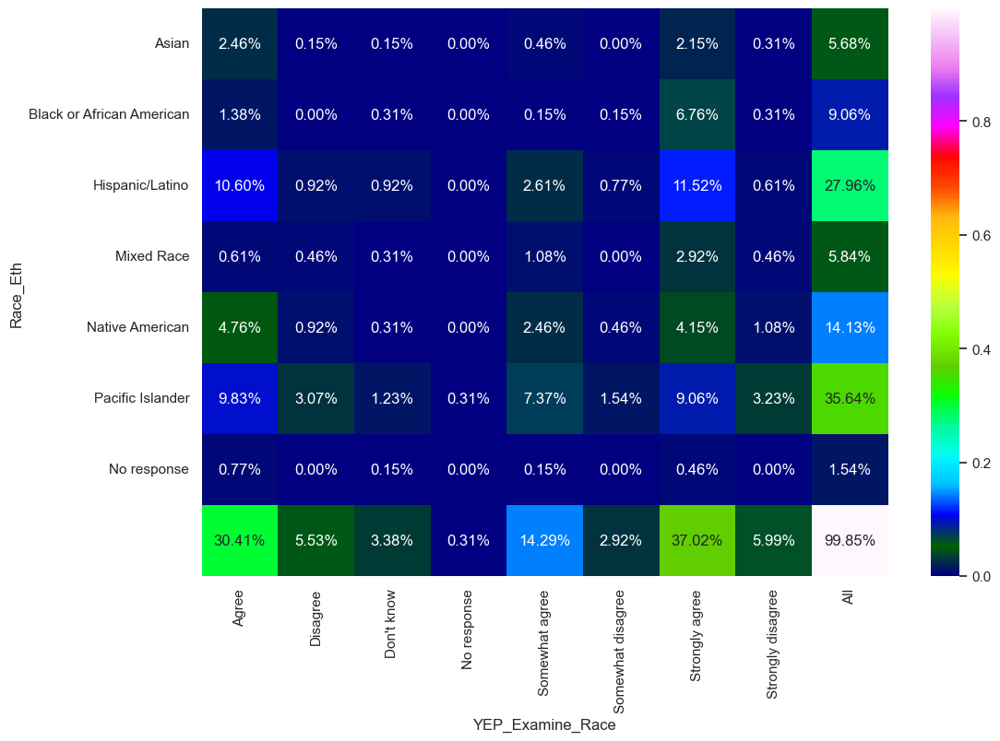

In [221]:
# Contigency table heat maps
plt.figure(figsize=(12,8))
#x_axis_labels = ["Strongly agree", "Agree","Somewhat agree", "Somewhat disagree", "Disagree",
#                 "Strongly disagree", "Don't know", "No response"] # labels for x-axis
y_axis_labels = ['Asian', 'Black or African American', 'Hispanic/Latino', 'Mixed Race', 'Native American',
                  'Pacific Islander', 'No response'] # labels for y-axis
sns.heatmap(contigency0/651, yticklabels=y_axis_labels, annot=True, 
            cmap="gist_ncar", fmt='.2%')

In [222]:
# Contigency Table: Race (Without white) vs YEP_Understanding 
# (I have a basic understanding of concepts related to racial equity.)
contigency8= pd.crosstab(cat_GARE_df0['Race_Eth'], cat_GARE_df0['YEP_Understanding'], margins = True)
#contigency0

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5]),
 [Text(0.5, 0, 'Agree'),
  Text(1.5, 0, 'Disagree'),
  Text(2.5, 0, "Don't know"),
  Text(3.5, 0, 'No response'),
  Text(4.5, 0, 'Somewhat agree'),
  Text(5.5, 0, 'Somewhat disagree'),
  Text(6.5, 0, 'Strongly agree'),
  Text(7.5, 0, 'Strongly disagree'),
  Text(8.5, 0, 'All')])

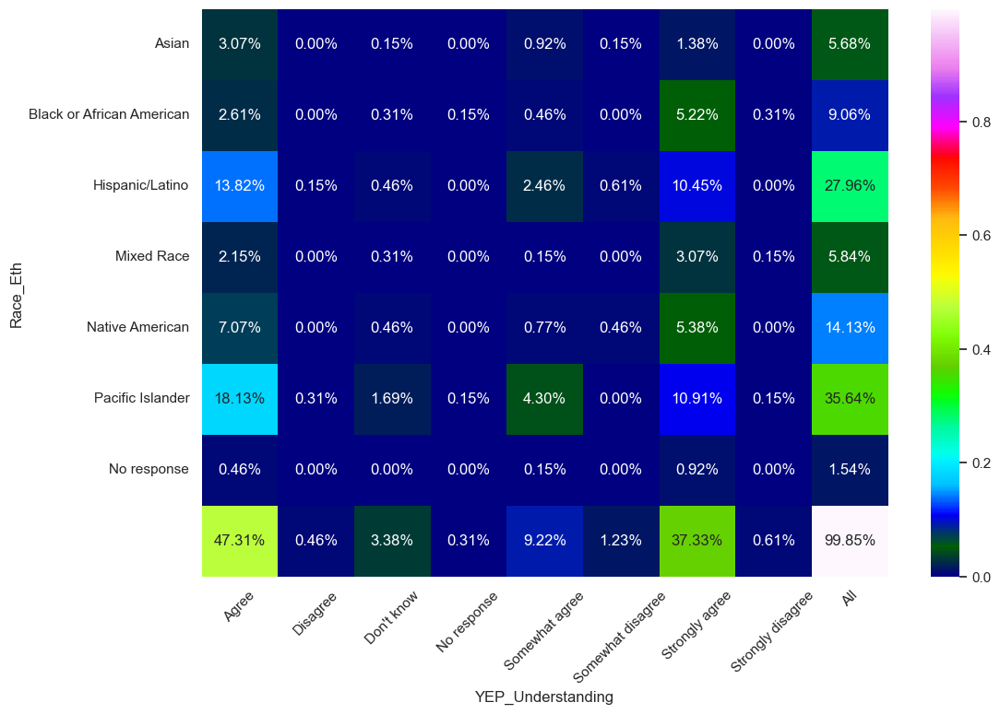

In [223]:
# Contigency table heatmaps: Race (Without white) vs YEP_Understanding 
plt.figure(figsize=(12,8))
#x_axis_labels = ["Strongly agree", "Agree","Somewhat agree", "Somewhat disagree", "Disagree",
#                 "Strongly disagree", "Don't know", "No response"] # labels for x-axis
y_axis_labels = ['Asian', 'Black or African American', 'Hispanic/Latino', 'Mixed Race', 'Native American',
                  'Pacific Islander', 'No response'] # labels for y-axis
sns.heatmap(contigency8/651, yticklabels=y_axis_labels, annot=True, 
            cmap="gist_ncar", fmt='.2%')
plt.xticks(rotation=45)

In [224]:
# Contigency Table: Race vs AY_Manage_Supervise (Do you manage or supervise people?)
contigency1= pd.crosstab(cat_GARE_df2['Race_Eth'], cat_GARE_df2['AY_Manage_Supervise'])
contigency1

AY_Manage_Supervise,No,No response,Yes
Race_Eth,,,
Asian,27,0,10
Black or African American,47,0,12
Hispanic/Latino,133,0,49
Mixed Race,27,0,11
Native American,61,2,29
No response,34,174,24
Pacific Islander,8,0,2
White,795,8,398


In [225]:
contigency_pct1 = pd.crosstab(cat_GARE_df2['Race_Eth'], cat_GARE_df2['AY_Manage_Supervise'], normalize=True, 
            margins=True, margins_name='Total').style.format('{:.2%}')

contigency_pct1

AY_Manage_Supervise,No,No response,Yes,Total
Race_Eth,,,,
Asian,1.46%,0.00%,0.54%,2.00%
Black or African American,2.54%,0.00%,0.65%,3.19%
Hispanic/Latino,7.19%,0.00%,2.65%,9.83%
Mixed Race,1.46%,0.00%,0.59%,2.05%
Native American,3.30%,0.11%,1.57%,4.97%
No response,1.84%,9.40%,1.30%,12.53%
Pacific Islander,0.43%,0.00%,0.11%,0.54%
White,42.95%,0.43%,21.50%,64.88%
Total,61.16%,9.94%,28.90%,100.00%


<AxesSubplot:xlabel='AY_Manage_Supervise', ylabel='Race_Eth'>

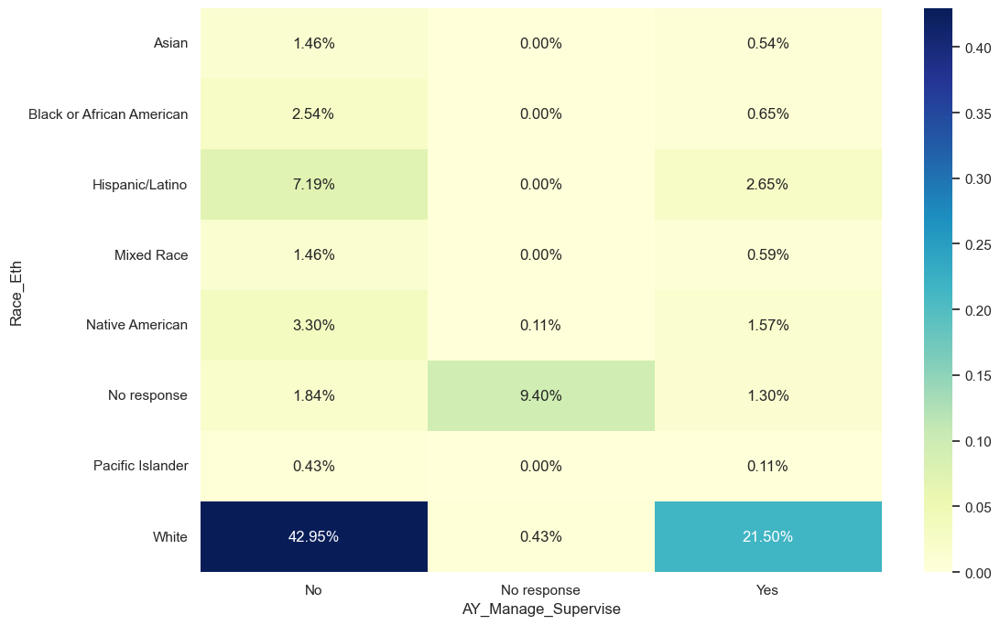

In [226]:
# Contigency table heat maps
plt.figure(figsize=(12,8))
sns.heatmap(contigency1/1851, annot=True, cmap="YlGnBu", fmt='.2%')

In [227]:
# Contigency Table: Age vs AY_Manage_Supervise (Do you manage or supervise people?)
contigency4= pd.crosstab(cat_GARE_df2['AY_Age'], cat_GARE_df2['AY_Manage_Supervise'])
contigency4

AY_Manage_Supervise,No,No response,Yes
AY_Age,,,
18-24,35,0,1
25-34,170,2,38
35-44,283,1,136
45-54,323,3,184
55-64,252,2,138
65+,55,0,24
No response,14,176,14


In [228]:
contigency_pct4 = pd.crosstab(cat_GARE_df2['AY_Age'], cat_GARE_df2['AY_Manage_Supervise'], normalize=True, 
            margins=True, margins_name='Total').style.format('{:.2%}')

contigency_pct4

AY_Manage_Supervise,No,No response,Yes,Total
AY_Age,,,,
18-24,1.89%,0.00%,0.05%,1.94%
25-34,9.18%,0.11%,2.05%,11.35%
35-44,15.29%,0.05%,7.35%,22.69%
45-54,17.45%,0.16%,9.94%,27.55%
55-64,13.61%,0.11%,7.46%,21.18%
65+,2.97%,0.00%,1.30%,4.27%
No response,0.76%,9.51%,0.76%,11.02%
Total,61.16%,9.94%,28.90%,100.00%


<AxesSubplot:xlabel='AY_Manage_Supervise', ylabel='AY_Age'>

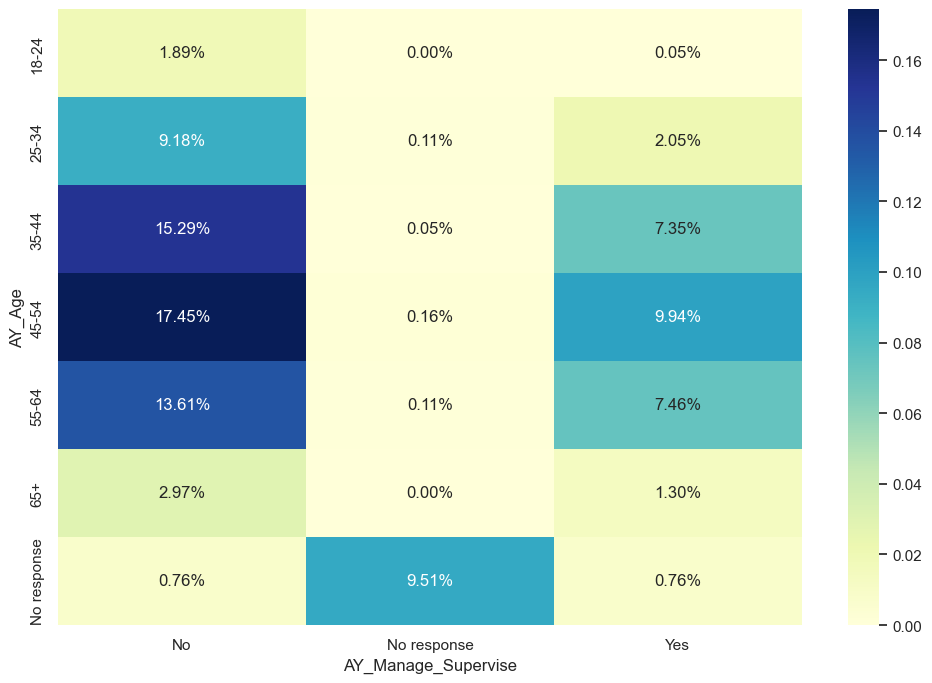

In [229]:
# Contigency table heat maps
plt.figure(figsize=(12,8))
sns.heatmap(contigency4/1851, annot=True, cmap="YlGnBu", fmt='.2%')

In [230]:
# Model Building
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()

In [231]:
cols = ['AY_Age', 'AY_Gender', 'AY_Manage_Supervise', 'AY_Work_Location',
       'Race_Eth', 'AY_City_Tenure', 'YEP_Examine_Race', 'YEP_Understanding', 'AY_Disability',
       'YEP_Identify_IR', 'YEP_Address_IR', 'D_Comfort_Talking',
       'D_Actively_Involved', 'D_Dept_Committed', 'D_Leadership_Supports',
       'J_Belonging']

# Encode labels of multiple columns at once
cat_GARE_df2[cols] = cat_GARE_df2[cols].apply(LabelEncoder().fit_transform)
#
# Print head
#
cat_GARE_df2.head(n=3)
# # Encode labels in column 'YEP_Examine_Race'.
# cat_GARE_df2['YEP_Examine_Race']= label_encoder.fit_transform(cat_GARE_df2['YEP_Examine_Race'])
  
# cat_GARE_df2[cols].unique()

,AY_Age,AY_Gender,AY_Manage_Supervise,AY_Work_Location,Race_Eth,AY_City_Tenure,YEP_Examine_Race,YEP_Understanding,AY_Disability,YEP_Identify_IR,...,J_Explicit_Committment,D_More_Active_If_1,D_More_Active_If_2,D_More_Active_If_3,D_More_Active_If_4,D_More_Active_If_5,D_More_Active_If_6,D_More_Active_If_7,D_Dem_Reflective,D_Concrete_WF
0,6,2,1,0,5,5,4,0,1,4,...,Agree,No,No,No,No,No,No,Yes,Agree,Agree
1,2,1,0,1,2,0,6,6,0,6,...,Somewhat agree,Yes,Yes,Yes,Yes,No,Yes,No,Somewhat agree,Don't know
2,4,1,0,0,7,1,4,0,0,0,...,Strongly agree,No,No,No,No,No,No,Yes,Agree,Don't know


In [241]:
# define the multinomial logistic regression model
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')

In [242]:
#Create training and test datasets
#CLASS was recoded into SIZE_CLASS to change from string to integer
#CLASS needs to be dropped
X = cat_GARE_df2.drop(['YEP_Understanding', 'YEP_Examine_Race',
        'YEP_Identify_IR', 'YEP_Address_IR', 'D_Comfort_Talking', 'D_Actively_Involved',
        'D_Dept_Committed', 'D_Leadership_Supports', 'J_Belonging'], axis=1) 
y = cat_GARE_df2['J_Belonging']
print(list(X.columns.values)) 

X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, y, test_size = 0.20, random_state = 5)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

['AY_Age', 'AY_Gender', 'AY_Manage_Supervise', 'AY_Work_Location', 'Race_Eth', 'AY_City_Tenure', 'AY_Disability', 'D_Leadership_Communicates', 'D_Progress', 'J_Explicit_Committment', 'D_More_Active_If_1', 'D_More_Active_If_2', 'D_More_Active_If_3', 'D_More_Active_If_4', 'D_More_Active_If_5', 'D_More_Active_If_6', 'D_More_Active_If_7', 'D_Dem_Reflective', 'D_Concrete_WF']
(1480, 19)
(371, 19)
(1480,)
(371,)


In [243]:
model1 = LogisticRegression(random_state=10, multi_class='multinomial', penalty='none', solver='newton-cg').fit(X_train, y_train)
preds = model1.predict(X_test)
# solver='newton-cg'

ValueError: could not convert string to float: 'Strongly agree'

In [239]:
#print the tunable parameters (They were not tuned in this example, everything kept as default)
params = model1.get_params()
print(params)

NameError: name 'model1' is not defined

In [240]:
#Print model parameters
print('intercept ', model1.intercept_[0])
print('classes', model1.classes_)
pd.DataFrame({'coeff': model1.coef_[7]}, 
             index=X.columns)
# print('Intercept: \n', model1.intercept_)
# print('Coefficients: \n', model1.coef_)

NameError: name 'model1' is not defined

In [260]:
print('Intercept: \n', model1.intercept_)
print('Coefficients: \n', model1.coef_)

Intercept: 
 [ 1.0147679  -0.28632872  1.19851724 -4.92223957  1.21638077  0.88891684
  0.34618754  0.54379799]
Coefficients: 
 [[-0.00700711 -0.20821478  0.10170001  0.31073782  0.07999335 -0.02764705
  -0.25689481]
 [-0.07870866  0.14164512 -0.03011136  0.18841309 -0.0160072  -0.02120024
   0.22052037]
 [-0.26767768  0.26062665 -0.40873101 -0.57468425  0.06159763 -0.09468461
  -0.37685037]
 [ 0.72959132 -0.01723072  0.28277471 -0.41011102 -0.17737685  0.59155055
   0.56626566]
 [-0.07090323 -0.22127329  0.01095152  0.09681349  0.07647832 -0.06139278
  -0.06144449]
 [ 0.01075911 -0.05429576 -0.06137956 -0.04174296 -0.04604497 -0.22613951
   0.09511914]
 [-0.06964648 -0.22425405  0.23568075  0.32728624  0.07547711 -0.04449786
  -0.20273609]
 [-0.24640728  0.32299682 -0.13088506  0.10328758 -0.05411738 -0.1159885
   0.01602059]]


In [261]:
#Calculate odds ratio estimates
import numpy as np
np.exp(model1.coef_)

array([[0.99301738, 0.81203261, 1.10705132, 1.36443145, 1.08327986,
        0.97273163, 0.77344957],
       [0.92430918, 1.1521677 , 0.97033747, 1.20733215, 0.98412023,
        0.97902291, 1.24672533],
       [0.76515437, 1.29774307, 0.66449295, 0.56288257, 1.06353432,
        0.90965979, 0.68601872],
       [2.07423274, 0.98291688, 1.32680621, 0.66357658, 0.83746413,
        1.80678776, 1.76167606],
       [0.93155204, 0.80149761, 1.01101171, 1.10165488, 1.07947879,
        0.94045377, 0.94040515],
       [1.0108172 , 0.94715194, 0.94046621, 0.95911628, 0.95499901,
        0.79760682, 1.09978988],
       [0.9327235 , 0.79911209, 1.26577015, 1.3871985 , 1.07839854,
        0.95647764, 0.81649369],
       [0.78160383, 1.38126096, 0.87731861, 1.10881024, 0.9473209 ,
        0.89048547, 1.01614961]])

In [263]:
#Use statsmodels to assess variables
print(blue("========== Regression Table Results ============", ['bold']))
print()
print(red("Model:(YEP_Examine_Race=AY_Age + AY_Gender + AY_Manage_Supervise + AY_Work_Location + Race_Eth + AY_Disability)" ,['bold']))
print()
logit_model=sm.MNLogit(y_train,sm.add_constant(X_train))
logit_model
result=logit_model.fit()
stats1=result.summary()
stats2=result.summary2()
print(stats1)
print(stats2)

========== Regression Table Results ============

Model:(YEP_Examine_Race=AY_Age + AY_Gender + AY_Manage_Supervise + AY_Work_Location + Race_Eth + AY_Disability)

Optimization terminated successfully.
         Current function value: 1.590881
         Iterations 9
                          MNLogit Regression Results                          
Dep. Variable:            J_Belonging   No. Observations:                 1480
Model:                        MNLogit   Df Residuals:                     1424
Method:                           MLE   Df Model:                           49
Date:                Thu, 02 Feb 2023   Pseudo R-squ.:                  0.1113
Time:                        11:05:51   Log-Likelihood:                -2354.5
converged:                       True   LL-Null:                       -2649.3
Covariance Type:            nonrobust   LLR p-value:                 8.631e-94
      J_Belonging=1       coef    std err          z      P>|z|      [0.025      0.975]
---------------

In [264]:
#Accuracy statistics
print(blue("========== Model Accuracy statistics ============", ['bold']))
print()
print('Accuracy Score:', metrics.accuracy_score(y_test, preds))  

#Create classification report
class_report=classification_report(y_test, preds)
print(class_report)


========== Model Accuracy statistics ============

Accuracy Score: 0.40700808625336926
              precision    recall  f1-score   support

           0       0.39      0.95      0.55       129
           1       0.00      0.00      0.00        14
           2       0.00      0.00      0.00        12
           3       0.64      0.94      0.76        31
           4       0.00      0.00      0.00        78
           5       0.00      0.00      0.00        20
           6       0.00      0.00      0.00        68
           7       0.00      0.00      0.00        19

    accuracy                           0.41       371
   macro avg       0.13      0.24      0.16       371
weighted avg       0.19      0.41      0.26       371



In [265]:
#y_test as first argument and the preds as second argument 
confusion_matrix(y_test, preds)

array([[122,   0,   0,   5,   2,   0,   0,   0],
       [  9,   0,   0,   4,   0,   0,   0,   1],
       [ 10,   0,   0,   1,   0,   0,   0,   1],
       [  2,   0,   0,  29,   0,   0,   0,   0],
       [ 76,   0,   0,   2,   0,   0,   0,   0],
       [ 16,   0,   0,   1,   3,   0,   0,   0],
       [ 63,   0,   0,   2,   3,   0,   0,   0],
       [ 15,   0,   0,   1,   3,   0,   0,   0]], dtype=int64)

In [267]:
#transform confusion matrix into array
#the matrix is stored in a vaiable called confmtrx
confmtrx = np.array(confusion_matrix(y_test, preds))
#Create DataFrame from confmtrx array 
#rows for test: Male, Female, Infant designation as index 
#columns for preds: male, predicted_female, predicted_infant as column

pd.DataFrame(confmtrx, index=["Strongly disagree",
     "Disagree",
     "Somewhat disagree",
     "Somewhat agree",
     "Don't know",                        
     "Agree",
     "Strongly agree",
     "No response"],
columns=["predicted Strongly disagree",
     "predicted Disagree",
     "predicted Somewhat disagree",
     "predicted Don't know" ,  
     "predicted Somewhat agree",
     "predicted Agree",
     "predicted Strongly agree",
     "predicted No response"])

,predicted Strongly disagree,predicted Disagree,predicted Somewhat disagree,predicted Don't know,predicted Somewhat agree,predicted Agree,predicted Strongly agree,predicted No response
Strongly disagree,122,0,0,5,2,0,0,0
Disagree,9,0,0,4,0,0,0,1
Somewhat disagree,10,0,0,1,0,0,0,1
Somewhat agree,2,0,0,29,0,0,0,0
Don't know,76,0,0,2,0,0,0,0
Agree,16,0,0,1,3,0,0,0
Strongly agree,63,0,0,2,3,0,0,0
No response,15,0,0,1,3,0,0,0


In [268]:
#Accuracy statistics

print('Accuracy Score:', metrics.accuracy_score(y_test, preds))  

#Create classification report
class_report=classification_report(y_test, preds)
print(class_report)

Accuracy Score: 0.40700808625336926
              precision    recall  f1-score   support

           0       0.39      0.95      0.55       129
           1       0.00      0.00      0.00        14
           2       0.00      0.00      0.00        12
           3       0.64      0.94      0.76        31
           4       0.00      0.00      0.00        78
           5       0.00      0.00      0.00        20
           6       0.00      0.00      0.00        68
           7       0.00      0.00      0.00        19

    accuracy                           0.41       371
   macro avg       0.13      0.24      0.16       371
weighted avg       0.19      0.41      0.26       371



In [269]:
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support
print(blue("========== Precision & Specificity ============", ['bold']))
print()
pred = model1.predict(X)
conf_mat = confusion_matrix(y, model1.predict(X))
print('Precision', conf_mat[0, 0] / sum(conf_mat[:, 0]))
print('Recall', conf_mat[0, 0] / sum(conf_mat[0, :]))
print('Specificity', conf_mat[1, 1] / sum(conf_mat[1, :]))
precision_recall_fscore_support(list(y.values), list(model1.predict(X)))

========== Precision & Specificity ============

Precision 0.3845671267252196
Recall 0.9474497681607419
Specificity 0.0


(array([0.38456713, 0.        , 0.33333333, 0.64204545, 0.17948718,
        0.        , 0.        , 0.31818182]),
 array([0.94744977, 0.        , 0.07407407, 0.9338843 , 0.01790281,
        0.        , 0.        , 0.07446809]),
 array([0.5470772 , 0.        , 0.12121212, 0.76094276, 0.03255814,
        0.        , 0.        , 0.12068966]),
 array([647,  91,  81, 121, 391, 120, 306,  94], dtype=int64))